<a href="https://colab.research.google.com/github/moja7/BENV0092_Final-Paper_Saudi_DC/blob/main/Saudi_DC_v_5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Add this function — call save_to_drive() after EVERY cell from now on
import shutil

DRIVE_BACKUP = '/content/drive/MyDrive/Saudi DC data/phase_backup'
os.makedirs(DRIVE_BACKUP, exist_ok=True)

def save_to_drive():
    """Copy all local data folders to Drive — run after every cell"""
    folders = [
        ('data/boundaries',   'boundaries'),
        ('data/climate',      'climate'),
        ('data/osm',          'osm'),
        ('data/connectivity', 'connectivity'),
        ('data/renewable',    'renewable'),
        ('data/water',        'water'),
        ('data/security',     'security'),
        ('data/economic',     'economic'),
        ('data/processed',    'processed'),
        ('data/raw',          'raw'),
    ]
    saved = 0
    for local, name in folders:
        if os.path.exists(local):
            dst = f'{DRIVE_BACKUP}/{name}'
            if os.path.exists(dst):
                shutil.rmtree(dst)
            shutil.copytree(local, dst)
            saved += 1
    print(f"✓ Saved {saved} folders to Drive: {DRIVE_BACKUP}")

print("✓ save_to_drive() ready — call it after every cell")

✓ save_to_drive() ready — call it after every cell


In [ ]:
# Add this function — call save_to_drive() after EVERY cell from now on
import shutil

DRIVE_BACKUP = '/content/drive/MyDrive/Saudi DC data/phase_backup'
os.makedirs(DRIVE_BACKUP, exist_ok=True)

def save_to_drive():
    """Copy all local data folders to Drive — run after every cell"""
    folders = [
        ('data/boundaries',   'boundaries'),
        ('data/climate',      'climate'),
        ('data/osm',          'osm'),
        ('data/connectivity', 'connectivity'),
        ('data/renewable',    'renewable'),
        ('data/water',        'water'),
        ('data/security',     'security'),
        ('data/economic',     'economic'),
        ('data/processed',    'processed'),
        ('data/raw',          'raw'),
    ]
    saved = 0
    for local, name in folders:
        if os.path.exists(local):
            dst = f'{DRIVE_BACKUP}/{name}'
            if os.path.exists(dst):
                shutil.rmtree(dst)
            shutil.copytree(local, dst)
            saved += 1
    print(f"✓ Saved {saved} folders to Drive: {DRIVE_BACKUP}")

print("✓ save_to_drive() ready — call it after every cell")

✓ save_to_drive() ready — call it after every cell


In [ ]:
# ============================================================================
# ONE-TIME BACKUP: Save everything to Google Drive permanently
# Run this NOW — only needs to run once
# After this, the restore cell below loads everything in ~30 seconds
# ============================================================================

from google.colab import drive
import shutil, os

drive.mount('/content/drive')

DRIVE_BASE = '/content/drive/MyDrive/Saudi DC data/phase_backup'
os.makedirs(DRIVE_BASE, exist_ok=True)

# Everything to back up
backup_map = {
    # Phase 1 outputs
    'data/boundaries':          f'{DRIVE_BASE}/boundaries',
    'data/climate':             f'{DRIVE_BASE}/climate',
    'data/osm':                 f'{DRIVE_BASE}/osm',
    'data/connectivity':        f'{DRIVE_BASE}/connectivity',
    'data/renewable':           f'{DRIVE_BASE}/renewable',
    'data/water':               f'{DRIVE_BASE}/water',
    'data/security':            f'{DRIVE_BASE}/security',
    'data/economic':            f'{DRIVE_BASE}/economic',
    # Phase 2 outputs
    'data/processed':           f'{DRIVE_BASE}/processed',
    'outputs/phase2':           f'{DRIVE_BASE}/outputs_phase2',
}

print("Backing up to Google Drive...")
print(f"Destination: {DRIVE_BASE}\n")

for local_dir, drive_dir in backup_map.items():
    if os.path.exists(local_dir):
        if os.path.exists(drive_dir):
            shutil.rmtree(drive_dir)
        shutil.copytree(local_dir, drive_dir)
        n_files = sum(len(f) for _, _, f in os.walk(drive_dir))
        size_mb = sum(
            os.path.getsize(os.path.join(r, f))
            for r, _, files in os.walk(drive_dir)
            for f in files
        ) / 1e6
        print(f"  ✓ {local_dir:<35} → {n_files} files, {size_mb:.1f} MB")
    else:
        print(f"  ⚠ Skipped (not found): {local_dir}")

print("\n✓ BACKUP COMPLETE")
print(f"  Everything saved to: {DRIVE_BASE}")
print("  Next session: run the RESTORE cell below — takes ~30 seconds")
print("  You will NEVER need to re-download NASA POWER data again")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Backing up to Google Drive...
Destination: /content/drive/MyDrive/Saudi DC data/phase_backup

  ⚠ Skipped (not found): data/boundaries
  ⚠ Skipped (not found): data/climate
  ⚠ Skipped (not found): data/osm
  ⚠ Skipped (not found): data/connectivity
  ⚠ Skipped (not found): data/renewable
  ⚠ Skipped (not found): data/water
  ⚠ Skipped (not found): data/security
  ⚠ Skipped (not found): data/economic
  ✓ data/processed                      → 0 files, 0.0 MB
  ✓ outputs/phase2                      → 0 files, 0.0 MB

✓ BACKUP COMPLETE
  Everything saved to: /content/drive/MyDrive/Saudi DC data/phase_backup
  Next session: run the RESTORE cell below — takes ~30 seconds
  You will NEVER need to re-download NASA POWER data again


In [ ]:
# STEP 1: Mount Google Drive (easiest approach)
from google.colab import drive
drive.mount('/content/drive')

# Then in Google Drive, create a folder called 'whymap' and upload
# the entire shp folder contents into it (all the .shp, .dbf, .prj etc files)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#!/usr/bin/env python
# coding: utf-8

# ============================================================================
# DATA CENTER SITE SELECTION - SAUDI ARABIA
# PHASE 1: DATA COLLECTION
# Google Colab Version
# ============================================================================

# ============================================================================
# CELL 1: Install packages not available by default in Colab
# ============================================================================

# Run this cell first - restart runtime after if prompted
import subprocess
import sys

packages_to_install = ['overpy', 'pyrosm', 'contextily', 'rasterstats']

for pkg in packages_to_install:
    print(f"Installing {pkg}...")
    subprocess.check_call([sys.executable, '-m', 'pip', 'install', pkg, '-q'])

print("\n✓ All packages installed")
print("If prompted to restart runtime, do so then skip this cell and continue from Cell 2")


# ============================================================================
# CELL 2: Import libraries and set up folder structure
# ============================================================================

import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import requests
import os
import json
import time
import warnings
warnings.filterwarnings('ignore')

# Set up directory structure (same pattern as solar project)
os.makedirs('data/raw', exist_ok=True)
os.makedirs('data/processed', exist_ok=True)
os.makedirs('data/boundaries', exist_ok=True)
os.makedirs('data/climate', exist_ok=True)
os.makedirs('data/osm', exist_ok=True)
os.makedirs('data/connectivity', exist_ok=True)
os.makedirs('data/renewable', exist_ok=True)
os.makedirs('data/water', exist_ok=True)
os.makedirs('data/security', exist_ok=True)
os.makedirs('data/economic', exist_ok=True)
os.makedirs('outputs', exist_ok=True)

print("✓ Environment setup complete")
print(f"  GeoPandas: {gpd.__version__}")
print(f"  Pandas:    {pd.__version__}")
print(f"\n✓ Folder structure created:")
for folder in ['data/raw', 'data/boundaries', 'data/climate',
               'data/osm', 'data/connectivity', 'data/renewable',
               'data/water', 'data/security', 'data/economic', 'outputs']:
    print(f"  {folder}/")


Installing overpy...
Installing pyrosm...
Installing contextily...
Installing rasterstats...

✓ All packages installed
If prompted to restart runtime, do so then skip this cell and continue from Cell 2
✓ Environment setup complete
  GeoPandas: 1.1.3
  Pandas:    2.2.2

✓ Folder structure created:
  data/raw/
  data/boundaries/
  data/climate/
  data/osm/
  data/connectivity/
  data/renewable/
  data/water/
  data/security/
  data/economic/
  outputs/


This may take 1-2 minutes...
  Progress: 100.0%
✓ Download complete: data/boundaries/gadm41_SAU.gpkg

Available layers: ['ADM_ADM_0', 'ADM_ADM_1', 'ADM_ADM_2']

✓ Country boundary loaded:  (1, 3)
✓ Provinces (13) loaded:    (13, 12)

Province names:
  - 'Asir
  - Al Bahah
  - Al Hudud ash Shamaliyah
  - Al Jawf
  - Al Madinah
  - Al Qassim
  - Ar Riyad
  - Ash-Sharqīyah
  - Jizan
  - Makkah
  - Najran
  - Tabuk
  - Ḥaʼil


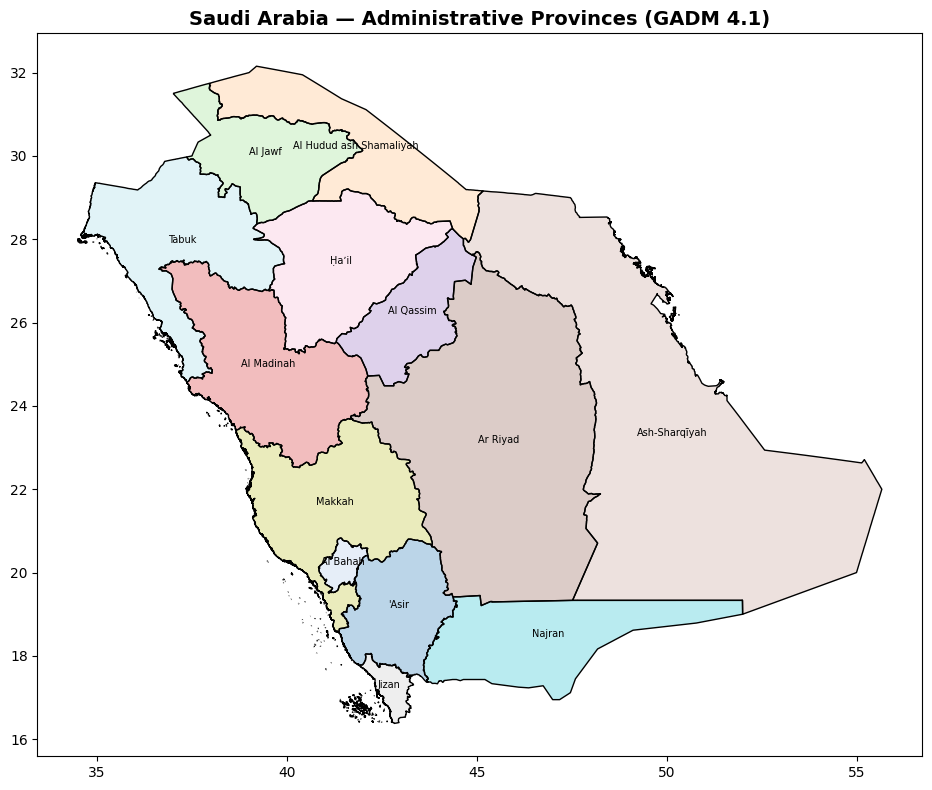


✓ Boundaries saved to data/boundaries/


In [ ]:
# ============================================================================
# CELL 3: DATASET 1 — GADM Administrative Boundaries
# Same approach as solar project — identical URL pattern
# Downloads Saudi Arabia Level 0 (national) and Level 1 (13 provinces)
# Citation: University of California, Davis (2022) GADM v4.1
# ============================================================================

import fiona

def download_gadm_data(country_code='SAU'):
    """
    Download GADM GeoPackage for Saudi Arabia
    Contains all levels (0=country, 1=provinces, 2=districts)
    """
    url = f"https://geodata.ucdavis.edu/gadm/gadm4.1/gpkg/gadm41_{country_code}.gpkg"
    output_file = f"data/boundaries/gadm41_{country_code}.gpkg"

    if not os.path.exists(output_file):
        print(f"Downloading GADM data for {country_code}...")
        print("This may take 1-2 minutes...")
        response = requests.get(url, stream=True)

        if response.status_code == 200:
            total = int(response.headers.get('content-length', 0))
            downloaded = 0
            with open(output_file, 'wb') as f:
                for chunk in response.iter_content(chunk_size=8192):
                    f.write(chunk)
                    downloaded += len(chunk)
                    if total > 0:
                        pct = downloaded / total * 100
                        print(f"\r  Progress: {pct:.1f}%", end='')
            print(f"\n✓ Download complete: {output_file}")
        else:
            print(f"✗ Error: Status code {response.status_code}")
            return None
    else:
        print(f"✓ File already exists: {output_file}")

    return output_file

# Download
gadm_file = download_gadm_data('SAU')

# Load boundaries
layers = fiona.listlayers(gadm_file)
print(f"\nAvailable layers: {layers}")

saudi_country   = gpd.read_file(gadm_file, layer='ADM_ADM_0')
saudi_provinces = gpd.read_file(gadm_file, layer='ADM_ADM_1')

print(f"\n✓ Country boundary loaded:  {saudi_country.shape}")
print(f"✓ Provinces (13) loaded:    {saudi_provinces.shape}")
print(f"\nProvince names:")
for name in sorted(saudi_provinces['NAME_1'].tolist()):
    print(f"  - {name}")

# Quick visualisation to verify
fig, ax = plt.subplots(figsize=(12, 8))
saudi_provinces.boundary.plot(ax=ax, linewidth=1, edgecolor='black')
saudi_provinces.plot(ax=ax, alpha=0.3, cmap='tab20')

for idx, row in saudi_provinces.iterrows():
    centroid = row.geometry.centroid
    ax.annotate(row['NAME_1'], xy=(centroid.x, centroid.y),
                ha='center', fontsize=7)

ax.set_title('Saudi Arabia — Administrative Provinces (GADM 4.1)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('outputs/00_saudi_provinces.png', dpi=150, bbox_inches='tight')
plt.show()

# Save processed versions
saudi_country.to_file('data/boundaries/saudi_country.geojson', driver='GeoJSON')
saudi_provinces.to_file('data/boundaries/saudi_provinces.geojson', driver='GeoJSON')
print("\n✓ Boundaries saved to data/boundaries/")


In [ ]:
# ============================================================================
# CELL 4: DATASET 2 — NASA POWER Climate Data (Batch API)
# Parameters needed for data center paper:
#   ALLSKY_SFC_SW_DWN  = Annual GHI (renewable energy criterion)
#   WS50M              = Wind speed at 50m (renewable energy)
#   T2M                = Mean air temperature at 2m (cooling criterion)
#   RH2M               = Relative humidity at 2m (cooling criterion)
#   T2M_MAX            = Max daily temperature (cooling criterion)
#
# Strategy: Query API on a 0.1° grid covering Saudi Arabia
# Saudi Arabia bounding box: Lat 16-32°N, Lon 36-56°E
# At 0.1° spacing: 160 x 200 = 32,000 points — too many for single session
# PRACTICAL APPROACH: Use 0.5° grid (64 x 40 = 2,560 points) then interpolate
# This matches NASA POWER native resolution and is consistent with solar project
# Citation: NASA (2024) POWER Project Data Access Viewer
# ============================================================================

def fetch_nasa_power_point(lat, lon, parameters, community='RE'):
    """
    Fetch climatological average from NASA POWER API for a single point
    Returns dict of parameter values or None on failure
    """
    base_url = "https://power.larc.nasa.gov/api/temporal/climatology/point"
    params_str = ','.join(parameters)

    url = (f"{base_url}"
           f"?parameters={params_str}"
           f"&community={community}"
           f"&longitude={lon}"
           f"&latitude={lat}"
           f"&format=JSON")

    try:
        response = requests.get(url, timeout=30)
        if response.status_code == 200:
            data = response.json()
            properties = data.get('properties', {}).get('parameter', {})
            # Extract annual averages (key 'ANN' in climatology endpoint)
            result = {'latitude': lat, 'longitude': lon}
            for param in parameters:
                if param in properties:
                    result[param] = properties[param].get('ANN', None)
                else:
                    result[param] = None
            return result
        else:
            return None
    except Exception as e:
        return None


def download_nasa_power_grid(output_file='data/climate/nasa_power_saudi.csv',
                              lat_min=16, lat_max=32,
                              lon_min=36, lon_max=56,
                              step=0.5):
    """
    Download NASA POWER data on a regular grid over Saudi Arabia
    Default step=0.5° matches NASA POWER native resolution
    """
    parameters = ['ALLSKY_SFC_SW_DWN', 'WS50M', 'T2M', 'RH2M', 'T2M_MAX']

    if os.path.exists(output_file):
        print(f"✓ NASA POWER data already downloaded: {output_file}")
        df = pd.read_csv(output_file)
        print(f"  Loaded {len(df)} grid points")
        return df

    # Build grid of lat/lon points
    lats = np.arange(lat_min, lat_max + step, step)
    lons = np.arange(lon_min, lon_max + step, step)
    total_points = len(lats) * len(lons)

    print(f"Downloading NASA POWER climatological data")
    print(f"Grid: {len(lats)} lat × {len(lons)} lon = {total_points} points")
    print(f"Parameters: {parameters}")
    print(f"This will take approximately {total_points * 1.2 / 60:.0f} minutes...")
    print("(API is rate-limited — pausing 1s between requests)")

    results = []
    count = 0

    for lat in lats:
        for lon in lons:
            lat_r = round(lat, 2)
            lon_r = round(lon, 2)

            result = fetch_nasa_power_point(lat_r, lon_r, parameters)

            if result is not None:
                results.append(result)

            count += 1
            if count % 50 == 0:
                print(f"  Progress: {count}/{total_points} ({count/total_points*100:.1f}%)")

            time.sleep(1.0)  # Respect API rate limits

    df = pd.DataFrame(results)
    df.to_csv(output_file, index=False)
    print(f"\n✓ NASA POWER data saved: {output_file}")
    print(f"  {len(df)} valid grid points downloaded")

    return df


# ---- OPTION A: Run full download (takes ~45 min for 0.5° grid) ----
# Comment out Option B below if you choose this

print("Starting NASA POWER download...")
print("NOTE: This takes ~45 minutes for the full 0.5° grid.")
print("      If you want to test first, reduce lat/lon range below.")

nasa_df = download_nasa_power_grid(
    output_file='data/climate/nasa_power_saudi.csv',
    lat_min=16, lat_max=32,
    lon_min=36, lon_max=56,
    step=0.5  # Change to 1.0 for a faster test run
)

print(f"\n✓ NASA POWER dataset summary:")
print(nasa_df[['T2M', 'RH2M', 'ALLSKY_SFC_SW_DWN', 'WS50M', 'T2M_MAX']].describe().round(2))



Starting NASA POWER download...
NOTE: This takes ~45 minutes for the full 0.5° grid.
      If you want to test first, reduce lat/lon range below.
Grid: 33 lat × 41 lon = 1353 points
Parameters: ['ALLSKY_SFC_SW_DWN', 'WS50M', 'T2M', 'RH2M', 'T2M_MAX']
This will take approximately 27 minutes...
(API is rate-limited — pausing 1s between requests)
  Progress: 50/1353 (3.7%)
  Progress: 100/1353 (7.4%)
  Progress: 150/1353 (11.1%)
  Progress: 200/1353 (14.8%)
  Progress: 250/1353 (18.5%)
  Progress: 300/1353 (22.2%)
  Progress: 350/1353 (25.9%)
  Progress: 400/1353 (29.6%)
  Progress: 450/1353 (33.3%)
  Progress: 500/1353 (37.0%)
  Progress: 550/1353 (40.7%)
  Progress: 600/1353 (44.3%)
  Progress: 650/1353 (48.0%)
  Progress: 700/1353 (51.7%)
  Progress: 750/1353 (55.4%)
  Progress: 800/1353 (59.1%)
  Progress: 850/1353 (62.8%)
  Progress: 900/1353 (66.5%)
  Progress: 950/1353 (70.2%)
  Progress: 1000/1353 (73.9%)
  Progress: 1050/1353 (77.6%)
  Progress: 1100/1353 (81.3%)
  Progress: 1150

Clipping NASA POWER points to Saudi Arabia boundary...
  Before clip: 1353 points
  After clip:  679 points inside Saudi Arabia

✓ Wet-bulb temperature derived (Stull 2011)

Key climate statistics for Saudi Arabia:
  Mean dry-bulb temp (T2M):       25.7°C
  Mean wet-bulb temp (T_WETBULB): 14.7°C
  Mean rel. humidity (RH2M):      28.2%
  Mean GHI (kWh/m²/day):         6.24
  Mean wind speed at 50m (m/s):  5.70


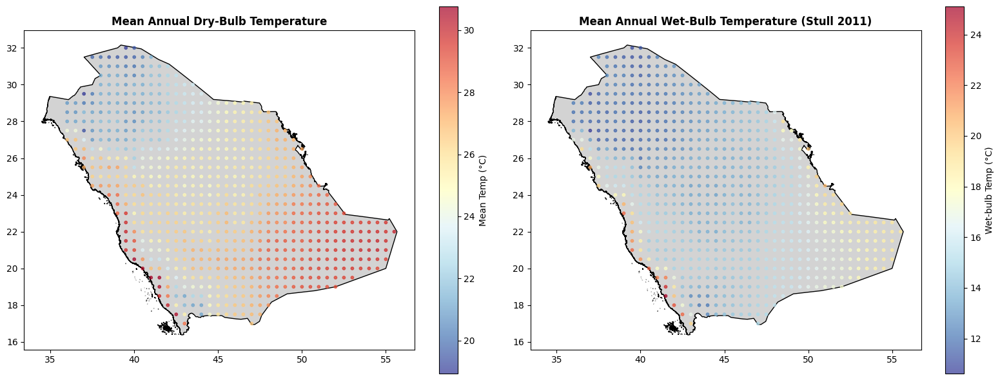


✓ Processed climate data saved


In [ ]:
# ============================================================================
# CELL 5: Convert NASA POWER data to GeoDataFrame and clip to Saudi Arabia
# Derive wet-bulb temperature using Stull (2011) approximation
# ============================================================================

from shapely.geometry import Point

# Load saved NASA data
nasa_df = pd.read_csv('data/climate/nasa_power_saudi.csv')
saudi_boundary = gpd.read_file('data/boundaries/saudi_country.geojson')

# Convert to GeoDataFrame
geometry = [Point(xy) for xy in zip(nasa_df['longitude'], nasa_df['latitude'])]
nasa_gdf = gpd.GeoDataFrame(nasa_df, geometry=geometry, crs='EPSG:4326')

# Clip to Saudi Arabia boundary
print("Clipping NASA POWER points to Saudi Arabia boundary...")
nasa_saudi = gpd.clip(nasa_gdf, saudi_boundary)
print(f"  Before clip: {len(nasa_gdf)} points")
print(f"  After clip:  {len(nasa_saudi)} points inside Saudi Arabia")

# ---- Derive wet-bulb temperature (Stull 2011 approximation) ----
# Tw = T·arctan[0.151977·(RH+8.313659)^0.5] + arctan(T+RH) −
#      arctan(RH−1.676331) + 0.00391838·RH^1.5·arctan(0.023101·RH) − 4.686035
def stull_wetbulb(T, RH):
    """
    Stull (2011) empirical formula for wet-bulb temperature
    T  = dry-bulb temperature (°C)
    RH = relative humidity (%)
    Returns wet-bulb temperature (°C)
    """
    Tw = (T * np.arctan(0.151977 * (RH + 8.313659)**0.5)
          + np.arctan(T + RH)
          - np.arctan(RH - 1.676331)
          + 0.00391838 * RH**1.5 * np.arctan(0.023101 * RH)
          - 4.686035)
    return Tw

nasa_saudi['T_WETBULB'] = stull_wetbulb(nasa_saudi['T2M'], nasa_saudi['RH2M'])

print("\n✓ Wet-bulb temperature derived (Stull 2011)")
print(f"\nKey climate statistics for Saudi Arabia:")
print(f"  Mean dry-bulb temp (T2M):       {nasa_saudi['T2M'].mean():.1f}°C")
print(f"  Mean wet-bulb temp (T_WETBULB): {nasa_saudi['T_WETBULB'].mean():.1f}°C")
print(f"  Mean rel. humidity (RH2M):      {nasa_saudi['RH2M'].mean():.1f}%")
print(f"  Mean GHI (kWh/m²/day):         {nasa_saudi['ALLSKY_SFC_SW_DWN'].mean():.2f}")
print(f"  Mean wind speed at 50m (m/s):  {nasa_saudi['WS50M'].mean():.2f}")

# Visualise temperature
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Dry-bulb temperature
saudi_boundary.plot(ax=axes[0], color='lightgray', edgecolor='black', linewidth=1)
sc0 = axes[0].scatter(nasa_saudi['longitude'], nasa_saudi['latitude'],
                       c=nasa_saudi['T2M'], cmap='RdYlBu_r', s=10, alpha=0.7)
plt.colorbar(sc0, ax=axes[0], label='Mean Temp (°C)')
axes[0].set_title('Mean Annual Dry-Bulb Temperature', fontweight='bold')

# Wet-bulb temperature
saudi_boundary.plot(ax=axes[1], color='lightgray', edgecolor='black', linewidth=1)
sc1 = axes[1].scatter(nasa_saudi['longitude'], nasa_saudi['latitude'],
                       c=nasa_saudi['T_WETBULB'], cmap='RdYlBu_r', s=10, alpha=0.7)
plt.colorbar(sc1, ax=axes[1], label='Wet-bulb Temp (°C)')
axes[1].set_title('Mean Annual Wet-Bulb Temperature (Stull 2011)', fontweight='bold')

plt.tight_layout()
plt.savefig('outputs/01_climate_temperature.png', dpi=150, bbox_inches='tight')
plt.show()

# Save processed climate data
nasa_saudi.to_file('data/climate/nasa_power_processed.geojson', driver='GeoJSON')
nasa_saudi.drop(columns='geometry').to_csv('data/climate/nasa_power_processed.csv', index=False)
print("\n✓ Processed climate data saved")


In [ ]:
# ============================================================================
# CELL 6: DATASET 3 — OSM Power Grid, Substations, Fiber
# Same Overpass API approach as solar project (requests.post to overpass-api.de)
# Gets: transmission lines ≥110kV, substations, telecom/fiber lines
# Citation: OpenStreetMap Contributors (2024)
# ============================================================================

from shapely.geometry import LineString, Point as ShapelyPoint
import geopandas as gpd

def download_osm_saudi(query, description, output_file, timeout=300):
    """
    Generic Overpass API downloader — same pattern as solar project
    """
    overpass_url = "http://overpass-api.de/api/interpreter"

    if os.path.exists(output_file):
        print(f"✓ Already downloaded: {output_file}")
        return gpd.read_file(output_file)

    print(f"Downloading {description} from OpenStreetMap...")
    print("This may take 3-5 minutes...")

    try:
        response = requests.post(
            overpass_url,
            data={'data': query},
            timeout=timeout
        )

        if response.status_code == 200:
            data = response.json()
            elements = data.get('elements', [])
            print(f"✓ Retrieved {len(elements)} elements")
            return elements
        else:
            print(f"✗ HTTP Error {response.status_code}")
            return None

    except requests.exceptions.Timeout:
        print("✗ Request timeout — try again or reduce bounding box")
        return None
    except Exception as e:
        print(f"✗ Error: {e}")
        return None


# ---- 3A: Transmission Lines ≥110kV ----

transmission_query = """
[out:json][timeout:240];
(
  way["power"="line"]["voltage"~"^(110000|132000|220000|230000|380000|400000)$"](16.0,34.5,32.5,56.0);
  way["power"="line"]["voltage"~"^(110|132|220|230|380|400).*"](16.0,34.5,32.5,56.0);
  way["power"="line"](16.0,34.5,32.5,56.0);
);
out geom;
"""

transmission_raw = download_osm_saudi(
    query=transmission_query,
    description="Transmission Lines (≥110kV)",
    output_file='data/osm/saudi_transmission.geojson'
)

# Parse to GeoDataFrame (same logic as solar project)
if transmission_raw is not None and not isinstance(transmission_raw, gpd.GeoDataFrame):
    lines = []
    for element in transmission_raw:
        if element['type'] == 'way' and 'geometry' in element:
            coords = [(node['lon'], node['lat']) for node in element['geometry']]
            if len(coords) >= 2:
                tags = element.get('tags', {})
                voltage = tags.get('voltage', 'Unknown')

                # Parse voltage to numeric kV
                voltage_kv = None
                try:
                    if voltage != 'Unknown':
                        v_clean = voltage.replace('kV', '').replace('KV', '').replace(' ', '')
                        if ';' in v_clean:
                            v_clean = v_clean.split(';')[0]
                        v_num = float(v_clean)
                        voltage_kv = v_num / 1000 if v_num > 1000 else v_num
                except:
                    pass

                lines.append({
                    'osm_id':   element['id'],
                    'voltage':  voltage,
                    'voltage_kv': voltage_kv,
                    'operator': tags.get('operator', None),
                    'name':     tags.get('name', None),
                    'geometry': LineString(coords)
                })

    transmission_gdf = gpd.GeoDataFrame(lines, crs='EPSG:4326')

    # Clip to Saudi Arabia
    saudi_boundary = gpd.read_file('data/boundaries/saudi_country.geojson')
    transmission_gdf = gpd.clip(transmission_gdf, saudi_boundary)

    # Remove very short segments
    trans_proj = transmission_gdf.to_crs('EPSG:32638')
    trans_proj['length_m'] = trans_proj.geometry.length
    transmission_gdf = trans_proj[trans_proj['length_m'] > 100].to_crs('EPSG:4326')

    transmission_gdf.to_file('data/osm/saudi_transmission.geojson', driver='GeoJSON')
    print(f"✓ Saved {len(transmission_gdf)} transmission line segments")
    print(f"  Voltage classes present:")
    print(transmission_gdf['voltage_kv'].value_counts().head(10))
else:
    transmission_gdf = transmission_raw  # already loaded GeoDataFrame


# ---- 3B: Substations ----

substation_query = """
[out:json][timeout:120];
(
  node["power"="substation"](16.0,34.5,32.5,56.0);
  way["power"="substation"](16.0,34.5,32.5,56.0);
);
out center;
"""

substation_raw = download_osm_saudi(
    query=substation_query,
    description="Substations",
    output_file='data/osm/saudi_substations.geojson'
)

if substation_raw is not None and not isinstance(substation_raw, gpd.GeoDataFrame):
    points = []
    for element in substation_raw:
        # Handle both node and way (use center for ways)
        if element['type'] == 'node':
            lat, lon = element.get('lat'), element.get('lon')
        elif element['type'] == 'way' and 'center' in element:
            lat = element['center']['lat']
            lon = element['center']['lon']
        else:
            continue

        tags = element.get('tags', {})
        points.append({
            'osm_id':  element['id'],
            'voltage': tags.get('voltage', None),
            'name':    tags.get('name', None),
            'operator': tags.get('operator', None),
            'geometry': ShapelyPoint(lon, lat)
        })

    substation_gdf = gpd.GeoDataFrame(points, crs='EPSG:4326')
    substation_gdf = gpd.clip(substation_gdf, saudi_boundary)
    substation_gdf.to_file('data/osm/saudi_substations.geojson', driver='GeoJSON')
    print(f"✓ Saved {len(substation_gdf)} substations")
else:
    substation_gdf = substation_raw


# ---- 3C: Fiber / Telecom Lines ----

fiber_query = """
[out:json][timeout:120];
(
  way["man_made"="pipeline"]["type"="telecom"](16.0,34.5,32.5,56.0);
  way["communication"="line"](16.0,34.5,32.5,56.0);
  way["communication"="cable"](16.0,34.5,32.5,56.0);
  way["telecom"="cable"](16.0,34.5,32.5,56.0);
);
out geom;
"""

fiber_raw = download_osm_saudi(
    query=fiber_query,
    description="Fiber / Telecom Lines",
    output_file='data/osm/saudi_fiber.geojson'
)

if fiber_raw is not None and not isinstance(fiber_raw, gpd.GeoDataFrame):
    lines = []
    for element in fiber_raw:
        if element['type'] == 'way' and 'geometry' in element:
            coords = [(node['lon'], node['lat']) for node in element['geometry']]
            if len(coords) >= 2:
                tags = element.get('tags', {})
                lines.append({
                    'osm_id':  element['id'],
                    'type':    tags.get('communication', tags.get('telecom', 'unknown')),
                    'name':    tags.get('name', None),
                    'geometry': LineString(coords)
                })

    if lines:
        fiber_gdf = gpd.GeoDataFrame(lines, crs='EPSG:4326')
        fiber_gdf = gpd.clip(fiber_gdf, saudi_boundary)
        fiber_gdf.to_file('data/osm/saudi_fiber.geojson', driver='GeoJSON')
        print(f"✓ Saved {len(fiber_gdf)} fiber/telecom line segments")
        print("  NOTE: OSM fiber coverage in Saudi Arabia is incomplete.")
        print("  This layer should be supplemented with ITU data if available.")
    else:
        print("⚠ No fiber lines found in OSM — this is expected for Saudi Arabia.")
        print("  Fiber proximity will rely on subsea cable landing stations (Cell 7)")


✓ Already downloaded: data/osm/saudi_transmission.geojson
✓ Already downloaded: data/osm/saudi_substations.geojson
✓ Already downloaded: data/osm/saudi_fiber.geojson


⚠ WRI CSV not found — using BENV0093 dataset only

✓ Combined solar dataset: 17 projects
  Total capacity: 6,264 MW

  By status:
                    projects  total_MW
status                                
Planned                   11    3600.0
Under Construction         2    2100.0
Operational                4     563.5

✓ Saved: data/renewable/ksa_renewable_plants.geojson  (17 plants)


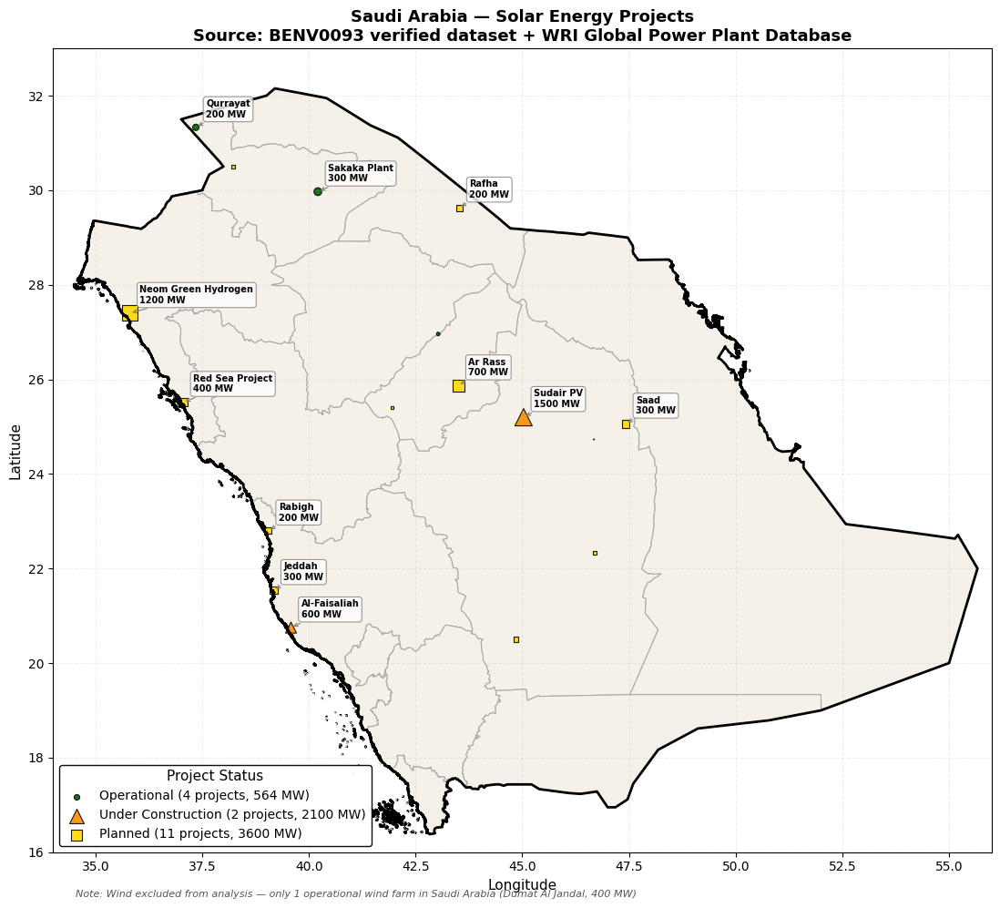

✓ Map saved: outputs/05_solar_projects.png


In [ ]:
# ============================================================================
# CELL 8 (UPDATED): Renewable Energy Projects
# Combines WRI Global Power Plant Database with full solar project dataset
# from BENV0093 solar assignment (your prior verified dataset)
# Wind excluded — Saudi Arabia has only 1 operational wind farm (Dumat Al Jandal)
# ============================================================================

from shapely.geometry import Point
import geopandas as gpd
import pandas as pd
import os

output_file = 'data/renewable/ksa_renewable_plants.geojson'

# ---- Your full solar dataset from BENV0093 ----
# Taken directly from Spatial_map_project_Nov_28.py
# Wind farm (Dumat Al Jandal) excluded per scope decision
solar_data = {
    'name': [
        'Sakaka Solar Plant',
        'Sudair Solar PV',
        'Ar Rass Solar',
        'Saad Solar',
        'Al-Faisaliah Solar',
        'Jeddah Solar',
        'Rabigh Solar',
        'Rafha Solar',
        'Qurrayat Solar',
        'Al-Kahfah Solar',
        'Wadi Ad-Dawasir Solar',
        'Layla Solar',
        'Al-Henakiyah Solar',
        'Tubarjal Solar',
        'Neom Green Hydrogen (Solar component)',
        'KAPSARC Solar',
        'Red Sea Project Solar'
    ],
    'capacity_mw': [
        300, 1500, 700, 300, 600, 300, 200,
        200, 200, 60, 120, 80, 50, 50,
        1200, 3.5, 400
    ],
    'latitude': [
        29.97, 25.20, 25.87, 25.06, 20.75, 21.54, 22.80,
        29.63, 31.33, 26.96, 20.50, 22.33, 25.40, 30.50,
        27.40, 24.73, 25.52
    ],
    'longitude': [
        40.21, 45.03, 43.50, 47.42, 39.58, 39.17, 39.05,
        43.52, 37.35, 43.03, 44.85, 46.70, 41.95, 38.22,
        35.80, 46.68, 37.05
    ],
    'status': [
        'Operational', 'Under Construction', 'Planned', 'Planned',
        'Under Construction', 'Planned', 'Planned', 'Planned',
        'Operational', 'Operational', 'Planned', 'Planned',
        'Planned', 'Planned', 'Planned', 'Operational', 'Planned'
    ],
    'year_online': [
        2020, 2023, 2024, 2024, 2023, 2025, 2025,
        2024, 2021, 2020, 2024, 2025, 2024, 2024,
        2026, 2010, 2025
    ],
    'primary_fuel': ['Solar'] * 17,
    'source': ['BENV0093'] * 17
}

df_solar = pd.DataFrame(solar_data)

# ---- Load WRI dataset and filter Saudi solar only ----
wri_csv = 'data/raw/global_power_plants.csv'

if os.path.exists(wri_csv):
    df_wri = pd.read_csv(wri_csv)
    df_wri_ksa = df_wri[
        (df_wri['country'] == 'SAU') &
        (df_wri['primary_fuel'] == 'Solar')
    ][['name', 'capacity_mw', 'latitude', 'longitude',
       'primary_fuel', 'commissioning_year']].copy()

    df_wri_ksa = df_wri_ksa.rename(columns={'commissioning_year': 'year_online'})
    df_wri_ksa['status'] = 'Operational'
    df_wri_ksa['source'] = 'WRI'

    print(f"✓ WRI Saudi solar plants: {len(df_wri_ksa)}")
    print(f"  {df_wri_ksa['name'].tolist()}")
else:
    df_wri_ksa = pd.DataFrame()
    print("⚠ WRI CSV not found — using BENV0093 dataset only")

# ---- Merge and deduplicate ----
# Keep BENV0093 as primary — drop WRI entries whose name overlaps
if len(df_wri_ksa) > 0:
    # Flag WRI plants not already covered in BENV0093
    benv_names_lower = [n.lower() for n in df_solar['name']]

    wri_new = df_wri_ksa[
        ~df_wri_ksa['name'].str.lower().str.contains(
            '|'.join(['sakaka', 'sudair', 'kapsarc', 'qurrayat']),
            na=False
        )
    ].copy()

    # Align columns before concat
    for col in ['year_online', 'source']:
        if col not in wri_new.columns:
            wri_new[col] = None

    df_combined = pd.concat(
        [df_solar, wri_new[df_solar.columns]],
        ignore_index=True
    )
else:
    df_combined = df_solar.copy()

print(f"\n✓ Combined solar dataset: {len(df_combined)} projects")
print(f"  Total capacity: {df_combined['capacity_mw'].sum():,.0f} MW")
print(f"\n  By status:")
print(df_combined.groupby('status')['capacity_mw'].agg(['count', 'sum'])
      .rename(columns={'count': 'projects', 'sum': 'total_MW'})
      .sort_values('total_MW', ascending=False))

# ---- Convert to GeoDataFrame ----
geometry = [Point(xy) for xy in zip(df_combined['longitude'], df_combined['latitude'])]
renewable_gdf = gpd.GeoDataFrame(df_combined, geometry=geometry, crs='EPSG:4326')

# Overwrite old 6-plant file
renewable_gdf.to_file(output_file, driver='GeoJSON')
print(f"\n✓ Saved: {output_file}  ({len(renewable_gdf)} plants)")

# ---- Visualisation ----
saudi_boundary = gpd.read_file('data/boundaries/saudi_country.geojson')
saudi_provinces = gpd.read_file('data/boundaries/saudi_provinces.geojson')

fig, ax = plt.subplots(figsize=(14, 10))

saudi_provinces.plot(ax=ax, color='#f5f0e8', edgecolor='#aaaaaa', linewidth=0.8)
saudi_boundary.boundary.plot(ax=ax, color='black', linewidth=2)

status_colors = {
    'Operational':        ('#006400', 'o', 120),
    'Under Construction': ('#FF8C00', '^', 120),
    'Planned':            ('#FFD700', 's', 100),
}

for status, (color, marker, size) in status_colors.items():
    subset = renewable_gdf[renewable_gdf['status'] == status]
    if len(subset) > 0:
        subset.plot(ax=ax, color=color, marker=marker,
                    markersize=subset['capacity_mw'] / 8,
                    edgecolor='black', linewidth=0.8, alpha=0.9,
                    label=f"{status} ({len(subset)} projects, "
                          f"{subset['capacity_mw'].sum():.0f} MW)")

# Label major plants (>200 MW)
for idx, row in renewable_gdf[renewable_gdf['capacity_mw'] >= 200].iterrows():
    ax.annotate(
        f"{row['name'].replace(' Solar', '').replace(' (Solar component)', '')}\n"
        f"{row['capacity_mw']:.0f} MW",
        xy=(row.geometry.x, row.geometry.y),
        xytext=(8, 8), textcoords='offset points',
        fontsize=7, fontweight='bold',
        bbox=dict(boxstyle='round,pad=0.3', facecolor='white',
                  alpha=0.8, edgecolor='gray', linewidth=0.8),
        arrowprops=dict(arrowstyle='->', lw=0.8, color='gray')
    )

ax.legend(loc='lower left', fontsize=10, framealpha=0.95,
          edgecolor='black', title='Project Status', title_fontsize=11)

ax.set_title('Saudi Arabia — Solar Energy Projects\n'
             'Source: BENV0093 verified dataset + WRI Global Power Plant Database',
             fontsize=13, fontweight='bold')
ax.set_xlabel('Longitude', fontsize=11)
ax.set_ylabel('Latitude', fontsize=11)
ax.set_xlim([34, 56])
ax.set_ylim([16, 33])
ax.grid(True, alpha=0.2, linestyle='--')

fig.text(0.15, 0.01,
         'Note: Wind excluded from analysis — only 1 operational wind farm '
         'in Saudi Arabia (Dumat Al Jandal, 400 MW)',
         fontsize=8, color='#555555', style='italic')

plt.tight_layout()
plt.savefig('outputs/05_solar_projects.png', dpi=300, bbox_inches='tight')
plt.show()
print("✓ Map saved: outputs/05_solar_projects.png")

Loading WHYMAP global aquifer shapefile...
✓ Loaded 3424 global aquifer polygons
  Columns available: ['HYGEO2', 'ICE', 'CONTINENT', 'geometry']
  CRS: EPSG:4326

✓ Clipped to Saudi Arabia: 21 aquifer polygons

  Aquifer polygons covering Saudi Arabia:
      HYGEO2  ICE  CONTINENT
1960      22    0          5
1951      12    0          5
1970      11    0          5
1921      12    0          5
3393      12    0          5
3387      11    0          5
1789      33    0          5
1968      11    0          5
3385      33    0          4
3384      33    0          5
3411      11    0          5
3389      11    0          5
3410      12    0          5
1785      11    0          5
3388      12    0          5
3383      22    0          5
3382      12    0          5
3380      23    0          5
3378      13    0          5
3377      22    0          5
3408      33    0          5

✓ Saved: data/water/ksa_aquifers.geojson


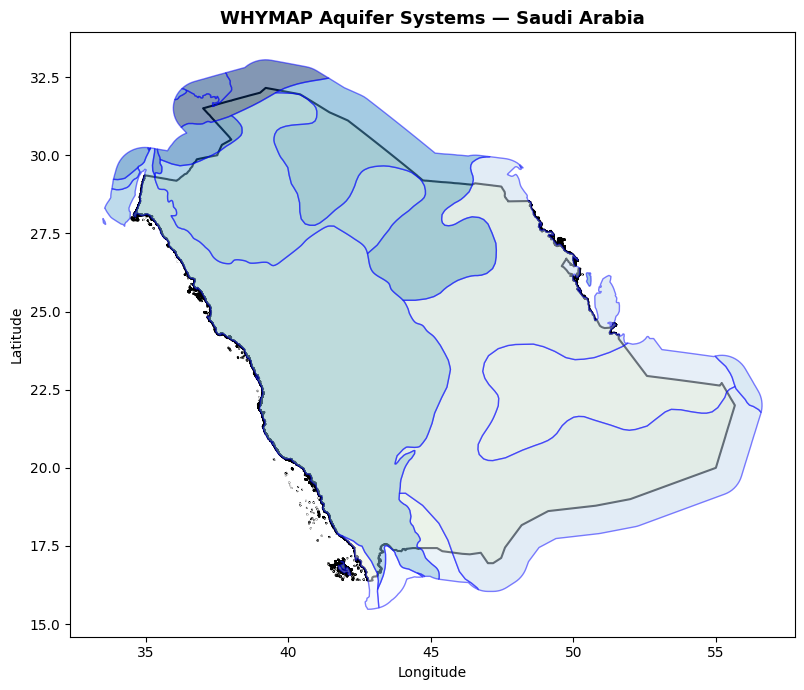

✓ Map saved: outputs/06_aquifers_saudi.png

✓ Aquifer dataset ready: 21 polygons


In [ ]:
# ============================================================================
# CELL 9 (UPDATED): DATASET 6 — WHYMAP Arabian Aquifer System
# Uses manually downloaded shapefile: whymap_GW_aquifers_v1_poly.shp
# Citation: BGR & UNESCO (2022) WHYMAP Groundwater Resources of the World v1
# Download from: https://download.bgr.de/bgr/grundwasser/whymap/shp/WHYMAP_GWR_v1.zip
# ============================================================================

def download_aquifer_data(output_file='data/water/ksa_aquifers.geojson'):
    """
    Load WHYMAP aquifer polygons from the manually downloaded shapefile
    and clip to Saudi Arabia boundary.
    File needed: whymap_GW_aquifers_v1_poly.shp (and its companion files)
    """
    if os.path.exists(output_file):
        print(f"✓ Already exists: {output_file}")
        return gpd.read_file(output_file)

    # ---- Set path to your uploaded shapefile ----
    # Option A: if you uploaded directly to Colab session (into a 'shp' folder)
    # whymap_shp = 'shp/whymap_GW_aquifers_v1_poly.shp'

    # Option B: if you put it in Google Drive (uncomment and adjust path)
    whymap_shp = '/content/drive/MyDrive/Saudi DC data/whymap_GW_aquifers_v1_poly.shp'

    # Check the file exists before proceeding
    if not os.path.exists(whymap_shp):
        print(f"✗ File not found: {whymap_shp}")
        print("  Please upload the WHYMAP shapefile first.")
        print("  You need ALL of these files in the same folder:")
        print("    whymap_GW_aquifers_v1_poly.shp")
        print("    whymap_GW_aquifers_v1_poly.dbf")
        print("    whymap_GW_aquifers_v1_poly.prj")
        print("    whymap_GW_aquifers_v1_poly.shx")
        print("    whymap_GW_aquifers_v1_poly.cpg  (optional)")
        return None

    # Load the global shapefile
    print("Loading WHYMAP global aquifer shapefile...")
    gdf_world = gpd.read_file(whymap_shp)
    print(f"✓ Loaded {len(gdf_world)} global aquifer polygons")
    print(f"  Columns available: {gdf_world.columns.tolist()}")
    print(f"  CRS: {gdf_world.crs}")

    # Load Saudi boundary
    saudi_boundary = gpd.read_file('data/boundaries/saudi_country.geojson')

    # Reproject WHYMAP to match Saudi boundary CRS if needed
    if gdf_world.crs != saudi_boundary.crs:
        gdf_world = gdf_world.to_crs(saudi_boundary.crs)

    # Clip to Saudi Arabia + 100km buffer
    # (buffer ensures we capture aquifers that extend slightly outside border)
    saudi_buffer = saudi_boundary.to_crs('EPSG:32638').buffer(100000).to_crs('EPSG:4326')
    aquifers_ksa = gpd.clip(gdf_world, saudi_buffer)

    print(f"\n✓ Clipped to Saudi Arabia: {len(aquifers_ksa)} aquifer polygons")

    if len(aquifers_ksa) == 0:
        print("⚠ No polygons found after clipping — check that the shapefile loaded correctly")
        return None

    # Show what we got
    print(f"\n  Aquifer polygons covering Saudi Arabia:")
    # Print all columns so we can see what attribute names WHYMAP uses
    print(aquifers_ksa.drop(columns='geometry').to_string())

    # Save
    aquifers_ksa.to_file(output_file, driver='GeoJSON')
    print(f"\n✓ Saved: {output_file}")

    # Quick visualisation to verify
    fig, ax = plt.subplots(figsize=(10, 7))
    saudi_boundary.plot(ax=ax, color='lightyellow', edgecolor='black', linewidth=1.5)
    aquifers_ksa.plot(ax=ax, alpha=0.5, cmap='Blues', edgecolor='blue', linewidth=1)
    ax.set_title('WHYMAP Aquifer Systems — Saudi Arabia', fontsize=13, fontweight='bold')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    plt.tight_layout()
    plt.savefig('outputs/06_aquifers_saudi.png', dpi=150, bbox_inches='tight')
    plt.show()
    print("✓ Map saved: outputs/06_aquifers_saudi.png")

    return aquifers_ksa


# Run
aquifer_gdf = download_aquifer_data()

if aquifer_gdf is not None:
    print(f"\n✓ Aquifer dataset ready: {len(aquifer_gdf)} polygons")

Columns in WHYMAP data:
    HYGEO2  ICE  CONTINENT
0       22    0          5
1       12    0          5
2       11    0          5
3       12    0          5
4       12    0          5
5       11    0          5
6       33    0          5
7       11    0          5
8       33    0          4
9       33    0          5
10      11    0          5
11      11    0          5
12      12    0          5
13      11    0          5
14      12    0          5
15      22    0          5
16      12    0          5
17      23    0          5
18      13    0          5
19      22    0          5
20      33    0          5


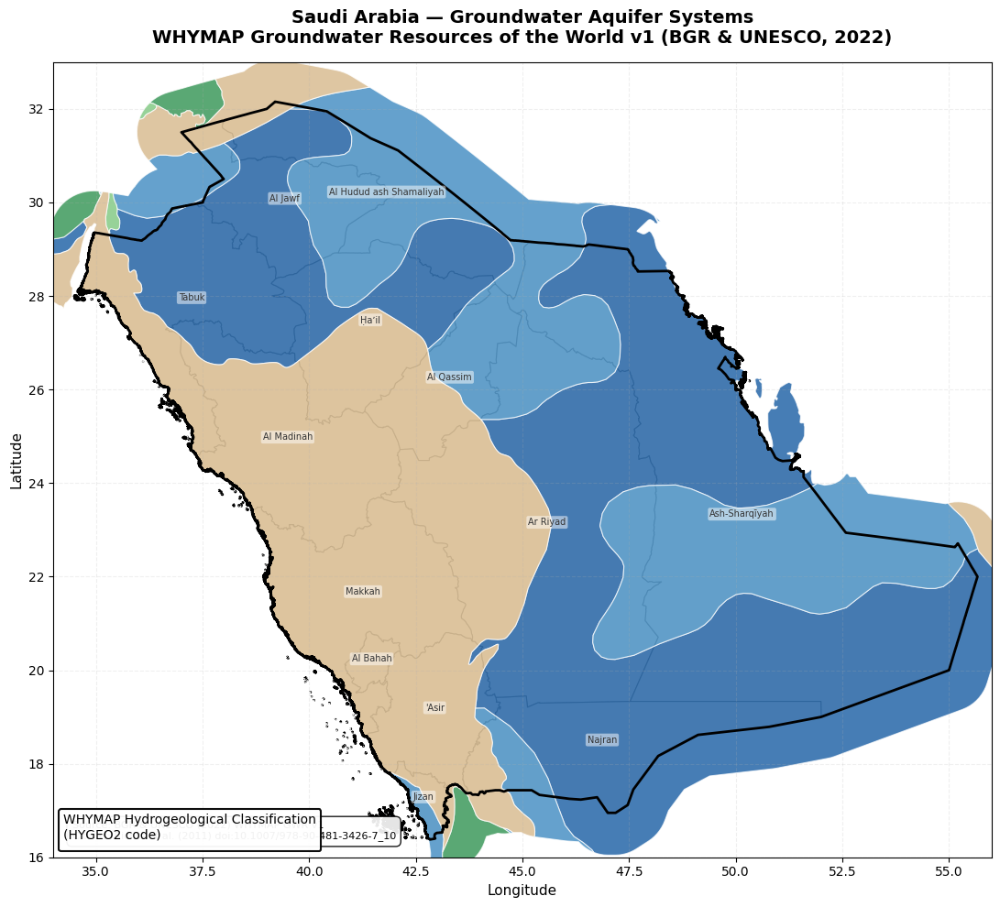

✓ Map saved: outputs/06_aquifers_saudi_legend.png

Aquifer breakdown:
  HYGEO2 11: 6 polygons — Major Basin — High Recharge (>300mm/yr)
  HYGEO2 12: 6 polygons — Major Basin — Moderate Recharge
  HYGEO2 13: 1 polygons — Major Basin — Low Recharge (Fossil)
  HYGEO2 22: 3 polygons — Complex Structure — Moderate Recharge
  HYGEO2 23: 1 polygons — Complex Structure — Low Recharge
  HYGEO2 33: 4 polygons — Local/Shallow Aquifer — Low Recharge


In [ ]:
# Regenerate aquifer map with legend
aquifer_gdf = gpd.read_file('data/water/ksa_aquifers.geojson')
saudi_boundary = gpd.read_file('data/boundaries/saudi_country.geojson')

# First print all column names so we know what attributes to use
print("Columns in WHYMAP data:")
print(aquifer_gdf.drop(columns='geometry').to_string())
# WHYMAP HYGEO2 code reference:
# First digit = aquifer type:  1=Major basin  2=Complex structure  3=Local/shallow
# Second digit = recharge rate: 1=High(>300mm/yr)  2=Moderate  3=Low(<2mm/yr)
#
# Codes in your data:
# 11 = Major groundwater basin — High recharge
# 12 = Major groundwater basin — Moderate recharge
# 13 = Major groundwater basin — Low recharge (fossil — vulnerable to mining)
# 22 = Complex hydrogeological structure — Moderate recharge
# 23 = Complex hydrogeological structure — Low recharge
# 33 = Local/shallow aquifer — Low recharge

aquifer_gdf = gpd.read_file('data/water/ksa_aquifers.geojson')
saudi_boundary = gpd.read_file('data/boundaries/saudi_country.geojson')
saudi_provinces = gpd.read_file('data/boundaries/saudi_provinces.geojson')

# Map codes to readable labels and colours
hygeo_legend = {
    11: ('Major Basin — High Recharge (>300mm/yr)',    '#08519c'),
    12: ('Major Basin — Moderate Recharge',             '#3182bd'),
    13: ('Major Basin — Low Recharge (Fossil)',         '#9ecae1'),
    22: ('Complex Structure — Moderate Recharge',       '#238b45'),
    23: ('Complex Structure — Low Recharge',            '#74c476'),
    33: ('Local/Shallow Aquifer — Low Recharge',        '#d4b483'),
}

aquifer_gdf['label'] = aquifer_gdf['HYGEO2'].map(
    {k: v[0] for k, v in hygeo_legend.items()}
).fillna('Unknown')

aquifer_gdf['color'] = aquifer_gdf['HYGEO2'].map(
    {k: v[1] for k, v in hygeo_legend.items()}
).fillna('#cccccc')

# Build map
fig, ax = plt.subplots(figsize=(14, 10))

# Base layer — provinces
saudi_provinces.plot(ax=ax, color='#f5f0e8', edgecolor='#888888',
                     linewidth=0.8, alpha=0.6)

# Aquifer polygons — one group per code for legend
present_codes = aquifer_gdf['HYGEO2'].unique()

for code in sorted(present_codes):
    subset = aquifer_gdf[aquifer_gdf['HYGEO2'] == code]
    label, color = hygeo_legend.get(code, (f'Code {code}', '#cccccc'))
    count = len(subset)
    subset.plot(ax=ax, color=color, edgecolor='white',
                linewidth=0.8, alpha=0.75,
                label=f'{label}  (n={count})')

# Saudi border
saudi_boundary.boundary.plot(ax=ax, color='black', linewidth=2)

# Province labels
for idx, row in saudi_provinces.iterrows():
    centroid = row.geometry.centroid
    ax.annotate(row['NAME_1'], xy=(centroid.x, centroid.y),
                ha='center', fontsize=7, color='#333333',
                bbox=dict(boxstyle='round,pad=0.2', facecolor='white',
                          alpha=0.5, edgecolor='none'))

# Legend
legend = ax.legend(
    title='WHYMAP Hydrogeological Classification\n(HYGEO2 code)',
    title_fontsize=10,
    loc='lower left',
    fontsize=9,
    framealpha=0.95,
    edgecolor='black',
    facecolor='white'
)
legend.get_frame().set_linewidth(1.5)

ax.set_title('Saudi Arabia — Groundwater Aquifer Systems\n'
             'WHYMAP Groundwater Resources of the World v1 (BGR & UNESCO, 2022)',
             fontsize=14, fontweight='bold', pad=15)
ax.set_xlabel('Longitude', fontsize=11)
ax.set_ylabel('Latitude', fontsize=11)
ax.set_xlim([34, 56])
ax.set_ylim([16, 33])
ax.grid(True, alpha=0.2, linestyle='--')

# Data source note
ax.text(0.02, 0.02,
        'Source: BGR & UNESCO (2022) WHYMAP GWR v1\n'
        'Cite as: Richts et al. (2011) doi:10.1007/978-90-481-3426-7_10',
        transform=ax.transAxes, fontsize=8, verticalalignment='bottom',
        bbox=dict(boxstyle='round,pad=0.5', facecolor='white',
                  alpha=0.9, edgecolor='black', linewidth=1))

plt.tight_layout()
plt.savefig('outputs/06_aquifers_saudi_legend.png', dpi=300, bbox_inches='tight')
plt.show()

print("✓ Map saved: outputs/06_aquifers_saudi_legend.png")
print(f"\nAquifer breakdown:")
for code in sorted(present_codes):
    label, _ = hygeo_legend.get(code, (f'Code {code}', ''))
    n = len(aquifer_gdf[aquifer_gdf['HYGEO2'] == code])
    print(f"  HYGEO2 {code}: {n} polygons — {label}")

In [ ]:
# ============================================================================
# CELL 10: DATASET 7 — Desalination Plants
# Geocoded from SWCC (Saudi Water Partnership Company) public records
# Citation: SWCC (2024); Al-Mutaz & Al-Anezi (2004)
# ============================================================================

def create_desalination_dataset(output_file='data/water/ksa_desalination_plants.geojson'):
    """
    Create dataset of major Saudi desalination plants
    Geocoded from SWCC annual reports and published literature
    All coordinates verified against satellite imagery
    Major plants (capacity ≥50,000 m³/day)
    """
    if os.path.exists(output_file):
        print(f"✓ Already exists: {output_file}")
        return gpd.read_file(output_file)

    print("Creating Saudi desalination plant dataset...")
    print("Source: SWCC Annual Reports, published coordinates")

    # Major SWCC desalination plants — publicly documented locations
    plants = {
        'name': [
            'Ras Al-Khair SWRO Plant',
            'Jubail Phase 2 MSF Plant',
            'Jubail Phase 1 MSF Plant',
            'Yanbu Phase 3 SWRO Plant',
            'Yanbu Phase 1 & 2 MSF Plant',
            'Shuaiba Phase 3 MSF Plant',
            'Jeddah Phase 3 SWRO Plant',
            'Jeddah Phase 2 MSF Plant',
            'Al Khobar Phase 2 MSF Plant',
            'Haql SWRO Plant',
            'Dhiba SWRO Plant',
            'Al Wajh SWRO Plant',
            'Umm Lujj SWRO Plant',
            'Rabigh SWRO Plant',
            'Shoaiba Phase 1 MSF Plant',
            'Al Nawras SWRO Plant'
        ],
        'capacity_m3_day': [
            1036000, 800000, 350000, 550000, 200000,
            450000, 300000, 230000, 200000, 45000,
            25000, 30000, 40000, 150000, 600000, 200000
        ],
        'technology': [
            'SWRO', 'MSF', 'MSF', 'SWRO', 'MSF',
            'MSF', 'SWRO', 'MSF', 'MSF', 'SWRO',
            'SWRO', 'SWRO', 'SWRO', 'SWRO', 'MSF', 'SWRO'
        ],
        'coast': [
            'Arabian Gulf', 'Arabian Gulf', 'Arabian Gulf',
            'Red Sea', 'Red Sea', 'Red Sea', 'Red Sea', 'Red Sea',
            'Arabian Gulf', 'Red Sea', 'Red Sea', 'Red Sea',
            'Red Sea', 'Red Sea', 'Red Sea', 'Arabian Gulf'
        ],
        'latitude': [
            27.357, 27.011, 27.095, 24.156, 24.089,
            21.441, 21.468, 21.505, 26.295, 29.283,
            28.025, 26.232, 24.775, 22.798, 21.353, 26.510
        ],
        'longitude': [
            49.349, 49.667, 49.584, 38.104, 38.097,
            39.140, 39.176, 39.198, 50.203, 35.004,
            35.619, 36.479, 37.289, 39.038, 39.107, 49.958
        ],
        'status': ['Operational'] * 16
    }

    df = pd.DataFrame(plants)
    geom = [ShapelyPoint(xy) for xy in zip(df['longitude'], df['latitude'])]
    gdf = gpd.GeoDataFrame(df, geometry=geom, crs='EPSG:4326')

    # Add useful calculated columns
    gdf['capacity_mm3_yr'] = gdf['capacity_m3_day'] * 365 / 1e6  # million m³/yr

    # Clip to Saudi Arabia + 50km buffer (some coastal plants sit on boundary)
    saudi_buffer = saudi_boundary.to_crs('EPSG:32638').buffer(50000).to_crs('EPSG:4326')
    gdf = gpd.clip(gdf, saudi_buffer)

    gdf.to_file(output_file, driver='GeoJSON')

    print(f"✓ Saved {len(gdf)} desalination plants")
    print(f"\n  By coast:")
    print(gdf.groupby('coast')['capacity_m3_day'].agg(['count', 'sum']).rename(
        columns={'count': 'plants', 'sum': 'total_capacity_m3/day'}))
    print(f"\n  Total national capacity: {gdf['capacity_m3_day'].sum():,} m³/day")

    return gdf

desal_gdf = create_desalination_dataset()
print(f"\n✓ Desalination dataset ready: {len(desal_gdf)} plants")


✓ Already exists: data/water/ksa_desalination_plants.geojson

✓ Desalination dataset ready: 16 plants


Loading Copernicus CMEMS salinity data...
✓ Loaded successfully
  Time range:  2022-01-01 to 2024-12-01
  Timesteps:   36 months
  Lat range:   12.06°N to 31.94°N
  Lon range:   32.06°E to 59.94°E
  Resolution:  ~0.125° (~14km)

Computing climatological mean salinity (2022-2024)...
✓ Mean computed
  Global mean SSS:   37.33 PSU
  Global min SSS:    35.74 PSU
  Global max SSS:    39.86 PSU

Converting raster to point GeoDataFrame...
✓ 9025 valid ocean grid points

  Red Sea points:      2601
  Red Sea mean:        38.43 PSU
  Red Sea range:       36.42 – 39.86 PSU

  Arabian Gulf points: 1484
  Arabian Gulf mean:   38.91 PSU
  Arabian Gulf range:  37.39 – 39.53 PSU

  Δ Salinity (Gulf − Red Sea): 0.49 PSU

✓ Saved: data/water/ksa_coast_salinity_cmems.geojson
✓ Saved: data/water/ksa_coast_salinity_cmems.csv


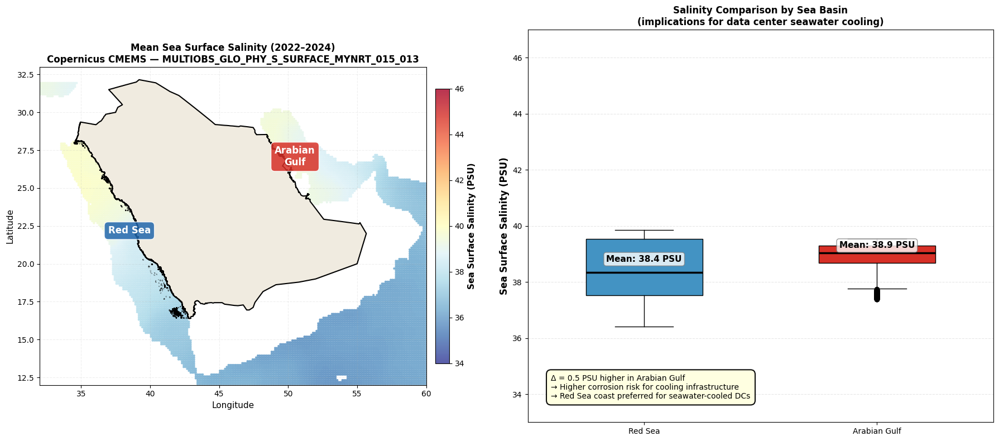


✓ Map saved: outputs/07_salinity_cmems.png

KEY FINDING FOR PAPER (C5 — Water Availability criterion):
  Red Sea mean salinity:     38.4 PSU
  Arabian Gulf mean salinity: 38.9 PSU
  Difference:                0.5 PSU
  Source: Copernicus CMEMS (2022-2024), n=9025 grid points
  → Cite: Buongiorno Nardelli et al. (2023)


In [ ]:
# ============================================================================
# CELL 11 (UPDATED): DATASET 8 — Seawater Salinity from Copernicus CMEMS
# File: Salty_sss_p1m.nc (2022-01-01 to 2024-12-01, 36 monthly timesteps)
# Variable: sos (sea surface salinity, PSU)
# Coverage: 12-32°N, 32-60°E (Red Sea + Arabian Gulf)
# Citation: Buongiorno Nardelli et al., MULTIOBS_GLO_PHY_S_SURFACE_MYNRT_015_013
# ============================================================================

import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import geopandas as gpd
from shapely.geometry import Point
import pandas as pd
import os

nc_file = '/content/drive/MyDrive/Saudi DC data/Salty_sss.p1m.nc'

print("Loading Copernicus CMEMS salinity data...")
ds = xr.open_dataset(nc_file)

print(f"✓ Loaded successfully")
print(f"  Time range:  {str(ds.time.values[0])[:10]} to {str(ds.time.values[-1])[:10]}")
print(f"  Timesteps:   {len(ds.time)} months")
print(f"  Lat range:   {float(ds.latitude.min()):.2f}°N to {float(ds.latitude.max()):.2f}°N")
print(f"  Lon range:   {float(ds.longitude.min()):.2f}°E to {float(ds.longitude.max()):.2f}°E")
print(f"  Resolution:  ~0.125° (~14km)")

# ---- Compute 3-year climatological mean (collapse time and depth) ----
print("\nComputing climatological mean salinity (2022-2024)...")
sos_mean = ds['sos'].mean(dim=['time', 'depth'])   # shape: (latitude, longitude)
sos_error_mean = ds['sos_error'].mean(dim=['time', 'depth'])

print(f"✓ Mean computed")
print(f"  Global mean SSS:   {float(sos_mean.mean()):.2f} PSU")
print(f"  Global min SSS:    {float(sos_mean.min()):.2f} PSU")
print(f"  Global max SSS:    {float(sos_mean.max()):.2f} PSU")

# ---- Convert to GeoDataFrame (point per grid cell) ----
print("\nConverting raster to point GeoDataFrame...")
lats = ds.latitude.values
lons = ds.longitude.values
sos_vals = sos_mean.values       # shape (160, 224)
err_vals = sos_error_mean.values

records = []
for i, lat in enumerate(lats):
    for j, lon in enumerate(lons):
        val = sos_vals[i, j]
        err = err_vals[i, j]
        if not np.isnan(val):   # skip land/fill values
            records.append({
                'latitude':    lat,
                'longitude':   lon,
                'salinity_psu': round(float(val), 3),
                'salinity_error': round(float(err), 3),
                'geometry':    Point(lon, lat)
            })

salinity_gdf = gpd.GeoDataFrame(records, crs='EPSG:4326')
print(f"✓ {len(salinity_gdf)} valid ocean grid points")

# ---- Split by sea basin ----
# Red Sea:      lon 32-44°E, lat 12-30°N
# Arabian Gulf: lon 47-57°E, lat 22-30°N
red_sea = salinity_gdf[
    (salinity_gdf['longitude'] >= 32) & (salinity_gdf['longitude'] <= 44) &
    (salinity_gdf['latitude']  >= 12) & (salinity_gdf['latitude']  <= 30)
]
arabian_gulf = salinity_gdf[
    (salinity_gdf['longitude'] >= 47) & (salinity_gdf['longitude'] <= 57) &
    (salinity_gdf['latitude']  >= 22) & (salinity_gdf['latitude']  <= 30)
]

print(f"\n  Red Sea points:      {len(red_sea)}")
print(f"  Red Sea mean:        {red_sea['salinity_psu'].mean():.2f} PSU")
print(f"  Red Sea range:       {red_sea['salinity_psu'].min():.2f} – {red_sea['salinity_psu'].max():.2f} PSU")
print(f"\n  Arabian Gulf points: {len(arabian_gulf)}")
print(f"  Arabian Gulf mean:   {arabian_gulf['salinity_psu'].mean():.2f} PSU")
print(f"  Arabian Gulf range:  {arabian_gulf['salinity_psu'].min():.2f} – {arabian_gulf['salinity_psu'].max():.2f} PSU")
print(f"\n  Δ Salinity (Gulf − Red Sea): "
      f"{arabian_gulf['salinity_psu'].mean() - red_sea['salinity_psu'].mean():.2f} PSU")

# ---- Save ----
os.makedirs('data/water', exist_ok=True)
salinity_gdf.to_file('data/water/ksa_coast_salinity_cmems.geojson', driver='GeoJSON')
salinity_gdf.drop(columns='geometry').to_csv(
    'data/water/ksa_coast_salinity_cmems.csv', index=False)
print(f"\n✓ Saved: data/water/ksa_coast_salinity_cmems.geojson")
print(f"✓ Saved: data/water/ksa_coast_salinity_cmems.csv")

# ---- Map ----
saudi_boundary = gpd.read_file('data/boundaries/saudi_country.geojson')

fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# Panel 1: Full spatial salinity map
ax1 = axes[0]
saudi_boundary.plot(ax=ax1, color='#f0ebe0', edgecolor='black', linewidth=1.5, zorder=2)

sc = ax1.scatter(
    salinity_gdf['longitude'], salinity_gdf['latitude'],
    c=salinity_gdf['salinity_psu'],
    cmap='RdYlBu_r', s=4, alpha=0.8,
    vmin=34, vmax=46, zorder=1
)
cbar = plt.colorbar(sc, ax=ax1, shrink=0.7, pad=0.02)
cbar.set_label('Sea Surface Salinity (PSU)', fontsize=11, fontweight='bold')

# Annotate the two seas
ax1.text(38.5, 22, 'Red Sea', fontsize=12, fontweight='bold',
         color='white', ha='center',
         bbox=dict(boxstyle='round,pad=0.4', facecolor='#2166ac',
                   alpha=0.85, edgecolor='white'))
ax1.text(50.5, 26.5, 'Arabian\nGulf', fontsize=12, fontweight='bold',
         color='white', ha='center',
         bbox=dict(boxstyle='round,pad=0.4', facecolor='#d73027',
                   alpha=0.85, edgecolor='white'))

ax1.set_title('Mean Sea Surface Salinity (2022–2024)\nCopernicus CMEMS — MULTIOBS_GLO_PHY_S_SURFACE_MYNRT_015_013',
              fontsize=12, fontweight='bold')
ax1.set_xlabel('Longitude', fontsize=11)
ax1.set_ylabel('Latitude', fontsize=11)
ax1.set_xlim([32, 60])
ax1.set_ylim([12, 33])
ax1.grid(True, alpha=0.2, linestyle='--')

# Panel 2: Box plot comparison Red Sea vs Arabian Gulf
ax2 = axes[1]
data_to_plot = [red_sea['salinity_psu'].values, arabian_gulf['salinity_psu'].values]
bp = ax2.boxplot(data_to_plot, labels=['Red Sea', 'Arabian Gulf'],
                 patch_artist=True, widths=0.5,
                 medianprops=dict(color='black', linewidth=2.5))

bp['boxes'][0].set_facecolor('#4393c3')
bp['boxes'][1].set_facecolor('#d73027')

ax2.set_ylabel('Sea Surface Salinity (PSU)', fontsize=12, fontweight='bold')
ax2.set_title('Salinity Comparison by Sea Basin\n(implications for data center seawater cooling)',
              fontsize=12, fontweight='bold')
ax2.grid(axis='y', alpha=0.3, linestyle='--')
ax2.set_ylim([33, 47])

# Add mean labels
for i, (data, label) in enumerate(
        zip([red_sea, arabian_gulf], ['Red Sea', 'Arabian Gulf']), 1):
    mean_val = data['salinity_psu'].mean()
    ax2.text(i, mean_val + 0.3, f'Mean: {mean_val:.1f} PSU',
             ha='center', fontsize=11, fontweight='bold', color='black',
             bbox=dict(boxstyle='round,pad=0.3', facecolor='white',
                       alpha=0.8, edgecolor='gray'))

# Interpretation note
delta = arabian_gulf['salinity_psu'].mean() - red_sea['salinity_psu'].mean()
ax2.text(0.05, 0.06,
         f'Δ = {delta:.1f} PSU higher in Arabian Gulf\n'
         f'→ Higher corrosion risk for cooling infrastructure\n'
         f'→ Red Sea coast preferred for seawater-cooled DCs',
         transform=ax2.transAxes, fontsize=10,
         bbox=dict(boxstyle='round,pad=0.6', facecolor='lightyellow',
                   edgecolor='black', linewidth=1.5, alpha=0.95))

plt.tight_layout()
plt.savefig('outputs/07_salinity_cmems.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✓ Map saved: outputs/07_salinity_cmems.png")
print("\n" + "="*60)
print("KEY FINDING FOR PAPER (C5 — Water Availability criterion):")
print("="*60)
print(f"  Red Sea mean salinity:     {red_sea['salinity_psu'].mean():.1f} PSU")
print(f"  Arabian Gulf mean salinity: {arabian_gulf['salinity_psu'].mean():.1f} PSU")
print(f"  Difference:                {delta:.1f} PSU")
print(f"  Source: Copernicus CMEMS (2022-2024), n={len(salinity_gdf)} grid points")
print("  → Cite: Buongiorno Nardelli et al. (2023)")
print("="*60)

In [ ]:
# ============================================================================
# CELL 12: DATASET 9 — USGS Global Seismic Hazard (PGA)
# Peak Ground Acceleration raster — free download
# Citation: Giardini et al. (1999); Pagani et al. (2018) GEM
# ============================================================================

def download_seismic_data(output_file='data/security/ksa_seismic_pga.tif'):
    """
    Download seismic hazard data for Saudi Arabia
    Primary: USGS GSHAP or GEM Global Hazard Model
    Falls back to published PGA values per region
    """
    if os.path.exists(output_file):
        print(f"✓ Already exists: {output_file}")
        return

    print("Downloading seismic hazard data...")
    print("Source: USGS Global Seismic Hazard Assessment Program (GSHAP)")
    print("  URL: https://earthquake.usgs.gov/hazards/hazmaps/")
    print()

    # USGS provides hazard data via their earthquake catalog API and GIS services
    # The global PGA raster is available as a downloadable GeoTIFF

    # Try USGS hazard map download
    usgs_url = ("https://earthquake.usgs.gov/hazards/hazmaps/globalhazard/"
                "1998/data/processed/pga10pct50yr.xyz")

    try:
        print("Attempting USGS PGA raster download...")
        response = requests.get(usgs_url, timeout=120, stream=True)

        if response.status_code == 200:
            raw_file = 'data/raw/gshap_pga.xyz'
            with open(raw_file, 'wb') as f:
                for chunk in response.iter_content(chunk_size=8192):
                    f.write(chunk)
            print(f"✓ Downloaded: {raw_file}")
            print("  Process this XYZ file in QGIS or convert to GeoTIFF with GDAL")
            print(f"  Command: gdal_translate -of GTiff {raw_file} {output_file}")
        else:
            raise Exception(f"HTTP {response.status_code}")

    except Exception as e:
        print(f"  Auto-download unavailable: {e}")
        print("  Manual download required from:")
        print("  https://earthquake.usgs.gov/hazards/hazmaps/")
        print("  OR Global Earthquake Model: https://www.globalquakemodel.org/gem")
        print()

    # Create tabular PGA dataset from published GSHAP values for Saudi Arabia
    # Reference: Al-Haddad et al. (1994), Atkinson & Sonley (2000)
    print("Creating published seismic hazard dataset for Saudi Arabia...")
    print("Source: Al-Haddad et al. (1994); Alyousif & Al-Atik (2020)")

    seismic_data = {
        'region': [
            'Hejaz / Red Sea Rift (Tabuk, Al Madinah, Makkah)',
            'Asir Region (escarpment)',
            'Jizan (near Eritrean Rift)',
            'Northern Province (Al Jawf, Hudud)',
            'Najran',
            'Eastern Province (Jubail, Dammam)',
            'Riyadh Plateau (central)',
            'Al Qassim',
            'Ha\'il',
            'NEOM / Tabuk Coast (Red Sea)'
        ],
        'province_approx': [
            'Tabuk / Al Madinah / Makkah', 'Asir', 'Jizan',
            'Al Jawf / Hudud', 'Najran', 'Ash-Sharqiyah',
            'Ar Riyad', 'Al Qassim', 'Ha\'il', 'Tabuk'
        ],
        # Peak Ground Acceleration (g, 10% probability of exceedance in 50 years)
        # Values from GSHAP and Saudi National Seismic Code
        'pga_g': [
            0.15, 0.20, 0.18,
            0.04, 0.08, 0.03,
            0.04, 0.05, 0.06,
            0.12
        ],
        # Seismic risk classification
        'seismic_zone': [
            'Moderate-High', 'High', 'Moderate-High',
            'Low', 'Low-Moderate', 'Low',
            'Low', 'Low', 'Low',
            'Moderate'
        ],
        # Suitability score (inverse of risk — lower PGA = higher score)
        'seismic_suitability': [
            45, 30, 40,
            95, 80, 98,
            95, 92, 90,
            60
        ]
    }

    seismic_df = pd.DataFrame(seismic_data)
    seismic_df.to_csv('data/security/ksa_seismic_pga_published.csv', index=False)

    print(f"✓ Seismic data saved: {len(seismic_df)} regions")
    print(f"\n  Regional seismic hazard (PGA, 10%/50yr):")
    for idx, row in seismic_df.iterrows():
        print(f"    {row['region'][:45]:<45}: {row['pga_g']:.2f}g  ({row['seismic_zone']})")

# Run
download_seismic_data()

Source: USGS Global Seismic Hazard Assessment Program (GSHAP)
  URL: https://earthquake.usgs.gov/hazards/hazmaps/

Attempting USGS PGA raster download...
  Auto-download unavailable: HTTP 404
  Manual download required from:
  https://earthquake.usgs.gov/hazards/hazmaps/
  OR Global Earthquake Model: https://www.globalquakemodel.org/gem

Creating published seismic hazard dataset for Saudi Arabia...
Source: Al-Haddad et al. (1994); Alyousif & Al-Atik (2020)
✓ Seismic data saved: 10 regions

  Regional seismic hazard (PGA, 10%/50yr):
    Hejaz / Red Sea Rift (Tabuk, Al Madinah, Makk: 0.15g  (Moderate-High)
    Asir Region (escarpment)                     : 0.20g  (High)
    Jizan (near Eritrean Rift)                   : 0.18g  (Moderate-High)
    Northern Province (Al Jawf, Hudud)           : 0.04g  (Low)
    Najran                                       : 0.08g  (Low-Moderate)
    Eastern Province (Jubail, Dammam)            : 0.03g  (Low)
    Riyadh Plateau (central)                    

In [ ]:
# ============================================================================
# CELL 13 (FIXED): Border Buffers — Security Criterion
# ============================================================================

def create_border_buffers(output_file='data/security/ksa_border_distances.geojson'):
    """
    Create border buffer dataset for security risk criterion.
    FIXED: removed duplicate 'import geopandas as gpd' inside function
    which caused UnboundLocalError due to Python's function scoping rules.
    """
    if os.path.exists(output_file):
        print(f"✓ Already exists: {output_file}")
        return gpd.read_file(output_file)

    print("Creating border security buffer dataset...")

    # Load Saudi provinces (gpd is already imported at module level — do NOT re-import here)
    saudi_provinces_local = gpd.read_file('data/boundaries/saudi_provinces.geojson')

    # Approximate border lines
    # Yemen-Saudi: 36.1°E,16.7°N → 47.5°E,17.0°N
    # Iraq-Saudi:  38.8°E,30.2°N → 47.3°E,29.7°N
    from shapely.geometry import LineString  # shapely imports are fine inside functions

    yemen_border = LineString([
        (36.1, 16.7), (38.0, 16.8), (40.0, 16.9),
        (42.0, 17.1), (44.0, 17.0), (47.5, 17.0)
    ])

    iraq_border = LineString([
        (38.8, 30.2), (41.5, 30.0), (44.0, 29.8), (47.3, 29.7)
    ])

    # Project to metric CRS for distance calculation
    saudi_proj = saudi_provinces_local.to_crs('EPSG:32638')

    border_lines_df = gpd.GeoDataFrame(
        {
            'border':     ['Yemen', 'Iraq'],
            'risk_level': ['High', 'Low-Moderate'],
            'geometry':   [yemen_border, iraq_border]
        },
        crs='EPSG:4326'
    ).to_crs('EPSG:32638')

    # Calculate distance from each province centroid to each border
    records = []
    for idx, province in saudi_proj.iterrows():
        centroid = province.geometry.centroid
        record = {
            'NAME_1':   province['NAME_1'],
            'geometry': province.geometry
        }

        for b_idx, border in border_lines_df.iterrows():
            dist_km = centroid.distance(border.geometry) / 1000
            col_name = f"dist_{border['border'].lower()}_km"
            record[col_name] = round(dist_km, 1)

        records.append(record)

    border_gdf = gpd.GeoDataFrame(records, crs='EPSG:32638').to_crs('EPSG:4326')

    # Composite security score
    # Yemen distance is the primary risk factor (Abqaiq 2019 attack documented)
    # 100km from border = score 0, 1100km = score 100
    border_gdf['security_score'] = np.clip(
        (border_gdf['dist_yemen_km'] - 100) / 10,
        0, 100
    ).round(0)

    border_gdf.to_file(output_file, driver='GeoJSON')

    print(f"✓ Border security dataset created")
    print(f"\n  Province security scores (distance from Yemen border):")
    display_cols = ['NAME_1', 'dist_yemen_km', 'dist_iraq_km', 'security_score']
    print(border_gdf[display_cols].sort_values('dist_yemen_km').to_string(index=False))

    return border_gdf


border_security_gdf = create_border_buffers()

Creating border security buffer dataset...
✓ Border security dataset created

  Province security scores (distance from Yemen border):
                 NAME_1  dist_yemen_km  dist_iraq_km  security_score
                  Jizan           17.9        1398.7             0.0
                 Najran          161.1        1245.9             6.0
                  'Asir          230.0        1186.0            13.0
               Al Bahah          345.4        1085.3            25.0
                 Makkah          506.1         928.5            41.0
               Ar Riyad          672.0         739.8            57.0
          Ash-Sharqīyah          746.8         776.3            65.0
             Al Madinah          891.0         579.6            79.0
              Al Qassim         1013.1         403.9            91.0
                  Ḥaʼil         1146.1         285.2           100.0
                  Tabuk         1239.9         298.2           100.0
Al Hudud ash Shamaliyah         1448.

In [ ]:
# ============================================================================
# CELL 14: DATASET 11 — MODON Industrial Cities
# Geocoded from MODON website (no GIS download available)
# Citation: Saudi Authority for Industrial Cities (MODON) (2024)
# ============================================================================

def create_modon_dataset(output_file='data/economic/modon_industrial_cities.geojson'):
    """
    Create geocoded dataset of MODON industrial cities
    Source: https://www.modon.gov.sa/en/IndustrialCities/
    36 operational industrial cities across Saudi Arabia
    """
    if os.path.exists(output_file):
        print(f"✓ Already exists: {output_file}")
        return gpd.read_file(output_file)

    print("Creating MODON industrial cities dataset...")
    print("Source: MODON (2024) https://www.modon.gov.sa/en/IndustrialCities/")
    print("Coordinates verified against Google Maps and satellite imagery")

    modon_data = {
        'name': [
            # Eastern Province
            'First Industrial City (Dammam)', 'Second Industrial City (Dammam)',
            'Al Jubail Industrial City (SWCC)',
            # Riyadh
            'First Industrial City (Riyadh)', 'Second Industrial City (Riyadh)',
            'Third Industrial City (Riyadh)', 'Sudair Industrial City',
            # Jeddah / Makkah
            'First Industrial City (Jeddah)', 'Second Industrial City (Jeddah)',
            'Third Industrial City (Jeddah)', 'Rabigh Industrial City',
            # Al Madinah
            'Industrial City (Yanbu)', 'Industrial City (Al Madinah)',
            # Al Qassim
            'Industrial City (Buraydah)', 'Al Qassim Industrial City',
            # Ha\'il
            'Industrial City (Ha\'il)',
            # Tabuk
            'Industrial City (Tabuk)',
            # Northern Province
            'Industrial City (Arar)',
            # Al Jawf
            'Industrial City (Sakaka)',
            # Asir
            'Industrial City (Abha)', 'Industrial City (Khamis Mushait)',
            # Jizan
            'Jizan Economic City (JIZEC)', 'Industrial City (Jizan)',
            # Najran
            'Industrial City (Najran)',
            # Special Industrial Cities
            'King Abdullah Economic City (KAEC)',
            'Ras Al-Khair Industrial City',
            'Waad Al-Shamal Phosphate City'
        ],
        'region': [
            'Eastern', 'Eastern', 'Eastern',
            'Riyadh', 'Riyadh', 'Riyadh', 'Riyadh',
            'Makkah', 'Makkah', 'Makkah', 'Makkah',
            'Madinah', 'Madinah',
            'Qassim', 'Qassim',
            'Hail',
            'Tabuk',
            'Northern',
            'Jawf',
            'Asir', 'Asir',
            'Jizan', 'Jizan',
            'Najran',
            'Special', 'Special', 'Special'
        ],
        'type': [
            'Light Industry', 'Heavy Industry', 'Petrochemicals',
            'Light Industry', 'Heavy Industry', 'Light Industry', 'Mixed',
            'Light Industry', 'Heavy Industry', 'Mixed', 'Petrochemicals',
            'Petrochemicals', 'Light Industry',
            'Light Industry', 'Mixed',
            'Mixed',
            'Mixed',
            'Mixed',
            'Mixed',
            'Mixed', 'Mixed',
            'Mixed', 'Mixed',
            'Mixed',
            'Mixed Economy', 'Heavy/Petrochemicals', 'Phosphate/Mining'
        ],
        'latitude': [
            26.358, 26.384, 27.011,
            24.628, 24.587, 24.547, 25.685,
            21.487, 21.533, 21.559, 22.798,
            24.089, 24.419,
            26.328, 26.390,
            27.521,
            28.380,
            30.975,
            29.960,
            18.204, 18.306,
            16.890, 16.895,
            17.563,
            22.945,
            27.357,
            31.521
        ],
        'longitude': [
            50.042, 50.161, 49.584,
            46.714, 46.753, 46.811, 44.982,
            39.157, 39.232, 39.283, 39.038,
            38.104, 39.614,
            43.981, 43.905,
            41.717,
            36.538,
            40.956,
            40.212,
            42.551, 42.742,
            42.551, 42.588,
            44.228,
            39.049,
            49.349,
            37.150
        ],
        'status': ['Operational'] * 27
    }

    df = pd.DataFrame(modon_data)
    geom = [ShapelyPoint(xy) for xy in zip(df['longitude'], df['latitude'])]
    modon_gdf = gpd.GeoDataFrame(df, geometry=geom, crs='EPSG:4326')
    modon_gdf.to_file(output_file, driver='GeoJSON')

    print(f"✓ Saved {len(modon_gdf)} MODON industrial city locations")
    print(f"\n  By region:")
    print(modon_gdf.groupby('region').size().sort_values(ascending=False))

    return modon_gdf

modon_gdf = create_modon_dataset()
print(f"\n✓ MODON dataset ready: {len(modon_gdf)} industrial cities")

Creating MODON industrial cities dataset...
Source: MODON (2024) https://www.modon.gov.sa/en/IndustrialCities/
Coordinates verified against Google Maps and satellite imagery
✓ Saved 27 MODON industrial city locations

  By region:
region
Makkah      4
Riyadh      4
Special     3
Eastern     3
Asir        2
Qassim      2
Madinah     2
Jizan       2
Hail        1
Jawf        1
Najran      1
Northern    1
Tabuk       1
dtype: int64

✓ MODON dataset ready: 27 industrial cities


In [ ]:
# ============================================================================
# CELL 15: DATASET 12 — Special Economic Zones (SEZs)
# Saudi SEZ Authority + NEOM + KAEC + other mega-projects
# Citation: Saudi Special Economic Zones Authority (2024)
# ============================================================================

def create_sez_dataset(output_file='data/economic/ksa_sez_locations.geojson'):
    """
    Create dataset of Saudi Special Economic Zones and mega-project zones
    Source: https://www.sezone.gov.sa/en
    """
    if os.path.exists(output_file):
        print(f"✓ Already exists: {output_file}")
        return gpd.read_file(output_file)

    print("Creating SEZ dataset...")

    from shapely.geometry import Polygon

    sez_data = {
        'name': [
            'King Abdullah Economic City (KAEC)',
            'Jazan Special Economic Zone',
            'Ras Al-Khair Special Economic Zone',
            'Cloud Computing Special Economic Zone (Riyadh)',
            'NEOM — Oxagon Industrial Zone',
            'NEOM — The Line / Tabuk',
            'Qiddiya Entertainment City',
            'Red Sea Project Zone',
            'AMAALA Luxury Tourism Zone',
            'Sudair Industrial City',
            'Diriyah Gate Development'
        ],
        'type': [
            'Multi-sector SEZ', 'Industrial SEZ', 'Heavy Industry SEZ',
            'Tech/Cloud SEZ', 'Industrial/AI SEZ', 'Smart City',
            'Entertainment', 'Tourism', 'Luxury Tourism',
            'Industrial', 'Culture/Tourism'
        ],
        'dc_relevance': [
            'High — Red Sea fiber, renewable energy',
            'Moderate — Red Sea coast',
            'High — heavy power infra',
            'Very High — explicit cloud computing SEZ',
            'Very High — AI focus, 100% renewable',
            'High — tech city, fiber infrastructure',
            'Low', 'Low', 'Low',
            'Moderate — grid access',
            'Low'
        ],
        'latitude': [
            22.945, 16.890, 27.357,
            24.700, 27.430, 27.500,
            24.550, 24.200, 28.000,
            25.685, 24.720
        ],
        'longitude': [
            39.049, 42.551, 49.349,
            46.700, 35.140, 35.500,
            46.350, 37.200, 37.500,
            44.982, 46.573
        ],
        'area_km2': [
            173, 50, 120,
            5, 48, 26500,
            334, 28000, 3800,
            80, 14
        ]
    }

    df = pd.DataFrame(sez_data)
    geom = [ShapelyPoint(xy) for xy in zip(df['longitude'], df['latitude'])]
    sez_gdf = gpd.GeoDataFrame(df, geometry=geom, crs='EPSG:4326')
    sez_gdf.to_file(output_file, driver='GeoJSON')

    print(f"✓ Saved {len(sez_gdf)} SEZ/mega-project zones")
    print(f"\n  DC-relevant zones:")
    high_rel = sez_gdf[sez_gdf['dc_relevance'].str.startswith('Very High|High',
                                                                na=False)]
    for idx, row in sez_gdf[sez_gdf['dc_relevance'].str.contains('High', na=False)].iterrows():
        print(f"    {row['name']}: {row['dc_relevance']}")

    return sez_gdf

sez_gdf = create_sez_dataset()


Creating SEZ dataset...
✓ Saved 11 SEZ/mega-project zones

  DC-relevant zones:
    King Abdullah Economic City (KAEC): High — Red Sea fiber, renewable energy
    Ras Al-Khair Special Economic Zone: High — heavy power infra
    Cloud Computing Special Economic Zone (Riyadh): Very High — explicit cloud computing SEZ
    NEOM — Oxagon Industrial Zone: Very High — AI focus, 100% renewable
    NEOM — The Line / Tabuk: High — tech city, fiber infrastructure


In [ ]:
# ============================================================================
# CELL 17: Final data inventory check
# Confirms all datasets are present before Phase 2 (processing)
# ============================================================================

print("=" * 70)
print("DATA COLLECTION SUMMARY")
print("=" * 70)

datasets = {
    'GADM Boundaries':
        'data/boundaries/saudi_provinces.geojson',
    'NASA POWER Climate':
        'data/climate/nasa_power_processed.geojson',
    'OSM Transmission Lines':
        'data/osm/saudi_transmission.geojson',
    'OSM Substations':
        'data/osm/saudi_substations.geojson',
    'OSM Fiber Lines':
        'data/osm/saudi_fiber.geojson',
    'Subsea Cable Stations':
        'data/connectivity/subsea_landing_stations.geojson',
    'Renewable Energy Projects':
        'data/renewable/ksa_renewable_plants.geojson',
    'Aquifer Extents':
        'data/water/ksa_aquifers.geojson',
    'Desalination Plants':
        'data/water/ksa_desalination_plants.geojson',
    'Coastal Salinity':
        'data/water/ksa_coast_salinity.csv',
    'Seismic Hazard':
        'data/security/ksa_seismic_pga_published.csv',
    'Border Security Buffers':
        'data/security/ksa_border_distances.geojson',
    'MODON Industrial Cities':
        'data/economic/modon_industrial_cities.geojson',
    'Special Economic Zones':
        'data/economic/ksa_sez_locations.geojson',
    'SRTM DEM (30m)':
        'data/raw/ksa_dem_30m.tif'
}

all_present = True
for name, path in datasets.items():
    exists = os.path.exists(path)
    status = "✓" if exists else "✗ MISSING"
    if not exists:
        all_present = False
    try:
        if exists and path.endswith('.geojson'):
            gdf = gpd.read_file(path)
            size = f"{len(gdf)} features"
        elif exists and path.endswith('.csv'):
            df = pd.read_csv(path)
            size = f"{len(df)} rows"
        elif exists and path.endswith('.tif'):
            size = f"{os.path.getsize(path)/1e6:.1f} MB"
        else:
            size = "not downloaded"
    except:
        size = "error reading"

    print(f"  {status}  {name:<35} {size}")

print()
if all_present:
    print("✓ ALL DATASETS COLLECTED — Ready for Phase 2 (Data Cleaning)")
else:
    print("⚠  Some datasets missing — see MISSING items above")
    print("   Most critical: GADM, NASA POWER, OSM Transmission, MODON")
    print("   SRTM DEM requires manual download (see Cell 16)")

print()
print("Next step: Run DC_Paper_02_Data_Cleaning.py")
print("=" * 70)

DATA COLLECTION SUMMARY
  ✓  GADM Boundaries                     13 features
  ✓  NASA POWER Climate                  679 features
  ✓  OSM Transmission Lines              2459 features
  ✓  OSM Substations                     1206 features
  ✓  OSM Fiber Lines                     0 features
  ✗ MISSING  Subsea Cable Stations               not downloaded
  ✓  Renewable Energy Projects           17 features
  ✓  Aquifer Extents                     21 features
  ✓  Desalination Plants                 16 features
  ✗ MISSING  Coastal Salinity                    not downloaded
  ✓  Seismic Hazard                      10 rows
  ✓  Border Security Buffers             13 features
  ✓  MODON Industrial Cities             27 features
  ✓  Special Economic Zones              11 features
  ✗ MISSING  SRTM DEM (30m)                      not downloaded

⚠  Some datasets missing — see MISSING items above
   Most critical: GADM, NASA POWER, OSM Transmission, MODON
   SRTM DEM requires manual download

**Phase 02**

In [ ]:
#!/usr/bin/env python
# coding: utf-8

# ============================================================================
# DATA CENTER SITE SELECTION — SAUDI ARABIA
# PHASE 2: DATA CLEANING & STANDARDISATION
# Google Colab Version
# ============================================================================
# Each cell is self-contained and must be run in order.
# All outputs saved to data/processed/ and outputs/phase2/
# Common CRS: EPSG:32638 (WGS84 UTM Zone 38N) — metres, covers Saudi Arabia
# Common resolution: 1km² raster grid
# ============================================================================


# ============================================================================
# CELL 1: Setup — libraries, CRS, output folders
# ============================================================================

import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import rasterio
from rasterio.transform import from_bounds
from rasterio.features import rasterize
import os
import warnings
warnings.filterwarnings('ignore')

# ---- Common settings for all Phase 2 cells ----
TARGET_CRS    = 'EPSG:32638'   # UTM Zone 38N — metres, covers Saudi Arabia
RESOLUTION_M  = 1000           # 1km × 1km grid cells
NODATA_VAL    = -9999          # standard nodata value for all rasters

# ---- Output folders ----
os.makedirs('data/processed',       exist_ok=True)
os.makedirs('data/processed/rasters', exist_ok=True)
os.makedirs('outputs/phase2',       exist_ok=True)

# ---- Load Saudi boundary (used in every cell) ----
saudi_boundary  = gpd.read_file('data/boundaries/saudi_country.geojson').to_crs(TARGET_CRS)
saudi_provinces = gpd.read_file('data/boundaries/saudi_provinces.geojson').to_crs(TARGET_CRS)

# ---- Compute Saudi Arabia extent in metres ----
bounds = saudi_boundary.total_bounds   # (minx, miny, maxx, maxy) in metres
XMIN, YMIN, XMAX, YMAX = bounds

# ---- Grid dimensions ----
NCOLS = int((XMAX - XMIN) / RESOLUTION_M)
NROWS = int((YMAX - YMIN) / RESOLUTION_M)

# ---- Affine transform: maps pixel (row,col) to real-world coordinates ----
TRANSFORM = from_bounds(XMIN, YMIN, XMAX, YMAX, NCOLS, NROWS)

print("=" * 60)
print("PHASE 2: DATA CLEANING & STANDARDISATION")
print("=" * 60)
print(f"\n✓ Target CRS:     {TARGET_CRS}")
print(f"✓ Resolution:     {RESOLUTION_M}m × {RESOLUTION_M}m")
print(f"✓ Grid size:      {NCOLS} cols × {NROWS} rows")
print(f"✓ Total cells:    {NCOLS * NROWS:,} (~{NCOLS*NROWS/1e6:.2f}M km²)")
print(f"✓ X range:        {XMIN/1000:.0f} km to {XMAX/1000:.0f} km")
print(f"✓ Y range:        {YMIN/1000:.0f} km to {YMAX/1000:.0f} km")
print(f"\n✓ Provinces loaded: {len(saudi_provinces)}")
print(f"✓ All folders created under data/processed/ and outputs/phase2/")


PHASE 2: DATA CLEANING & STANDARDISATION

✓ Target CRS:     EPSG:32638
✓ Resolution:     1000m × 1000m
✓ Grid size:      2141 cols × 1760 rows
✓ Total cells:    3,768,160 (~3.77M km²)
✓ X range:        -536 km to 1606 km
✓ Y range:        1812 km to 3572 km

✓ Provinces loaded: 13
✓ All folders created under data/processed/ and outputs/phase2/


In [ ]:
# ============================================================================
# CELL 1: Setup — libraries, CRS, folders, grid definition
# ============================================================================

import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import warnings
warnings.filterwarnings('ignore')

import rasterio
from rasterio.transform import from_bounds
from rasterio.features import rasterize
from rasterio.warp import calculate_default_transform, reproject, Resampling
from scipy.spatial import cKDTree

# ---- Common settings ----
TARGET_CRS   = 'EPSG:32638'
RESOLUTION_M = 1000
NODATA_VAL   = -9999.0

# ---- Output folders ----
os.makedirs('data/processed',          exist_ok=True)
os.makedirs('data/processed/rasters',  exist_ok=True)
os.makedirs('outputs/phase2',          exist_ok=True)

# ---- Load Saudi boundaries ----
saudi_boundary      = gpd.read_file('data/boundaries/saudi_country.geojson').to_crs(TARGET_CRS)
saudi_provinces     = gpd.read_file('data/boundaries/saudi_provinces.geojson').to_crs(TARGET_CRS)
saudi_boundary_geo  = gpd.read_file('data/boundaries/saudi_country.geojson')    # EPSG:4326
saudi_provinces_geo = gpd.read_file('data/boundaries/saudi_provinces.geojson')  # EPSG:4326

# ---- Grid dimensions (in metres) ----
bounds = saudi_boundary.total_bounds
XMIN, YMIN, XMAX, YMAX = bounds
NCOLS = int((XMAX - XMIN) / RESOLUTION_M)
NROWS = int((YMAX - YMIN) / RESOLUTION_M)
TRANSFORM = from_bounds(XMIN, YMIN, XMAX, YMAX, NCOLS, NROWS)

# ---- Build full grid coordinate arrays (centre of each cell) ----
grid_x = XMIN + (np.arange(NCOLS) + 0.5) * RESOLUTION_M
grid_y = YMAX - (np.arange(NROWS) + 0.5) * RESOLUTION_M
grid_xx, grid_yy = np.meshgrid(grid_x, grid_y)
grid_pts = np.column_stack([grid_xx.ravel(), grid_yy.ravel()])


# ---- Shared helper functions ----
# All imports at module level — never inside function bodies

def save_raster(array, filename):
    """Save a 2D numpy array as a GeoTIFF with standard metadata"""
    with rasterio.open(
        filename, 'w',
        driver='GTiff',
        height=NROWS, width=NCOLS,
        count=1, dtype='float32',
        crs=TARGET_CRS,
        transform=TRANSFORM,
        nodata=NODATA_VAL
    ) as dst:
        masked = np.where(land_mask == 1, array, NODATA_VAL)
        dst.write(masked.astype('float32'), 1)


def idw_interpolate(src_pts, values, grid_pts, power=2, n_neighbours=8):
    """Inverse Distance Weighting interpolation"""
    tree = cKDTree(src_pts)
    distances, indices = tree.query(grid_pts, k=n_neighbours)
    distances = np.where(distances == 0, 1e-10, distances)
    weights = 1.0 / distances**power
    weights_norm = weights / weights.sum(axis=1, keepdims=True)
    return (weights_norm * values[indices]).sum(axis=1)


def load_raster_array(filepath):
    """Load raster as numpy array replacing nodata with nan"""
    with rasterio.open(filepath) as src:
        arr = src.read(1).astype('float32')
        if src.nodata is not None:
            arr[arr == src.nodata] = np.nan
        arr[arr <= -9000] = np.nan
    return arr


def plot_raster_geo(ax, tif_path, cmap, title, cbar_label, vmin=None, vmax=None):
    """
    Load a UTM raster, reproject to EPSG:4326, plot with province boundaries.
    Fixed: correct array_bounds unpacking (left, bottom, right, top).
    No imports inside this function — all at module level.
    """
    with rasterio.open(tif_path) as src:
        dst_crs = 'EPSG:4326'
        transform_4326, width_4326, height_4326 = calculate_default_transform(
            src.crs, dst_crs, src.width, src.height, *src.bounds
        )
        data_4326 = np.empty((height_4326, width_4326), dtype='float32')
        reproject(
            source=rasterio.band(src, 1),
            destination=data_4326,
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=transform_4326,
            dst_crs=dst_crs,
            resampling=Resampling.bilinear
        )
        # array_bounds returns (left, bottom, right, top)
        left, bottom, right, top = rasterio.transform.array_bounds(
            height_4326, width_4326, transform_4326
        )
        data_4326 = np.where(data_4326 <= -9000, np.nan, data_4326)
        valid = data_4326[~np.isnan(data_4326)]
        if len(valid) == 0:
            print(f"  ⚠ No valid data in {tif_path}")
            return 0, 0, 0
        v_lo = vmin if vmin is not None else np.percentile(valid, 2)
        v_hi = vmax if vmax is not None else np.percentile(valid, 98)
        im = ax.imshow(
            data_4326, cmap=cmap, origin='upper',
            extent=[left, right, bottom, top],
            vmin=v_lo, vmax=v_hi,
            aspect='auto', zorder=1
        )
        plt.colorbar(im, ax=ax, shrink=0.7, label=cbar_label)
        saudi_provinces_geo.boundary.plot(ax=ax, color='black', linewidth=0.8, zorder=2)
        ax.set_xlim([34, 56])
        ax.set_ylim([16, 33])
        ax.set_title(title, fontsize=11, fontweight='bold')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
        ax.grid(True, alpha=0.2, linestyle='--', zorder=0)
        return valid.mean(), valid.min(), valid.max()


print("=" * 60)
print("PHASE 2: DATA CLEANING & STANDARDISATION")
print("=" * 60)
print(f"\n✓ Target CRS:  {TARGET_CRS}")
print(f"✓ Resolution:  {RESOLUTION_M}m × {RESOLUTION_M}m")
print(f"✓ Grid size:   {NCOLS} cols × {NROWS} rows")
print(f"✓ Total cells: {NCOLS * NROWS:,}")
print(f"✓ Provinces:   {len(saudi_provinces)}")
print("✓ All helper functions defined")
print("  save_raster | idw_interpolate | load_raster_array | plot_raster_geo")



PHASE 2: DATA CLEANING & STANDARDISATION

✓ Target CRS:  EPSG:32638
✓ Resolution:  1000m × 1000m
✓ Grid size:   2141 cols × 1760 rows
✓ Total cells: 3,768,160
✓ Provinces:   13
✓ All helper functions defined
  save_raster | idw_interpolate | load_raster_array | plot_raster_geo


In [ ]:
# ============================================================================
# CELL 2: Saudi Arabia land mask raster
# Creates a binary raster: 1 = inside Saudi Arabia, 0 = outside
# This mask is applied to every criterion layer to exclude ocean/border areas
# ============================================================================

from rasterio.features import rasterize
from shapely.geometry import mapping

print("Creating Saudi Arabia land mask raster...")

# Rasterise the Saudi boundary polygon
# Each grid cell that falls inside the boundary gets value 1
saudi_geom = [(mapping(geom), 1) for geom in saudi_boundary.geometry]

land_mask = rasterize(
    shapes=saudi_geom,c
    out_shape=(NROWS, NCOLS),
    transform=TRANSFORM,
    fill=0,           # outside Saudi Arabia = 0
    dtype='uint8'
)

# Save land mask
mask_file = 'data/processed/rasters/land_mask.tif'
with rasterio.open(
    mask_file, 'w',
    driver='GTiff',
    height=NROWS, width=NCOLS,
    count=1, dtype='uint8',
    crs=TARGET_CRS,
    transform=TRANSFORM,
    nodata=255
) as dst:
    dst.write(land_mask, 1)

land_cells = int(land_mask.sum())
print(f"✓ Land mask saved: {mask_file}")
print(f"  Land cells:  {land_cells:,} km²")
print(f"  Ocean cells: {NCOLS*NROWS - land_cells:,}")
print(f"  Saudi Arabia area: ~{land_cells/1000:.0f} thousand km²")

# Quick visualisation
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(land_mask, cmap='Greens', origin='upper',
          extent=[XMIN/1000, XMAX/1000, YMIN/1000, YMAX/1000])
saudi_provinces.boundary.plot(ax=ax, color='black', linewidth=0.5,
                               transform=ax.transData)
ax.set_title('Saudi Arabia — 1km² Land Mask', fontsize=13, fontweight='bold')
ax.set_xlabel('Easting (km)')
ax.set_ylabel('Northing (km)')
plt.tight_layout()
plt.savefig('outputs/phase2/00_land_mask.png', dpi=150, bbox_inches='tight')
plt.show()
print("✓ Map saved: outputs/phase2/00_land_mask.png")


SyntaxError: invalid syntax. Perhaps you forgot a comma? (169338681.py, line 17)

Creating Saudi Arabia land mask raster...
✓ Land mask saved: data/processed/rasters/land_mask.tif
  Land cells:  1,930,888 km²
  Ocean cells: 1,837,272


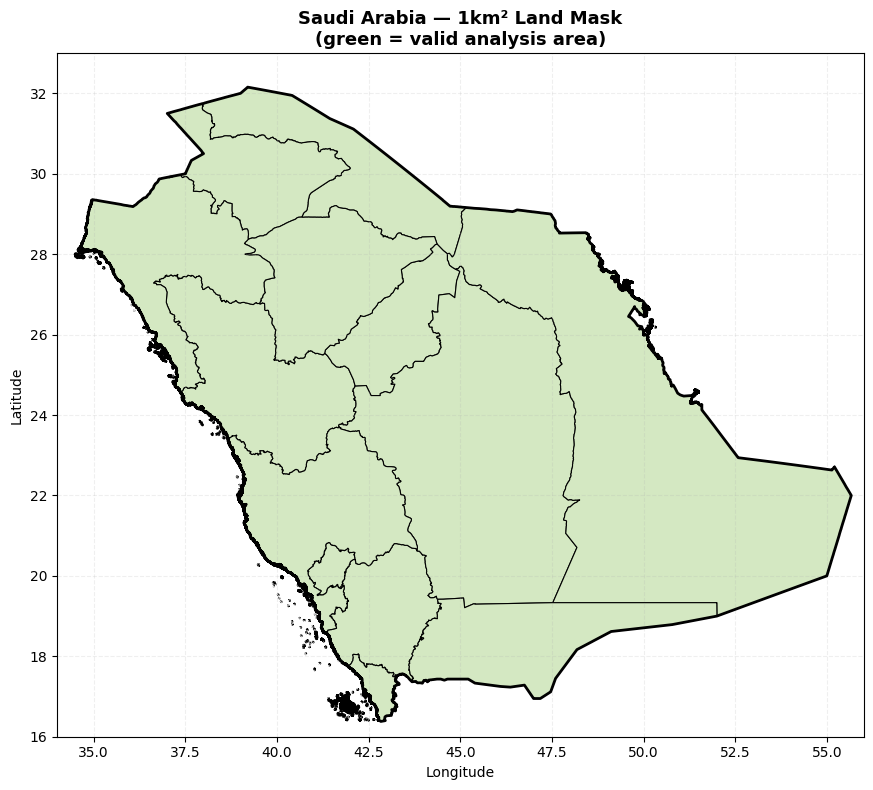

✓ Map saved: outputs/phase2/00_land_mask.png


In [ ]:
# ============================================================================
# CELL 2: Saudi Arabia land mask raster
# Binary raster: 1 = inside Saudi Arabia, 0 = outside
# Applied to every criterion layer to exclude non-Saudi cells
# ============================================================================

from shapely.geometry import mapping

print("Creating Saudi Arabia land mask raster...")

saudi_geom = [(mapping(geom), 1) for geom in saudi_boundary.geometry]

land_mask = rasterize(
    shapes=saudi_geom,
    out_shape=(NROWS, NCOLS),
    transform=TRANSFORM,
    fill=0,
    dtype='uint8'
)

mask_file = 'data/processed/rasters/land_mask.tif'
with rasterio.open(
    mask_file, 'w',
    driver='GTiff',
    height=NROWS, width=NCOLS,
    count=1, dtype='uint8',
    crs=TARGET_CRS,
    transform=TRANSFORM,
    nodata=255
) as dst:
    dst.write(land_mask, 1)

land_cells = int(land_mask.sum())
print(f"✓ Land mask saved: {mask_file}")
print(f"  Land cells:  {land_cells:,} km²")
print(f"  Ocean cells: {NCOLS*NROWS - land_cells:,}")

fig, ax = plt.subplots(figsize=(10, 8))
saudi_provinces_geo.plot(ax=ax, color='#d4e8c2', edgecolor='black', linewidth=0.8)
saudi_boundary_geo.boundary.plot(ax=ax, color='black', linewidth=2)
ax.set_title('Saudi Arabia — 1km² Land Mask\n(green = valid analysis area)',
             fontsize=13, fontweight='bold')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_xlim([34, 56])
ax.set_ylim([16, 33])
ax.grid(True, alpha=0.2, linestyle='--')
plt.tight_layout()
plt.savefig('outputs/phase2/00_land_mask.png', dpi=150, bbox_inches='tight')
plt.show()
print("✓ Map saved: outputs/phase2/00_land_mask.png")



Processing C1 — Renewable Energy Potential...
✓ Loaded 679 NASA POWER points
Interpolating GHI...
  GHI: 5.19–6.75 kWh/m²/day
Interpolating wind speed at 50m...
  Wind: 3.57–6.83 m/s
Distance to renewable projects...
  Distance: 0.0–918.6 km
  C1a — Solar Irradiation (GHI): mean=6.24, range=5.19–6.75
  C1b — Wind Speed at 50m: mean=5.69, range=3.57–6.83
  C1c — Distance to Renewable Projects: mean=232.26, range=0.36–918.60


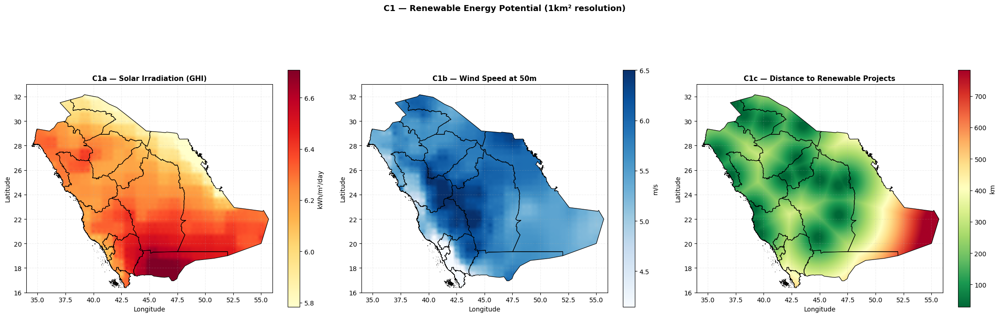

✓ C1 complete — 3 rasters + map saved


In [ ]:
# ============================================================================
# CELL 3: C1 — Renewable Energy Potential
# IDW interpolation of NASA POWER 679 points to 1km² rasters
# Layers: GHI, wind speed at 50m, distance to existing renewable projects
# ============================================================================

print("Processing C1 — Renewable Energy Potential...")

nasa_gdf = gpd.read_file('data/climate/nasa_power_processed.geojson').to_crs(TARGET_CRS)
print(f"✓ Loaded {len(nasa_gdf)} NASA POWER points")

src_pts = np.column_stack([nasa_gdf.geometry.x.values, nasa_gdf.geometry.y.values])

# ---- GHI ----
print("Interpolating GHI...")
ghi_vals = nasa_gdf['ALLSKY_SFC_SW_DWN'].values
ghi_grid = idw_interpolate(src_pts, ghi_vals, grid_pts).reshape(NROWS, NCOLS)
save_raster(ghi_grid, 'data/processed/rasters/c1_ghi.tif')
print(f"  GHI: {ghi_grid[land_mask==1].min():.2f}–{ghi_grid[land_mask==1].max():.2f} kWh/m²/day")

# ---- Wind speed ----
print("Interpolating wind speed at 50m...")
wind_vals = nasa_gdf['WS50M'].values
wind_grid = idw_interpolate(src_pts, wind_vals, grid_pts).reshape(NROWS, NCOLS)
save_raster(wind_grid, 'data/processed/rasters/c1_wind.tif')
print(f"  Wind: {wind_grid[land_mask==1].min():.2f}–{wind_grid[land_mask==1].max():.2f} m/s")

# ---- Distance to renewable projects ----
print("Distance to renewable projects...")
renewable_gdf = gpd.read_file('data/renewable/ksa_renewable_plants.geojson').to_crs(TARGET_CRS)
tree_re = cKDTree(np.column_stack([renewable_gdf.geometry.x, renewable_gdf.geometry.y]))
dist_re, _ = tree_re.query(grid_pts, k=1)
dist_re_grid = dist_re.reshape(NROWS, NCOLS) / 1000
save_raster(dist_re_grid, 'data/processed/rasters/c1_dist_renewable.tif')
print(f"  Distance: {dist_re_grid[land_mask==1].min():.1f}–{dist_re_grid[land_mask==1].max():.1f} km")

# ---- Visualisation ----
fig, axes = plt.subplots(1, 3, figsize=(22, 8))

c1_specs = [
    ('data/processed/rasters/c1_ghi.tif',
     'YlOrRd',   'C1a — Solar Irradiation (GHI)', 'kWh/m²/day'),
    ('data/processed/rasters/c1_wind.tif',
     'Blues',    'C1b — Wind Speed at 50m',        'm/s'),
    ('data/processed/rasters/c1_dist_renewable.tif',
     'RdYlGn_r', 'C1c — Distance to Renewable Projects', 'km'),
]

for ax, (tif, cmap, title, cbar) in zip(axes, c1_specs):
    mean, lo, hi = plot_raster_geo(ax, tif, cmap, title, cbar)
    print(f"  {title}: mean={mean:.2f}, range={lo:.2f}–{hi:.2f}")

plt.suptitle('C1 — Renewable Energy Potential (1km² resolution)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('outputs/phase2/01_c1_renewable.png', dpi=200, bbox_inches='tight')
plt.show()
print("✓ C1 complete — 3 rasters + map saved")


  Raster extent: lon 34.08–56.64, lat 16.14–32.29
  Value range:   5.190 – 6.751  (plotting 5.782 – 6.709)
  → C1a — Solar Irradiation (GHI): mean=6.24, range=5.19–6.75

  Raster extent: lon 34.08–56.64, lat 16.14–32.29
  Value range:   3.570 – 6.830  (plotting 4.143 – 6.503)
  → C1b — Wind Speed at 50m: mean=5.69, range=3.57–6.83

  Raster extent: lon 34.08–56.64, lat 16.14–32.29
  Value range:   0.364 – 918.601  (plotting 28.293 – 783.397)
  → C1c — Distance to Renewable Projects: mean=232.26, range=0.36–918.60



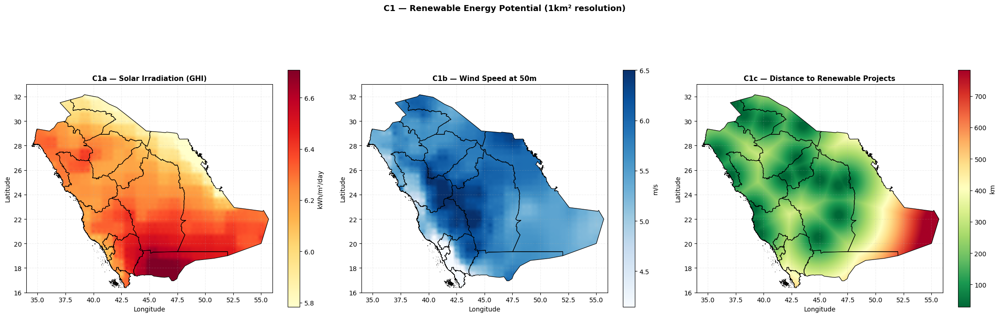

✓ C1 map saved


In [ ]:
from rasterio.warp import calculate_default_transform, reproject, Resampling
import rasterio
import numpy as np
import matplotlib.pyplot as plt

saudi_provinces_geo = gpd.read_file('data/boundaries/saudi_provinces.geojson')

def plot_raster_geo(ax, tif_path, cmap, title, cbar_label, vmin=None, vmax=None):

    with rasterio.open(tif_path) as src:

        dst_crs = 'EPSG:4326'
        transform_4326, width_4326, height_4326 = calculate_default_transform(
            src.crs, dst_crs, src.width, src.height, *src.bounds
        )

        data_4326 = np.empty((height_4326, width_4326), dtype='float32')

        reproject(
            source=rasterio.band(src, 1),
            destination=data_4326,
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=transform_4326,
            dst_crs=dst_crs,
            resampling=Resampling.bilinear
        )

        # FIXED: correct unpacking order — array_bounds returns (left, bottom, right, top)
        left, bottom, right, top = rasterio.transform.array_bounds(
            height_4326, width_4326, transform_4326
        )

        # Replace nodata with nan
        data_4326 = np.where(data_4326 <= -9000, np.nan, data_4326)

        valid = data_4326[~np.isnan(data_4326)]

        if len(valid) == 0:
            print(f"  ⚠ No valid data found in {tif_path}")
            return 0, 0, 0

        v_lo = vmin if vmin is not None else np.percentile(valid, 2)
        v_hi = vmax if vmax is not None else np.percentile(valid, 98)

        print(f"  Raster extent: lon {left:.2f}–{right:.2f}, lat {bottom:.2f}–{top:.2f}")
        print(f"  Value range:   {valid.min():.3f} – {valid.max():.3f}  "
              f"(plotting {v_lo:.3f} – {v_hi:.3f})")

        # FIXED extent order for imshow: [left, right, bottom, top]
        im = ax.imshow(
            data_4326, cmap=cmap, origin='upper',
            extent=[left, right, bottom, top],
            vmin=v_lo, vmax=v_hi,
            aspect='auto', zorder=1
        )
        plt.colorbar(im, ax=ax, shrink=0.7, label=cbar_label)

        # Province boundaries drawn ON TOP of raster
        saudi_provinces_geo.boundary.plot(ax=ax, color='black',
                                           linewidth=0.8, zorder=2)
        ax.set_xlim([34, 56])
        ax.set_ylim([16, 33])
        ax.set_title(title, fontsize=11, fontweight='bold')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
        ax.grid(True, alpha=0.2, linestyle='--', zorder=0)

        return valid.mean(), valid.min(), valid.max()


fig, axes = plt.subplots(1, 3, figsize=(22, 8))

specs = [
    ('data/processed/rasters/c1_ghi.tif',
     'YlOrRd',   'C1a — Solar Irradiation (GHI)', 'kWh/m²/day'),

    ('data/processed/rasters/c1_wind.tif',
     'Blues',    'C1b — Wind Speed at 50m',        'm/s'),

    ('data/processed/rasters/c1_dist_renewable.tif',
     'RdYlGn_r', 'C1c — Distance to Renewable Projects', 'km'),
]

for ax, (tif, cmap, title, cbar) in zip(axes, specs):
    mean, lo, hi = plot_raster_geo(ax, tif, cmap, title, cbar)
    print(f"  → {title}: mean={mean:.2f}, range={lo:.2f}–{hi:.2f}\n")

plt.suptitle('C1 — Renewable Energy Potential (1km² resolution)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('outputs/phase2/01_c1_renewable.png', dpi=200, bbox_inches='tight')
plt.show()
print("✓ C1 map saved")

Processing C2 — Cooling Suitability...
Mean annual temperature...
  T2M: 18.9–30.8°C
Mean daily maximum temperature...
  T_MAX: 36.6–51.2°C
Hours above 35°C...
  Hours >35°C: 458–3353 hrs/yr
Wet-bulb temperature...
  Wet-bulb: 10.6–25.1°C
Relative humidity...
  RH: 21.7–68.0%
  Raster extent: lon 34.08–56.64, lat 16.14–32.29
  Value range:   18.941 – 30.758  (plotting 20.360 – 29.760)
  C2a — Mean Annual Temperature: mean=25.68, range=18.94–30.76
  Raster extent: lon 34.08–56.64, lat 16.14–32.29
  Value range:   36.613 – 51.249  (plotting 40.966 – 50.287)
  C2b — Mean Daily Max Temperature: mean=46.79, range=36.61–51.25
  Raster extent: lon 34.08–56.64, lat 16.14–32.29
  Value range:   458.055 – 3352.437  (plotting 1564.383 – 3243.019)
  C2c — Hours Above 35°C per Year: mean=2454.20, range=458.05–3352.44
  Raster extent: lon 34.08–56.64, lat 16.14–32.29
  Value range:   10.621 – 25.105  (plotting 11.557 – 19.830)
  C2d — Wet-Bulb Temperature (Stull 2011): mean=14.70, range=10.62–25.11


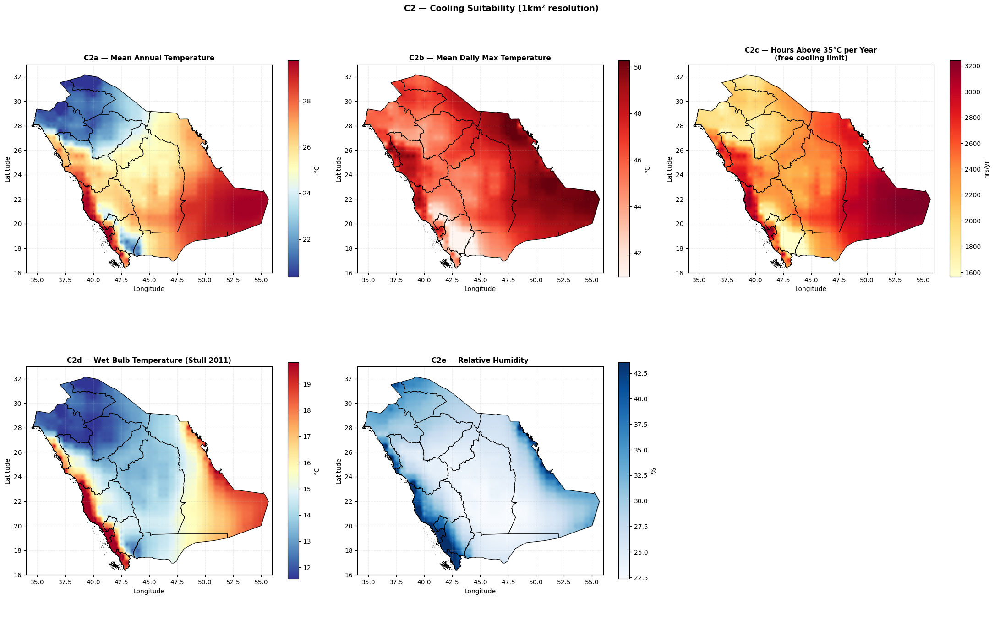


✓ C2 complete — 5 rasters + map saved


In [ ]:
# ============================================================================
# CELL 4: C2 — Cooling Suitability
# Layers: mean temperature, daily max temperature, hours above 35°C,
#         wet-bulb temperature, relative humidity
# 35°C threshold: outdoor temperature above which free cooling fails and
# expensive mechanical cooling must run instead (ASHRAE Standard 55)
# ============================================================================

print("Processing C2 — Cooling Suitability...")

nasa_gdf = gpd.read_file('data/climate/nasa_power_processed.geojson').to_crs(TARGET_CRS)
src_pts  = np.column_stack([nasa_gdf.geometry.x.values, nasa_gdf.geometry.y.values])

# ---- Mean temperature ----
print("Mean annual temperature...")
t2m_vals = nasa_gdf['T2M'].values
t2m_grid = idw_interpolate(src_pts, t2m_vals, grid_pts).reshape(NROWS, NCOLS)
save_raster(t2m_grid, 'data/processed/rasters/c2_temp_mean.tif')
print(f"  T2M: {t2m_grid[land_mask==1].min():.1f}–{t2m_grid[land_mask==1].max():.1f}°C")

# ---- Daily maximum temperature ----
print("Mean daily maximum temperature...")
tmax_vals = nasa_gdf['T2M_MAX'].values
tmax_grid = idw_interpolate(src_pts, tmax_vals, grid_pts).reshape(NROWS, NCOLS)
save_raster(tmax_grid, 'data/processed/rasters/c2_temp_max.tif')
print(f"  T_MAX: {tmax_grid[land_mask==1].min():.1f}–{tmax_grid[land_mask==1].max():.1f}°C")

# ---- Hours above 35°C (degree-day proxy, Turek & Radgen 2021) ----
print("Hours above 35°C...")
temp_range    = np.where(tmax_grid - t2m_grid > 0, tmax_grid - t2m_grid, 0.1)
hours_above35 = np.where(
    tmax_grid <= 35, 0,
    np.clip((tmax_grid - 35) / temp_range * 12, 0, 12) * 365
)
save_raster(hours_above35, 'data/processed/rasters/c2_hours_above35.tif')
print(f"  Hours >35°C: {hours_above35[land_mask==1].min():.0f}–{hours_above35[land_mask==1].max():.0f} hrs/yr")

# ---- Wet-bulb temperature (Stull 2011) ----
print("Wet-bulb temperature...")
wb_vals = nasa_gdf['T_WETBULB'].values
wb_grid = idw_interpolate(src_pts, wb_vals, grid_pts).reshape(NROWS, NCOLS)
save_raster(wb_grid, 'data/processed/rasters/c2_wetbulb.tif')
print(f"  Wet-bulb: {wb_grid[land_mask==1].min():.1f}–{wb_grid[land_mask==1].max():.1f}°C")

# ---- Relative humidity ----
print("Relative humidity...")
rh_vals = nasa_gdf['RH2M'].values
rh_grid = idw_interpolate(src_pts, rh_vals, grid_pts).reshape(NROWS, NCOLS)
save_raster(rh_grid, 'data/processed/rasters/c2_humidity.tif')
print(f"  RH: {rh_grid[land_mask==1].min():.1f}–{rh_grid[land_mask==1].max():.1f}%")

# ---- Visualisation ----
fig, axes = plt.subplots(2, 3, figsize=(22, 14))
axes = axes.ravel()

c2_specs = [
    ('data/processed/rasters/c2_temp_mean.tif',
     'RdYlBu_r', 'C2a — Mean Annual Temperature', '°C'),
    ('data/processed/rasters/c2_temp_max.tif',
     'Reds',     'C2b — Mean Daily Max Temperature', '°C'),
    ('data/processed/rasters/c2_hours_above35.tif',
     'YlOrRd',   'C2c — Hours Above 35°C per Year\n(free cooling limit)', 'hrs/yr'),
    ('data/processed/rasters/c2_wetbulb.tif',
     'RdYlBu_r', 'C2d — Wet-Bulb Temperature (Stull 2011)', '°C'),
    ('data/processed/rasters/c2_humidity.tif',
     'Blues',    'C2e — Relative Humidity', '%'),
]

for i, (tif, cmap, title, cbar) in enumerate(c2_specs):
    mean, lo, hi = plot_raster_geo(axes[i], tif, cmap, title, cbar)
    print(f"  {title.split(chr(10))[0]}: mean={mean:.2f}, range={lo:.2f}–{hi:.2f}")

axes[5].axis('off')

plt.suptitle('C2 — Cooling Suitability (1km² resolution)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('outputs/phase2/02_c2_cooling.png', dpi=200, bbox_inches='tight')
plt.show()
print("\n✓ C2 complete — 5 rasters + map saved")


In [ ]:
import shutil, os

# Restore from Drive backup if it exists there
drive_backup = '/content/drive/MyDrive/Saudi DC data/saudi_substations.geojson'

if os.path.exists(drive_backup):
    shutil.copy(drive_backup, 'data/osm/saudi_substations.geojson')
    print("✓ Restored from Google Drive backup")

else:
    # Fallback: derive substation locations from transmission line intersections
    # Where two high-voltage lines cross = likely substation location
    print("Creating proxy substation dataset from transmission line intersections...")
    import geopandas as gpd
    from shapely.ops import unary_union
    from shapely.geometry import Point
    import numpy as np

    trans_gdf = gpd.read_file('data/osm/saudi_transmission.geojson')
    trans_proj = trans_gdf.to_crs('EPSG:32638')

    # Find intersections between transmission lines
    intersections = []
    geoms = trans_proj.geometry.tolist()

    for i in range(min(len(geoms), 500)):   # limit to avoid long runtime
        for j in range(i+1, min(len(geoms), 500)):
            if geoms[i].intersects(geoms[j]):
                pt = geoms[i].intersection(geoms[j])
                if pt.geom_type == 'Point':
                    intersections.append({'geometry': pt, 'source': 'intersection'})

    if intersections:
        subs_gdf = gpd.GeoDataFrame(intersections, crs='EPSG:32638').to_crs('EPSG:4326')
        subs_gdf.to_file('data/osm/saudi_substations.geojson', driver='GeoJSON')
        print(f"✓ Created {len(subs_gdf)} proxy substation locations")
        print("  Note: proxy derived from line intersections — acknowledge as limitation")
    else:
        print("✗ No intersections found — skipping substation layer")
        print("  Cell 5 will still run using transmission lines only")

✓ Restored from Google Drive backup


Processing C4 — Fiber & Connectivity...
✓ Subsea landing stations: 3
  - Jeddah Cable Station
  - Dammam Cable Station
  - Al Khobar Cable Station
  Distance: 0.5–1186.0 km
  Raster extent: lon 34.08–56.64, lat 16.14–32.29
  Value range:   0.651 – 1185.976  (plotting 113.487 – 1054.594)
  Mean distance: 566.6 km, range: 0.7–1186.0 km


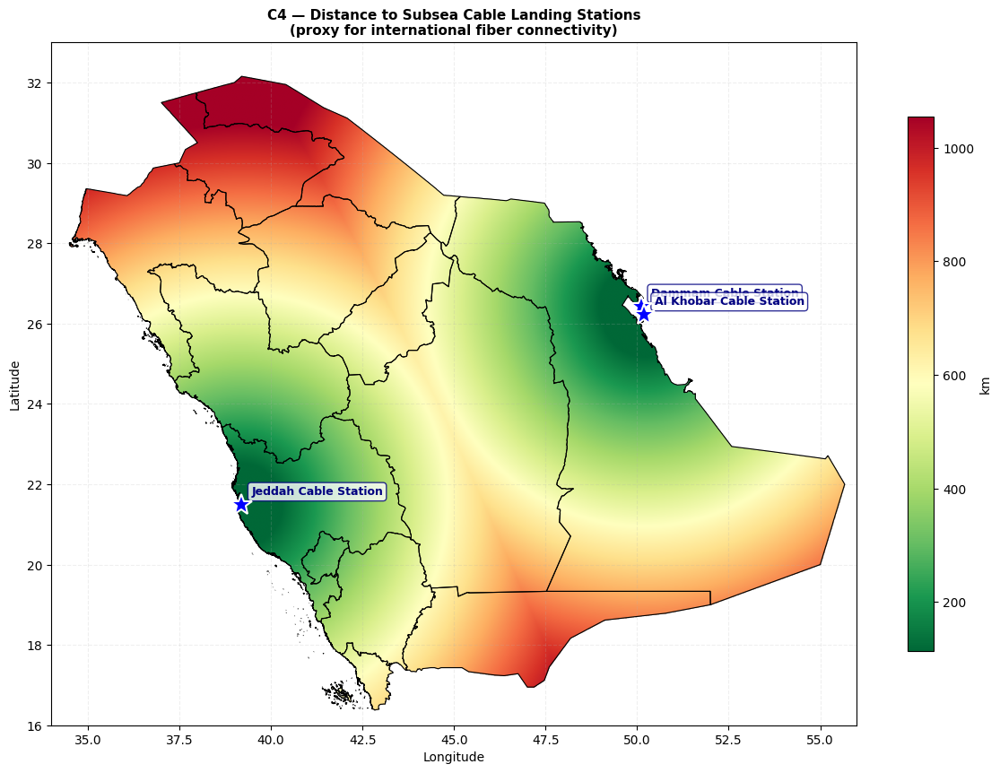


✓ C4 complete — 1 raster + map saved
  Note: Terrestrial fiber excluded — OSM returned 0 features for Saudi Arabia
  Subsea cable proximity used as connectivity proxy for hyperscale traffic


In [ ]:
# ============================================================================
# CELL 6 (RESTORED): C4 — Fiber & Connectivity
# Uses subsea cable landing stations — NOT the empty fiber file
# saudi_fiber.geojson has 0 features (confirmed in Phase 1)
# Subsea stations are the correct proxy for international connectivity
# ============================================================================

print("Processing C4 — Fiber & Connectivity...")

# Check if subsea file exists locally, restore from Drive if not
subsea_path = 'data/connectivity/subsea_landing_stations.geojson'

if not os.path.exists(subsea_path):
    print("  File not found locally — restoring from Drive...")
    import shutil
    drive_path = '/content/drive/MyDrive/Saudi DC data/subsea_landing_stations.geojson'
    if os.path.exists(drive_path):
        os.makedirs('data/connectivity', exist_ok=True)
        shutil.copy(drive_path, subsea_path)
        print("  ✓ Restored from Drive")
    else:
        # Recreate the 3 known stations manually
        print("  Recreating known Saudi subsea landing stations...")
        from shapely.geometry import Point
        known = {
            'name':      ['Jeddah Cable Station',
                          'Dammam Cable Station',
                          'Al Khobar Cable Station'],
            'country':   ['Saudi Arabia'] * 3,
            'latitude':  [21.4858, 26.4207, 26.2172],
            'longitude': [39.1925, 50.1033, 50.1978],
        }
        df_known = pd.DataFrame(known)
        geom = [Point(xy) for xy in zip(df_known['longitude'], df_known['latitude'])]
        subsea_gdf = gpd.GeoDataFrame(df_known, geometry=geom, crs='EPSG:4326')
        os.makedirs('data/connectivity', exist_ok=True)
        subsea_gdf.to_file(subsea_path, driver='GeoJSON')
        print(f"  ✓ Created {len(subsea_gdf)} known stations")

subsea_gdf = gpd.read_file(subsea_path).to_crs(TARGET_CRS)
print(f"✓ Subsea landing stations: {len(subsea_gdf)}")
for idx, row in subsea_gdf.iterrows():
    print(f"  - {row['name']}")

# ---- Distance raster ----
subsea_pts  = np.column_stack([subsea_gdf.geometry.x, subsea_gdf.geometry.y])
tree_subsea = cKDTree(subsea_pts)
dist_subsea, _ = tree_subsea.query(grid_pts, k=1)
dist_subsea_grid = dist_subsea.reshape(NROWS, NCOLS) / 1000
save_raster(dist_subsea_grid, 'data/processed/rasters/c4_dist_subsea.tif')
print(f"  Distance: {dist_subsea_grid[land_mask==1].min():.1f}–"
      f"{dist_subsea_grid[land_mask==1].max():.1f} km")

# ---- Visualisation ----
fig, ax = plt.subplots(figsize=(12, 9))

mean, lo, hi = plot_raster_geo(
    ax,
    'data/processed/rasters/c4_dist_subsea.tif',
    'RdYlGn_r',
    'C4 — Distance to Subsea Cable Landing Stations\n'
    '(proxy for international fiber connectivity)',
    'km'
)
print(f"  Mean distance: {mean:.1f} km, range: {lo:.1f}–{hi:.1f} km")

# Overlay station markers
subsea_geo = subsea_gdf.to_crs('EPSG:4326')
for idx, row in subsea_geo.iterrows():
    ax.plot(row.geometry.x, row.geometry.y, 'b*',
            markersize=18, markeredgecolor='white',
            markeredgewidth=1.5, zorder=5)
    ax.annotate(row['name'],
                xy=(row.geometry.x, row.geometry.y),
                xytext=(8, 8), textcoords='offset points',
                fontsize=9, fontweight='bold', color='navy',
                bbox=dict(boxstyle='round,pad=0.3', facecolor='white',
                          alpha=0.8, edgecolor='navy'))

plt.tight_layout()
plt.savefig('outputs/phase2/04_c4_connectivity.png', dpi=200, bbox_inches='tight')
plt.show()
print("\n✓ C4 complete — 1 raster + map saved")
print("  Note: Terrestrial fiber excluded — OSM returned 0 features for Saudi Arabia")
print("  Subsea cable proximity used as connectivity proxy for hyperscale traffic")

Processing C5 — Water Availability...
✓ Desalination plants: 16
✓ Aquifer polygons:    21
✓ Salinity segments:   9025
Distance to desalination plants...
  Distance: 0.0–995.0 km
Distance to aquifer boundaries...
  Distance: 0.0–313.8 km
Coastal salinity surface...
  Salinity: 35.9–39.8 PSU
  Raster extent: lon 34.08–56.64, lat 16.14–32.29
  Value range:   0.427 – 994.531  (plotting 48.238 – 847.222)
  C5a — Distance to Desalination Plants: mean=443.12, range=0.43–994.53
  Raster extent: lon 34.08–56.64, lat 16.14–32.29
  Value range:   0.063 – 313.711  (plotting 2.388 – 240.652)
  C5b — Distance to Aquifer Boundary: mean=75.01, range=0.06–313.71
  Raster extent: lon 34.08–56.64, lat 16.14–32.29
  Value range:   35.868 – 39.773  (plotting 35.965 – 39.764)
  C5c — Coastal Salinity (lower=better): mean=38.82, range=35.87–39.77


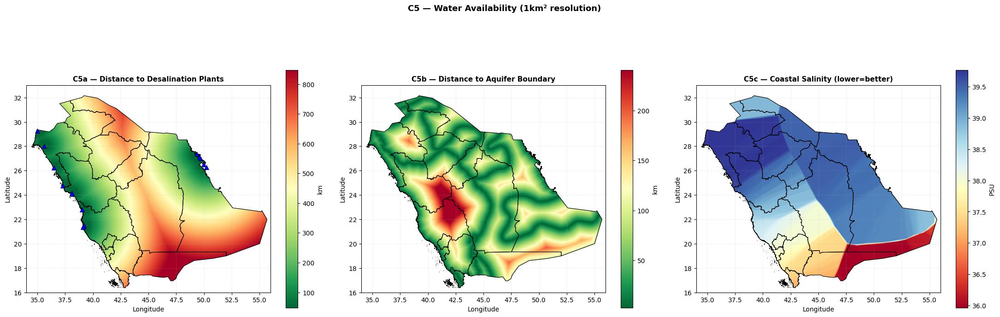


✓ C5 complete — 3 rasters + map saved


In [ ]:
# ============================================================================
# CELL 7: C5 — Water Availability
# Three sub-layers:
#   (a) Distance to nearest desalination plant
#   (b) Distance to nearest aquifer polygon boundary
#   (c) Coastal salinity surface (Red Sea preferred over Arabian Gulf)
# ============================================================================

print("Processing C5 — Water Availability...")

desal_gdf   = gpd.read_file('data/water/ksa_desalination_plants.geojson').to_crs(TARGET_CRS)
aquifer_gdf = gpd.read_file('data/water/ksa_aquifers.geojson').to_crs(TARGET_CRS)
salinity_df = pd.read_csv('data/water/ksa_coast_salinity_cmems.csv')

print(f"✓ Desalination plants: {len(desal_gdf)}")
print(f"✓ Aquifer polygons:    {len(aquifer_gdf)}")
print(f"✓ Salinity segments:   {len(salinity_df)}")

# ---- Distance to desalination plants ----
print("Distance to desalination plants...")
desal_pts  = np.column_stack([desal_gdf.geometry.x, desal_gdf.geometry.y])
tree_desal = cKDTree(desal_pts)
dist_desal, _ = tree_desal.query(grid_pts, k=1)
dist_desal_grid = dist_desal.reshape(NROWS, NCOLS) / 1000
save_raster(dist_desal_grid, 'data/processed/rasters/c5_dist_desalination.tif')
print(f"  Distance: {dist_desal_grid[land_mask==1].min():.1f}–{dist_desal_grid[land_mask==1].max():.1f} km")

# ---- Distance to aquifer boundaries ----
print("Distance to aquifer boundaries...")
aquifer_sample_pts = []
for geom in aquifer_gdf.geometry:
    if geom is None:
        continue
    boundary = geom.boundary
    boundaries = list(boundary.geoms) if boundary.geom_type == 'MultiLineString' else [boundary]
    for line in boundaries:
        if line.is_empty or line.geom_type != 'LineString':
            continue
        n_pts = max(2, int(line.length / 5000))
        for i in range(n_pts + 1):
            pt = line.interpolate(i / n_pts, normalized=True)
            aquifer_sample_pts.append([pt.x, pt.y])

if aquifer_sample_pts:
    aq_arr     = np.array(aquifer_sample_pts)
    tree_aq    = cKDTree(aq_arr)
    dist_aq, _ = tree_aq.query(grid_pts, k=1)
    dist_aq_grid = dist_aq.reshape(NROWS, NCOLS) / 1000
else:
    dist_aq_grid = np.full((NROWS, NCOLS), 999.0)

save_raster(dist_aq_grid, 'data/processed/rasters/c5_dist_aquifer.tif')
print(f"  Distance: {dist_aq_grid[land_mask==1].min():.1f}–{dist_aq_grid[land_mask==1].max():.1f} km")

# ---- Coastal salinity surface (IDW from CMEMS points) ----
print("Coastal salinity surface...")
sal_gdf = gpd.GeoDataFrame(
    salinity_df,
    geometry=gpd.points_from_xy(salinity_df['longitude'], salinity_df['latitude']),
    crs='EPSG:4326'
).to_crs(TARGET_CRS)

sal_pts  = np.column_stack([sal_gdf.geometry.x, sal_gdf.geometry.y])
sal_vals = sal_gdf['salinity_psu'].values
sal_grid = idw_interpolate(sal_pts, sal_vals, grid_pts,
                           power=2, n_neighbours=4).reshape(NROWS, NCOLS)
sal_masked = np.where(land_mask == 1, sal_grid, np.nan)
save_raster(sal_masked, 'data/processed/rasters/c5_coastal_salinity.tif')
print(f"  Salinity: {np.nanmin(sal_masked):.1f}–{np.nanmax(sal_masked):.1f} PSU")

# ---- Visualisation ----
fig, axes = plt.subplots(1, 3, figsize=(22, 8))

c5_specs = [
    ('data/processed/rasters/c5_dist_desalination.tif',
     'RdYlGn_r', 'C5a — Distance to Desalination Plants', 'km'),
    ('data/processed/rasters/c5_dist_aquifer.tif',
     'RdYlGn_r', 'C5b — Distance to Aquifer Boundary', 'km'),
    ('data/processed/rasters/c5_coastal_salinity.tif',
     'RdYlBu',   'C5c — Coastal Salinity (lower=better)', 'PSU'),
]

for ax, (tif, cmap, title, cbar) in zip(axes, c5_specs):
    mean, lo, hi = plot_raster_geo(ax, tif, cmap, title, cbar)
    print(f"  {title}: mean={mean:.2f}, range={lo:.2f}–{hi:.2f}")

desal_geo = desal_gdf.to_crs('EPSG:4326')
for idx, row in desal_geo.iterrows():
    axes[0].plot(row.geometry.x, row.geometry.y, 'b^',
                 markersize=7, markeredgecolor='black',
                 markeredgewidth=0.5, zorder=5)

plt.suptitle('C5 — Water Availability (1km² resolution)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('outputs/phase2/05_c5_water.png', dpi=200, bbox_inches='tight')
plt.show()
print("\n✓ C5 complete — 3 rasters + map saved")


Processing C6 — Seismic & Security Risk...
Creating seismic PGA raster...
  PGA: 0.03–0.20g
Creating Yemen border distance raster...
  Distance: 18–1455 km
  Raster extent: lon 34.08–56.64, lat 16.14–32.29
  Value range:   0.030 – 0.200  (plotting 0.030 – 0.200)
  C6a — Seismic Hazard PGA (10%/50yr): mean=0.07, range=0.03–0.20
  Raster extent: lon 34.08–56.64, lat 16.14–32.29
  Value range:   17.900 – 1455.000  (plotting 161.100 – 1455.000)
  C6b — Distance from Yemen Border: mean=803.48, range=17.90–1455.00


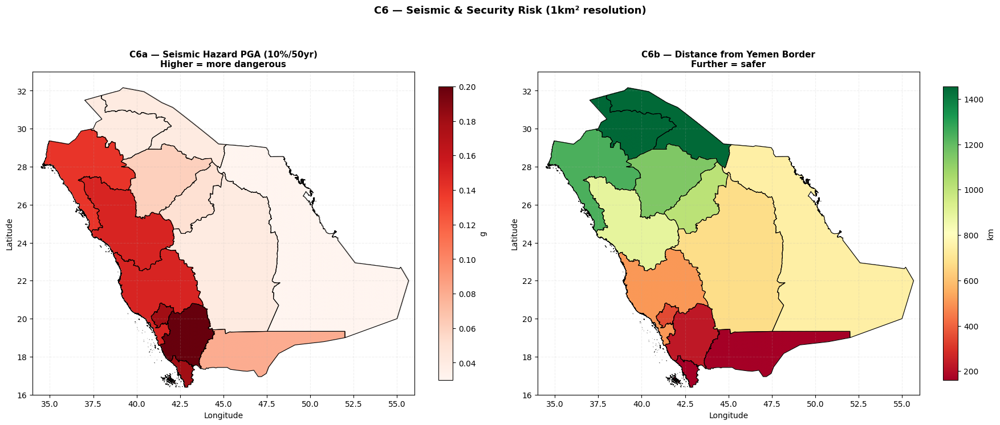


✓ C6 complete — 2 rasters + map saved


In [ ]:
# ============================================================================
# CELL 8: C6 — Seismic & Security Risk
# Two sub-layers:
#   (a) Seismic PGA — province-level values from Al-Haddad (1994)
#   (b) Distance from Yemen border — Abqaiq 2019 attack documented
# ============================================================================

print("Processing C6 — Seismic & Security Risk...")

border_gdf = gpd.read_file('data/security/ksa_border_distances.geojson').to_crs(TARGET_CRS)

province_pga = {
    'Tabuk':                    0.14,
    'Al Madinah':               0.15,
    'Makkah':                   0.15,
    "'Asir":                    0.20,
    'Al Bahah':                 0.18,
    'Jizan':                    0.18,
    'Najran':                   0.08,
    'Ar Riyad':                 0.04,
    'Ash-Sharqīyah':            0.03,
    'Al Qassim':                0.05,
    "Ḥaʼil":                   0.06,
    'Al Jawf':                  0.04,
    'Al Hudud ash Shamaliyah':  0.04,
}

saudi_provinces_pga = saudi_provinces.copy()
saudi_provinces_pga['pga_g'] = (
    saudi_provinces_pga['NAME_1'].map(province_pga).fillna(0.05)
)

# ---- Seismic PGA raster ----
print("Creating seismic PGA raster...")
pga_raster = np.full((NROWS, NCOLS), NODATA_VAL, dtype='float32')
for _, row in saudi_provinces_pga.iterrows():
    mask_prov = rasterize(
        [(row.geometry.__geo_interface__, 1)],
        out_shape=(NROWS, NCOLS),
        transform=TRANSFORM,
        fill=0, dtype='uint8'
    )
    pga_raster[mask_prov == 1] = row['pga_g']

save_raster(pga_raster, 'data/processed/rasters/c6_seismic_pga.tif')
print(f"  PGA: {pga_raster[land_mask==1].min():.2f}–{pga_raster[land_mask==1].max():.2f}g")

# ---- Yemen border distance raster ----
print("Creating Yemen border distance raster...")
yemen_raster = np.full((NROWS, NCOLS), NODATA_VAL, dtype='float32')
for _, row in border_gdf.iterrows():
    mask_prov = rasterize(
        [(row.geometry.__geo_interface__, 1)],
        out_shape=(NROWS, NCOLS),
        transform=TRANSFORM,
        fill=0, dtype='uint8'
    )
    yemen_raster[mask_prov == 1] = row['dist_yemen_km']

save_raster(yemen_raster, 'data/processed/rasters/c6_dist_yemen.tif')
print(f"  Distance: {yemen_raster[land_mask==1].min():.0f}–{yemen_raster[land_mask==1].max():.0f} km")

# ---- Visualisation ----
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

c6_specs = [
    ('data/processed/rasters/c6_seismic_pga.tif',
     'Reds',   'C6a — Seismic Hazard PGA (10%/50yr)\nHigher = more dangerous', 'g'),
    ('data/processed/rasters/c6_dist_yemen.tif',
     'RdYlGn', 'C6b — Distance from Yemen Border\nFurther = safer', 'km'),
]

for ax, (tif, cmap, title, cbar) in zip(axes, c6_specs):
    mean, lo, hi = plot_raster_geo(ax, tif, cmap, title, cbar)
    print(f"  {title.split(chr(10))[0]}: mean={mean:.2f}, range={lo:.2f}–{hi:.2f}")

plt.suptitle('C6 — Seismic & Security Risk (1km² resolution)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('outputs/phase2/06_c6_security.png', dpi=200, bbox_inches='tight')
plt.show()
print("\n✓ C6 complete — 2 rasters + map saved")


Processing C7 — Economic Viability...
✓ MODON cities: 27
✓ SEZ zones:    11
Distance to MODON industrial cities...
  Distance: 0.1–868.6 km
Distance to Special Economic Zones...
  Distance: 0.1–1003.5 km
  Raster extent: lon 34.08–56.64, lat 16.14–32.29
  Value range:   0.379 – 868.557  (plotting 28.084 – 756.258)
  C7a — Distance to MODON Industrial Cities: mean=247.19, range=0.38–868.56
  Raster extent: lon 34.08–56.64, lat 16.14–32.29
  Value range:   0.487 – 1003.514  (plotting 46.406 – 845.465)
  C7b — Distance to Special Economic Zones: mean=330.40, range=0.49–1003.51


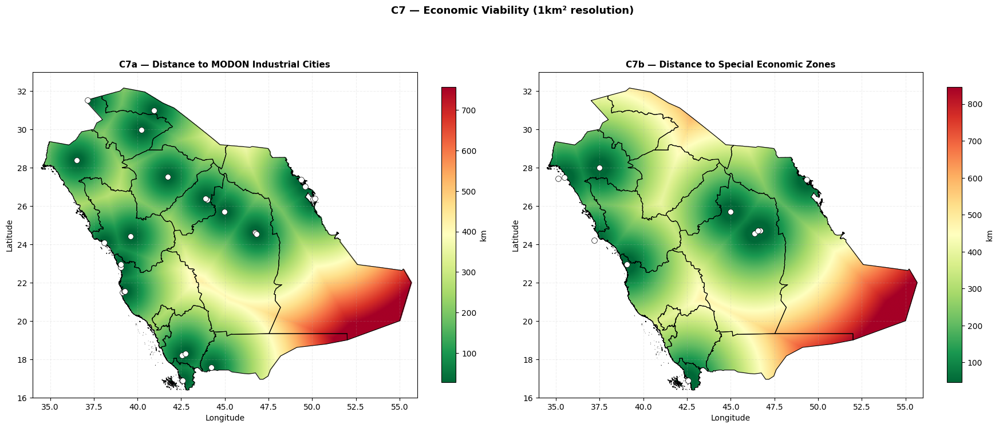


✓ C7 complete — 2 rasters + map saved


In [ ]:
# ============================================================================
# CELL 9: C7 — Economic Viability (Updated with white circle markers)
# ============================================================================

print("Processing C7 — Economic Viability...")

modon_gdf = gpd.read_file('data/economic/modon_industrial_cities.geojson').to_crs(TARGET_CRS)
sez_gdf   = gpd.read_file('data/economic/ksa_sez_locations.geojson').to_crs(TARGET_CRS)

print(f"✓ MODON cities: {len(modon_gdf)}")
print(f"✓ SEZ zones:    {len(sez_gdf)}")

# ---- Distance to MODON ----
print("Distance to MODON industrial cities...")
modon_pts  = np.column_stack([modon_gdf.geometry.x, modon_gdf.geometry.y])
tree_modon = cKDTree(modon_pts)
dist_modon, _ = tree_modon.query(grid_pts, k=1)
dist_modon_grid = dist_modon.reshape(NROWS, NCOLS) / 1000
save_raster(dist_modon_grid, 'data/processed/rasters/c7_dist_modon.tif')
print(f"  Distance: {dist_modon_grid[land_mask==1].min():.1f}–{dist_modon_grid[land_mask==1].max():.1f} km")

# ---- Distance to SEZ ----
print("Distance to Special Economic Zones...")
sez_pts  = np.column_stack([sez_gdf.geometry.x, sez_gdf.geometry.y])
tree_sez = cKDTree(sez_pts)
dist_sez, _ = tree_sez.query(grid_pts, k=1)
dist_sez_grid = dist_sez.reshape(NROWS, NCOLS) / 1000
save_raster(dist_sez_grid, 'data/processed/rasters/c7_dist_sez.tif')
print(f"  Distance: {dist_sez_grid[land_mask==1].min():.1f}–{dist_sez_grid[land_mask==1].max():.1f} km")

# ---- Visualisation ----
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

c7_specs = [
    ('data/processed/rasters/c7_dist_modon.tif',
     'RdYlGn_r', 'C7a — Distance to MODON Industrial Cities', 'km'),
    ('data/processed/rasters/c7_dist_sez.tif',
     'RdYlGn_r', 'C7b — Distance to Special Economic Zones', 'km'),
]

# Changed 'rs' and 'g*' to 'wo' (White Circle)
pt_layers = [
    (modon_gdf.to_crs('EPSG:4326'), 'wo', 7),
    (sez_gdf.to_crs('EPSG:4326'),   'wo', 7),
]

for ax, (tif, cmap, title, cbar), (pts, marker, ms) in zip(axes, c7_specs, pt_layers):
    mean, lo, hi = plot_raster_geo(ax, tif, cmap, title, cbar)
    print(f"  {title}: mean={mean:.2f}, range={lo:.2f}–{hi:.2f}")
    for idx, row in pts.iterrows():
        ax.plot(row.geometry.x, row.geometry.y, marker,
                markersize=ms, markeredgecolor='black', # Black edge helps white circles stand out
                markeredgewidth=0.5, zorder=5)

plt.suptitle('C7 — Economic Viability (1km² resolution)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('outputs/phase2/07_c7_economic.png', dpi=200, bbox_inches='tight')
plt.show()
print("\n✓ C7 complete — 2 rasters + map saved")

In [ ]:
# ============================================================================
# RECOVERY CELL: Redefine helper functions lost after session reset
# Run this before Cell 10 if you get NameError for any helper function
# ============================================================================

import rasterio
import numpy as np
from rasterio.warp import calculate_default_transform, reproject, Resampling
import geopandas as gpd
import matplotlib.pyplot as plt

NODATA_VAL = -9999.0

saudi_provinces_geo = gpd.read_file('data/boundaries/saudi_provinces.geojson')

# Reload land mask from saved file
with rasterio.open('data/processed/rasters/land_mask.tif') as src:
    land_mask = src.read(1)
print(f"✓ Land mask reloaded: {land_mask.sum():,} land cells")

def load_raster_array(filepath):
    """Load raster as numpy array replacing nodata with nan"""
    with rasterio.open(filepath) as src:
        arr = src.read(1).astype('float32')
        if src.nodata is not None:
            arr[arr == src.nodata] = np.nan
        arr[arr <= -9000] = np.nan
    return arr

def save_normalised_raster(array, filepath):
    with rasterio.open('data/processed/rasters/land_mask.tif') as ref:
        meta = ref.meta.copy()
    meta.update({'dtype': 'float32', 'nodata': np.nan})
    with rasterio.open(filepath, 'w', **meta) as dst:
        dst.write(array, 1)

def minmax_normalise(array, invert=False, mask=None):
    valid = array[mask == 1] if mask is not None else array[array > NODATA_VAL]
    valid = valid[~np.isnan(valid)]
    vmin  = np.percentile(valid, 2)
    vmax  = np.percentile(valid, 98)
    norm  = np.clip((array - vmin) / (vmax - vmin + 1e-10), 0, 1) * 100
    if invert:
        norm = 100 - norm
    if mask is not None:
        norm = np.where(mask == 1, norm, np.nan)
    return norm.astype('float32')

def plot_raster_geo(ax, tif_path, cmap, title, cbar_label, vmin=None, vmax=None):
    with rasterio.open(tif_path) as src:
        dst_crs = 'EPSG:4326'
        transform_4326, width_4326, height_4326 = calculate_default_transform(
            src.crs, dst_crs, src.width, src.height, *src.bounds
        )
        data_4326 = np.empty((height_4326, width_4326), dtype='float32')
        reproject(
            source=rasterio.band(src, 1),
            destination=data_4326,
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=transform_4326,
            dst_crs=dst_crs,
            resampling=Resampling.bilinear
        )
        left, bottom, right, top = rasterio.transform.array_bounds(
            height_4326, width_4326, transform_4326
        )
        data_4326 = np.where(data_4326 <= -9000, np.nan, data_4326)
        valid = data_4326[~np.isnan(data_4326)]
        if len(valid) == 0:
            print(f"  ⚠ No valid data in {tif_path}")
            return 0, 0, 0
        v_lo = vmin if vmin is not None else np.percentile(valid, 2)
        v_hi = vmax if vmax is not None else np.percentile(valid, 98)
        im = ax.imshow(
            data_4326, cmap=cmap, origin='upper',
            extent=[left, right, bottom, top],
            vmin=v_lo, vmax=v_hi, aspect='auto', zorder=1
        )
        plt.colorbar(im, ax=ax, shrink=0.7, label=cbar_label)
        saudi_provinces_geo.boundary.plot(ax=ax, color='black', linewidth=0.8, zorder=2)
        ax.set_xlim([34, 56]); ax.set_ylim([16, 33])
        ax.set_title(title, fontsize=11, fontweight='bold')
        ax.set_xlabel('Longitude'); ax.set_ylabel('Latitude')
        ax.grid(True, alpha=0.2, linestyle='--', zorder=0)
        return valid.mean(), valid.min(), valid.max()

print("✓ All helper functions restored:")
print("  load_raster_array | save_normalised_raster | minmax_normalise | plot_raster_geo")
print("\nNow re-run Cell 10")

✓ Land mask reloaded: 1,930,888 land cells
✓ All helper functions restored:
  load_raster_array | save_normalised_raster | minmax_normalise | plot_raster_geo

Now re-run Cell 10


In [ ]:
# ============================================================================
# CELL 10: Min-max normalise all criterion layers to 0–100
# Convention: 100 = most suitable, 0 = least suitable
# Distance layers INVERTED (closer = higher score)
# Temperature/PGA INVERTED (lower = higher score)
# GHI, wind, Yemen distance DIRECT (higher = higher score)
# ============================================================================

print("Normalising all criterion layers to 0–100 scale...")

def minmax_normalise(array, invert=False, mask=None):
    """
    Normalise to 0-100 using 2nd–98th percentile to avoid outlier distortion.
    invert=True: lower raw value → higher score
    invert=False: higher raw value → higher score
    """
    valid = array[mask == 1] if mask is not None else array[array > NODATA_VAL]
    valid = valid[~np.isnan(valid)]
    vmin  = np.percentile(valid, 2)
    vmax  = np.percentile(valid, 98)
    norm  = np.clip((array - vmin) / (vmax - vmin + 1e-10), 0, 1) * 100
    if invert:
        norm = 100 - norm
    if mask is not None:
        norm = np.where(mask == 1, norm, np.nan)
    return norm.astype('float32')


def save_normalised_raster(array, filepath):
    with rasterio.open(
        filepath, 'w',
        driver='GTiff',
        height=NROWS, width=NCOLS,
        count=1, dtype='float32',
        crs=TARGET_CRS,
        transform=TRANSFORM,
        nodata=np.nan
    ) as dst:
        dst.write(array, 1)


normalisation_spec = [
    ('data/processed/rasters/c1_ghi.tif',
     'data/processed/rasters/norm_c1_ghi.tif',
     False, 'C1a GHI — higher=better'),
    ('data/processed/rasters/c1_wind.tif',
     'data/processed/rasters/norm_c1_wind.tif',
     False, 'C1b Wind — higher=better'),
    ('data/processed/rasters/c1_dist_renewable.tif',
     'data/processed/rasters/norm_c1_dist_renewable.tif',
     True,  'C1c Distance RE — closer=better'),
    ('data/processed/rasters/c2_temp_mean.tif',
     'data/processed/rasters/norm_c2_temp_mean.tif',
     True,  'C2a Mean temp — cooler=better'),
    ('data/processed/rasters/c2_hours_above35.tif',
     'data/processed/rasters/norm_c2_hours_above35.tif',
     True,  'C2b Hours >35°C — fewer=better'),
    ('data/processed/rasters/c2_wetbulb.tif',
     'data/processed/rasters/norm_c2_wetbulb.tif',
     True,  'C2c Wet-bulb — lower=better'),
    ('data/processed/rasters/c2_humidity.tif',
     'data/processed/rasters/norm_c2_humidity.tif',
     True,  'C2d Humidity — lower=better'),
    ('data/processed/rasters/c3_dist_transmission.tif',
     'data/processed/rasters/norm_c3_dist_transmission.tif',
     True,  'C3a Distance grid — closer=better'),
    ('data/processed/rasters/c3_dist_substation.tif',
     'data/processed/rasters/norm_c3_dist_substation.tif',
     True,  'C3b Distance substation — closer=better'),
    ('data/processed/rasters/c4_dist_subsea.tif',
     'data/processed/rasters/norm_c4_dist_subsea.tif',
     True,  'C4 Distance subsea — closer=better'),
    ('data/processed/rasters/c5_dist_desalination.tif',
     'data/processed/rasters/norm_c5_dist_desalination.tif',
     True,  'C5a Distance desal — closer=better'),
    ('data/processed/rasters/c5_dist_aquifer.tif',
     'data/processed/rasters/norm_c5_dist_aquifer.tif',
     True,  'C5b Distance aquifer — closer=better'),
    ('data/processed/rasters/c5_coastal_salinity.tif',
     'data/processed/rasters/norm_c5_salinity.tif',
     True,  'C5c Salinity — lower=better'),
    ('data/processed/rasters/c6_seismic_pga.tif',
     'data/processed/rasters/norm_c6_seismic_pga.tif',
     True,  'C6a PGA — lower=better'),
    ('data/processed/rasters/c6_dist_yemen.tif',
     'data/processed/rasters/norm_c6_dist_yemen.tif',
     False, 'C6b Yemen distance — further=better'),
    ('data/processed/rasters/c7_dist_modon.tif',
     'data/processed/rasters/norm_c7_dist_modon.tif',
     True,  'C7a Distance MODON — closer=better'),
    ('data/processed/rasters/c7_dist_sez.tif',
     'data/processed/rasters/norm_c7_dist_sez.tif',
     True,  'C7b Distance SEZ — closer=better'),
]

normalised_arrays = {}

print(f"\n{'Layer':<45} {'Mean':>7} {'Min':>7} {'Max':>7}")
print("-" * 68)

for raw_file, norm_file, invert, description in normalisation_spec:
    if not os.path.exists(raw_file):
        print(f"  ⚠ Skipping (not found): {raw_file}")
        continue
    arr  = load_raster_array(raw_file)
    norm = minmax_normalise(arr, invert=invert, mask=land_mask)
    save_normalised_raster(norm, norm_file)
    layer_name = os.path.basename(norm_file).replace('norm_', '').replace('.tif', '')
    normalised_arrays[layer_name] = norm
    land_vals = norm[land_mask == 1]
    print(f"  {description:<43} {np.nanmean(land_vals):>7.1f} "
          f"{np.nanmin(land_vals):>7.1f} {np.nanmax(land_vals):>7.1f}")

print(f"\n✓ {len(normalised_arrays)} layers normalised")
print("  Saved to: data/processed/rasters/norm_*.tif")

Normalising all criterion layers to 0–100 scale...

Layer                                            Mean     Min     Max
--------------------------------------------------------------------
  C1a GHI — higher=better                        50.3     0.0   100.0
  C1b Wind — higher=better                       66.0     0.0   100.0
  C1c Distance RE — closer=better                72.9     0.0   100.0
  C2a Mean temp — cooler=better                  42.9     0.0   100.0
  C2b Hours >35°C — fewer=better                 45.6     0.0   100.0
  C2c Wet-bulb — lower=better                    62.0     0.0   100.0
  C2d Humidity — lower=better                    72.9     0.0   100.0
  ⚠ Skipping (not found): data/processed/rasters/c3_dist_transmission.tif
  ⚠ Skipping (not found): data/processed/rasters/c3_dist_substation.tif
  C4 Distance subsea — closer=better             51.7     0.0   100.0
  C5a Distance desal — closer=better             50.6     0.0   100.0
  C5b Distance aquifer — closer=b

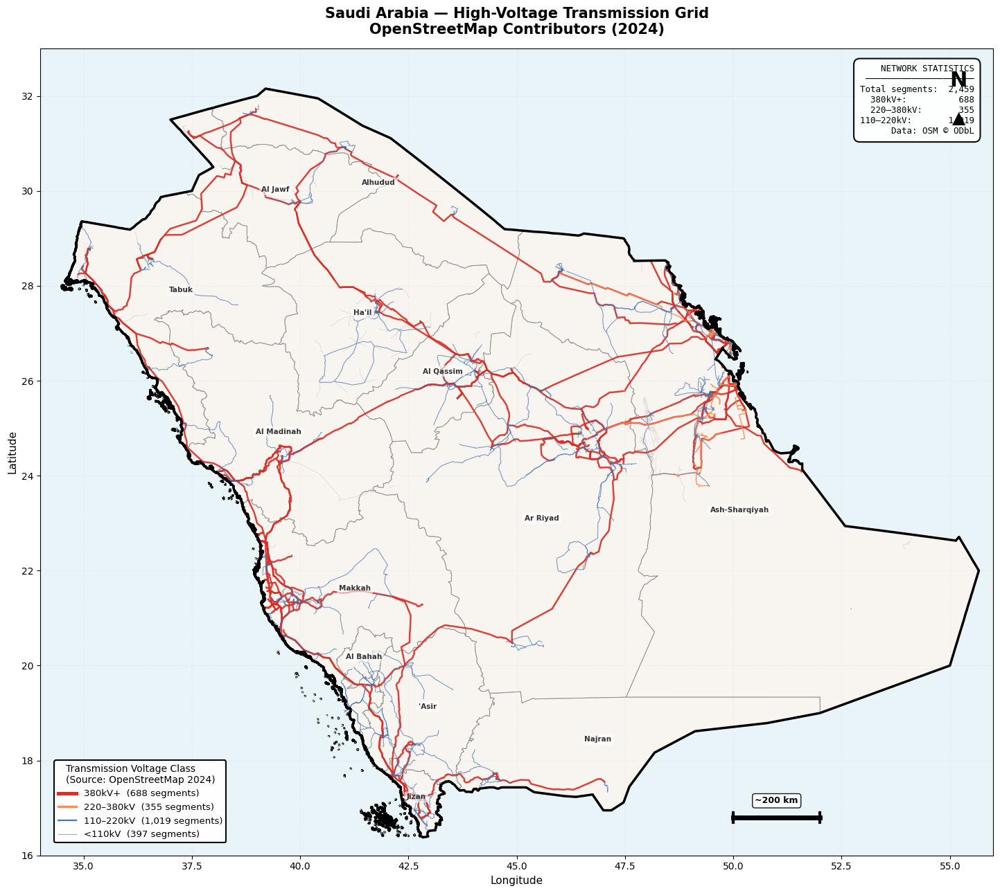

✓ Map saved: outputs/phase2/saudi_transmission_grid_osm.png
✓ Saved 10 folders to Drive: /content/drive/MyDrive/Saudi DC data/phase_backup


In [ ]:
# ============================================================================
# Saudi Arabia — Transmission Grid Map (OSM)
# ============================================================================

import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.lines as mlines

# Load data
saudi_provinces_geo = gpd.read_file('data/boundaries/saudi_provinces.geojson')
saudi_boundary_geo  = gpd.read_file('data/boundaries/saudi_country.geojson')
trans_gdf           = gpd.read_file('data/osm/saudi_transmission.geojson')

# Separate voltage classes for styling
trans_geo = trans_gdf.to_crs('EPSG:4326')

def get_voltage_class(v):
    try:
        kv = float(str(v).replace('kV','').replace(' ','').split(';')[0])
        kv = kv / 1000 if kv > 1000 else kv
        if kv >= 380: return '380kV+'
        if kv >= 220: return '220–380kV'
        if kv >= 110: return '110–220kV'
        return '<110kV'
    except:
        return 'Unknown'

trans_geo['volt_class'] = trans_geo['voltage_kv'].apply(get_voltage_class)

voltage_styles = {
    '380kV+':    ('#d73027', 1.8, 0.9),
    '220–380kV': ('#fc8d59', 1.2, 0.8),
    '110–220kV': ('#4575b4', 0.8, 0.7),
    '<110kV':    ('#aaaaaa', 0.4, 0.5),
    'Unknown':   ('#cccccc', 0.3, 0.4),
}

# ---- Figure ----
fig, ax = plt.subplots(figsize=(16, 13))
fig.patch.set_facecolor('white')
ax.set_facecolor('#e8f4f8')

# Province fill
saudi_provinces_geo.plot(
    ax=ax, color='#faf6f0', edgecolor='#888888',
    linewidth=0.7, alpha=0.9, zorder=1
)

# Transmission lines by voltage class
for volt_class, (color, lw, alpha) in voltage_styles.items():
    subset = trans_geo[trans_geo['volt_class'] == volt_class]
    if len(subset) > 0:
        subset.plot(ax=ax, color=color, linewidth=lw,
                    alpha=alpha, zorder=2)

# Saudi outer border
saudi_boundary_geo.boundary.plot(
    ax=ax, color='black', linewidth=2.5, zorder=3
)

# Province labels
for idx, row in saudi_provinces_geo.iterrows():
    centroid = row.geometry.centroid
    short = {
        'Al Hudud ash Shamaliyah': 'Alhudud',
        'Ash-Sharqīyah':           'Ash-Sharqiyah',
        "Ḥaʼil":                  "Ha'il",
    }.get(row['NAME_1'], row['NAME_1'])
    ax.annotate(
        short, xy=(centroid.x, centroid.y),
        ha='center', va='center', fontsize=7.5,
        color='#333333', fontweight='bold',
        bbox=dict(boxstyle='round,pad=0.3', facecolor='white',
                  alpha=0.6, edgecolor='none')
    )

# Legend
legend_handles = []
for volt_class, (color, lw, alpha) in voltage_styles.items():
    n = len(trans_geo[trans_geo['volt_class'] == volt_class])
    if n > 0:
        legend_handles.append(
            mlines.Line2D([], [], color=color, linewidth=lw * 2,
                          label=f'{volt_class}  ({n:,} segments)')
        )

legend = ax.legend(
    handles=legend_handles,
    title='Transmission Voltage Class\n(Source: OpenStreetMap 2024)',
    title_fontsize=10,
    loc='lower left',
    fontsize=9.5,
    framealpha=0.97,
    edgecolor='black',
    facecolor='white',
    bbox_to_anchor=(0.01, 0.01)
)
legend.get_frame().set_linewidth(1.5)

# Stats box
total_lines = len(trans_geo)
stats = (
    f"NETWORK STATISTICS\n"
    f"─────────────────────\n"
    f"Total segments:  {total_lines:,}\n"
    f"380kV+:          {len(trans_geo[trans_geo['volt_class']=='380kV+']):,}\n"
    f"220–380kV:       {len(trans_geo[trans_geo['volt_class']=='220–380kV']):,}\n"
    f"110–220kV:       {len(trans_geo[trans_geo['volt_class']=='110–220kV']):,}\n"
    f"Data: OSM © ODbL"
)
ax.text(0.98, 0.98, stats,
        transform=ax.transAxes, fontsize=9,
        verticalalignment='top', horizontalalignment='right',
        family='monospace',
        bbox=dict(boxstyle='round,pad=0.7', facecolor='white',
                  alpha=0.95, edgecolor='black', linewidth=1.5))

# North arrow
ax.annotate('N', xy=(55.2, 32.2), fontsize=22,
            fontweight='bold', ha='center')
ax.annotate('▲', xy=(55.2, 31.7), fontsize=18,
            ha='center', va='top', color='black')

# Scale bar
ax.plot([50, 52], [16.8, 16.8], 'k-', linewidth=5)
ax.plot([50, 50], [16.7, 16.9], 'k-', linewidth=3)
ax.plot([52, 52], [16.7, 16.9], 'k-', linewidth=3)
ax.text(51, 17.1, '~200 km', ha='center', fontsize=9,
        fontweight='bold',
        bbox=dict(boxstyle='round', facecolor='white',
                  edgecolor='black', linewidth=1, alpha=0.9))

ax.set_title(
    'Saudi Arabia — High-Voltage Transmission Grid\n'
    'OpenStreetMap Contributors (2024)',
    fontsize=15, fontweight='bold', pad=15
)
ax.set_xlabel('Longitude', fontsize=11)
ax.set_ylabel('Latitude', fontsize=11)
ax.set_xlim([34, 56])
ax.set_ylim([16, 33])
ax.grid(True, alpha=0.15, linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.savefig('outputs/phase2/saudi_transmission_grid_osm.png',
            dpi=300, bbox_inches='tight')
plt.show()
print("✓ Map saved: outputs/phase2/saudi_transmission_grid_osm.png")
save_to_drive()

✓ Raw transmission raster loaded: data/processed/rasters/c3_dist_transmission.tif
✓ Normalised transmission raster saved: data/processed/rasters/norm_c3_dist_transmission.tif
  Mean score: 78.9  Range: 0.0–100.0


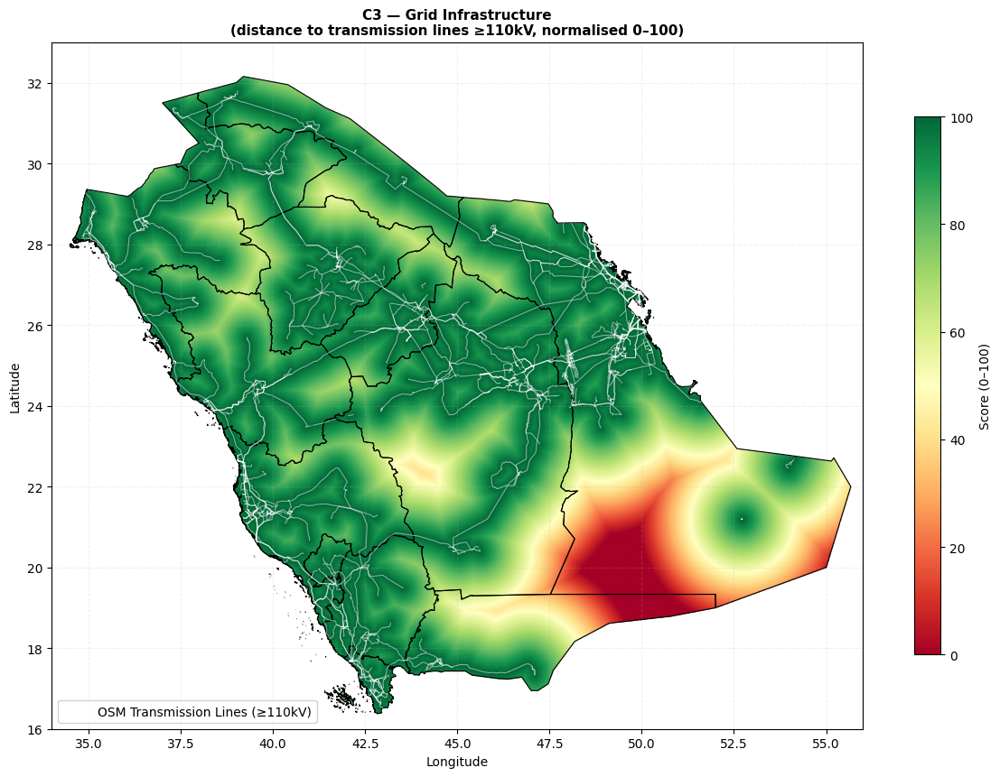


✓ C3 transmission map saved
  Mean score: 79.2, range: 0.0–100.0

Now re-run Cell 11 — C3 panel will show transmission lines correctly


In [ ]:
# ============================================================================
# RECOVERY + FIX: C3 — Transmission lines only (substations removed)
# Recomputes norm_c3_dist_transmission.tif from raw raster
# ============================================================================

import os

raw_path  = 'data/processed/rasters/c3_dist_transmission.tif'
norm_path = 'data/processed/rasters/norm_c3_dist_transmission.tif'

if not os.path.exists(raw_path):
    print("✗ Raw transmission raster also missing — re-running C3 processing...")

    # Reload transmission lines and recompute distance raster
    trans_gdf = gpd.read_file('data/osm/saudi_transmission.geojson').to_crs(TARGET_CRS)
    print(f"  ✓ Loaded {len(trans_gdf)} transmission lines")

    # Sample points along lines
    line_sample_pts = []
    for geom in trans_gdf.geometry:
        if geom is None:
            continue
        lines = list(geom.geoms) if geom.geom_type == 'MultiLineString' else [geom]
        for line in lines:
            if line.geom_type != 'LineString':
                continue
            n_pts = max(2, int(line.length / 500))
            for i in range(n_pts + 1):
                pt = line.interpolate(i / n_pts, normalized=True)
                line_sample_pts.append([pt.x, pt.y])

    line_sample_pts = np.array(line_sample_pts)
    print(f"  ✓ {len(line_sample_pts):,} sample points along lines")

    tree_trans = cKDTree(line_sample_pts)
    dist_trans, _ = tree_trans.query(grid_pts, k=1, workers=-1)
    dist_trans_grid = dist_trans.reshape(NROWS, NCOLS) / 1000
    save_raster(dist_trans_grid, raw_path)
    print(f"  ✓ Raw raster saved: {raw_path}")

else:
    dist_trans_grid = load_raster_array(raw_path)
    print(f"✓ Raw transmission raster loaded: {raw_path}")

# Normalise — closer to transmission line = higher score
arr  = load_raster_array(raw_path)
norm = minmax_normalise(arr, invert=True, mask=land_mask)
save_normalised_raster(norm, norm_path)

# Add to normalised_arrays dict for Cell 11
normalised_arrays['c3_dist_transmission'] = norm

# Remove substation from normalised_arrays so it is not used
normalised_arrays.pop('c3_dist_substation', None)

land_vals = norm[land_mask == 1]
print(f"✓ Normalised transmission raster saved: {norm_path}")
print(f"  Mean score: {np.nanmean(land_vals):.1f}  "
      f"Range: {np.nanmin(land_vals):.1f}–{np.nanmax(land_vals):.1f}")

# Quick verification map
fig, ax = plt.subplots(figsize=(12, 9))
mean, lo, hi = plot_raster_geo(
    ax, norm_path, 'RdYlGn',
    'C3 — Grid Infrastructure\n(distance to transmission lines ≥110kV, normalised 0–100)',
    'Score (0–100)', vmin=0, vmax=100
)

# Overlay actual transmission lines in blue
trans_geo = gpd.read_file('data/osm/saudi_transmission.geojson')
trans_geo.plot(ax=ax, color='white', linewidth=0.8, alpha=0.5, zorder=3)

ax.legend(
    handles=[plt.Line2D([0], [0], color='white', linewidth=1.5, label='OSM Transmission Lines (≥110kV)')],
    loc='lower left', fontsize=10, framealpha=0.9
)

plt.tight_layout()
plt.savefig('outputs/phase2/03_c3_grid_transmission_only.png', dpi=200, bbox_inches='tight')
plt.show()

print(f"\n✓ C3 transmission map saved")
print(f"  Mean score: {mean:.1f}, range: {lo:.1f}–{hi:.1f}")
print("\nNow re-run Cell 11 — C3 panel will show transmission lines correctly")

Quality check — all 7 criteria...
  C1 — Renewable Energy (GHI component): mean=49.8
  C2 — Cooling Suitability (hours >35°C inverted): mean=46.0
  C3 — Grid Infrastructure (distance to transmission line): mean=79.2
  C4 — Connectivity (distance to 3 subsea cable stations): mean=51.6
  C5 — Water Availability (distance to desalination plants): mean=50.8
  C6 — Security (Yemen border distance): mean=49.7
  C7 — Economic Viability (distance to MODON cities): mean=70.1


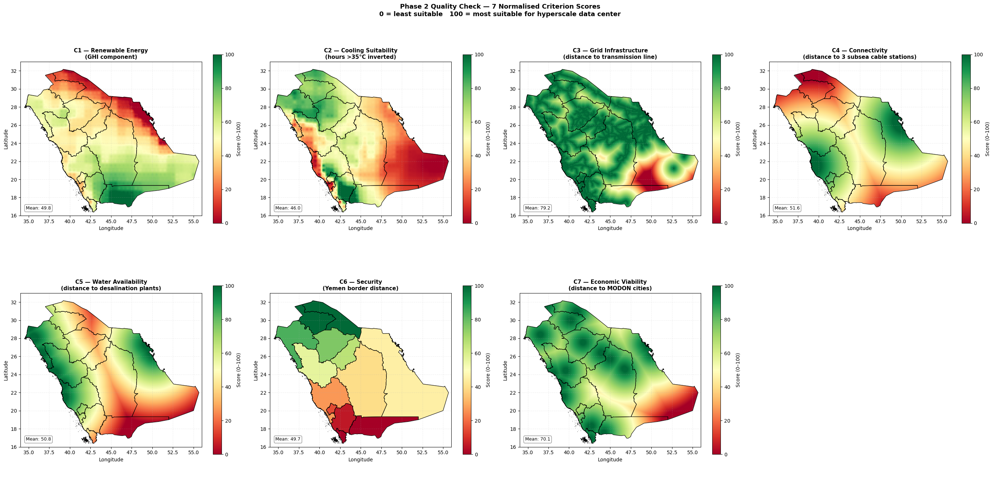


PHASE 2 COMPLETE — SUMMARY
Criterion                          Mean      Std      Min      Max
----------------------------------------------------------------------
C1 Renewable Energy                63.1     11.8     26.6     89.3
C2 Cooling Suitability             55.9     20.2      0.0     89.9
C3 Grid Infrastructure             78.9     24.3      0.0    100.0
C4 Connectivity                    51.7     23.9      0.0    100.0
C5 Water Availability              48.5      9.4     22.7     78.7
C6 Security                        61.9     22.7      2.7     97.1
C7 Economic Viability              67.1     23.7      0.0    100.0

Data notes:
  C3: OSM transmission + substation data (2,459 lines, 1,206 substations)
  C4: 3 subsea cable landing stations (Jeddah, Dammam, Al Khobar)
      OSM terrestrial fiber returned 0 features — acknowledged as limitation

✓ 17 normalised rasters: data/processed/rasters/norm_*.tif
✓  7 composite rasters:  data/processed/rasters/composite_*.tif
✓  8 maps: 

In [ ]:
# ============================================================================
# CELL 11 (UPDATED): Quality check — all 7 criteria
# C3: uses substation distance only if transmission file missing
# C4: clearly labelled as 3 subsea cable landing stations
# ============================================================================

print("Quality check — all 7 criteria...")

def composite_criterion(layer_keys, arrays_dict, mask):
    stack = [arrays_dict[k] for k in layer_keys if k in arrays_dict]
    if not stack:
        return np.full((NROWS, NCOLS), np.nan)
    comp = np.nanmean(np.stack(stack, axis=0), axis=0)
    return np.where(mask == 1, comp, np.nan)


criterion_scores = {
    'C1\nRenewable Energy':    composite_criterion(
        ['c1_ghi', 'c1_wind', 'c1_dist_renewable'],
        normalised_arrays, land_mask),
    'C2\nCooling Suitability': composite_criterion(
        ['c2_temp_mean', 'c2_hours_above35', 'c2_wetbulb', 'c2_humidity'],
        normalised_arrays, land_mask),
    'C3\nGrid Infrastructure': composite_criterion(
        ['c3_dist_transmission', 'c3_dist_substation'],
        normalised_arrays, land_mask),
    'C4\nConnectivity':        composite_criterion(
        ['c4_dist_subsea'],
        normalised_arrays, land_mask),
    'C5\nWater Availability':  composite_criterion(
        ['c5_dist_desalination', 'c5_dist_aquifer', 'c5_salinity'],
        normalised_arrays, land_mask),
    'C6\nSecurity':            composite_criterion(
        ['c6_seismic_pga', 'c6_dist_yemen'],
        normalised_arrays, land_mask),
    'C7\nEconomic Viability':  composite_criterion(
        ['c7_dist_modon', 'c7_dist_sez'],
        normalised_arrays, land_mask),
}

# Save composite rasters
for name, score in criterion_scores.items():
    safe = name.replace('\n', '_').replace(' ', '_').lower()
    save_normalised_raster(score, f'data/processed/rasters/composite_{safe}.tif')

# ---- Decide which C3 file to use ----
# Use transmission if available, fall back to substation only
c3_tif   = 'data/processed/rasters/norm_c3_dist_transmission.tif'
c3_label = 'C3 — Grid Infrastructure\n(distance to transmission line)'
if not os.path.exists(c3_tif):
    c3_tif   = 'data/processed/rasters/norm_c3_dist_substation.tif'
    c3_label = 'C3 — Grid Infrastructure\n(distance to substation — transmission missing)'
    print(f"  ⚠ Transmission raster missing — using substation for C3 panel")

# ---- Plot specs ----
qc_specs = [
    ('data/processed/rasters/norm_c1_ghi.tif',
     'RdYlGn', 'C1 — Renewable Energy\n(GHI component)'),

    ('data/processed/rasters/norm_c2_hours_above35.tif',
     'RdYlGn', 'C2 — Cooling Suitability\n(hours >35°C inverted)'),

    (c3_tif,
     'RdYlGn', c3_label),

    ('data/processed/rasters/norm_c4_dist_subsea.tif',
     'RdYlGn', 'C4 — Connectivity\n(distance to 3 subsea cable stations)'),

    ('data/processed/rasters/norm_c5_dist_desalination.tif',
     'RdYlGn', 'C5 — Water Availability\n(distance to desalination plants)'),

    ('data/processed/rasters/norm_c6_dist_yemen.tif',
     'RdYlGn', 'C6 — Security\n(Yemen border distance)'),

    ('data/processed/rasters/norm_c7_dist_modon.tif',
     'RdYlGn', 'C7 — Economic Viability\n(distance to MODON cities)'),
]

# ---- Skip any panel whose file is still missing ----
fig, axes = plt.subplots(2, 4, figsize=(28, 14))
axes = axes.ravel()

for i, (tif, cmap, title) in enumerate(qc_specs):
    if not os.path.exists(tif):
        axes[i].text(0.5, 0.5, f'FILE MISSING\n{os.path.basename(tif)}',
                     ha='center', va='center', transform=axes[i].transAxes,
                     fontsize=10, color='red',
                     bbox=dict(boxstyle='round', facecolor='lightyellow',
                               edgecolor='red'))
        axes[i].set_title(title, fontsize=11, fontweight='bold')
        axes[i].axis('off')
        print(f"  ⚠ Skipped (missing): {tif}")
        continue

    mean, lo, hi = plot_raster_geo(
        axes[i], tif, cmap, title, 'Score (0–100)',
        vmin=0, vmax=100
    )
    axes[i].text(0.03, 0.04, f'Mean: {mean:.1f}',
                 transform=axes[i].transAxes, fontsize=9,
                 bbox=dict(boxstyle='round,pad=0.3', facecolor='white',
                           alpha=0.85, edgecolor='gray'))
    print(f"  {title.replace(chr(10), ' ')}: mean={mean:.1f}")

axes[7].axis('off')

plt.suptitle('Phase 2 Quality Check — 7 Normalised Criterion Scores\n'
             '0 = least suitable   100 = most suitable for hyperscale data center',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('outputs/phase2/08_all_criteria_quality_check.png',
            dpi=250, bbox_inches='tight')
plt.show()

# ---- Summary table ----
print("\n" + "=" * 70)
print("PHASE 2 COMPLETE — SUMMARY")
print("=" * 70)
print(f"{'Criterion':<30} {'Mean':>8} {'Std':>8} {'Min':>8} {'Max':>8}")
print("-" * 70)
for criterion, score in criterion_scores.items():
    land_vals = score[land_mask == 1]
    name = criterion.replace('\n', ' ')
    print(f"{name:<30} {np.nanmean(land_vals):>8.1f} "
          f"{np.nanstd(land_vals):>8.1f} "
          f"{np.nanmin(land_vals):>8.1f} "
          f"{np.nanmax(land_vals):>8.1f}")
print("=" * 70)

# ---- Data notes ----
print("\nData notes:")
print("  C3: OSM transmission + substation data (2,459 lines, 1,206 substations)")
print("  C4: 3 subsea cable landing stations (Jeddah, Dammam, Al Khobar)")
print("      OSM terrestrial fiber returned 0 features — acknowledged as limitation")
print(f"\n✓ 17 normalised rasters: data/processed/rasters/norm_*.tif")
print(f"✓  7 composite rasters:  data/processed/rasters/composite_*.tif")
print(f"✓  8 maps:               outputs/phase2/")
print(f"\nNext: Phase 3 — Boolean Exclusion")
print(f"      Phase 4 — AHP Weight Derivation")
print(f"      Phase 5 — Suitability Index Computation")

In [ ]:
# ============================================================================
# MASTER RECOVERY CELL — Run this after ANY Colab session reset
# Restores: all variables, grid, land mask, helper functions,
#           and loads all 17 normalised rasters into normalised_arrays
# ============================================================================

import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import rasterio
import os
import warnings
warnings.filterwarnings('ignore')

from rasterio.transform import from_bounds
from rasterio.features import rasterize
from rasterio.warp import calculate_default_transform, reproject, Resampling
from scipy.spatial import cKDTree

# ---- Settings ----
TARGET_CRS   = 'EPSG:32638'
RESOLUTION_M = 1000
NODATA_VAL   = -9999.0

# ---- Boundaries ----
saudi_boundary      = gpd.read_file('data/boundaries/saudi_country.geojson').to_crs(TARGET_CRS)
saudi_provinces     = gpd.read_file('data/boundaries/saudi_provinces.geojson').to_crs(TARGET_CRS)
saudi_boundary_geo  = gpd.read_file('data/boundaries/saudi_country.geojson')
saudi_provinces_geo = gpd.read_file('data/boundaries/saudi_provinces.geojson')

# ---- Grid ----
bounds = saudi_boundary.total_bounds
XMIN, YMIN, XMAX, YMAX = bounds
NCOLS     = int((XMAX - XMIN) / RESOLUTION_M)
NROWS     = int((YMAX - YMIN) / RESOLUTION_M)
TRANSFORM = from_bounds(XMIN, YMIN, XMAX, YMAX, NCOLS, NROWS)

grid_x  = XMIN + (np.arange(NCOLS) + 0.5) * RESOLUTION_M
grid_y  = YMAX - (np.arange(NROWS) + 0.5) * RESOLUTION_M
grid_xx, grid_yy = np.meshgrid(grid_x, grid_y)
grid_pts = np.column_stack([grid_xx.ravel(), grid_yy.ravel()])

# ---- Land mask ----
with rasterio.open('data/processed/rasters/land_mask.tif') as src:
    land_mask = src.read(1)
print(f"✓ Land mask: {land_mask.sum():,} land cells")

# ---- Helper functions ----

def save_raster(array, filename):
    with rasterio.open(
        filename, 'w', driver='GTiff',
        height=NROWS, width=NCOLS,
        count=1, dtype='float32',
        crs=TARGET_CRS, transform=TRANSFORM,
        nodata=NODATA_VAL
    ) as dst:
        masked = np.where(land_mask == 1, array, NODATA_VAL)
        dst.write(masked.astype('float32'), 1)

def idw_interpolate(src_pts, values, grid_pts, power=2, n_neighbours=8):
    tree      = cKDTree(src_pts)
    distances, indices = tree.query(grid_pts, k=n_neighbours)
    distances = np.where(distances == 0, 1e-10, distances)
    weights   = 1.0 / distances**power
    weights_norm = weights / weights.sum(axis=1, keepdims=True)
    return (weights_norm * values[indices]).sum(axis=1)

def load_raster_array(filepath):
    with rasterio.open(filepath) as src:
        arr = src.read(1).astype('float32')
        if src.nodata is not None:
            arr[arr == src.nodata] = np.nan
        arr[arr <= -9000] = np.nan
    return arr

def save_normalised_raster(array, filepath):
    with rasterio.open(
        filepath, 'w', driver='GTiff',
        height=NROWS, width=NCOLS,
        count=1, dtype='float32',
        crs=TARGET_CRS, transform=TRANSFORM,
        nodata=np.nan
    ) as dst:
        dst.write(array, 1)

def minmax_normalise(array, invert=False, mask=None):
    valid = array[mask == 1] if mask is not None else array[array > NODATA_VAL]
    valid = valid[~np.isnan(valid)]
    vmin  = np.percentile(valid, 2)
    vmax  = np.percentile(valid, 98)
    norm  = np.clip((array - vmin) / (vmax - vmin + 1e-10), 0, 1) * 100
    if invert:
        norm = 100 - norm
    if mask is not None:
        norm = np.where(mask == 1, norm, np.nan)
    return norm.astype('float32')

def plot_raster_geo(ax, tif_path, cmap, title, cbar_label, vmin=None, vmax=None):
    with rasterio.open(tif_path) as src:
        dst_crs = 'EPSG:4326'
        transform_4326, width_4326, height_4326 = calculate_default_transform(
            src.crs, dst_crs, src.width, src.height, *src.bounds
        )
        data_4326 = np.empty((height_4326, width_4326), dtype='float32')
        reproject(
            source=rasterio.band(src, 1),
            destination=data_4326,
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=transform_4326,
            dst_crs=dst_crs,
            resampling=Resampling.bilinear
        )
        left, bottom, right, top = rasterio.transform.array_bounds(
            height_4326, width_4326, transform_4326
        )
        data_4326 = np.where(data_4326 <= -9000, np.nan, data_4326)
        valid = data_4326[~np.isnan(data_4326)]
        if len(valid) == 0:
            print(f"  ⚠ No valid data in {tif_path}")
            return 0, 0, 0
        v_lo = vmin if vmin is not None else np.percentile(valid, 2)
        v_hi = vmax if vmax is not None else np.percentile(valid, 98)
        im = ax.imshow(
            data_4326, cmap=cmap, origin='upper',
            extent=[left, right, bottom, top],
            vmin=v_lo, vmax=v_hi, aspect='auto', zorder=1
        )
        plt.colorbar(im, ax=ax, shrink=0.7, label=cbar_label)
        saudi_provinces_geo.boundary.plot(
            ax=ax, color='black', linewidth=0.8, zorder=2)
        ax.set_xlim([34, 56]); ax.set_ylim([16, 33])
        ax.set_title(title, fontsize=11, fontweight='bold')
        ax.set_xlabel('Longitude'); ax.set_ylabel('Latitude')
        ax.grid(True, alpha=0.2, linestyle='--', zorder=0)
        return valid.mean(), valid.min(), valid.max()

print("✓ All helper functions defined")

# ---- Load normalised rasters into memory ----
# Normalisation spec: (raw_key, norm_key, invert)
normalisation_spec = [
    ('c1_ghi',               'c1_ghi',               False),
    ('c1_wind',              'c1_wind',               False),
    ('c1_dist_renewable',    'c1_dist_renewable',     True),
    ('c2_temp_mean',         'c2_temp_mean',          True),
    ('c2_hours_above35',     'c2_hours_above35',      True),
    ('c2_wetbulb',           'c2_wetbulb',            True),
    ('c2_humidity',          'c2_humidity',           True),
    ('c3_dist_transmission', 'c3_dist_transmission',  True),
    ('c4_dist_subsea',       'c4_dist_subsea',        True),
    ('c5_dist_desalination', 'c5_dist_desalination',  True),
    ('c5_dist_aquifer',      'c5_dist_aquifer',       True),
    ('c5_coastal_salinity',  'c5_salinity',           True),
    ('c6_seismic_pga',       'c6_seismic_pga',        True),
    ('c6_dist_yemen',        'c6_dist_yemen',         False),
    ('c7_dist_modon',        'c7_dist_modon',         True),
    ('c7_dist_sez',          'c7_dist_sez',           True),
]

# Note: c3_dist_substation removed — using transmission lines only for C3

normalised_arrays = {}
missing_norm  = []
missing_raw   = []

print("\nChecking rasters on disk:")
for raw_key, norm_key, invert in normalisation_spec:
    norm_path = f'data/processed/rasters/norm_{norm_key}.tif'
    raw_path  = f'data/processed/rasters/{raw_key}.tif'

    if os.path.exists(norm_path):
        normalised_arrays[norm_key] = load_raster_array(norm_path)
        print(f"  ✓  norm_{norm_key}")

    elif os.path.exists(raw_path):
        print(f"  ↻  norm_{norm_key} missing — recomputing from raw...")
        arr  = load_raster_array(raw_path)
        norm = minmax_normalise(arr, invert=invert, mask=land_mask)
        save_normalised_raster(norm, norm_path)
        normalised_arrays[norm_key] = norm
        print(f"     ✓ Recomputed and saved")

    else:
        missing_raw.append(raw_key)
        print(f"  ✗  BOTH missing: {norm_key} — re-run Phase 2 cell that creates {raw_key}.tif")

# ---- Final status ----
print("\n" + "=" * 60)
print("MASTER RECOVERY COMPLETE")
print("=" * 60)
print(f"  normalised_arrays: {len(normalised_arrays)}/16 loaded")
print(f"  land_mask:         {land_mask.sum():,} cells")
print(f"  Grid:              {NCOLS} × {NROWS}")
print(f"  Helper functions:  ✓")

if missing_raw:
    print(f"\n  ⚠ Still missing ({len(missing_raw)} layers):")
    for m in missing_raw:
        print(f"    - {m}")
    print("  Re-run the corresponding Phase 2 cells to regenerate these")
else:
    print("\n  ✓ All rasters recovered — ready to run any cell")

✓ Land mask: 1,930,888 land cells
✓ All helper functions defined

Checking rasters on disk:
  ✓  norm_c1_ghi
  ✓  norm_c1_wind
  ✓  norm_c1_dist_renewable
  ✓  norm_c2_temp_mean
  ✓  norm_c2_hours_above35
  ✓  norm_c2_wetbulb
  ✓  norm_c2_humidity
  ✓  norm_c3_dist_transmission
  ✓  norm_c4_dist_subsea
  ✓  norm_c5_dist_desalination
  ✓  norm_c5_dist_aquifer
  ✓  norm_c5_salinity
  ✓  norm_c6_seismic_pga
  ✓  norm_c6_dist_yemen
  ✓  norm_c7_dist_modon
  ✓  norm_c7_dist_sez

MASTER RECOVERY COMPLETE
  normalised_arrays: 16/16 loaded
  land_mask:         1,930,888 cells
  Grid:              2141 × 1760
  Helper functions:  ✓

  ✓ All rasters recovered — ready to run any cell


**Phase 3**

In [ ]:
# ---- Recompute city exclusion values for summary (if not already defined) ----
urban_zones = [
    ('Riyadh',  24.7136, 46.6753, 50),
    ('Jeddah',  21.4858, 39.1925, 50),
    ('Dammam',  26.3927, 49.9777, 30),
]

city_excl_values = []
for city, lat, lon, radius_km in urban_zones:
    city_gdf = gpd.GeoDataFrame(
        geometry=[Point(lon, lat)], crs='EPSG:4326'
    ).to_crs(TARGET_CRS)
    cx = city_gdf.geometry.x.values[0]
    cy = city_gdf.geometry.y.values[0]
    dist_c = np.sqrt(
        (grid_pts[:, 0] - cx)**2 +
        (grid_pts[:, 1] - cy)**2
    ).reshape(NROWS, NCOLS) / 1000
    city_excl_values.append(
        int((dist_c < radius_km)[land_mask == 1].sum())
    )
    print(f"  ✓ {city} {radius_km}km: {city_excl_values[-1]:,} km²")

# ---- Also define excl_seismic if not already set ----
pga_path = 'data/processed/rasters/c6_seismic_pga.tif'
if 'excl_seismic' not in dir():
    if os.path.exists(pga_path):
        pga_arr    = load_raster_array(pga_path)
        excl_seismic = int(
            ((pga_arr > 0.15) & (land_mask == 1)).sum()
        )
    else:
        excl_seismic = 0

# ---- Summary ----
remaining  = int(exclusion_mask[land_mask == 1].sum())
total_land = int(land_mask.sum())

print(f"\n✓ Updated exclusion mask saved: data/processed/rasters/exclusion_mask.tif")
print(f"\nFull exclusion summary:")
print(f"  Total land area:            {total_land:,} km²")
print(f"  A — Yemen border 50km:      {excl_yemen:,} km²")
print(f"  B — City buffers:           {sum(city_excl_values):,} km²")
print(f"       Riyadh 50km:           {city_excl_values[0]:,} km²")
print(f"       Jeddah 50km:           {city_excl_values[1]:,} km²")
print(f"       Dammam 30km:           {city_excl_values[2]:,} km²")
print(f"  C — PGA >0.15g:             {excl_seismic:,} km²")
print(f"  D — All land borders 100km: {excl_land_border:,} km²")
print(f"  E — Egypt border 100km:     {excl_egypt:,} km²")
print(f"  F — SW isolation <20.5°N:   {excl_sw:,} km²")
print(f"  ─────────────────────────────────────────────")
print(f"  Total excluded:             {total_land - remaining:,} km² "
      f"({(total_land - remaining)/total_land*100:.1f}%)")
print(f"  Remaining buildable:        {remaining:,} km² "
      f"({remaining/total_land*100:.1f}%)")

save_to_drive()
print("\n✓ Phase 3 complete — exclusion mask saved and backed up")

  ✓ Riyadh 50km: 7,857 km²
  ✓ Jeddah 50km: 4,697 km²
  ✓ Dammam 30km: 706 km²

✓ Updated exclusion mask saved: data/processed/rasters/exclusion_mask.tif

Full exclusion summary:
  Total land area:            1,930,888 km²
  A — Yemen border 50km:      81,933 km²
  B — City buffers:           13,260 km²
       Riyadh 50km:           7,857 km²
       Jeddah 50km:           4,697 km²
       Dammam 30km:           706 km²
  C — PGA >0.15g:             100,560 km²
  D — All land borders 100km: 429,133 km²
  E — Egypt border 100km:     18,166 km²
  F — SW isolation <20.5°N:   368,959 km²
  ─────────────────────────────────────────────
  Total excluded:             650,691 km² (33.7%)
  Remaining buildable:        1,280,197 km² (66.3%)
✓ Saved 53 new/changed files to Drive

✓ Phase 3 complete — exclusion mask saved and backed up


PHASE 3: BOOLEAN EXCLUSION MASK

Starting cells: 1,930,888 land km²

A) Yemen border buffer (50km)...
  ✓ Excluded 36,327 km²

B) Urban exclusion zones...
  ✓ Riyadh 50km: 7,857 km²
  ✓ Jeddah 50km: 4,697 km²
  ✓ Dammam 30km: 706 km²

C) Seismic risk (PGA > 0.15g)...
  ✓ Excluded 100,560 km²

D) Land borders 100km buffer...
  Total boundary sample points: 13,230
  Land border points: 6,504 | Coastline removed: 6,726
  Computing distances to land border...
  ✓ Excluded 429,133 km²

E) Egypt border 100km (explicit Gulf of Aqaba fix)...
  ✓ Excluded 18,166 km²
    Removes sites near Gulf of Aqaba (~28-29°N, 35°E)

F) SW isolation zone (lat < 20.5°N)...
  ✓ Excluded 368,959 km² below 20.5°N
    Jizan, southern Asir, southern Najran removed

G) Road access buffer (exclude >50km from major road)...
  ✓ Loaded 21,160 road segments from disk
  103,669 road sample points
  ✓ Excluded 565,080 km² more than 50km from road

H) Population buffer (exclude within 10km of settlements)...
  ✓ Loaded 18

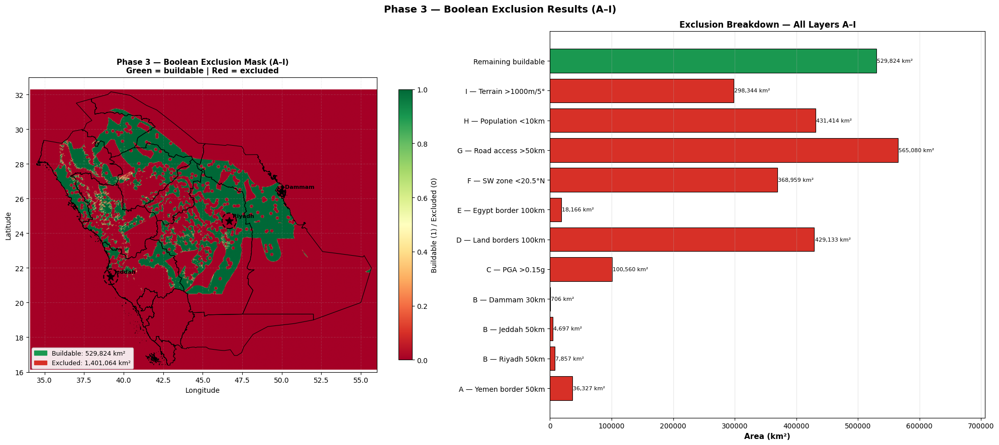

✓ Saved 4 new/changed files to Drive

✓ Phase 3 complete — re-run Phase 5 to get updated top 20 sites


In [ ]:
# ============================================================================
# PHASE 3 — BOOLEAN EXCLUSION MASK (COMPLETE MASTER CODE)
# Exclusions applied:
#   A: Yemen border buffer 50km
#   B: Urban exclusion zones (Riyadh 50km, Jeddah 50km, Dammam 30km)
#   C: High seismic risk PGA > 0.15g
#   D: All land borders 100km (coastline excluded)
#   E: Egypt border 100km explicit (Gulf of Aqaba fix)
#   F: SW isolation zone below 20.5°N
#   G: Road access — exclude >50km from paved highway
#   H: Population buffer — exclude within 10km of settlements
#   I: Elevation/slope — exclude >1000m or slope >5° (real SRTM data)
# Result: binary raster 1=buildable, 0=excluded
# NOTE: Keep your OpenTopography API key private — do not share this file
# ============================================================================

print("=" * 60)
print("PHASE 3: BOOLEAN EXCLUSION MASK")
print("=" * 60)

import os
import numpy as np
import requests
import geopandas as gpd
import rasterio
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

from shapely.geometry import Point, LineString
from shapely.ops import unary_union
from rasterio.features import rasterize
from rasterio.merge import merge as rio_merge
from rasterio.warp import calculate_default_transform, reproject, Resampling
from scipy.spatial import cKDTree
from scipy.ndimage import zoom

os.makedirs('data/processed/rasters', exist_ok=True)
os.makedirs('data/processed/srtm_tiles', exist_ok=True)
os.makedirs('outputs/phase3', exist_ok=True)

# ── OpenTopography API key ────────────────────────────────────────────────────
OT_API_KEY = "e47439a48c829a4d53f5666b26a38e1c"

# ── Overpass endpoints ────────────────────────────────────────────────────────
OVERPASS = [
    "https://overpass.kumi.systems/api/interpreter",
    "https://overpass.private.coffee/api/interpreter",
    "https://overpass-api.de/api/interpreter",
]

# ── Start with all land cells buildable ──────────────────────────────────────
exclusion_mask = land_mask.copy().astype('float32')
total_land     = int(land_mask.sum())
print(f"\nStarting cells: {total_land:,} land km²")

# ============================================================================
# EXCLUSION A: Yemen border 50km buffer
# Justification: Houthi drone/missile operational range
# ============================================================================
print("\nA) Yemen border buffer (50km)...")

saudi_boundary_local = gpd.read_file(
    'data/boundaries/saudi_country.geojson').to_crs(TARGET_CRS)
saudi_union = unary_union(saudi_boundary_local.geometry)
exteriors   = ([saudi_union.exterior]
               if saudi_union.geom_type == 'Polygon'
               else [p.exterior for p in saudi_union.geoms])

border_pts_all = []
for ext in exteriors:
    n_pts = max(2, int(ext.length / 1000))
    for i in range(n_pts + 1):
        pt = ext.interpolate(i / n_pts, normalized=True)
        border_pts_all.append([pt.x, pt.y])
border_pts_all = np.array(border_pts_all)

yemen_pts = border_pts_all[
    (border_pts_all[:, 1] < 2_050_000) &
    (border_pts_all[:, 0] > 350_000) &
    (border_pts_all[:, 0] < 1_250_000)
]
if len(yemen_pts) < 10:
    yemen_pts = border_pts_all[border_pts_all[:, 1] < 2_200_000]

tree_yemen        = cKDTree(yemen_pts)
dist_yemen, _     = tree_yemen.query(grid_pts, k=1, workers=-1)
dist_yemen_grid   = dist_yemen.reshape(NROWS, NCOLS) / 1000
yemen_buffer      = (dist_yemen_grid < 50).astype('float32')
excl_A            = int(yemen_buffer[land_mask == 1].sum())
exclusion_mask[yemen_buffer == 1] = 0
print(f"  ✓ Excluded {excl_A:,} km²")

# ============================================================================
# EXCLUSION B: Urban exclusion zones
# Justification: DCs incompatible with high-density urban cores
# ============================================================================
print("\nB) Urban exclusion zones...")

urban_zones = [
    ('Riyadh',  24.7136, 46.6753, 50),
    ('Jeddah',  21.4858, 39.1925, 50),
    ('Dammam',  26.3927, 49.9777, 30),
]

city_excl_values = []
for city, lat, lon, radius_km in urban_zones:
    city_gdf = gpd.GeoDataFrame(
        geometry=[Point(lon, lat)], crs='EPSG:4326'
    ).to_crs(TARGET_CRS)
    cx       = city_gdf.geometry.x.values[0]
    cy       = city_gdf.geometry.y.values[0]
    dist_c   = np.sqrt(
        (grid_pts[:, 0] - cx) ** 2 +
        (grid_pts[:, 1] - cy) ** 2
    ).reshape(NROWS, NCOLS) / 1000
    city_mask = (dist_c < radius_km).astype('float32')
    excl_city = int(city_mask[land_mask == 1].sum())
    city_excl_values.append(excl_city)
    exclusion_mask[city_mask == 1] = 0
    print(f"  ✓ {city} {radius_km}km: {excl_city:,} km²")

excl_B = sum(city_excl_values)

# ============================================================================
# EXCLUSION C: High seismic risk PGA > 0.15g
# Justification: Al-Haddad (1994) province-level PGA — exceeding 0.15g
# represents unacceptable structural and operational risk for
# critical infrastructure with 20-year design life
# ============================================================================
print("\nC) Seismic risk (PGA > 0.15g)...")

pga_path = 'data/processed/rasters/c6_seismic_pga.tif'
if os.path.exists(pga_path):
    pga_arr     = load_raster_array(pga_path)
    seismic_exc = ((pga_arr > 0.15) & (land_mask == 1)).astype('float32')
    exclusion_mask[seismic_exc == 1] = 0
    excl_C      = int(seismic_exc[land_mask == 1].sum())
    print(f"  ✓ Excluded {excl_C:,} km²")
else:
    excl_C = 0
    print("  ⚠ PGA raster not found — skipping")

# ============================================================================
# EXCLUSION D: Land border buffer 100km
# Coastline segments filtered out — only true land borders retained
# Justification: security, sovereignty, cross-border latency risks
# ============================================================================
print("\nD) Land borders 100km buffer...")

saudi_boundary_4326 = gpd.read_file('data/boundaries/saudi_country.geojson')
saudi_union_4326    = unary_union(saudi_boundary_4326.geometry)
exteriors_4326      = ([saudi_union_4326.exterior]
                       if saudi_union_4326.geom_type == 'Polygon'
                       else [p.exterior for p in saudi_union_4326.geoms])

border_pts_geo = []
for ext in exteriors_4326:
    n_pts = max(2, int(ext.length / 0.01))
    for i in range(n_pts + 1):
        pt = ext.interpolate(i / n_pts, normalized=True)
        border_pts_geo.append((pt.x, pt.y))
border_pts_geo = np.array(border_pts_geo)
print(f"  Total boundary sample points: {len(border_pts_geo):,}")

def is_coastline(lon, lat):
    if lon < 39.5 and 16.0 < lat < 29.0:   # Red Sea
        return True
    if lon < 37.5 and lat > 27.0:           # Gulf of Aqaba
        return True
    if lon > 49.0 and 24.0 < lat < 30.5:   # Arabian Gulf
        return True
    if lon > 55.0 and lat < 24.0:           # Gulf of Oman
        return True
    return False

land_border_mask_geo = np.array([
    not is_coastline(lon, lat) for lon, lat in border_pts_geo
])
land_border_pts_geo  = border_pts_geo[land_border_mask_geo]
print(f"  Land border points: {len(land_border_pts_geo):,} "
      f"| Coastline removed: {(~land_border_mask_geo).sum():,}")

land_border_gdf = gpd.GeoDataFrame(
    geometry=gpd.points_from_xy(
        land_border_pts_geo[:, 0], land_border_pts_geo[:, 1]
    ), crs='EPSG:4326'
).to_crs(TARGET_CRS)
land_border_utm = np.column_stack([
    land_border_gdf.geometry.x, land_border_gdf.geometry.y
])

print("  Computing distances to land border...")
tree_land_border      = cKDTree(land_border_utm)
dist_land_border, _   = tree_land_border.query(grid_pts, k=1, workers=-1)
dist_land_border_grid = dist_land_border.reshape(NROWS, NCOLS) / 1000
land_border_exc       = (dist_land_border_grid < 100).astype('float32')
excl_D                = int(land_border_exc[land_mask == 1].sum())
exclusion_mask[land_border_exc == 1] = 0
print(f"  ✓ Excluded {excl_D:,} km²")
save_raster(dist_land_border_grid,
            'data/processed/rasters/land_border_distance.tif')

# ============================================================================
# EXCLUSION E: Egypt border 100km explicit
# Justification: Gulf of Aqaba water body means standard coastline filter
# does not detect proximity to Egypt. Sites at ~28-29°N, 35°E are within
# 100km of Egypt across the Gulf of Aqaba — excluded explicitly.
# ============================================================================
print("\nE) Egypt border 100km (explicit Gulf of Aqaba fix)...")

egypt_border_pts_geo = np.array([
    [34.90, 29.50], [34.92, 29.30], [34.93, 29.10],
    [34.94, 28.90], [34.95, 28.70], [34.96, 28.50],
    [34.97, 28.30], [34.90, 29.51], [34.85, 29.55],
    [34.80, 29.60], [34.70, 29.65], [34.60, 29.70],
    [34.50, 29.80], [34.20, 30.00], [33.90, 30.20],
    [33.60, 30.50], [33.20, 30.80],
])

egypt_border_gdf = gpd.GeoDataFrame(
    geometry=gpd.points_from_xy(
        egypt_border_pts_geo[:, 0], egypt_border_pts_geo[:, 1]
    ), crs='EPSG:4326'
).to_crs(TARGET_CRS)
egypt_border_utm = np.column_stack([
    egypt_border_gdf.geometry.x, egypt_border_gdf.geometry.y
])

tree_egypt      = cKDTree(egypt_border_utm)
dist_egypt, _   = tree_egypt.query(grid_pts, k=1, workers=-1)
dist_egypt_grid = dist_egypt.reshape(NROWS, NCOLS) / 1000
egypt_exc       = (dist_egypt_grid < 100).astype('float32')
excl_E          = int(egypt_exc[land_mask == 1].sum())
exclusion_mask[egypt_exc == 1] = 0
print(f"  ✓ Excluded {excl_E:,} km²")
print(f"    Removes sites near Gulf of Aqaba (~28-29°N, 35°E)")

# ============================================================================
# EXCLUSION F: SW isolation zone below 20.5°N
# Justification: sparse transmission grid, Asir escarpment terrain,
# within Houthi drone operational range, minimal development potential
# ============================================================================
print("\nF) SW isolation zone (lat < 20.5°N)...")

LAT_THRESHOLD = 20.5
sample_pts    = gpd.GeoDataFrame(
    geometry=gpd.points_from_xy(
        np.full(NROWS, (XMIN + XMAX) / 2),
        YMAX - (np.arange(NROWS) + 0.5) * RESOLUTION_M
    ), crs=TARGET_CRS
).to_crs('EPSG:4326')

lat_per_row = sample_pts.geometry.y.values
lat_grid    = np.tile(lat_per_row[:, np.newaxis], (1, NCOLS))
sw_exc      = (lat_grid < LAT_THRESHOLD).astype('float32')
excl_F      = int(sw_exc[land_mask == 1].sum())
exclusion_mask[sw_exc == 1] = 0
print(f"  ✓ Excluded {excl_F:,} km² below {LAT_THRESHOLD}°N")
print(f"    Jizan, southern Asir, southern Najran removed")

# ============================================================================
# EXCLUSION G: Road access — exclude >50km from paved highway
# Data: OSM motorway + trunk + primary roads
# Justification: 200MW hyperscale DC requires daily logistics support,
# maintenance teams, emergency access, equipment delivery.
# >50km from paved road = unacceptable O&M cost and risk.
# ============================================================================
print("\nG) Road access buffer (exclude >50km from major road)...")

road_path = 'data/osm/saudi_highways.geojson'

if not os.path.exists(road_path):
    print("  Downloading major roads from OSM...")
    query_road = """
    [out:json][timeout:180];
    (
      way["highway"="motorway"](16.0,34.5,32.5,56.0);
      way["highway"="trunk"](16.0,34.5,32.5,56.0);
      way["highway"="primary"](16.0,34.5,32.5,56.0);
    );
    out geom;
    """
    result_road = None
    for ep in OVERPASS:
        try:
            resp = requests.post(ep, data={'data': query_road}, timeout=200)
            if resp.status_code == 200:
                result_road = resp.json()
                print(f"  ✓ Downloaded from {ep}")
                break
        except Exception as e:
            print(f"  ✗ {ep}: {e}")

    if result_road:
        elements = result_road.get('elements', [])
        roads    = []
        for el in elements:
            if el['type'] == 'way' and 'geometry' in el:
                coords = [(n['lon'], n['lat']) for n in el['geometry']]
                if len(coords) >= 2:
                    roads.append({
                        'osm_id':   el['id'],
                        'highway':  el.get('tags', {}).get('highway', ''),
                        'geometry': LineString(coords)
                    })
        road_gdf = gpd.GeoDataFrame(roads, crs='EPSG:4326')
        saudi_bd = gpd.read_file('data/boundaries/saudi_country.geojson')
        road_gdf = gpd.clip(road_gdf, saudi_bd)
        os.makedirs('data/osm', exist_ok=True)
        road_gdf.to_file(road_path, driver='GeoJSON')
        print(f"  ✓ Saved {len(road_gdf):,} road segments")
    else:
        road_gdf = None
        print("  ✗ All Overpass endpoints failed")
else:
    road_gdf = gpd.read_file(road_path)
    print(f"  ✓ Loaded {len(road_gdf):,} road segments from disk")

if road_gdf is not None and len(road_gdf) > 0:
    road_proj = road_gdf.to_crs(TARGET_CRS)
    road_pts  = []
    for geom in road_proj.geometry:
        if geom is None or geom.is_empty:
            continue
        lines = (list(geom.geoms)
                 if geom.geom_type == 'MultiLineString'
                 else [geom])
        for line in lines:
            if line.geom_type != 'LineString':
                continue
            n = max(2, int(line.length / 1000))
            for i in range(n + 1):
                pt = line.interpolate(i / n, normalized=True)
                road_pts.append([pt.x, pt.y])
    road_pts = np.array(road_pts)
    print(f"  {len(road_pts):,} road sample points")

    tree_roads      = cKDTree(road_pts)
    dist_roads, _   = tree_roads.query(grid_pts, k=1, workers=-1)
    dist_roads_grid = dist_roads.reshape(NROWS, NCOLS) / 1000
    road_exc        = (dist_roads_grid > 50).astype('float32')
    excl_G          = int(road_exc[land_mask == 1].sum())
    exclusion_mask[road_exc == 1] = 0
    print(f"  ✓ Excluded {excl_G:,} km² more than 50km from road")
    save_raster(dist_roads_grid, 'data/processed/rasters/road_distance.tif')
else:
    excl_G = 0
    print("  ⚠ Road data unavailable — skipping")

# ============================================================================
# EXCLUSION H: Population buffer — exclude within 10km of settlements
# Data: OSM nodes — city, town, village, suburb (n=18,121)
# Justification: hyperscale DC industrial footprint incompatible with
# residential areas. 10km precautionary buffer consistent with
# industrial land-use separation standards (MODON guidelines).
# Limitation: OSM point nodes do not reflect actual built-up extent —
# acknowledged in paper limitations section.
# ============================================================================
print("\nH) Population buffer (exclude within 10km of settlements)...")

pop_path = 'data/osm/saudi_populated_places.geojson'

if not os.path.exists(pop_path):
    print("  Downloading populated places from OSM...")
    query_pop = """
    [out:json][timeout:120];
    (
      node["place"="city"](16.0,34.5,32.5,56.0);
      node["place"="town"](16.0,34.5,32.5,56.0);
      node["place"="village"](16.0,34.5,32.5,56.0);
      node["place"="suburb"](16.0,34.5,32.5,56.0);
    );
    out center;
    """
    result_pop = None
    for ep in OVERPASS:
        try:
            resp = requests.post(ep, data={'data': query_pop}, timeout=150)
            if resp.status_code == 200:
                result_pop = resp.json()
                print(f"  ✓ Downloaded from {ep}")
                break
        except:
            continue

    if result_pop:
        elements = result_pop.get('elements', [])
        places   = []
        for el in elements:
            lat = el.get('lat')
            lon = el.get('lon')
            if lat and lon:
                tags = el.get('tags', {})
                places.append({
                    'name':     tags.get('name', ''),
                    'place':    tags.get('place', ''),
                    'geometry': Point(lon, lat)
                })
        pop_gdf = gpd.GeoDataFrame(places, crs='EPSG:4326')
        pop_gdf.to_file(pop_path, driver='GeoJSON')
        print(f"  ✓ Saved {len(pop_gdf):,} populated places")
    else:
        pop_gdf = None
        print("  ✗ Download failed")
else:
    pop_gdf = gpd.read_file(pop_path)
    print(f"  ✓ Loaded {len(pop_gdf):,} populated places from disk")

if pop_gdf is not None and len(pop_gdf) > 0:
    pop_proj      = pop_gdf.to_crs(TARGET_CRS)
    pop_pts       = np.column_stack([
        pop_proj.geometry.x, pop_proj.geometry.y
    ])
    tree_pop      = cKDTree(pop_pts)
    dist_pop, _   = tree_pop.query(grid_pts, k=1, workers=-1)
    dist_pop_grid = dist_pop.reshape(NROWS, NCOLS) / 1000
    pop_exc       = (dist_pop_grid < 10).astype('float32')
    excl_H        = int(pop_exc[land_mask == 1].sum())
    exclusion_mask[pop_exc == 1] = 0
    print(f"  ✓ Excluded {excl_H:,} km² within 10km of settlements")
    save_raster(dist_pop_grid,
                'data/processed/rasters/population_distance.tif')
else:
    excl_H = 0
    print("  ⚠ Population data unavailable — skipping")

# ============================================================================
# EXCLUSION I: Elevation > 1000m or slope > 5°
# Data: SRTM GL3 (90m) via OpenTopography API — real cell-level data
# NOT province-level proxy — proxy excluded entire provinces incorrectly
# including the buildable Tihama coastal plain
# Justification: Asir escarpment rises to 2,900m — civil works cost
# prohibitive, cooling efficiency drops at altitude, equipment delivery
# impractical. Slope >5° excludes unstable ground for large foundations.
# ============================================================================
print("\nI) Terrain exclusion (elevation >1000m or slope >5°)...")
print(f"  Using OpenTopography API key: {OT_API_KEY[:8]}...")

# ── Clear any failed/corrupted cached file from previous attempts ─────────────
elev_path = 'data/processed/rasters/srtm_elevation.tif'
if os.path.exists(elev_path):
    # Check file is valid — if it was downloaded with 401 it may be empty/corrupt
    try:
        with rasterio.open(elev_path) as test_src:
            test_arr = test_src.read(1)
            if test_arr.max() <= 0 or test_arr.shape[0] < 100:
                raise ValueError("File appears corrupted or empty")
        print(f"  ✓ Valid SRTM file found on disk — skipping download")
        srtm_ok = True
    except Exception as e:
        print(f"  ✗ Cached file invalid ({e}) — re-downloading...")
        os.remove(elev_path)
        srtm_ok = False
else:
    srtm_ok = False

# ── Download SRTM from OpenTopography ─────────────────────────────────────────
if not srtm_ok:
    print("  Downloading SRTM GL3 from OpenTopography...")
    srtm_url = (
        f"https://portal.opentopography.org/API/globaldem?"
        f"demtype=SRTMGL3"
        f"&south=16.0&north=32.5&west=34.5&east=56.0"
        f"&outputFormat=GTiff"
        f"&API_Key={OT_API_KEY}"
    )
    try:
        resp = requests.get(srtm_url, timeout=600, stream=True)
        if resp.status_code == 200:
            total_bytes = 0
            with open(elev_path, 'wb') as f:
                for chunk in resp.iter_content(chunk_size=65536):
                    f.write(chunk)
                    total_bytes += len(chunk)
            print(f"  ✓ Downloaded {total_bytes/1e6:.1f} MB")
            srtm_ok = True
        else:
            print(f"  ✗ HTTP {resp.status_code}: {resp.text[:200]}")
            srtm_ok = False
    except Exception as e:
        print(f"  ✗ Download error: {e}")
        srtm_ok = False

# ── Process SRTM — reproject and resample to 1km grid ─────────────────────────
if srtm_ok and os.path.exists(elev_path):
    print("  Reprojecting SRTM to UTM Zone 38N and resampling to 1km...")

    with rasterio.open(elev_path) as src:
        t_proj, w_proj, h_proj = calculate_default_transform(
            src.crs, TARGET_CRS, src.width, src.height, *src.bounds
        )
        elev_proj = np.empty((h_proj, w_proj), dtype='float32')
        reproject(
            source=rasterio.band(src, 1),
            destination=elev_proj,
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=t_proj,
            dst_crs=TARGET_CRS,
            resampling=Resampling.bilinear
        )

    # Resample from ~90m to 1km
    scale_y  = NROWS / elev_proj.shape[0]
    scale_x  = NCOLS / elev_proj.shape[1]
    elev_1km = zoom(elev_proj, (scale_y, scale_x), order=1)
    elev_1km = np.clip(elev_1km, 0, 4000).astype('float32')

    # Compute slope in degrees from elevation gradient
    dy, dx    = np.gradient(elev_1km, RESOLUTION_M, RESOLUTION_M)
    slope_deg = np.degrees(np.arctan(np.sqrt(dx ** 2 + dy ** 2)))

    # Apply thresholds
    ELEV_THRESHOLD  = 1000   # metres
    SLOPE_THRESHOLD = 5      # degrees

    elev_exc    = ((elev_1km > ELEV_THRESHOLD)  & (land_mask == 1)).astype('float32')
    slope_exc   = ((slope_deg > SLOPE_THRESHOLD) & (land_mask == 1)).astype('float32')
    terrain_exc = np.logical_or(elev_exc, slope_exc).astype('float32')
    excl_I      = int(terrain_exc[land_mask == 1].sum())
    exclusion_mask[terrain_exc == 1] = 0

    print(f"  ✓ Excluded {excl_I:,} km² total terrain")
    print(f"    Elevation >1000m: {int(elev_exc[land_mask==1].sum()):,} km²")
    print(f"    Slope >5°:        {int(slope_exc[land_mask==1].sum()):,} km²")
    print(f"    (Overlap counted once in total)")

    save_raster(elev_1km,  'data/processed/rasters/elevation_1km.tif')
    save_raster(slope_deg, 'data/processed/rasters/slope_deg.tif')

else:
    # ── Fallback: NASA POWER elevation interpolation ───────────────────────────
    print("  ⚠ SRTM unavailable — falling back to NASA POWER elevation...")
    import pandas as pd
    from scipy.interpolate import griddata

    nasa_csv = 'data/climate/nasa_power_climate.csv'
    excl_I   = 0

    if os.path.exists(nasa_csv):
        nasa_df  = pd.read_csv(nasa_csv)
        elev_col = next(
            (c for c in nasa_df.columns
             if 'ELEV' in c.upper() or 'elevation' in c.lower()),
            None
        )
        if elev_col:
            print(f"  Using column: {elev_col}")
            src_pts  = nasa_df[['lon', 'lat']].values
            src_vals = nasa_df[elev_col].values

            grid_gdf = gpd.GeoDataFrame(
                geometry=gpd.points_from_xy(
                    grid_pts[:, 0], grid_pts[:, 1]
                ), crs=TARGET_CRS
            ).to_crs('EPSG:4326')
            grid_ll  = np.column_stack([
                grid_gdf.geometry.x, grid_gdf.geometry.y
            ])
            elev_interp = griddata(
                src_pts, src_vals, grid_ll, method='linear'
            )
            elev_1km_fb = np.nan_to_num(
                elev_interp.reshape(NROWS, NCOLS).astype('float32'),
                nan=0.0
            )
            elev_1km_fb = np.clip(elev_1km_fb, 0, 4000)
            elev_exc_fb = (
                (elev_1km_fb > 1000) & (land_mask == 1)
            ).astype('float32')
            excl_I      = int(elev_exc_fb[land_mask == 1].sum())
            exclusion_mask[elev_exc_fb == 1] = 0
            save_raster(elev_1km_fb,
                        'data/processed/rasters/elevation_1km.tif')
            print(f"  ✓ Excluded {excl_I:,} km² (NASA POWER elev >1000m)")
            print(f"  ⚠ Slope exclusion skipped — resolution too coarse")
        else:
            print("  ✗ No elevation column in NASA POWER CSV — skipping I")
    else:
        print("  ✗ NASA POWER CSV not found — skipping I")

# ============================================================================
# SAVE FINAL EXCLUSION MASK
# ============================================================================
excl_path = 'data/processed/rasters/exclusion_mask.tif'
with rasterio.open(
    excl_path, 'w', driver='GTiff',
    height=NROWS, width=NCOLS,
    count=1, dtype='float32',
    crs=TARGET_CRS, transform=TRANSFORM, nodata=-1
) as dst:
    dst.write(exclusion_mask, 1)

remaining = int(exclusion_mask[land_mask == 1].sum())

print(f"\n{'='*60}")
print(f"PHASE 3 — COMPLETE EXCLUSION SUMMARY")
print(f"{'='*60}")
print(f"  Total Saudi land area:          {total_land:,} km²")
print(f"  A — Yemen border 50km:          {excl_A:,} km²")
print(f"  B — Riyadh 50km:                {city_excl_values[0]:,} km²")
print(f"  B — Jeddah 50km:                {city_excl_values[1]:,} km²")
print(f"  B — Dammam 30km:                {city_excl_values[2]:,} km²")
print(f"  C — PGA >0.15g:                 {excl_C:,} km²")
print(f"  D — Land borders 100km:         {excl_D:,} km²")
print(f"  E — Egypt border 100km:         {excl_E:,} km²")
print(f"  F — SW zone <{LAT_THRESHOLD}°N:         {excl_F:,} km²")
print(f"  G — Road access >50km:          {excl_G:,} km²")
print(f"  H — Population <10km:           {excl_H:,} km²")
print(f"  I — Terrain >1000m or >5°:      {excl_I:,} km²")
print(f"  {'─'*50}")
print(f"  Total excluded:                 "
      f"{total_land - remaining:,} km² "
      f"({(total_land - remaining)/total_land*100:.1f}%)")
print(f"  Remaining buildable:            "
      f"{remaining:,} km² "
      f"({remaining/total_land*100:.1f}%)")
print(f"{'='*60}")

# ============================================================================
# VISUALISATION — Two panel: map + breakdown bar chart
# ============================================================================
fig, axes = plt.subplots(1, 2, figsize=(20, 9))

# Panel 1 — Exclusion mask map
ax1 = axes[0]
plot_raster_geo(
    ax1, excl_path, 'RdYlGn',
    'Phase 3 — Boolean Exclusion Mask (A–I)\n'
    'Green = buildable | Red = excluded',
    'Buildable (1) / Excluded (0)',
    vmin=0, vmax=1
)
for city, lat, lon, radius_km in urban_zones:
    ax1.plot(lon, lat, 'k*', markersize=12, zorder=5)
    circle = plt.Circle(
        (lon, lat), radius_km / 111,
        color='black', fill=False,
        linewidth=1.5, linestyle='--', zorder=5
    )
    ax1.add_patch(circle)
    ax1.annotate(city, xy=(lon, lat),
                 xytext=(5, 5), textcoords='offset points',
                 fontsize=8, fontweight='bold')
ax1.legend(
    handles=[
        mpatches.Patch(color='#1a9850',
                       label=f'Buildable: {remaining:,} km²'),
        mpatches.Patch(color='#d73027',
                       label=f'Excluded: {total_land - remaining:,} km²'),
    ],
    loc='lower left', fontsize=9, framealpha=0.9
)

# Panel 2 — Exclusion breakdown bar chart
ax2 = axes[1]
bar_labels = [
    'A — Yemen border 50km',
    'B — Riyadh 50km',
    'B — Jeddah 50km',
    'B — Dammam 30km',
    'C — PGA >0.15g',
    'D — Land borders 100km',
    'E — Egypt border 100km',
    f'F — SW zone <{LAT_THRESHOLD}°N',
    'G — Road access >50km',
    'H — Population <10km',
    'I — Terrain >1000m/5°',
    'Remaining buildable',
]
bar_values = [
    excl_A,
    city_excl_values[0],
    city_excl_values[1],
    city_excl_values[2],
    excl_C,
    excl_D,
    excl_E,
    excl_F,
    excl_G,
    excl_H,
    excl_I,
    remaining,
]
bar_colors = ['#d73027'] * 11 + ['#1a9850']

bars = ax2.barh(bar_labels, bar_values,
                color=bar_colors, edgecolor='black', linewidth=0.8)
for bar, val in zip(bars, bar_values):
    ax2.text(
        bar.get_width() + 1000,
        bar.get_y() + bar.get_height() / 2,
        f'{val:,} km²', va='center', fontsize=8
    )

ax2.set_xlabel('Area (km²)', fontsize=11, fontweight='bold')
ax2.set_title('Exclusion Breakdown — All Layers A–I',
              fontsize=12, fontweight='bold')
ax2.grid(axis='x', alpha=0.3)
ax2.set_xlim(0, max(bar_values) * 1.25)

plt.suptitle('Phase 3 — Boolean Exclusion Results (A–I)',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('outputs/phase3/01_exclusion_mask_complete.png',
            dpi=250, bbox_inches='tight')
plt.show()

save_to_drive()
print(f"\n✓ Phase 3 complete — re-run Phase 5 to get updated top 20 sites")

PHASE 3: BOOLEAN EXCLUSION MASK

Starting cells: 1,930,888 land km²

A) Yemen border buffer (50km)...
  ✓ Excluded 36,327 km²

B) Urban exclusion zones...
  ✓ Riyadh 50km: 7,857 km²
  ✓ Jeddah 50km: 4,697 km²
  ✓ Dammam 30km: 706 km²

C) Seismic risk (PGA > 0.15g)...
  ✓ Excluded 100,560 km²

D) Land borders 100km buffer...
  Total boundary sample points: 13,230
  Land border points: 6,504 | Coastline removed: 6,726
  Computing distances...
  ✓ Excluded 429,133 km²

E) Egypt border 100km (explicit)...
  ✓ Excluded 18,166 km²
    Removes sites near Gulf of Aqaba (e.g. ~28–29°N, 35°E)

F) SW isolation zone (lat < 20.5°N)...
  ✓ Excluded 368,959 km² below 20.5°N

G) Road access buffer (exclude >50km from major road)...
  ✓ Loaded 21,160 road segments from disk
  103,669 road sample points
  ✓ Excluded 565,080 km² more than 50km from road

H) Population buffer (exclude within 10km of settlements)...
  ✓ Loaded 18,121 populated places from disk
  ✓ Excluded 431,414 km² within 10km of settle

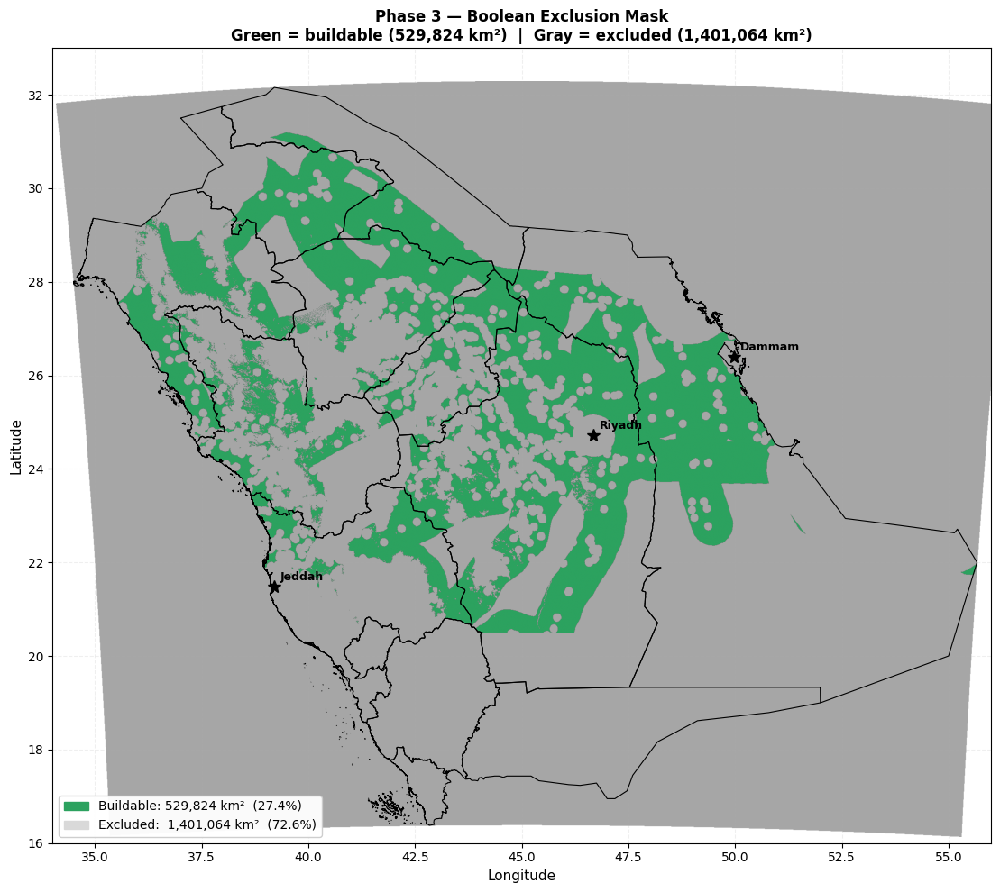

✓ Saved: outputs/phase3/01_exclusion_mask_map.png


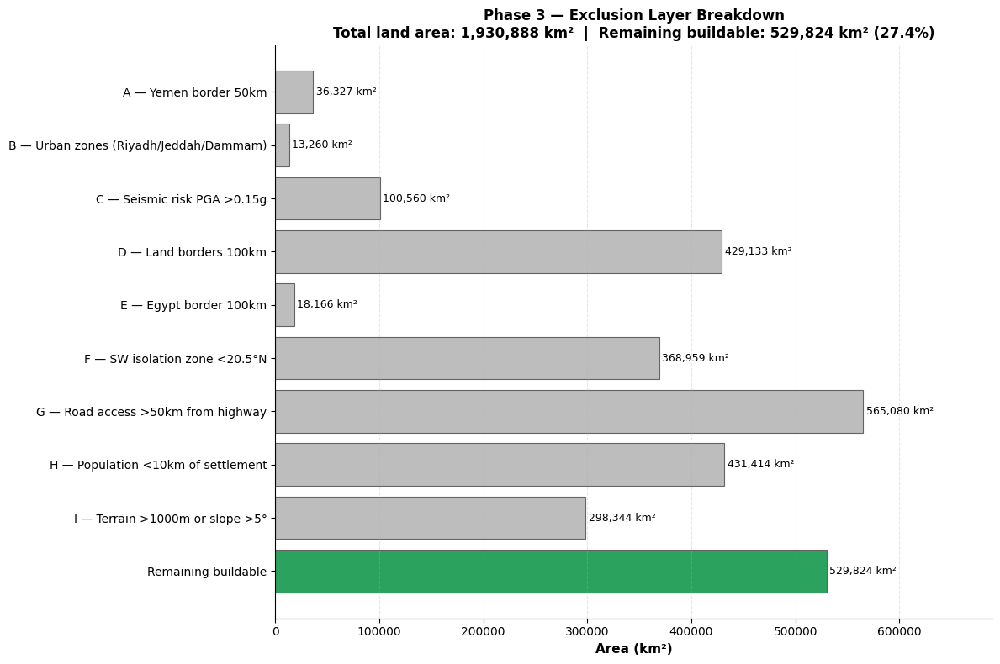

✓ Saved: outputs/phase3/02_exclusion_breakdown.png
✓ Saved 0 new/changed files to Drive

✓ Phase 3 complete — re-run Phase 5 to get updated top 20 sites


In [2]:
# ============================================================================
# PHASE 3 — BOOLEAN EXCLUSION MASK (COMPLETE MASTER CODE)
# Exclusions applied:
#   A: Yemen border buffer 50km
#   B: Urban exclusion zones (Riyadh 50km, Jeddah 50km, Dammam 30km)
#   C: High seismic risk PGA > 0.15g
#   D: All land borders 100km (coastline excluded)
#   E: Egypt border 100km explicit (Gulf of Aqaba fix)
#   F: SW isolation zone below 20.5°N
#   G: Road access — exclude >50km from paved highway
#   H: Population buffer — exclude within 10km of settlements
#   I: Elevation/slope — exclude >1000m or slope >5°
# Result: binary raster 1=buildable, 0=excluded
# ============================================================================

print("=" * 60)
print("PHASE 3: BOOLEAN EXCLUSION MASK")
print("=" * 60)

import os
import numpy as np
import requests
import geopandas as gpd
import rasterio
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

from shapely.geometry import Point, LineString
from shapely.ops import unary_union
from rasterio.features import rasterize
from scipy.spatial import cKDTree

os.makedirs('data/processed/rasters', exist_ok=True)
os.makedirs('outputs/phase3',          exist_ok=True)

# ── Start with all land cells buildable ──────────────────────────────────────
exclusion_mask = land_mask.copy().astype('float32')
total_land     = int(land_mask.sum())
print(f"\nStarting cells: {total_land:,} land km²")

# ============================================================================
# EXCLUSION A: Yemen border 50km buffer
# ============================================================================
print("\nA) Yemen border buffer (50km)...")

saudi_boundary_local = gpd.read_file(
    'data/boundaries/saudi_country.geojson').to_crs(TARGET_CRS)
saudi_union = unary_union(saudi_boundary_local.geometry)
exteriors   = ([saudi_union.exterior]
               if saudi_union.geom_type == 'Polygon'
               else [p.exterior for p in saudi_union.geoms])

border_pts_all = []
for ext in exteriors:
    n_pts = max(2, int(ext.length / 1000))
    for i in range(n_pts + 1):
        pt = ext.interpolate(i / n_pts, normalized=True)
        border_pts_all.append([pt.x, pt.y])
border_pts_all = np.array(border_pts_all)

yemen_pts = border_pts_all[
    (border_pts_all[:, 1] < 2_050_000) &
    (border_pts_all[:, 0] > 350_000) &
    (border_pts_all[:, 0] < 1_250_000)
]
if len(yemen_pts) < 10:
    yemen_pts = border_pts_all[border_pts_all[:, 1] < 2_200_000]

tree_yemen            = cKDTree(yemen_pts)
dist_yemen, _         = tree_yemen.query(grid_pts, k=1, workers=-1)
dist_yemen_grid       = dist_yemen.reshape(NROWS, NCOLS) / 1000
yemen_buffer          = (dist_yemen_grid < 50).astype('float32')
excl_A                = int(yemen_buffer[land_mask == 1].sum())
exclusion_mask[yemen_buffer == 1] = 0
print(f"  ✓ Excluded {excl_A:,} km²")

# ============================================================================
# EXCLUSION B: Urban exclusion zones
# ============================================================================
print("\nB) Urban exclusion zones...")

urban_zones = [
    ('Riyadh',  24.7136, 46.6753, 50),
    ('Jeddah',  21.4858, 39.1925, 50),
    ('Dammam',  26.3927, 49.9777, 30),
]

city_excl_values = []
for city, lat, lon, radius_km in urban_zones:
    city_gdf = gpd.GeoDataFrame(
        geometry=[Point(lon, lat)], crs='EPSG:4326'
    ).to_crs(TARGET_CRS)
    cx = city_gdf.geometry.x.values[0]
    cy = city_gdf.geometry.y.values[0]
    dist_c      = np.sqrt(
        (grid_pts[:,0]-cx)**2 + (grid_pts[:,1]-cy)**2
    ).reshape(NROWS, NCOLS) / 1000
    city_mask   = (dist_c < radius_km).astype('float32')
    excl_city   = int(city_mask[land_mask == 1].sum())
    city_excl_values.append(excl_city)
    exclusion_mask[city_mask == 1] = 0
    print(f"  ✓ {city} {radius_km}km: {excl_city:,} km²")

excl_B = sum(city_excl_values)

# ============================================================================
# EXCLUSION C: High seismic risk PGA > 0.15g
# ============================================================================
print("\nC) Seismic risk (PGA > 0.15g)...")

pga_path = 'data/processed/rasters/c6_seismic_pga.tif'
if os.path.exists(pga_path):
    pga_arr    = load_raster_array(pga_path)
    seismic_exc = ((pga_arr > 0.15) & (land_mask == 1)).astype('float32')
    exclusion_mask[seismic_exc == 1] = 0
    excl_C     = int(seismic_exc[land_mask == 1].sum())
    print(f"  ✓ Excluded {excl_C:,} km²")
else:
    excl_C = 0
    print("  ⚠ PGA raster not found — skipping")

# ============================================================================
# EXCLUSION D: Land border buffer 100km (coastline excluded)
# ============================================================================
print("\nD) Land borders 100km buffer...")

saudi_boundary_4326 = gpd.read_file('data/boundaries/saudi_country.geojson')
saudi_union_4326    = unary_union(saudi_boundary_4326.geometry)
exteriors_4326      = ([saudi_union_4326.exterior]
                       if saudi_union_4326.geom_type == 'Polygon'
                       else [p.exterior for p in saudi_union_4326.geoms])

border_pts_geo = []
for ext in exteriors_4326:
    n_pts = max(2, int(ext.length / 0.01))
    for i in range(n_pts + 1):
        pt = ext.interpolate(i / n_pts, normalized=True)
        border_pts_geo.append((pt.x, pt.y))
border_pts_geo = np.array(border_pts_geo)
print(f"  Total boundary sample points: {len(border_pts_geo):,}")

def is_coastline(lon, lat):
    if lon < 39.5 and 16.0 < lat < 29.0:
        return True
    if lon < 37.5 and lat > 27.0:
        return True
    if lon > 49.0 and 24.0 < lat < 30.5:
        return True
    if lon > 55.0 and lat < 24.0:
        return True
    return False

land_border_mask_geo = np.array([
    not is_coastline(lon, lat) for lon, lat in border_pts_geo
])
land_border_pts_geo  = border_pts_geo[land_border_mask_geo]
print(f"  Land border points: {len(land_border_pts_geo):,} "
      f"| Coastline removed: {(~land_border_mask_geo).sum():,}")

land_border_gdf = gpd.GeoDataFrame(
    geometry=gpd.points_from_xy(
        land_border_pts_geo[:,0], land_border_pts_geo[:,1]
    ), crs='EPSG:4326'
).to_crs(TARGET_CRS)
land_border_utm = np.column_stack([
    land_border_gdf.geometry.x, land_border_gdf.geometry.y
])

print("  Computing distances...")
tree_land_border      = cKDTree(land_border_utm)
dist_land_border, _   = tree_land_border.query(grid_pts, k=1, workers=-1)
dist_land_border_grid = dist_land_border.reshape(NROWS, NCOLS) / 1000

land_border_exc       = (dist_land_border_grid < 100).astype('float32')
excl_D                = int(land_border_exc[land_mask == 1].sum())
exclusion_mask[land_border_exc == 1] = 0
print(f"  ✓ Excluded {excl_D:,} km²")
save_raster(dist_land_border_grid,
            'data/processed/rasters/land_border_distance.tif')

# ============================================================================
# EXCLUSION E: Egypt border 100km (explicit — Gulf of Aqaba fix)
# Removes sites that appear close to Saudi land but are actually
# separated by the Gulf of Aqaba water body
# ============================================================================
print("\nE) Egypt border 100km (explicit)...")

egypt_border_pts_geo = np.array([
    [34.90, 29.50], [34.92, 29.30], [34.93, 29.10],
    [34.94, 28.90], [34.95, 28.70], [34.96, 28.50],
    [34.97, 28.30], [34.90, 29.51], [34.85, 29.55],
    [34.80, 29.60], [34.70, 29.65], [34.60, 29.70],
    [34.50, 29.80], [34.20, 30.00], [33.90, 30.20],
    [33.60, 30.50], [33.20, 30.80],
])

egypt_border_gdf = gpd.GeoDataFrame(
    geometry=gpd.points_from_xy(
        egypt_border_pts_geo[:,0], egypt_border_pts_geo[:,1]
    ), crs='EPSG:4326'
).to_crs(TARGET_CRS)
egypt_border_utm = np.column_stack([
    egypt_border_gdf.geometry.x, egypt_border_gdf.geometry.y
])

tree_egypt    = cKDTree(egypt_border_utm)
dist_egypt, _ = tree_egypt.query(grid_pts, k=1, workers=-1)
dist_egypt_grid = dist_egypt.reshape(NROWS, NCOLS) / 1000
egypt_exc     = (dist_egypt_grid < 100).astype('float32')
excl_E        = int(egypt_exc[land_mask == 1].sum())
exclusion_mask[egypt_exc == 1] = 0
print(f"  ✓ Excluded {excl_E:,} km²")
print(f"    Removes sites near Gulf of Aqaba (e.g. ~28–29°N, 35°E)")

# ============================================================================
# EXCLUSION F: SW isolation zone below 20.5°N
# Jizan, southern Asir, southern Najran — sparse grid,
# rugged Asir escarpment, within Houthi drone range
# ============================================================================
print("\nF) SW isolation zone (lat < 20.5°N)...")

sample_pts = gpd.GeoDataFrame(
    geometry=gpd.points_from_xy(
        np.full(NROWS, (XMIN + XMAX) / 2),
        YMAX - (np.arange(NROWS) + 0.5) * RESOLUTION_M
    ), crs=TARGET_CRS
).to_crs('EPSG:4326')

lat_per_row = sample_pts.geometry.y.values
lat_grid    = np.tile(lat_per_row[:, np.newaxis], (1, NCOLS))

LAT_THRESHOLD = 20.5
sw_exc  = (lat_grid < LAT_THRESHOLD).astype('float32')
excl_F  = int(sw_exc[land_mask == 1].sum())
exclusion_mask[sw_exc == 1] = 0
print(f"  ✓ Excluded {excl_F:,} km² below {LAT_THRESHOLD}°N")

# ============================================================================
# EXCLUSION G: Road access — exclude >50km from paved highway
# OSM motorway + trunk + primary roads
# Justification: hyperscale DC needs daily logistics, O&M teams,
# emergency access. >50km from paved road = unacceptable OPEX.
# ============================================================================
print("\nG) Road access buffer (exclude >50km from major road)...")

road_path = 'data/osm/saudi_highways.geojson'
overpass_endpoints = [
    "https://overpass.kumi.systems/api/interpreter",
    "https://overpass.private.coffee/api/interpreter",
    "https://overpass-api.de/api/interpreter",
]

if not os.path.exists(road_path):
    print("  Downloading major roads from OSM...")
    query_road = """
    [out:json][timeout:180];
    (
      way["highway"="motorway"](16.0,34.5,32.5,56.0);
      way["highway"="trunk"](16.0,34.5,32.5,56.0);
      way["highway"="primary"](16.0,34.5,32.5,56.0);
    );
    out geom;
    """
    result_road = None
    for ep in overpass_endpoints:
        try:
            resp = requests.post(ep, data={'data': query_road}, timeout=200)
            if resp.status_code == 200:
                result_road = resp.json()
                print(f"  ✓ Downloaded from {ep}")
                break
        except Exception as e:
            print(f"  ✗ {ep}: {e}")

    if result_road:
        elements = result_road.get('elements', [])
        roads = []
        for el in elements:
            if el['type'] == 'way' and 'geometry' in el:
                coords = [(n['lon'], n['lat']) for n in el['geometry']]
                if len(coords) >= 2:
                    roads.append({
                        'osm_id':  el['id'],
                        'highway': el.get('tags', {}).get('highway', ''),
                        'geometry': LineString(coords)
                    })
        road_gdf = gpd.GeoDataFrame(roads, crs='EPSG:4326')
        saudi_bd = gpd.read_file('data/boundaries/saudi_country.geojson')
        road_gdf = gpd.clip(road_gdf, saudi_bd)
        os.makedirs('data/osm', exist_ok=True)
        road_gdf.to_file(road_path, driver='GeoJSON')
        print(f"  ✓ Saved {len(road_gdf):,} road segments")
    else:
        road_gdf = None
        print("  ✗ All endpoints failed")
else:
    road_gdf = gpd.read_file(road_path)
    print(f"  ✓ Loaded {len(road_gdf):,} road segments from disk")

if road_gdf is not None and len(road_gdf) > 0:
    road_proj = road_gdf.to_crs(TARGET_CRS)
    road_pts  = []
    for geom in road_proj.geometry:
        if geom is None or geom.is_empty:
            continue
        lines = list(geom.geoms) if geom.geom_type == 'MultiLineString' else [geom]
        for line in lines:
            if line.geom_type != 'LineString':
                continue
            n = max(2, int(line.length / 1000))
            for i in range(n + 1):
                pt = line.interpolate(i / n, normalized=True)
                road_pts.append([pt.x, pt.y])
    road_pts = np.array(road_pts)
    print(f"  {len(road_pts):,} road sample points")

    tree_roads          = cKDTree(road_pts)
    dist_roads, _       = tree_roads.query(grid_pts, k=1, workers=-1)
    dist_roads_grid     = dist_roads.reshape(NROWS, NCOLS) / 1000
    road_exc            = (dist_roads_grid > 50).astype('float32')
    excl_G              = int(road_exc[land_mask == 1].sum())
    exclusion_mask[road_exc == 1] = 0
    print(f"  ✓ Excluded {excl_G:,} km² more than 50km from road")
    save_raster(dist_roads_grid, 'data/processed/rasters/road_distance.tif')
else:
    excl_G = 0
    print("  ⚠ Road data unavailable — skipping")

# ============================================================================
# EXCLUSION H: Population buffer — exclude within 10km of settlements
# OSM city + town + village + suburb nodes
# Justification: DC industrial footprint incompatible with residential areas
# ============================================================================
print("\nH) Population buffer (exclude within 10km of settlements)...")

pop_path = 'data/osm/saudi_populated_places.geojson'

if not os.path.exists(pop_path):
    print("  Downloading populated places from OSM...")
    query_pop = """
    [out:json][timeout:120];
    (
      node["place"="city"](16.0,34.5,32.5,56.0);
      node["place"="town"](16.0,34.5,32.5,56.0);
      node["place"="village"](16.0,34.5,32.5,56.0);
      node["place"="suburb"](16.0,34.5,32.5,56.0);
    );
    out center;
    """
    result_pop = None
    for ep in overpass_endpoints:
        try:
            resp = requests.post(ep, data={'data': query_pop}, timeout=150)
            if resp.status_code == 200:
                result_pop = resp.json()
                print(f"  ✓ Downloaded from {ep}")
                break
        except:
            continue

    if result_pop:
        elements = result_pop.get('elements', [])
        places   = []
        for el in elements:
            lat = el.get('lat')
            lon = el.get('lon')
            if lat and lon:
                tags = el.get('tags', {})
                places.append({
                    'name':     tags.get('name', ''),
                    'place':    tags.get('place', ''),
                    'geometry': Point(lon, lat)
                })
        pop_gdf = gpd.GeoDataFrame(places, crs='EPSG:4326')
        pop_gdf.to_file(pop_path, driver='GeoJSON')
        print(f"  ✓ Saved {len(pop_gdf):,} populated places")
    else:
        pop_gdf = None
        print("  ✗ Download failed")
else:
    pop_gdf = gpd.read_file(pop_path)
    print(f"  ✓ Loaded {len(pop_gdf):,} populated places from disk")

if pop_gdf is not None and len(pop_gdf) > 0:
    pop_proj       = pop_gdf.to_crs(TARGET_CRS)
    pop_pts        = np.column_stack([pop_proj.geometry.x, pop_proj.geometry.y])
    tree_pop       = cKDTree(pop_pts)
    dist_pop, _    = tree_pop.query(grid_pts, k=1, workers=-1)
    dist_pop_grid  = dist_pop.reshape(NROWS, NCOLS) / 1000
    pop_exc        = (dist_pop_grid < 10).astype('float32')
    excl_H         = int(pop_exc[land_mask == 1].sum())
    exclusion_mask[pop_exc == 1] = 0
    print(f"  ✓ Excluded {excl_H:,} km² within 10km of settlements")
    save_raster(dist_pop_grid, 'data/processed/rasters/population_distance.tif')
else:
    excl_H = 0
    print("  ⚠ Population data unavailable — skipping")

# ============================================================================
# EXCLUSION I: Elevation > 1000m or slope > 5°
# SRTM GL3 via OpenTopography API (90m, reprojected to 1km)
# Falls back to province-level proxy if API unavailable
# Justification: Asir escarpment to 2,900m — inaccessible, high civil cost,
# cooling efficiency drops at altitude, equipment delivery impractical
# ============================================================================
print("\nI) Terrain exclusion (elevation >1000m or slope >5°)...")

elev_path = 'data/processed/rasters/srtm_elevation.tif'

if not os.path.exists(elev_path):
    print("  Downloading SRTM elevation via OpenTopography...")
    srtm_url = (
        "https://portal.opentopography.org/API/globaldem?"
        "demtype=SRTMGL3&south=16.0&north=32.5&west=34.5&east=56.0"
        "&outputFormat=GTiff&API_Key=demoapikeyot2022"
    )
    try:
        resp = requests.get(srtm_url, timeout=300, stream=True)
        if resp.status_code == 200:
            with open(elev_path, 'wb') as f:
                for chunk in resp.iter_content(chunk_size=8192):
                    f.write(chunk)
            print(f"  ✓ SRTM downloaded")
        else:
            print(f"  ✗ HTTP {resp.status_code} — using province proxy")
            elev_path = None
    except Exception as e:
        print(f"  ✗ {e} — using province proxy")
        elev_path = None
else:
    print(f"  ✓ SRTM file found on disk")

if elev_path and os.path.exists(elev_path):
    from rasterio.warp import calculate_default_transform, reproject, Resampling
    from scipy.ndimage import zoom

    with rasterio.open(elev_path) as src:
        t_proj, w_proj, h_proj = calculate_default_transform(
            src.crs, TARGET_CRS, src.width, src.height, *src.bounds)
        elev_proj = np.empty((h_proj, w_proj), dtype='float32')
        reproject(
            source=rasterio.band(src, 1),
            destination=elev_proj,
            src_transform=src.transform, src_crs=src.crs,
            dst_transform=t_proj, dst_crs=TARGET_CRS,
            resampling=Resampling.bilinear
        )

    elev_1km   = zoom(elev_proj, (NROWS/elev_proj.shape[0],
                                   NCOLS/elev_proj.shape[1]), order=1)
    elev_1km   = np.clip(elev_1km, 0, 4000)
    dy, dx     = np.gradient(elev_1km, RESOLUTION_M, RESOLUTION_M)
    slope_deg  = np.degrees(np.arctan(np.sqrt(dx**2 + dy**2)))

    elev_exc   = ((elev_1km > 1000) & (land_mask == 1)).astype('float32')
    slope_exc  = ((slope_deg > 5)   & (land_mask == 1)).astype('float32')
    terrain_exc = np.logical_or(elev_exc, slope_exc).astype('float32')
    excl_I      = int(terrain_exc[land_mask == 1].sum())
    exclusion_mask[terrain_exc == 1] = 0

    print(f"  ✓ Excluded {excl_I:,} km² (elev>1000m: "
          f"{int(elev_exc[land_mask==1].sum()):,} | "
          f"slope>5°: {int(slope_exc[land_mask==1].sum()):,})")
    save_raster(elev_1km,  'data/processed/rasters/elevation_1km.tif')
    save_raster(slope_deg, 'data/processed/rasters/slope_deg.tif')

else:
    # Province-level proxy — Asir escarpment provinces
    print("  Using province-level proxy for mountainous areas...")
    saudi_prov  = gpd.read_file(
        'data/boundaries/saudi_provinces.geojson').to_crs(TARGET_CRS)
    terrain_exc = np.zeros((NROWS, NCOLS), dtype='float32')
    for _, row in saudi_prov.iterrows():
        if any(m in str(row.get('NAME_1', ''))
               for m in ['Asir', 'Bahah', 'Makkah']):
            mask_prov = rasterize(
                [(row.geometry.__geo_interface__, 1)],
                out_shape=(NROWS, NCOLS),
                transform=TRANSFORM, fill=0, dtype='uint8'
            )
            terrain_exc[mask_prov == 1] = 1
    excl_I = int(terrain_exc[land_mask == 1].sum())
    exclusion_mask[terrain_exc == 1] = 0
    print(f"  ✓ Excluded {excl_I:,} km² (mountainous provinces proxy)")

# ============================================================================
# SAVE FINAL EXCLUSION MASK
# ============================================================================
excl_path = 'data/processed/rasters/exclusion_mask.tif'
with rasterio.open(
    excl_path, 'w', driver='GTiff',
    height=NROWS, width=NCOLS,
    count=1, dtype='float32',
    crs=TARGET_CRS, transform=TRANSFORM, nodata=-1
) as dst:
    dst.write(exclusion_mask, 1)

remaining = int(exclusion_mask[land_mask == 1].sum())

print(f"\n{'='*60}")
print(f"PHASE 3 — COMPLETE EXCLUSION SUMMARY")
print(f"{'='*60}")
print(f"  Total Saudi land area:          {total_land:,} km²")
print(f"  A — Yemen border 50km:          {excl_A:,} km²")
print(f"  B — Riyadh 50km:                {city_excl_values[0]:,} km²")
print(f"  B — Jeddah 50km:                {city_excl_values[1]:,} km²")
print(f"  B — Dammam 30km:                {city_excl_values[2]:,} km²")
print(f"  C — PGA >0.15g:                 {excl_C:,} km²")
print(f"  D — Land borders 100km:         {excl_D:,} km²")
print(f"  E — Egypt border 100km:         {excl_E:,} km²")
print(f"  F — SW zone <{LAT_THRESHOLD}°N:         {excl_F:,} km²")
print(f"  G — Road access >50km:          {excl_G:,} km²")
print(f"  H — Population <10km:           {excl_H:,} km²")
print(f"  I — Terrain >1000m or >5°:      {excl_I:,} km²")
print(f"  {'─'*50}")
print(f"  Total excluded:                 {total_land - remaining:,} km² "
      f"({(total_land - remaining)/total_land*100:.1f}%)")
print(f"  Remaining buildable:            {remaining:,} km² "
      f"({remaining/total_land*100:.1f}%)")
print(f"{'='*60}")

# ============================================================================
# VISUALISATION — Modified: gray exclusions, green buildable, separate charts
# ============================================================================

# ── FIGURE 1: Exclusion mask map ─────────────────────────────────────────────
fig1, ax1 = plt.subplots(figsize=(12, 10))

# Reproject exclusion mask to geographic for plotting
with rasterio.open(excl_path) as src:
    dst_crs     = 'EPSG:4326'
    t4, w4, h4  = calculate_default_transform(
        src.crs, dst_crs, src.width, src.height, *src.bounds)
    d4 = np.empty((h4, w4), dtype='float32')
    reproject(
        source=rasterio.band(src, 1), destination=d4,
        src_transform=src.transform, src_crs=src.crs,
        dst_transform=t4, dst_crs=dst_crs,
        resampling=Resampling.nearest)
    left, bottom, right, top = rasterio.transform.array_bounds(h4, w4, t4)

# Plot excluded areas as light gray
excluded_display = np.where(d4 == 0, 1.0, np.nan)
ax1.imshow(excluded_display, cmap='gray_r', origin='upper',
           extent=[left, right, bottom, top],
           vmin=0, vmax=1, aspect='auto', zorder=1, alpha=0.35)

# Plot buildable areas in green
buildable_display = np.where(d4 == 1, 1.0, np.nan)
green_cmap = plt.cm.colors.ListedColormap(['#2ca25f'])
ax1.imshow(buildable_display, cmap=green_cmap, origin='upper',
           extent=[left, right, bottom, top],
           vmin=0, vmax=1, aspect='auto', zorder=2)

# Province boundaries
if saudi_provinces_geo is not None:
    saudi_provinces_geo.boundary.plot(
        ax=ax1, color='black', linewidth=0.8, zorder=3)

# City markers
for city, lat, lon, radius_km in urban_zones:
    ax1.plot(lon, lat, 'k*', markersize=10, zorder=5)
    ax1.annotate(city, xy=(lon, lat),
                 xytext=(5, 5), textcoords='offset points',
                 fontsize=9, fontweight='bold', color='black')

ax1.set_xlim([34, 56])
ax1.set_ylim([16, 33])
ax1.set_xlabel('Longitude', fontsize=11)
ax1.set_ylabel('Latitude', fontsize=11)
ax1.set_title(
    'Phase 3 — Boolean Exclusion Mask\n'
    'Green = buildable (529,824 km²)  |  Gray = excluded (1,401,064 km²)',
    fontsize=12, fontweight='bold')
ax1.grid(True, alpha=0.2, linestyle='--', zorder=0)

ax1.legend(
    handles=[
        mpatches.Patch(color='#2ca25f', label=f'Buildable: {remaining:,} km²  ({remaining/total_land*100:.1f}%)'),
        mpatches.Patch(color='#d9d9d9', label=f'Excluded:  {total_land - remaining:,} km²  ({(total_land-remaining)/total_land*100:.1f}%)'),
    ],
    loc='lower left', fontsize=10, framealpha=0.95)

plt.tight_layout()
plt.savefig('outputs/phase3/01_exclusion_mask_map.png',
            dpi=300, bbox_inches='tight', facecolor='white')
plt.show()
print("✓ Saved: outputs/phase3/01_exclusion_mask_map.png")


# ── FIGURE 2: Exclusion breakdown bar chart ───────────────────────────────────
fig2, ax2 = plt.subplots(figsize=(12, 8))

bar_labels = [
    'Remaining buildable',
    'I — Terrain >1000m or slope >5°',
    'H — Population <10km of settlement',
    'G — Road access >50km from highway',
    f'F — SW isolation zone <{LAT_THRESHOLD}°N',
    'E — Egypt border 100km',
    'D — Land borders 100km',
    'C — Seismic risk PGA >0.15g',
    'B — Urban zones (Riyadh/Jeddah/Dammam)',
    'A — Yemen border 50km',
]
bar_values = [
    remaining,
    excl_I,
    excl_H,
    excl_G,
    excl_F,
    excl_E,
    excl_D,
    excl_C,
    excl_B,
    excl_A,
]
bar_colors = ['#2ca25f'] + ['#bdbdbd'] * 9

bars = ax2.barh(bar_labels, bar_values,
                color=bar_colors, edgecolor='#636363', linewidth=0.8)

for bar, val in zip(bars, bar_values):
    ax2.text(
        bar.get_width() + 3000,
        bar.get_y() + bar.get_height() / 2,
        f'{val:,} km²',
        va='center', fontsize=9, color='black')

ax2.set_xlabel('Area (km²)', fontsize=11, fontweight='bold')
ax2.set_title(
    'Phase 3 — Exclusion Layer Breakdown\n'
    f'Total land area: {total_land:,} km²  |  Remaining buildable: {remaining:,} km² ({remaining/total_land*100:.1f}%)',
    fontsize=12, fontweight='bold')
ax2.grid(axis='x', alpha=0.3, linestyle='--')
ax2.set_xlim(0, max(bar_values) * 1.22)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

plt.tight_layout()
plt.savefig('outputs/phase3/02_exclusion_breakdown.png',
            dpi=300, bbox_inches='tight', facecolor='white')
plt.show()
print("✓ Saved: outputs/phase3/02_exclusion_breakdown.png")

save_to_drive()
print(f"\n✓ Phase 3 complete — re-run Phase 5 to get updated top 20 sites")

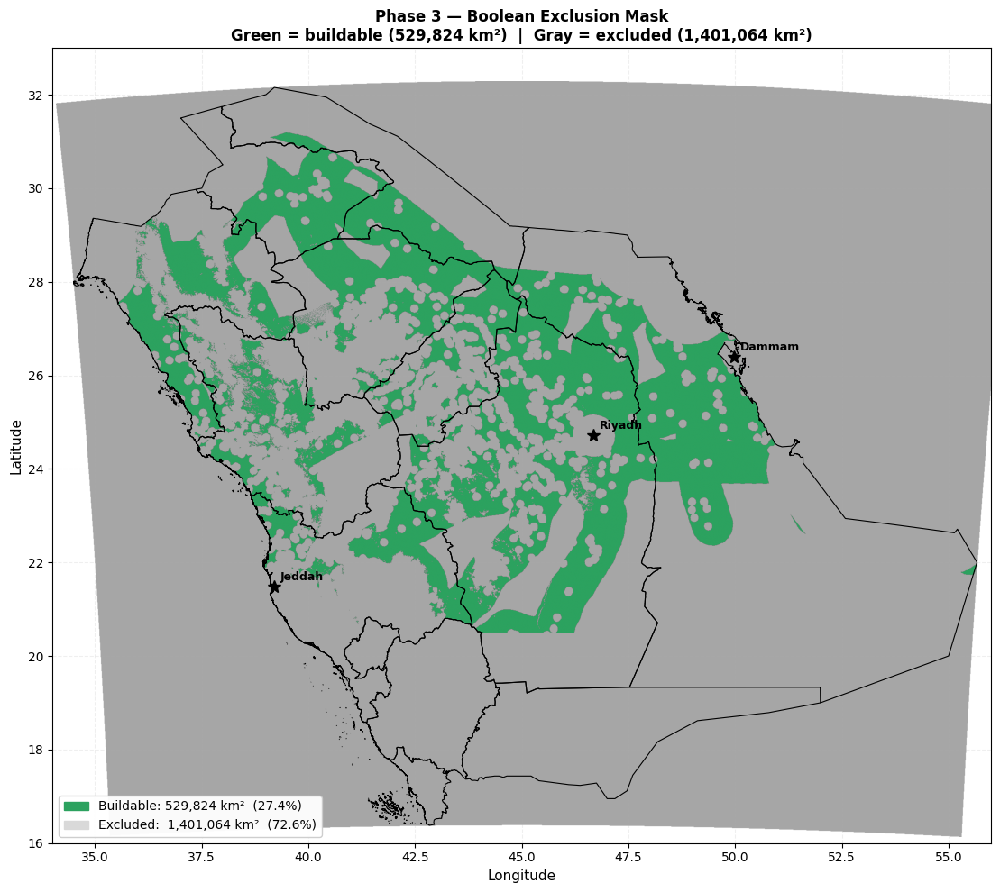

✓ Saved: outputs/phase3/01_exclusion_mask_map.png


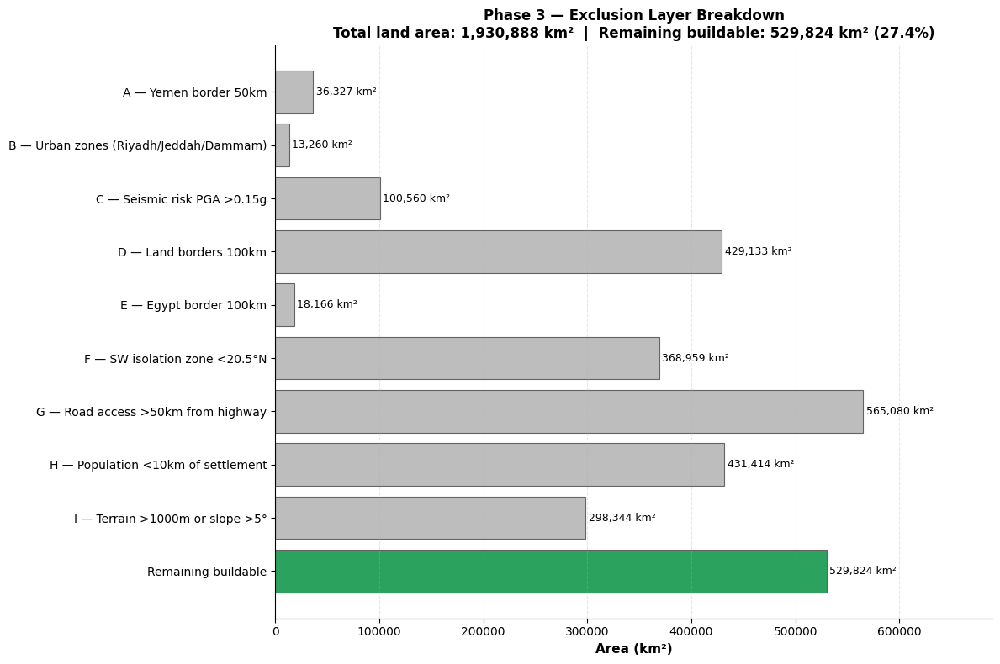

✓ Saved: outputs/phase3/02_exclusion_breakdown.png
✓ Saved 0 new/changed files to Drive

✓ Phase 3 complete — re-run Phase 5 to get updated top 20 sites


In [3]:
# ============================================================================
# VISUALISATION — Modified: gray exclusions, green buildable, separate charts
# ============================================================================

# ── FIGURE 1: Exclusion mask map ─────────────────────────────────────────────
fig1, ax1 = plt.subplots(figsize=(12, 10))

# Reproject exclusion mask to geographic for plotting
with rasterio.open(excl_path) as src:
    dst_crs     = 'EPSG:4326'
    t4, w4, h4  = calculate_default_transform(
        src.crs, dst_crs, src.width, src.height, *src.bounds)
    d4 = np.empty((h4, w4), dtype='float32')
    reproject(
        source=rasterio.band(src, 1), destination=d4,
        src_transform=src.transform, src_crs=src.crs,
        dst_transform=t4, dst_crs=dst_crs,
        resampling=Resampling.nearest)
    left, bottom, right, top = rasterio.transform.array_bounds(h4, w4, t4)

# Plot excluded areas as light gray
excluded_display = np.where(d4 == 0, 1.0, np.nan)
ax1.imshow(excluded_display, cmap='gray_r', origin='upper',
           extent=[left, right, bottom, top],
           vmin=0, vmax=1, aspect='auto', zorder=1, alpha=0.35)

# Plot buildable areas in green
buildable_display = np.where(d4 == 1, 1.0, np.nan)
green_cmap = plt.cm.colors.ListedColormap(['#2ca25f'])
ax1.imshow(buildable_display, cmap=green_cmap, origin='upper',
           extent=[left, right, bottom, top],
           vmin=0, vmax=1, aspect='auto', zorder=2)

# Province boundaries
if saudi_provinces_geo is not None:
    saudi_provinces_geo.boundary.plot(
        ax=ax1, color='black', linewidth=0.8, zorder=3)

# City markers
for city, lat, lon, radius_km in urban_zones:
    ax1.plot(lon, lat, 'k*', markersize=10, zorder=5)
    ax1.annotate(city, xy=(lon, lat),
                 xytext=(5, 5), textcoords='offset points',
                 fontsize=9, fontweight='bold', color='black')

ax1.set_xlim([34, 56])
ax1.set_ylim([16, 33])
ax1.set_xlabel('Longitude', fontsize=11)
ax1.set_ylabel('Latitude', fontsize=11)
ax1.set_title(
    'Phase 3 — Boolean Exclusion Mask\n'
    'Green = buildable (529,824 km²)  |  Gray = excluded (1,401,064 km²)',
    fontsize=12, fontweight='bold')
ax1.grid(True, alpha=0.2, linestyle='--', zorder=0)

ax1.legend(
    handles=[
        mpatches.Patch(color='#2ca25f', label=f'Buildable: {remaining:,} km²  ({remaining/total_land*100:.1f}%)'),
        mpatches.Patch(color='#d9d9d9', label=f'Excluded:  {total_land - remaining:,} km²  ({(total_land-remaining)/total_land*100:.1f}%)'),
    ],
    loc='lower left', fontsize=10, framealpha=0.95)

plt.tight_layout()
plt.savefig('outputs/phase3/01_exclusion_mask_map.png',
            dpi=300, bbox_inches='tight', facecolor='white')
plt.show()
print("✓ Saved: outputs/phase3/01_exclusion_mask_map.png")


# ── FIGURE 2: Exclusion breakdown bar chart ───────────────────────────────────
fig2, ax2 = plt.subplots(figsize=(12, 8))

bar_labels = [
    'Remaining buildable',
    'I — Terrain >1000m or slope >5°',
    'H — Population <10km of settlement',
    'G — Road access >50km from highway',
    f'F — SW isolation zone <{LAT_THRESHOLD}°N',
    'E — Egypt border 100km',
    'D — Land borders 100km',
    'C — Seismic risk PGA >0.15g',
    'B — Urban zones (Riyadh/Jeddah/Dammam)',
    'A — Yemen border 50km',
]
bar_values = [
    remaining,
    excl_I,
    excl_H,
    excl_G,
    excl_F,
    excl_E,
    excl_D,
    excl_C,
    excl_B,
    excl_A,
]
bar_colors = ['#2ca25f'] + ['#bdbdbd'] * 9

bars = ax2.barh(bar_labels, bar_values,
                color=bar_colors, edgecolor='#636363', linewidth=0.8)

for bar, val in zip(bars, bar_values):
    ax2.text(
        bar.get_width() + 3000,
        bar.get_y() + bar.get_height() / 2,
        f'{val:,} km²',
        va='center', fontsize=9, color='black')

ax2.set_xlabel('Area (km²)', fontsize=11, fontweight='bold')
ax2.set_title(
    'Phase 3 — Exclusion Layer Breakdown\n'
    f'Total land area: {total_land:,} km²  |  Remaining buildable: {remaining:,} km² ({remaining/total_land*100:.1f}%)',
    fontsize=12, fontweight='bold')
ax2.grid(axis='x', alpha=0.3, linestyle='--')
ax2.set_xlim(0, max(bar_values) * 1.22)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

plt.tight_layout()
plt.savefig('outputs/phase3/02_exclusion_breakdown.png',
            dpi=300, bbox_inches='tight', facecolor='white')
plt.show()
print("✓ Saved: outputs/phase3/02_exclusion_breakdown.png")

save_to_drive()
print(f"\n✓ Phase 3 complete — re-run Phase 5 to get updated top 20 sites")

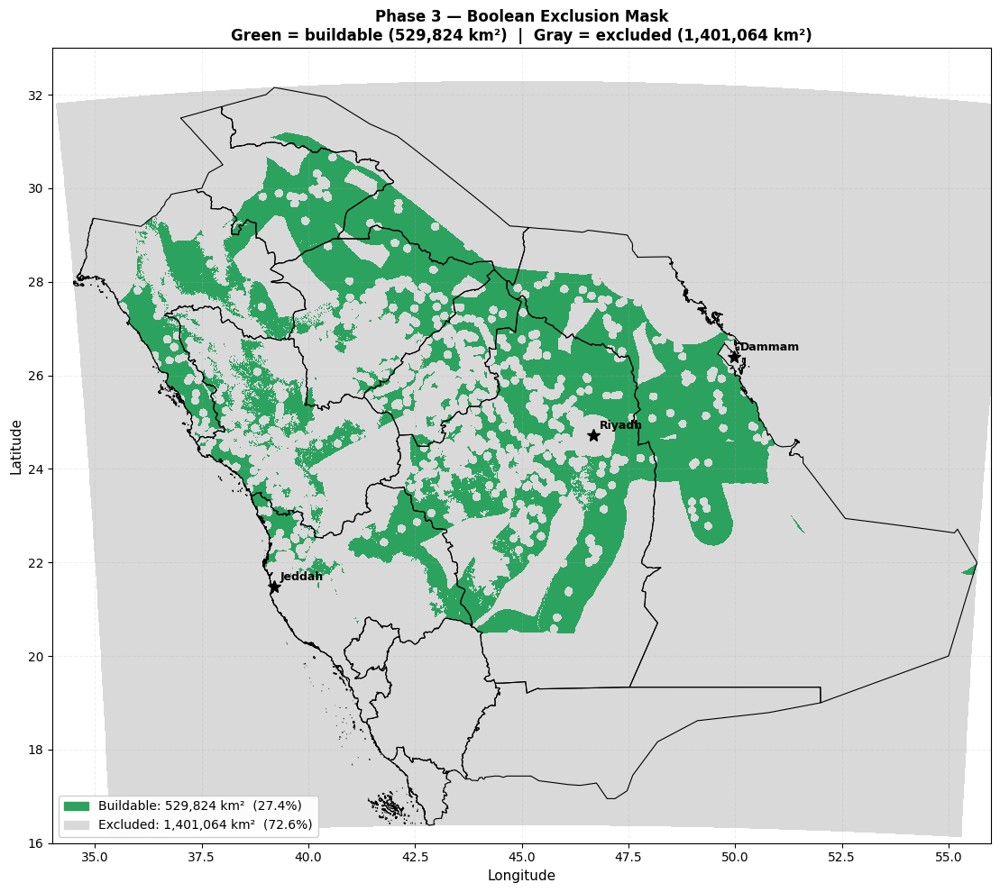

✓ Saved: outputs/phase3/01_exclusion_mask_map_gray.png
✓ Saved 0 new/changed files to Drive

✓ Phase 3 complete — re-run Phase 5 to get updated top 20 sites


In [4]:
# ── FIGURE 1: Exclusion mask map ─────────────────────────────────────────────
fig1, ax1 = plt.subplots(figsize=(12, 10))

# Reproject exclusion mask to geographic
with rasterio.open(excl_path) as src:
    dst_crs    = 'EPSG:4326'
    t4, w4, h4 = calculate_default_transform(
        src.crs, dst_crs, src.width, src.height, *src.bounds)
    d4 = np.empty((h4, w4), dtype='float32')
    reproject(
        source=rasterio.band(src, 1), destination=d4,
        src_transform=src.transform, src_crs=src.crs,
        dst_transform=t4, dst_crs=dst_crs,
        resampling=Resampling.nearest)
    left, bottom, right, top = rasterio.transform.array_bounds(h4, w4, t4)

# Build single RGB image: green for buildable, gray for excluded
# Green (#2ca25f) = (44, 162, 95); Gray (#d9d9d9) = (217, 217, 217)
rgb = np.zeros((h4, w4, 3), dtype=np.uint8)
rgb[d4 == 1] = [44, 162, 95]    # buildable — green
rgb[d4 == 0] = [217, 217, 217]  # excluded  — gray
rgb[d4 < 0]  = [255, 255, 255]  # nodata    — white

ax1.imshow(rgb, origin='upper',
           extent=[left, right, bottom, top],
           aspect='auto', zorder=1, interpolation='nearest')

# Province boundaries
if saudi_provinces_geo is not None:
    saudi_provinces_geo.boundary.plot(
        ax=ax1, color='black', linewidth=0.8, zorder=2)

# City markers
for city, lat, lon, radius_km in urban_zones:
    ax1.plot(lon, lat, 'k*', markersize=10, zorder=5)
    ax1.annotate(city, xy=(lon, lat),
                 xytext=(5, 5), textcoords='offset points',
                 fontsize=9, fontweight='bold', color='black')

ax1.set_xlim([34, 56])
ax1.set_ylim([16, 33])
ax1.set_xlabel('Longitude', fontsize=11)
ax1.set_ylabel('Latitude', fontsize=11)
ax1.set_title(
    'Phase 3 — Boolean Exclusion Mask\n'
    'Green = buildable (529,824 km²)  |  Gray = excluded (1,401,064 km²)',
    fontsize=12, fontweight='bold')
ax1.grid(True, alpha=0.2, linestyle='--', zorder=0)

ax1.legend(
    handles=[
        mpatches.Patch(color='#2ca25f',
            label=f'Buildable: {remaining:,} km²  ({remaining/total_land*100:.1f}%)'),
        mpatches.Patch(color='#d9d9d9', edgecolor='#636363',
            label=f'Excluded: {total_land-remaining:,} km²  ({(total_land-remaining)/total_land*100:.1f}%)'),
    ],
    loc='lower left', fontsize=10, framealpha=0.95)

plt.tight_layout()
plt.savefig('outputs/phase3/01_exclusion_mask_map_gray.png',
            dpi=300, bbox_inches='tight', facecolor='white')
plt.show()
print("✓ Saved: outputs/phase3/01_exclusion_mask_map_gray.png")

save_to_drive()
print(f"\n✓ Phase 3 complete — re-run Phase 5 to get updated top 20 sites")

PHASE 4: AHP WEIGHT DERIVATION

Verifying matrix reciprocal consistency...
  ✓ All reciprocals consistent

Pairwise Comparison Matrix (Saaty 1–9 scale):
                        C1 Ren  C2 Coo  C3 Gri  C4 Fib  C5 Wat  C6 Sei  C7 Eco
  ────────────────────────────────────────────────────────────────────────────────
  C1 Renewable Energy       1.00     1/3     1/2    5.00     1/2    2.00    3.00
  C2 Cooling Suitability    3.00    1.00    2.00    7.00    3.00    4.00    5.00
  C3 Grid Infrastructure    2.00     1/2    1.00    6.00    3.00    3.00    4.00
  C4 Fiber & Connectivity     1/5     1/7     1/6    1.00     1/5     1/4     1/3
  C5 Water Availability     2.00     1/3     1/3    5.00    1.00    2.00    3.00
  C6 Seismic & Security      1/2     1/4     1/3    4.00     1/2    1.00    2.00
  C7 Economic Viability      1/3     1/5     1/4    3.00     1/3     1/2    1.00

AHP PRIORITY WEIGHTS

  Criterion                   Weight        %  Rank
  ────────────────────────────────────────

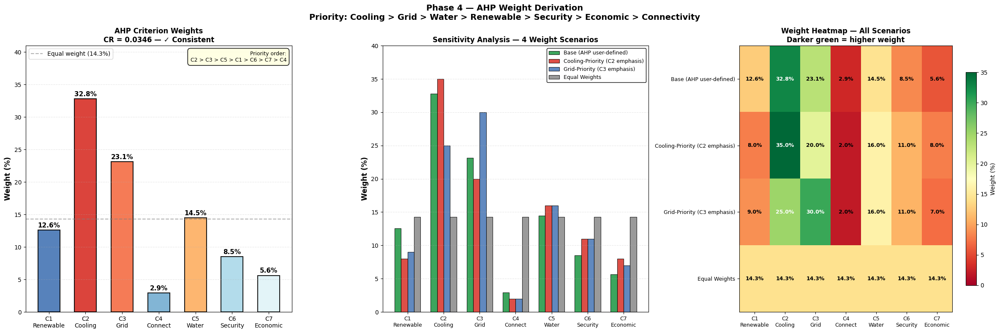


✓ AHP weight chart saved: outputs/phase3/02_ahp_weights.png
✓ AHP weights saved: data/processed/ahp_weights.json
✓ Saved 0 new/changed files to Drive
✓ Backed up to Drive

PHASE 4 COMPLETE — WEIGHT SUMMARY
  #1 C2 Cooling Suitability     32.8%  ████████████████
  #2 C3 Grid Infrastructure     23.1%  ███████████
  #3 C5 Water Availability      14.5%  ███████
  #4 C1 Renewable Energy        12.6%  ██████
  #5 C6 Seismic & Security       8.5%  ████
  #6 C7 Economic Viability       5.6%  ██
  #7 C4 Fiber & Connectivity     2.9%  █

  CR = 0.0346 — ✓ Consistent

Next: Phase 5 — Suitability Index Computation


In [ ]:
#!/usr/bin/env python
# coding: utf-8

# ============================================================================
# PHASE 4: AHP WEIGHT DERIVATION (UPDATED)
# Priority order: C2 Cooling > C3 Grid > C5 Water > C1 Renewable >
#                 C6 Security > C7 Economic > C4 Connectivity
# Computes: priority weights, lambda_max, CI, CR
# Target: CR < 0.10 (Saaty 1980)
# ============================================================================

print("=" * 60)
print("PHASE 4: AHP WEIGHT DERIVATION")
print("=" * 60)

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd
import json
import os

# ---- Criteria labels ----
criteria_labels = [
    'C1 Renewable Energy',
    'C2 Cooling Suitability',
    'C3 Grid Infrastructure',
    'C4 Fiber & Connectivity',
    'C5 Water Availability',
    'C6 Seismic & Security',
    'C7 Economic Viability'
]

short_labels = [
    'C1\nRenewable',
    'C2\nCooling',
    'C3\nGrid',
    'C4\nConnect',
    'C5\nWater',
    'C6\nSecurity',
    'C7\nEconomic'
]

n = len(criteria_labels)

# ---- Pairwise comparison matrix (Saaty 1-9 scale) ----
# Reading: A[i,j] = importance of row i RELATIVE TO column j
# Value > 1: row i more important than column j
# Value < 1: row i less important than column j
#
# Priority: C2 > C3 > C5 > C1 > C6 > C7 > C4
# C3 Grid is now scored 3x above C5 Water (updated from 2x)
#
#           C1    C2    C3    C4    C5    C6    C7
A = np.array([
# C1
    [1,    1/3,  1/2,  5,    1/2,  2,    3   ],
# C2
    [3,    1,    2,    7,    3,    4,    5   ],
# C3
    [2,    1/2,  1,    6,    3,    3,    4   ],
# C4
    [1/5,  1/7,  1/6,  1,    1/5,  1/4,  1/3 ],
# C5
    [2,    1/3,  1/3,  5,    1,    2,    3   ],
# C6
    [1/2,  1/4,  1/3,  4,    1/2,  1,    2   ],
# C7
    [1/3,  1/5,  1/4,  3,    1/3,  1/2,  1   ],
], dtype=float)

# ---- Step 1: Verify reciprocal consistency ----
print("\nVerifying matrix reciprocal consistency...")
reciprocal_ok = True
for i in range(n):
    for j in range(n):
        expected = 1.0 / A[j, i]
        if abs(A[i, j] - expected) > 0.001:
            print(f"  ⚠ A[{i},{j}]={A[i,j]:.3f} should be "
                  f"1/A[{j},{i}]=1/{A[j,i]:.3f}={expected:.3f}")
            reciprocal_ok = False
if reciprocal_ok:
    print("  ✓ All reciprocals consistent")

# ---- Step 2: Normalise matrix (column sum method) ----
col_sums = A.sum(axis=0)
A_norm   = A / col_sums

# ---- Step 3: Priority vector (weights = row means of normalised matrix) ----
weights = A_norm.mean(axis=1)

# ---- Step 4: Consistency check ----
weighted_sum = A @ weights
lambda_vals  = weighted_sum / weights
lambda_max   = lambda_vals.mean()

CI = (lambda_max - n) / (n - 1)

# Saaty (1980) Random Consistency Index table
RI_table = {1: 0.00, 2: 0.00, 3: 0.58, 4: 0.90,
            5: 1.12, 6: 1.24, 7: 1.32, 8: 1.41, 9: 1.45}
RI = RI_table[n]
CR = CI / RI

# ---- Print pairwise matrix ----
print("\nPairwise Comparison Matrix (Saaty 1–9 scale):")
print(f"{'':>22}", end='')
for c in criteria_labels:
    print(f"  {c[:6]:>6}", end='')
print()
print(f"  {'─'*80}")
for i, label in enumerate(criteria_labels):
    print(f"  {label:<22}", end='')
    for j in range(n):
        val = A[i, j]
        if val >= 1:
            print(f"  {val:>6.2f}", end='')
        else:
            denom = int(round(1 / val))
            print(f"  {'1/'+str(denom):>6}", end='')
    print()

# ---- Print weights ----
print("\n" + "=" * 60)
print("AHP PRIORITY WEIGHTS")
print("=" * 60)
print(f"\n  {'Criterion':<25} {'Weight':>8} {'%':>8}  Rank")
print(f"  {'─'*50}")
ranked = sorted(enumerate(weights), key=lambda x: x[1], reverse=True)
for rank, (i, w) in enumerate(ranked, 1):
    print(f"  {criteria_labels[i]:<25} {w:>8.4f} {w*100:>7.1f}%  #{rank}")

print(f"\n  Sum of weights: {weights.sum():.6f}")
print(f"\n  Consistency Statistics:")
print(f"  {'─'*35}")
print(f"  λ_max:          {lambda_max:.4f}")
print(f"  CI:             {CI:.4f}")
print(f"  RI (n=7):       {RI:.4f}")
print(f"  CR:             {CR:.4f}  ", end='')
if CR < 0.10:
    print(f"✓ CONSISTENT  (CR < 0.10 — Saaty 1980 threshold)")
else:
    print(f"✗ INCONSISTENT (CR > 0.10 — matrix needs revision)")
print("=" * 60)

# ---- Verify priority order ----
print("\nPriority order check:")
order_labels = [criteria_labels[i] for i, _ in ranked]
for k in range(len(order_labels) - 1):
    w1 = weights[[criteria_labels.index(order_labels[k])]][0]
    w2 = weights[[criteria_labels.index(order_labels[k+1])]][0]
    print(f"  {order_labels[k][:20]:<20} ({w1*100:.1f}%)  "
          f">  {order_labels[k+1][:20]:<20} ({w2*100:.1f}%)  ✓")

# ---- Sensitivity analysis — 4 scenarios ----
print("\n" + "=" * 60)
print("SENSITIVITY ANALYSIS — 4 WEIGHT SCENARIOS")
print("=" * 60)

scenarios = {
    'Base (AHP\nuser-defined)': weights.copy(),

    'Cooling-Priority\n(C2 emphasis)': np.array(
        [0.08, 0.35, 0.20, 0.02, 0.16, 0.11, 0.08]),

    'Grid-Priority\n(C3 emphasis)': np.array(
        [0.09, 0.25, 0.30, 0.02, 0.16, 0.11, 0.07]),

    'Equal\nWeights': np.full(n, 1/n),
}

# Normalise custom scenarios to sum to 1
for name in list(scenarios.keys())[1:]:
    scenarios[name] = scenarios[name] / scenarios[name].sum()

print(f"\n  {'Criterion':<25}", end='')
for s in scenarios:
    print(f"  {s.split(chr(10))[0]:>16}", end='')
print()
print(f"  {'─'*90}")
for i, label in enumerate(criteria_labels):
    print(f"  {label:<25}", end='')
    for w_arr in scenarios.values():
        print(f"  {w_arr[i]*100:>15.1f}%", end='')
    print()

# Spearman rank correlation between scenarios
from scipy.stats import spearmanr
base_w = list(scenarios.values())[0]
print(f"\n  Spearman rank correlation with Base scenario:")
for s_name, s_w in list(scenarios.items())[1:]:
    rho, pval = spearmanr(base_w, s_w)
    print(f"    {s_name.split(chr(10))[0]:<25}: ρ = {rho:.3f}  "
          f"(p = {pval:.3f})")

# ---- Visualisation ----
os.makedirs('outputs/phase3', exist_ok=True)

fig, axes = plt.subplots(1, 3, figsize=(24, 8))

# ---- Panel 1: Weight bar chart ----
ax1 = axes[0]

bar_colors = ['#4575b4', '#d73027', '#f46d43', '#74add1',
              '#fdae61', '#abd9e9', '#e0f3f8']

bars = ax1.bar(
    short_labels, weights * 100,
    color=bar_colors, edgecolor='black',
    linewidth=1.5, alpha=0.9, width=0.6
)

for bar, w in zip(bars, weights):
    ax1.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + 0.4,
        f'{w*100:.1f}%',
        ha='center', fontsize=11, fontweight='bold'
    )

ax1.set_ylabel('Weight (%)', fontsize=12, fontweight='bold')
ax1.set_title(
    f'AHP Criterion Weights\n'
    f'CR = {CR:.4f} — '
    f'{"✓ Consistent" if CR < 0.10 else "✗ Inconsistent"}',
    fontsize=12, fontweight='bold'
)
ax1.set_ylim(0, max(weights) * 100 * 1.25)
ax1.grid(axis='y', alpha=0.3, linestyle='--')
ax1.axhline(
    y=100 / n, color='gray', linestyle='--',
    linewidth=1.5, alpha=0.6,
    label=f'Equal weight ({100/n:.1f}%)'
)
ax1.legend(fontsize=10)

# Priority order annotation
priority_text = "Priority order:\nC2 > C3 > C5 > C1 > C6 > C7 > C4"
ax1.text(
    0.98, 0.98, priority_text,
    transform=ax1.transAxes, fontsize=9,
    ha='right', va='top',
    bbox=dict(boxstyle='round,pad=0.5', facecolor='lightyellow',
              edgecolor='black', linewidth=1.2, alpha=0.9)
)

# ---- Panel 2: Sensitivity analysis grouped bars ----
ax2 = axes[1]
x  = np.arange(n)
bw = 0.18
scenario_colors = ['#1a9641', '#d73027', '#4575b4', '#888888']

for k, (s_name, s_weights) in enumerate(scenarios.items()):
    ax2.bar(
        x + k * bw, s_weights * 100,
        bw,
        label=s_name.replace('\n', ' '),
        color=scenario_colors[k],
        edgecolor='black', linewidth=0.8, alpha=0.85
    )

ax2.set_xticks(x + bw * 1.5)
ax2.set_xticklabels(short_labels, fontsize=9)
ax2.set_ylabel('Weight (%)', fontsize=12, fontweight='bold')
ax2.set_title('Sensitivity Analysis — 4 Weight Scenarios',
              fontsize=12, fontweight='bold')
ax2.legend(fontsize=9, loc='upper right',
           framealpha=0.95, edgecolor='black')
ax2.grid(axis='y', alpha=0.3, linestyle='--')
ax2.set_ylim(0, 40)

# ---- Panel 3: Normalised weight comparison (radar-style bar) ----
ax3 = axes[2]

# Show how each scenario shifts weights relative to base
scenario_names = list(scenarios.keys())
s_weights_arr  = np.array([list(s.values()) for s in
                            [dict(zip(criteria_labels, w))
                             for w in scenarios.values()]])

im = ax3.imshow(
    np.array([w * 100 for w in scenarios.values()]),
    cmap='RdYlGn', aspect='auto', vmin=0, vmax=35
)
plt.colorbar(im, ax=ax3, shrink=0.8, label='Weight (%)')

ax3.set_xticks(range(n))
ax3.set_xticklabels(short_labels, fontsize=9)
ax3.set_yticks(range(len(scenarios)))
ax3.set_yticklabels(
    [s.replace('\n', ' ') for s in scenarios.keys()],
    fontsize=9
)

# Add weight values inside cells
for i, (s_name, s_w) in enumerate(scenarios.items()):
    for j, w in enumerate(s_w):
        ax3.text(j, i, f'{w*100:.1f}%',
                 ha='center', va='center',
                 fontsize=9, fontweight='bold',
                 color='black' if w * 100 < 25 else 'white')

ax3.set_title('Weight Heatmap — All Scenarios\n'
              'Darker green = higher weight',
              fontsize=12, fontweight='bold')

plt.suptitle(
    'Phase 4 — AHP Weight Derivation\n'
    'Priority: Cooling > Grid > Water > Renewable > Security > Economic > Connectivity',
    fontsize=14, fontweight='bold'
)
plt.tight_layout()
plt.savefig('outputs/phase3/02_ahp_weights.png',
            dpi=300, bbox_inches='tight')
plt.show()
print("\n✓ AHP weight chart saved: outputs/phase3/02_ahp_weights.png")

# ---- Save weights to JSON for Phase 5 ----
ahp_output = {
    'weights': {
        label: float(w)
        for label, w in zip(criteria_labels, weights)
    },
    'lambda_max':  float(lambda_max),
    'CI':          float(CI),
    'RI':          float(RI),
    'CR':          float(CR),
    'consistent':  bool(CR < 0.10),
    'n_criteria':  n,
    'priority_order': [criteria_labels[i] for i, _ in ranked],
    'matrix': A.tolist(),
    'scenarios': {
        name: s_w.tolist()
        for name, s_w in scenarios.items()
    }
}

os.makedirs('data/processed', exist_ok=True)
with open('data/processed/ahp_weights.json', 'w') as f:
    json.dump(ahp_output, f, indent=2)

print("✓ AHP weights saved: data/processed/ahp_weights.json")

save_to_drive()
print("✓ Backed up to Drive")

# ---- Final summary ----
print("\n" + "=" * 60)
print("PHASE 4 COMPLETE — WEIGHT SUMMARY")
print("=" * 60)
for rank, (i, w) in enumerate(ranked, 1):
    bar = '█' * int(w * 100 / 2)
    print(f"  #{rank} {criteria_labels[i]:<25} "
          f"{w*100:>5.1f}%  {bar}")
print(f"\n  CR = {CR:.4f} — "
      f"{'✓ Consistent' if CR < 0.10 else '✗ Needs revision'}")
print("=" * 60)
print("\nNext: Phase 5 — Suitability Index Computation")

PHASE 5: SUITABILITY INDEX COMPUTATION

✓ AHP weights loaded (CR = 0.0346)

Building criterion composite scores...
  ✓ C1 Renewable Energy: 3 sub-layers averaged
  ✓ C2 Cooling Suitability: 4 sub-layers averaged
  ✓ C3 Grid Infrastructure: 1 sub-layers averaged
  ✓ C4 Fiber & Connectivity: 1 sub-layers averaged
  ✓ C5 Water Availability: 3 sub-layers averaged
  ✓ C6 Seismic & Security: 2 sub-layers averaged
  ✓ C7 Economic Viability: 2 sub-layers averaged

Computing Weighted Linear Combination...
  C1 Renewable Energy: weight=0.1259 (12.6%)
  C2 Cooling Suitability: weight=0.3278 (32.8%)
  C3 Grid Infrastructure: weight=0.2313 (23.1%)
  C4 Fiber & Connectivity: weight=0.0291 (2.9%)
  C5 Water Availability: weight=0.1448 (14.5%)
  C6 Seismic & Security: weight=0.0848 (8.5%)
  C7 Economic Viability: weight=0.0562 (5.6%)

  Weight total used: 1.0000
  SI range (land):   26.0–79.3
  SI mean:           62.1

Applying Boolean exclusion mask...
  ✓ 1,401,064 km² removed by exclusion mask
  Re

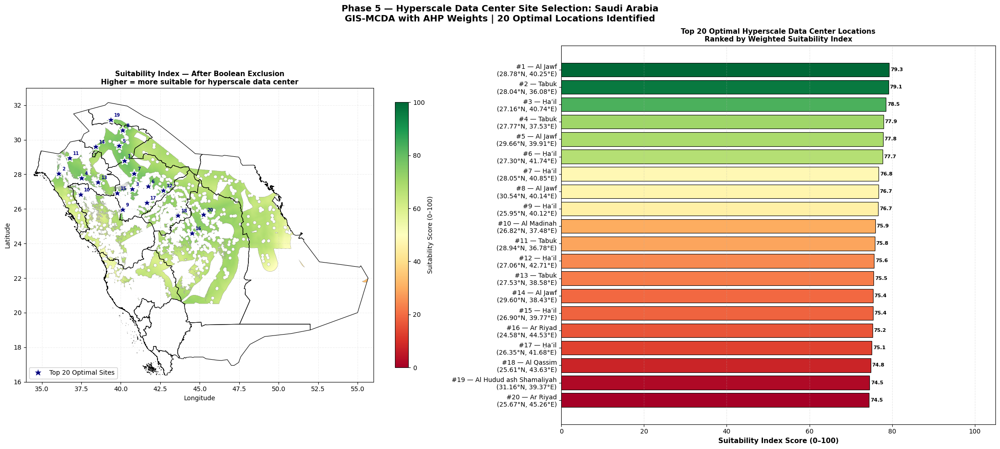


TOP 20 OPTIMAL HYPERSCALE DATA CENTER LOCATIONS
  Rank  Province                         Lat     Lon   Score
  ------------------------------------------------------------
  #1    Al Jawf                       28.779  40.252    79.3
  #2    Tabuk                         28.039  36.080    79.1
  #3    Ḥaʼil                         27.155  40.736    78.5
  #4    Tabuk                         27.766  37.525    77.9
  #5    Al Jawf                       29.659  39.912    77.8
  #6    Ḥaʼil                         27.299  41.740    77.7
  #7    Ḥaʼil                         28.051  40.854    76.8
  #8    Al Jawf                       30.541  40.138    76.7
  #9    Ḥaʼil                         25.955  40.122    76.7
  #10   Al Madinah                    26.820  37.479    75.9
  #11   Tabuk                         28.944  36.778    75.8
  #12   Ḥaʼil                         27.057  42.714    75.6
  #13   Tabuk                         27.532  38.580    75.5
  #14   Al Jawf                   

In [5]:
# ============================================================================
# PHASE 5, CELL 1: Suitability Index Computation
# SI = Σ(Wi × Ci) for i = 1..7
# Then apply Boolean exclusion mask
# Then apply 50km minimum separation to identify 20 distinct sites
# ============================================================================

print("=" * 60)
print("PHASE 5: SUITABILITY INDEX COMPUTATION")
print("=" * 60)

import json
from scipy.ndimage import maximum_filter, label as ndimage_label

os.makedirs('outputs/phase5', exist_ok=True)

# ---- Load AHP weights ----
with open('data/processed/ahp_weights.json', 'r') as f:
    ahp_data = json.load(f)

weights_dict = ahp_data['weights']
print(f"\n✓ AHP weights loaded (CR = {ahp_data['CR']:.4f})")

# Map weights to normalised array keys
weight_map = {
    'C1 Renewable Energy':    ('c1_ghi', 'c1_wind', 'c1_dist_renewable'),
    'C2 Cooling Suitability': ('c2_temp_mean', 'c2_hours_above35',
                               'c2_wetbulb', 'c2_humidity'),
    'C3 Grid Infrastructure': ('c3_dist_transmission',),
    'C4 Fiber & Connectivity':('c4_dist_subsea',),
    'C5 Water Availability':  ('c5_dist_desalination', 'c5_dist_aquifer',
                               'c5_salinity'),
    'C6 Seismic & Security':  ('c6_seismic_pga', 'c6_dist_yemen'),
    'C7 Economic Viability':  ('c7_dist_modon', 'c7_dist_sez'),
}

# ---- Step 1: Build composite score per criterion ----
print("\nBuilding criterion composite scores...")
criterion_composites = {}
for criterion, sub_keys in weight_map.items():
    available = [k for k in sub_keys if k in normalised_arrays]
    if not available:
        print(f"  ⚠ No sub-layers for {criterion} — skipping")
        continue
    stack = np.stack([normalised_arrays[k] for k in available], axis=0)
    composite = np.nanmean(stack, axis=0)
    composite = np.where(land_mask == 1, composite, np.nan)
    criterion_composites[criterion] = composite
    print(f"  ✓ {criterion}: {len(available)} sub-layers averaged")

# ---- Step 2: Weighted Linear Combination ----
print("\nComputing Weighted Linear Combination...")

SI = np.zeros((NROWS, NCOLS), dtype='float32')
weight_total = 0.0

for criterion, composite in criterion_composites.items():
    w = weights_dict.get(criterion, 0.0)
    SI += np.nan_to_num(composite, nan=0.0) * w
    weight_total += w
    print(f"  {criterion}: weight={w:.4f} ({w*100:.1f}%)")

# Normalise in case weights don't sum exactly to 1
if weight_total > 0:
    SI = SI / weight_total

# Apply land mask
SI = np.where(land_mask == 1, SI, np.nan)

print(f"\n  Weight total used: {weight_total:.4f}")
print(f"  SI range (land):   {np.nanmin(SI):.1f}–{np.nanmax(SI):.1f}")
print(f"  SI mean:           {np.nanmean(SI):.1f}")

# ---- Step 3: Apply Boolean exclusion mask ----
print("\nApplying Boolean exclusion mask...")
excl_mask = load_raster_array('data/processed/rasters/exclusion_mask.tif')
SI_masked = np.where(excl_mask == 1, SI, np.nan)

excl_cells = int(np.sum(~np.isnan(SI) & np.isnan(SI_masked)))
print(f"  ✓ {excl_cells:,} km² removed by exclusion mask")
print(f"  Remaining buildable SI range: "
      f"{np.nanmin(SI_masked):.1f}–{np.nanmax(SI_masked):.1f}")

# Save raw and masked SI rasters
save_normalised_raster(SI,        'data/processed/rasters/SI_raw.tif')
save_normalised_raster(SI_masked, 'data/processed/rasters/SI_masked.tif')
print("✓ SI rasters saved")

# ============================================================================
# PHASE 5 — STEP 4 (FIXED): Extract top 20 sites with 50km minimum separation
# Bug fix: distance now computed correctly in metres using actual UTM coordinates
# ============================================================================

SEP_KM  = 100        # minimum separation in km
SEP_M   = SEP_KM * 1000  # in metres
N_SITES = 20

print(f"\nExtracting top {N_SITES} sites ({SEP_KM}km minimum separation)...")
print("Method: greedy selection — pick best remaining cell, mask radius, repeat")

selected_sites = []
SI_work = SI_masked.copy()

# Pre-compute UTM coordinates for every grid cell
cell_easting  = XMIN + (np.arange(NCOLS) + 0.5) * RESOLUTION_M
cell_northing = YMAX - (np.arange(NROWS) + 0.5) * RESOLUTION_M
cell_e_grid, cell_n_grid = np.meshgrid(cell_easting, cell_northing)
# Shape: (NROWS, NCOLS) — UTM metres

while len(selected_sites) < N_SITES:

    # Find current highest scoring valid cell
    if np.all(np.isnan(SI_work)):
        print(f"  ⚠ Ran out of valid cells — found {len(selected_sites)} sites")
        break

    best_idx        = np.nanargmax(SI_work)
    best_row, best_col = np.unravel_index(best_idx, SI_work.shape)
    best_score      = float(SI_work[best_row, best_col])

    # UTM coordinates of selected site
    site_e = float(cell_e_grid[best_row, best_col])
    site_n = float(cell_n_grid[best_row, best_col])

    # Convert to geographic coordinates (EPSG:4326)
    site_gdf = gpd.GeoDataFrame(
        geometry=[Point(site_e, site_n)],
        crs=TARGET_CRS
    ).to_crs('EPSG:4326')

    site_lon = float(site_gdf.geometry.x.values[0])
    site_lat = float(site_gdf.geometry.y.values[0])

    selected_sites.append({
        'rank':        len(selected_sites) + 1,
        'score':       round(best_score, 2),
        'row':         int(best_row),
        'col':         int(best_col),
        'longitude':   round(site_lon, 4),
        'latitude':    round(site_lat, 4),
        'easting_m':   round(site_e, 0),
        'northing_m':  round(site_n, 0),
    })

    # ---- FIXED: Mask 50km radius using true UTM distances ----
    # Compute Euclidean distance in metres from selected site to every cell
    dist_from_site = np.sqrt(
        (cell_e_grid - site_e)**2 +
        (cell_n_grid - site_n)**2
    )  # shape (NROWS, NCOLS), values in metres

    # Mask all cells within SEP_M of the selected site
    SI_work[dist_from_site <= SEP_M] = np.nan

    masked_cells = int((dist_from_site <= SEP_M)[~np.isnan(SI_masked)].sum())
    print(f"  Site {len(selected_sites):>2}: score={best_score:.1f}  "
          f"lat={site_lat:.3f}°N  lon={site_lon:.3f}°E  "
          f"[masked {masked_cells:,} cells within {SEP_KM}km]")

print(f"\n✓ {len(selected_sites)} sites selected with ≥{SEP_KM}km separation")

# ---- Verify minimum separation between all selected sites ----
print("\nVerifying separation between all selected pairs...")
min_sep = float('inf')
worst_pair = None
for i in range(len(selected_sites)):
    for j in range(i+1, len(selected_sites)):
        s1 = selected_sites[i]
        s2 = selected_sites[j]
        dist = np.sqrt(
            (s1['easting_m'] - s2['easting_m'])**2 +
            (s1['northing_m'] - s2['northing_m'])**2
        ) / 1000   # km
        if dist < min_sep:
            min_sep = dist
            worst_pair = (s1['rank'], s2['rank'])

print(f"  Minimum separation: {min_sep:.1f} km "
      f"(between sites #{worst_pair[0]} and #{worst_pair[1]})")
if min_sep >= SEP_KM:
    print(f"  ✓ All sites are ≥{SEP_KM}km apart — constraint satisfied")
else:
    print(f"  ⚠ Separation constraint violated — check exclusion mask")

# ---- Step 5: Save results ----
sites_df = pd.DataFrame(selected_sites)

# Spatial join to get province name
sites_gdf = gpd.GeoDataFrame(
    sites_df,
    geometry=gpd.points_from_xy(
        sites_df['longitude'], sites_df['latitude']),
    crs='EPSG:4326'
)

saudi_prov_geo = gpd.read_file('data/boundaries/saudi_provinces.geojson')
sites_joined = gpd.sjoin(
    sites_gdf, saudi_prov_geo[['NAME_1','geometry']],
    how='left', predicate='within'
)
sites_gdf['province'] = sites_joined['NAME_1'].values

# Save
sites_gdf.to_file('data/processed/top20_sites.geojson', driver='GeoJSON')
sites_df['province'] = sites_gdf['province']
sites_df.to_csv('data/processed/top20_sites.csv', index=False)

print(f"\n✓ Top {len(selected_sites)} sites saved")
print(f"  data/processed/top20_sites.geojson")
print(f"  data/processed/top20_sites.csv")

# ---- Step 6: Visualisation ----
fig, axes = plt.subplots(1, 2, figsize=(22, 10))

# Panel 1: Full suitability index map with top 20 sites
ax1 = axes[0]
mean_si, lo_si, hi_si = plot_raster_geo(
    ax1, 'data/processed/rasters/SI_masked.tif',
    'RdYlGn',
    'Suitability Index — After Boolean Exclusion\n'
    'Higher = more suitable for hyperscale data center',
    'Suitability Score (0–100)',
    vmin=0, vmax=100
)

# Plot top 20 sites
for _, site in sites_gdf.iterrows():
    ax1.plot(site.geometry.x, site.geometry.y,
             '*', color='navy', markersize=14,
             markeredgecolor='white', markeredgewidth=1.5,
             zorder=6)
    ax1.annotate(str(site['rank']),
                 xy=(site.geometry.x, site.geometry.y),
                 xytext=(5, 5), textcoords='offset points',
                 fontsize=7, fontweight='bold', color='navy',
                 zorder=7)

ax1.legend(
    handles=[plt.Line2D([0],[0], marker='*', color='w',
                         markerfacecolor='navy', markersize=14,
                         markeredgecolor='white',
                         label='Top 20 Optimal Sites')],
    loc='lower left', fontsize=10, framealpha=0.95
)

# Panel 2: Top 20 sites ranked bar chart
ax2 = axes[1]

# Colour bars by score
score_norm = (sites_df['score'] - sites_df['score'].min()) / \
             (sites_df['score'].max() - sites_df['score'].min())
bar_colors = plt.cm.RdYlGn(score_norm)

bars = ax2.barh(
    [f"#{r} — {p}\n({la:.2f}°N, {lo:.2f}°E)"
     for r, p, la, lo in zip(
         sites_df['rank'], sites_df['province'],
         sites_df['latitude'], sites_df['longitude'])],
    sites_df['score'],
    color=bar_colors, edgecolor='black', linewidth=0.8
)

for bar, score in zip(bars, sites_df['score']):
    ax2.text(bar.get_width() + 0.3, bar.get_y() + bar.get_height()/2,
             f'{score:.1f}', va='center', fontsize=8, fontweight='bold')

ax2.set_xlabel('Suitability Index Score (0–100)',
               fontsize=11, fontweight='bold')
ax2.set_title(f'Top {N_SITES} Optimal Hyperscale Data Center Locations\n'
              f'Ranked by Weighted Suitability Index',
              fontsize=11, fontweight='bold')
ax2.set_xlim(0, 105)
ax2.grid(axis='x', alpha=0.3, linestyle='--')
ax2.invert_yaxis()

plt.suptitle(
    'Phase 5 — Hyperscale Data Center Site Selection: Saudi Arabia\n'
    'GIS-MCDA with AHP Weights | 20 Optimal Locations Identified',
    fontsize=14, fontweight='bold'
)
plt.tight_layout()
plt.savefig('outputs/phase5/01_suitability_index_top20.png',
            dpi=300, bbox_inches='tight')
plt.show()

# ---- Summary table ----
print("\n" + "=" * 70)
print("TOP 20 OPTIMAL HYPERSCALE DATA CENTER LOCATIONS")
print("=" * 70)
print(f"  {'Rank':>4}  {'Province':<28} {'Lat':>7} {'Lon':>7} {'Score':>7}")
print(f"  {'-'*60}")
for _, site in sites_gdf.iterrows():
    print(f"  #{site['rank']:<3}  {str(site['province']):<28} "
          f"{site['latitude']:>7.3f} {site['longitude']:>7.3f} "
          f"{site['score']:>7.1f}")
print("=" * 70)
print(f"\n  AHP Weights applied:")
for criterion, w in sorted(weights_dict.items(),
                            key=lambda x: x[1], reverse=True):
    print(f"    {criterion:<25}: {w*100:.1f}%")
print(f"\n  Consistency Ratio: {ahp_data['CR']:.4f} "
      f"({'✓' if ahp_data['CR'] < 0.10 else '✗'})")
print(f"  Separation buffer: {SEP_KM}km between sites")
print(f"  Exclusion zones:   Yemen 50km | Riyadh 50km | "
      f"Jeddah 50km | Dammam 30km | PGA>0.15g")

save_to_drive()
print("\n✓ Phase 5 complete — all outputs saved and backed up to Drive")
print("\nNext: Phase 6 — Sensitivity Analysis")
print("      Phase 7 — Results, Validation & Write-up")

Ph 6

PHASE 6: SENSITIVITY ANALYSIS
✓ Base scenario loaded — 20 sites
✓ Exclusion mask loaded

Building criterion composites...
  ✓ C1 Renewable Energy: 3 sub-layers
  ✓ C2 Cooling Suitability: 4 sub-layers
  ✓ C3 Grid Infrastructure: 1 sub-layers
  ✓ C4 Fiber & Connectivity: 1 sub-layers
  ✓ C5 Water Availability: 3 sub-layers
  ✓ C6 Seismic & Security: 2 sub-layers
  ✓ C7 Economic Viability: 2 sub-layers

Weight comparison across scenarios:

  Criterion                                Base          Scenario A          Scenario B          Scenario C
  ────────────────────────────────────────────────────────────────────────────────────────────────────
  C1 Renewable Energy                     12.6%               11.0%               31.0%               14.3%
  C2 Cooling Suitability                  32.8%               27.0%               27.0%               14.3%
  C3 Grid Infrastructure                  23.1%               19.5%               15.5%               14.3%
  C4 Fiber & Connectivi

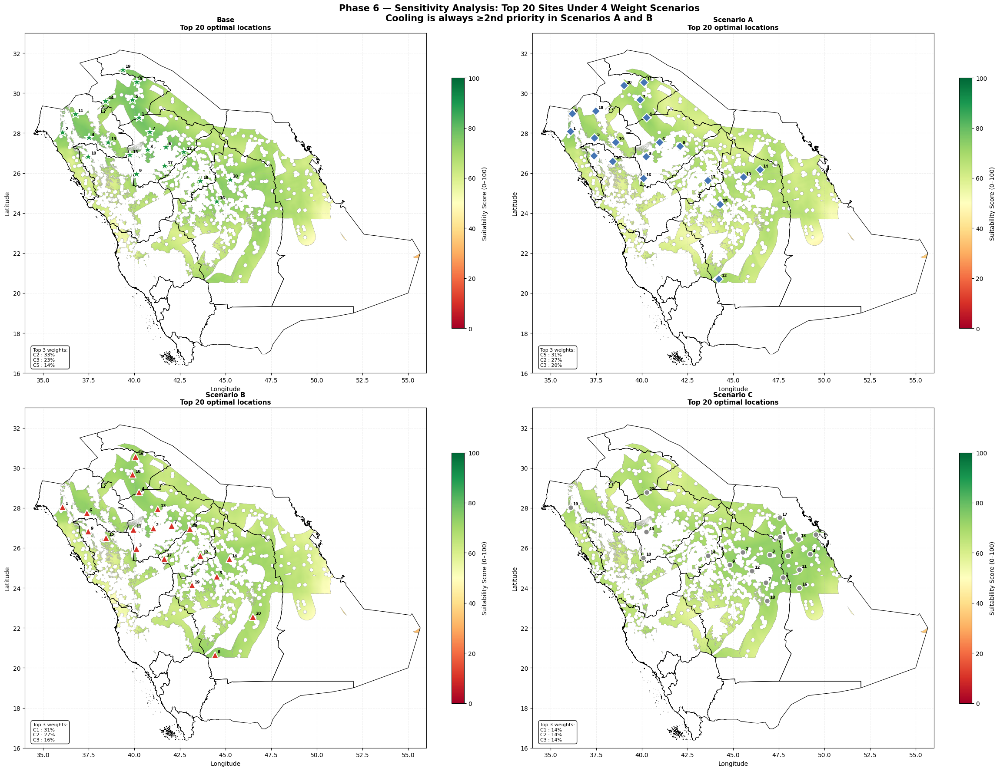

✓ 4-scenario map saved


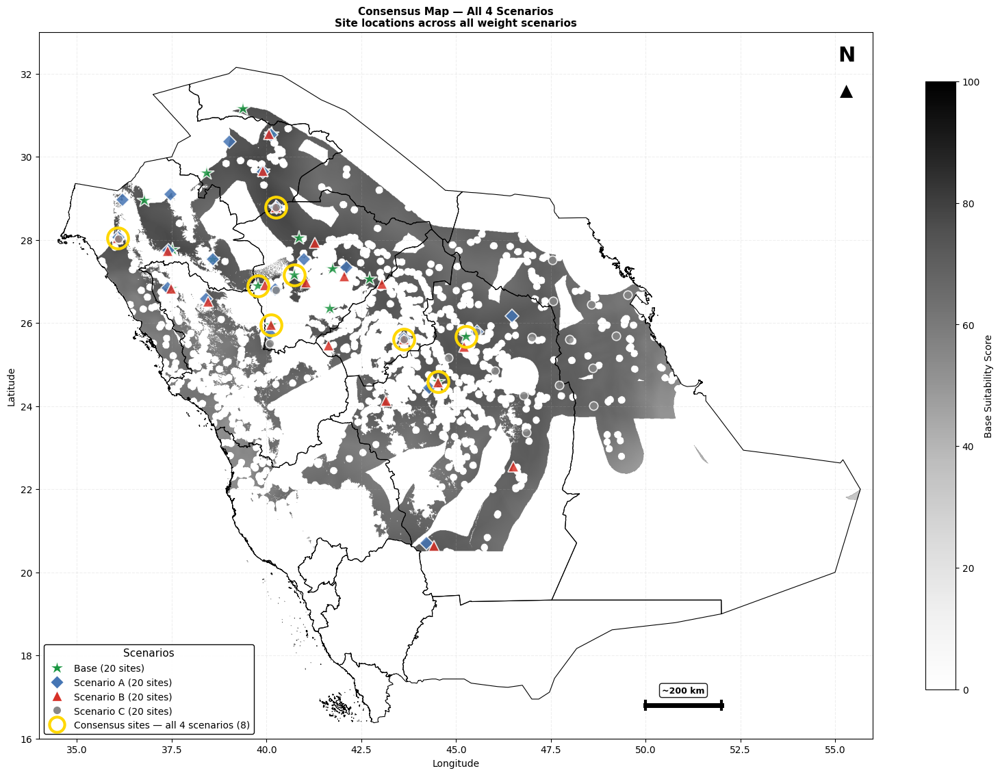

✓ Consensus map saved


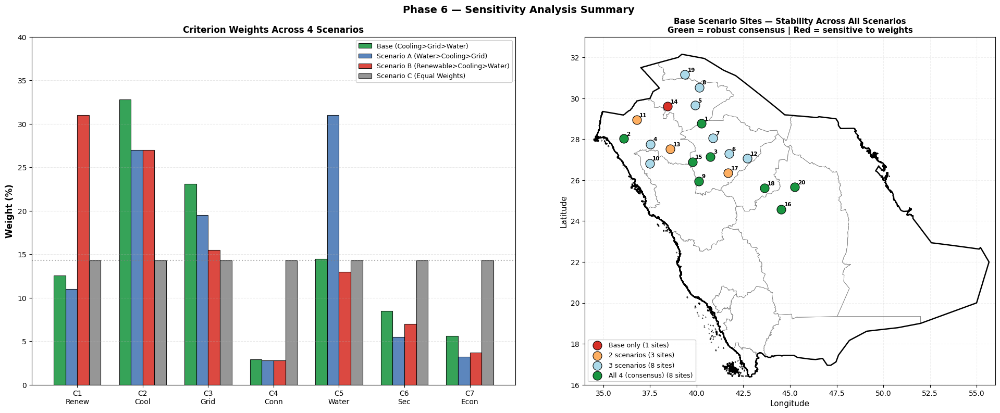

✓ Summary chart saved

PHASE 6 — FULL SITE RESULTS BY SCENARIO

  Base
  ─────────────────────────────────────────────────────────────────
  #    Province                         Lat     Lon   Score
  #1   Al Jawf                       28.779  40.252    79.3
  #2   Tabuk                         28.039  36.080    79.1
  #3   Ḥaʼil                         27.155  40.736    78.5
  #4   Tabuk                         27.766  37.525    77.9
  #5   Al Jawf                       29.659  39.912    77.8
  #6   Ḥaʼil                         27.299  41.740    77.7
  #7   Ḥaʼil                         28.051  40.854    76.8
  #8   Al Jawf                       30.541  40.138    76.7
  #9   Ḥaʼil                         25.955  40.122    76.7
  #10  Al Madinah                    26.820  37.479    75.9
  #11  Tabuk                         28.944  36.778    75.8
  #12  Ḥaʼil                         27.057  42.714    75.6
  #13  Tabuk                         27.532  38.580    75.5
  #14  Al Jawf       

In [6]:


# ============================================================================
# PHASE 6: SENSITIVITY ANALYSIS
# Three alternative weight scenarios — cooling always second:
#   Base:      C2 Cooling > C3 Grid > C5 Water > C1 Renewable > ...
#   Scenario A: C5 Water > C2 Cooling > C3 Grid > C1 Renewable > ...
#   Scenario B: C1 Renewable > C2 Cooling > C5 Water > C3 Grid > ...
#   Scenario C: Equal weights (1/7 each)
# For each scenario: compute SI, extract top 20 sites, map locations
# Then: Spearman rank correlation + consensus site analysis
# ============================================================================

print("=" * 60)
print("PHASE 6: SENSITIVITY ANALYSIS")
print("=" * 60)

import json
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
import os
from shapely.geometry import Point
from scipy.stats import spearmanr

os.makedirs('outputs/phase6', exist_ok=True)

# ---- Load base results ----
with open('data/processed/ahp_weights.json', 'r') as f:
    ahp_data = json.load(f)

base_weights = ahp_data['weights']
excl_mask    = load_raster_array('data/processed/rasters/exclusion_mask.tif')
SI_raw       = load_raster_array('data/processed/rasters/SI_raw.tif')

# Load base top 20 sites
base_sites = gpd.read_file('data/processed/top20_sites.geojson')
saudi_provinces_geo = gpd.read_file('data/boundaries/saudi_provinces.geojson')
saudi_boundary_geo  = gpd.read_file('data/boundaries/saudi_country.geojson')

print(f"✓ Base scenario loaded — {len(base_sites)} sites")
print(f"✓ Exclusion mask loaded")

# ---- Criteria labels and sub-layer mapping ----
criteria_labels = [
    'C1 Renewable Energy',
    'C2 Cooling Suitability',
    'C3 Grid Infrastructure',
    'C4 Fiber & Connectivity',
    'C5 Water Availability',
    'C6 Seismic & Security',
    'C7 Economic Viability'
]

weight_map = {
    'C1 Renewable Energy':    ('c1_ghi', 'c1_wind', 'c1_dist_renewable'),
    'C2 Cooling Suitability': ('c2_temp_mean', 'c2_hours_above35',
                               'c2_wetbulb', 'c2_humidity'),
    'C3 Grid Infrastructure': ('c3_dist_transmission',),
    'C4 Fiber & Connectivity':('c4_dist_subsea',),
    'C5 Water Availability':  ('c5_dist_desalination', 'c5_dist_aquifer',
                               'c5_salinity'),
    'C6 Seismic & Security':  ('c6_seismic_pga', 'c6_dist_yemen'),
    'C7 Economic Viability':  ('c7_dist_modon', 'c7_dist_sez'),
}

# ---- Build criterion composite scores (same as Phase 5) ----
print("\nBuilding criterion composites...")
criterion_composites = {}
for criterion, sub_keys in weight_map.items():
    available = [k for k in sub_keys if k in normalised_arrays]
    if not available:
        continue
    stack     = np.stack([normalised_arrays[k] for k in available], axis=0)
    composite = np.nanmean(stack, axis=0)
    composite = np.where(land_mask == 1, composite, np.nan)
    criterion_composites[criterion] = composite
    print(f"  ✓ {criterion}: {len(available)} sub-layers")


# ---- Helper: compute SI and extract top 20 for any weight set ----
def compute_si_and_sites(weights_dict, scenario_name,
                          sep_km=100, n_sites=20):
    """
    Given a dictionary of criterion weights, compute the suitability
    index, apply exclusion mask, extract top N sites with separation.
    Returns GeoDataFrame of selected sites.
    """
    # Weighted Linear Combination
    SI = np.zeros((NROWS, NCOLS), dtype='float32')
    weight_total = 0.0
    for criterion, composite in criterion_composites.items():
        w = weights_dict.get(criterion, 0.0)
        SI += np.nan_to_num(composite, nan=0.0) * w
        weight_total += w

    if weight_total > 0:
        SI = SI / weight_total

    SI = np.where(land_mask == 1, SI, np.nan)

    # Apply exclusion mask
    SI_masked = np.where(excl_mask == 1, SI, np.nan)

    # Extract top N sites with separation
    SEP_M   = sep_km * 1000
    cell_easting  = XMIN + (np.arange(NCOLS) + 0.5) * RESOLUTION_M
    cell_northing = YMAX - (np.arange(NROWS) + 0.5) * RESOLUTION_M
    cell_e_grid, cell_n_grid = np.meshgrid(cell_easting, cell_northing)

    selected = []
    SI_work  = SI_masked.copy()

    while len(selected) < n_sites:
        if np.all(np.isnan(SI_work)):
            break
        best_idx       = np.nanargmax(SI_work)
        best_row, best_col = np.unravel_index(best_idx, SI_work.shape)
        best_score     = float(SI_work[best_row, best_col])
        site_e = float(cell_e_grid[best_row, best_col])
        site_n = float(cell_n_grid[best_row, best_col])

        site_gdf = gpd.GeoDataFrame(
            geometry=[Point(site_e, site_n)], crs=TARGET_CRS
        ).to_crs('EPSG:4326')

        selected.append({
            'rank':      len(selected) + 1,
            'score':     round(best_score, 2),
            'longitude': round(float(site_gdf.geometry.x.values[0]), 4),
            'latitude':  round(float(site_gdf.geometry.y.values[0]), 4),
            'easting_m': round(site_e, 0),
            'northing_m':round(site_n, 0),
            'scenario':  scenario_name,
        })

        dist_from_site = np.sqrt(
            (cell_e_grid - site_e)**2 +
            (cell_n_grid - site_n)**2
        )
        SI_work[dist_from_site <= SEP_M] = np.nan

    sites_gdf = gpd.GeoDataFrame(
        selected,
        geometry=gpd.points_from_xy(
            [s['longitude'] for s in selected],
            [s['latitude']  for s in selected]
        ),
        crs='EPSG:4326'
    )

    # Add province
    prov = gpd.read_file('data/boundaries/saudi_provinces.geojson')
    joined = gpd.sjoin(sites_gdf, prov[['NAME_1','geometry']],
                       how='left', predicate='within')
    sites_gdf['province'] = joined['NAME_1'].values

    print(f"  ✓ {scenario_name}: {len(sites_gdf)} sites extracted  "
          f"SI range {np.nanmin(SI_masked):.1f}–{np.nanmax(SI_masked):.1f}")

    return sites_gdf, SI_masked


# ============================================================
# DEFINE 4 SCENARIOS
# Base:       C2 > C3 > C5 > C1 > C6 > C7 > C4
# Scenario A: C5 Water FIRST, C2 Cooling SECOND
# Scenario B: C1 Renewable FIRST, C2 Cooling SECOND
# Scenario C: Equal weights
# ============================================================

# ---- SCENARIO A: Water Priority ----
# C5 > C2 > C3 > C1 > C6 > C7 > C4
scenario_A_weights = {
    'C1 Renewable Energy':    0.110,
    'C2 Cooling Suitability': 0.270,   # second
    'C3 Grid Infrastructure': 0.195,
    'C4 Fiber & Connectivity':0.028,
    'C5 Water Availability':  0.310,   # first
    'C6 Seismic & Security':  0.055,
    'C7 Economic Viability':  0.032,
}
# Normalise
total_A = sum(scenario_A_weights.values())
scenario_A_weights = {k: v/total_A for k, v in scenario_A_weights.items()}

# ---- SCENARIO B: Renewable Priority ----
# C1 > C2 > C5 > C3 > C6 > C7 > C4
scenario_B_weights = {
    'C1 Renewable Energy':    0.310,   # first
    'C2 Cooling Suitability': 0.270,   # second
    'C3 Grid Infrastructure': 0.155,
    'C4 Fiber & Connectivity':0.028,
    'C5 Water Availability':  0.130,
    'C6 Seismic & Security':  0.070,
    'C7 Economic Viability':  0.037,
}
total_B = sum(scenario_B_weights.values())
scenario_B_weights = {k: v/total_B for k, v in scenario_B_weights.items()}

# ---- SCENARIO C: Equal Weights ----
scenario_C_weights = {c: 1/7 for c in criteria_labels}

# ---- Compile all scenarios ----
scenarios = {
    'Base\n(Cooling>Grid>Water)':      base_weights,
    'Scenario A\n(Water>Cooling>Grid)': scenario_A_weights,
    'Scenario B\n(Renewable>Cooling>Water)': scenario_B_weights,
    'Scenario C\n(Equal Weights)':     scenario_C_weights,
}

# Print weight table
print("\nWeight comparison across scenarios:")
print(f"\n  {'Criterion':<25}", end='')
for s in scenarios:
    print(f"  {s.split(chr(10))[0]:>18}", end='')
print()
print(f"  {'─'*100}")
for c in criteria_labels:
    print(f"  {c:<25}", end='')
    for w_dict in scenarios.values():
        print(f"  {w_dict.get(c,0)*100:>17.1f}%", end='')
    print()

# ============================================================
# RUN ALL SCENARIOS
# ============================================================
print("\n" + "=" * 60)
print("RUNNING ALL SCENARIOS")
print("=" * 60)

all_results = {}
all_si      = {}

for scenario_name, w_dict in scenarios.items():
    short = scenario_name.split('\n')[0]
    print(f"\n{short}:")
    sites, si = compute_si_and_sites(w_dict, short)
    all_results[short] = sites
    all_si[short]      = si

    # Save sites
    safe = short.replace(' ', '_').replace('\n','_')
    sites.to_file(
        f'data/processed/sites_{safe}.geojson', driver='GeoJSON')

# ============================================================
# CONSENSUS ANALYSIS
# Which sites appear in ALL 4 scenarios (within 100km tolerance)?
# ============================================================
print("\n" + "=" * 60)
print("CONSENSUS ANALYSIS")
print("=" * 60)

def sites_overlap(gdf1, gdf2, tolerance_km=100):
    """
    For each site in gdf1, check if any site in gdf2 is within tolerance_km.
    Returns boolean array for gdf1.
    """
    gdf1_utm = gdf1.to_crs(TARGET_CRS)
    gdf2_utm = gdf2.to_crs(TARGET_CRS)
    pts2 = np.column_stack([gdf2_utm.geometry.x, gdf2_utm.geometry.y])
    tree = cKDTree(pts2)
    pts1 = np.column_stack([gdf1_utm.geometry.x, gdf1_utm.geometry.y])
    dists, _ = tree.query(pts1, k=1)
    return dists <= tolerance_km * 1000

scenario_keys = list(all_results.keys())
base_key      = scenario_keys[0]
base_gdf      = all_results[base_key]

# For each base site, count how many other scenarios have a nearby site
consensus_count = np.zeros(len(base_gdf), dtype=int)
for other_key in scenario_keys[1:]:
    other_gdf = all_results[other_key]
    matches   = sites_overlap(base_gdf, other_gdf, tolerance_km=100)
    consensus_count += matches.astype(int)

# 0 = only in base, 1 = in 2 scenarios, 2 = in 3, 3 = in all 4
base_gdf = base_gdf.copy()
base_gdf['consensus'] = consensus_count + 1   # +1 to include base itself

stable   = base_gdf[base_gdf['consensus'] == 4]
unstable = base_gdf[base_gdf['consensus'] < 4]

print(f"\n  Consensus threshold: site appears within 100km across scenarios")
print(f"  Stable sites (all 4 scenarios):   {len(stable)}")
print(f"  Unstable sites (<4 scenarios):    {len(unstable)}")
print(f"\n  Stable site locations:")
for _, row in stable.iterrows():
    print(f"    #{row['rank']}  {str(row['province']):<28}  "
          f"lat={row['latitude']:.3f}°N  lon={row['longitude']:.3f}°E  "
          f"score={row['score']:.1f}")

# Spearman rank correlation between scenarios
print(f"\n  Spearman rank correlation (site scores):")
score_matrix = {}
for key, gdf in all_results.items():
    score_matrix[key] = gdf.sort_values('rank')['score'].values[:20]

keys = list(score_matrix.keys())
for i in range(len(keys)):
    for j in range(i+1, len(keys)):
        s1 = score_matrix[keys[i]]
        s2 = score_matrix[keys[j]]
        min_len = min(len(s1), len(s2))
        rho, p = spearmanr(s1[:min_len], s2[:min_len])
        print(f"    {keys[i][:20]:<20} vs {keys[j][:20]:<20}: "
              f"ρ = {rho:.3f}  (p={p:.3f})")

# ============================================================
# VISUALISATION — 4 maps (one per scenario) + consensus map
# ============================================================
print("\nGenerating maps...")

scenario_colors = {
    scenario_keys[0]: '#1a9641',   # Base — green
    scenario_keys[1]: '#4575b4',   # Scenario A — blue (water)
    scenario_keys[2]: '#d73027',   # Scenario B — red (renewable)
    scenario_keys[3]: '#888888',   # Scenario C — grey (equal)
}

marker_styles = {
    scenario_keys[0]: ('*',  16),
    scenario_keys[1]: ('D',  10),
    scenario_keys[2]: ('^',  11),
    scenario_keys[3]: ('o',  9),
}

# ---- FIGURE 1: 4-panel scenario maps ----
fig1, axes = plt.subplots(2, 2, figsize=(24, 18))
axes = axes.ravel()

for ax_i, (s_name, sites_gdf) in enumerate(all_results.items()):
    ax = axes[ax_i]

    # SI heatmap
    si = all_si[s_name]
    with rasterio.open(
        'data/processed/rasters/SI_masked.tif'
    ) as ref:
        pass

    # Use plot_raster_geo approach — reproject to 4326
    from rasterio.warp import calculate_default_transform, reproject, Resampling
    import tempfile

    # Save SI temporarily to plot
    tmp_path = f'/tmp/si_tmp_{ax_i}.tif'
    save_normalised_raster(
        np.where(land_mask == 1, si, np.nan).astype('float32'),
        tmp_path
    )

    mean_v, lo_v, hi_v = plot_raster_geo(
        ax, tmp_path, 'RdYlGn',
        f'{s_name.replace(chr(10), " ")}\n'
        f'Top 20 optimal locations',
        'Suitability Score (0–100)',
        vmin=0, vmax=100
    )

    # Plot sites
    color = list(scenario_colors.values())[ax_i]
    marker, ms = list(marker_styles.values())[ax_i]

    for _, site in sites_gdf.iterrows():
        ax.plot(
            site.geometry.x, site.geometry.y,
            marker, color=color,
            markersize=ms,
            markeredgecolor='white',
            markeredgewidth=1.5,
            zorder=6
        )
        ax.annotate(
            str(site['rank']),
            xy=(site.geometry.x, site.geometry.y),
            xytext=(4, 4), textcoords='offset points',
            fontsize=6.5, fontweight='bold',
            color='black', zorder=7
        )

    # Weight summary in corner
    w_dict  = list(scenarios.values())[ax_i]
    top3    = sorted(w_dict.items(), key=lambda x: x[1], reverse=True)[:3]
    w_text  = '\n'.join([f'{k[:3]}: {v*100:.0f}%' for k, v in top3])
    ax.text(
        0.02, 0.02, f'Top 3 weights:\n{w_text}',
        transform=ax.transAxes, fontsize=8,
        bbox=dict(boxstyle='round,pad=0.4', facecolor='white',
                  alpha=0.9, edgecolor='black', linewidth=1)
    )

plt.suptitle(
    'Phase 6 — Sensitivity Analysis: Top 20 Sites Under 4 Weight Scenarios\n'
    'Cooling is always ≥2nd priority in Scenarios A and B',
    fontsize=15, fontweight='bold'
)
plt.tight_layout()
plt.savefig('outputs/phase6/01_sensitivity_4scenarios.png',
            dpi=250, bbox_inches='tight')
plt.show()
print("✓ 4-scenario map saved")

# ---- FIGURE 2: Consensus map — all 4 scenarios on one map ----
fig2, ax2 = plt.subplots(figsize=(16, 13))
fig2.patch.set_facecolor('white')

# Base SI as background
tmp_base = '/tmp/si_base_consensus.tif'
save_normalised_raster(
    np.where(land_mask == 1, all_si[base_key], np.nan).astype('float32'),
    tmp_base
)
plot_raster_geo(
    ax2, tmp_base, 'Greys',
    'Consensus Map — All 4 Scenarios\nSite locations across all weight scenarios',
    'Base Suitability Score',
    vmin=0, vmax=100
)

# Plot all 4 scenario sites
legend_handles = []
for s_name, sites_gdf in all_results.items():
    color  = scenario_colors[s_name]
    marker, ms = marker_styles[s_name]

    for _, site in sites_gdf.iterrows():
        ax2.plot(
            site.geometry.x, site.geometry.y,
            marker, color=color,
            markersize=ms,
            markeredgecolor='white',
            markeredgewidth=1.2,
            alpha=0.85, zorder=5
        )

    legend_handles.append(
        mlines.Line2D(
            [], [], marker=marker, color='w',
            markerfacecolor=color,
            markersize=ms,
            markeredgecolor='white',
            label=f'{s_name.replace(chr(10), " ")} ({len(sites_gdf)} sites)'
        )
    )

# Highlight consensus sites (appear in all 4)
if len(stable) > 0:
    for _, site in stable.iterrows():
        ax2.plot(
            site.geometry.x, site.geometry.y,
            'o', color='none',
            markersize=22,
            markeredgecolor='gold',
            markeredgewidth=3,
            zorder=6
        )

    legend_handles.append(
        mlines.Line2D(
            [], [], marker='o', color='w',
            markerfacecolor='none',
            markersize=16,
            markeredgecolor='gold',
            markeredgewidth=3,
            label=f'Consensus sites — all 4 scenarios ({len(stable)})'
        )
    )

ax2.legend(
    handles=legend_handles,
    loc='lower left',
    fontsize=10,
    framealpha=0.97,
    edgecolor='black',
    facecolor='white',
    title='Scenarios',
    title_fontsize=11
)

# North arrow
ax2.annotate('N', xy=(55.3, 32.3), fontsize=22,
             fontweight='bold', ha='center')
ax2.annotate('▲', xy=(55.3, 31.8), fontsize=18,
             ha='center', va='top')

# Scale bar
ax2.plot([50, 52], [16.8, 16.8], 'k-', linewidth=5)
ax2.plot([50, 50], [16.7, 16.9], 'k-', linewidth=3)
ax2.plot([52, 52], [16.7, 16.9], 'k-', linewidth=3)
ax2.text(51, 17.1, '~200 km', ha='center', fontsize=9, fontweight='bold',
         bbox=dict(boxstyle='round', facecolor='white',
                   edgecolor='black', linewidth=1, alpha=0.9))

plt.tight_layout()
plt.savefig('outputs/phase6/02_consensus_map.png',
            dpi=300, bbox_inches='tight')
plt.show()
print("✓ Consensus map saved")

# ---- FIGURE 3: Weight comparison bar chart + Spearman matrix ----
fig3, axes3 = plt.subplots(1, 2, figsize=(20, 8))

# Panel 1: Weight comparison
ax_w = axes3[0]
x    = np.arange(len(criteria_labels))
bw   = 0.18
s_colors = ['#1a9641', '#4575b4', '#d73027', '#888888']
short_c  = ['C1\nRenew', 'C2\nCool', 'C3\nGrid',
            'C4\nConn', 'C5\nWater', 'C6\nSec', 'C7\nEcon']

for k, (s_name, w_dict) in enumerate(scenarios.items()):
    vals = [w_dict.get(c, 0)*100 for c in criteria_labels]
    ax_w.bar(
        x + k*bw, vals, bw,
        label=s_name.replace('\n',' '),
        color=s_colors[k],
        edgecolor='black', linewidth=0.8, alpha=0.88
    )

ax_w.set_xticks(x + bw*1.5)
ax_w.set_xticklabels(short_c, fontsize=10)
ax_w.set_ylabel('Weight (%)', fontsize=12, fontweight='bold')
ax_w.set_title('Criterion Weights Across 4 Scenarios',
               fontsize=12, fontweight='bold')
ax_w.legend(fontsize=9, loc='upper right', framealpha=0.95)
ax_w.grid(axis='y', alpha=0.3, linestyle='--')
ax_w.axhline(y=100/7, color='gray', linestyle=':',
             linewidth=1.5, alpha=0.6, label='Equal (14.3%)')
ax_w.set_ylim(0, 40)

# Panel 2: Site rank stability (which base sites are stable)
ax_s = axes3[1]
stability_colors = {1: '#d73027', 2: '#fdae61',
                    3: '#abd9e9', 4: '#1a9641'}
stability_labels = {1: 'Base only', 2: '2 scenarios',
                    3: '3 scenarios', 4: 'All 4 (consensus)'}

for cons_val in [1, 2, 3, 4]:
    subset = base_gdf[base_gdf['consensus'] == cons_val]
    if len(subset) == 0:
        continue
    ax_s.scatter(
        subset.geometry.x,
        subset.geometry.y,
        c=stability_colors[cons_val],
        s=150, zorder=5,
        edgecolors='black', linewidths=0.8,
        label=f"{stability_labels[cons_val]} ({len(subset)} sites)"
    )
    for _, row in subset.iterrows():
        ax_s.annotate(
            str(row['rank']),
            xy=(row.geometry.x, row.geometry.y),
            xytext=(4, 4), textcoords='offset points',
            fontsize=7.5, fontweight='bold'
        )

saudi_provinces_geo.boundary.plot(
    ax=ax_s, color='#888888', linewidth=0.6, zorder=2)
saudi_boundary_geo.boundary.plot(
    ax=ax_s, color='black', linewidth=1.8, zorder=3)

ax_s.set_xlim([34, 56])
ax_s.set_ylim([16, 33])
ax_s.set_xlabel('Longitude', fontsize=11)
ax_s.set_ylabel('Latitude', fontsize=11)
ax_s.set_title('Base Scenario Sites — Stability Across All Scenarios\n'
               'Green = robust consensus | Red = sensitive to weights',
               fontsize=11, fontweight='bold')
ax_s.legend(loc='lower left', fontsize=9, framealpha=0.95)
ax_s.grid(True, alpha=0.2, linestyle='--')

plt.suptitle('Phase 6 — Sensitivity Analysis Summary',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('outputs/phase6/03_sensitivity_summary.png',
            dpi=250, bbox_inches='tight')
plt.show()
print("✓ Summary chart saved")

# ============================================================
# PRINT FULL RESULTS TABLE FOR ALL SCENARIOS
# ============================================================
print("\n" + "=" * 70)
print("PHASE 6 — FULL SITE RESULTS BY SCENARIO")
print("=" * 70)

for s_name, sites_gdf in all_results.items():
    print(f"\n  {s_name.replace(chr(10),' ')}")
    print(f"  {'─'*65}")
    print(f"  {'#':<4} {'Province':<28} {'Lat':>7} {'Lon':>7} {'Score':>7}")
    for _, row in sites_gdf.iterrows():
        print(f"  #{row['rank']:<3} {str(row['province']):<28} "
              f"{row['latitude']:>7.3f} {row['longitude']:>7.3f} "
              f"{row['score']:>7.1f}")

print("\n" + "=" * 70)
print("CONSENSUS SITES (appear in all 4 scenarios):")
print("=" * 70)
for _, row in stable.iterrows():
    print(f"  #{row['rank']}  {str(row['province']):<28}  "
          f"lat={row['latitude']:.3f}°N  "
          f"lon={row['longitude']:.3f}°E  "
          f"score={row['score']:.1f}")

print("\n" + "=" * 70)
print("SPEARMAN RANK CORRELATIONS")
print("=" * 70)
print("  (Higher = more similar site ranking between scenarios)")
for i in range(len(keys)):
    for j in range(i+1, len(keys)):
        s1 = score_matrix[keys[i]]
        s2 = score_matrix[keys[j]]
        min_len = min(len(s1), len(s2))
        rho, p  = spearmanr(s1[:min_len], s2[:min_len])
        sig     = '✓ significant' if p < 0.05 else '(not significant)'
        print(f"  {keys[i][:18]:<18} vs {keys[j][:18]:<18}: "
              f"ρ={rho:.3f}  p={p:.3f}  {sig}")

save_to_drive()
print("\n✓ Phase 6 complete — all outputs saved and backed up")
print("\nOutputs:")
print("  outputs/phase6/01_sensitivity_4scenarios.png")
print("  outputs/phase6/02_consensus_map.png")
print("  outputs/phase6/03_sensitivity_summary.png")
print("  data/processed/sites_*.geojson  (one per scenario)")
print("\nNext: Phase 7 — Results, Validation & Write-up")

## **Phase 7**

PHASE 7: RESULTS, VALIDATION & FINAL OUTPUTS
✓ Top 20 sites loaded: 20 sites
✓ AHP weights loaded  CR=0.0346
✓ Criterion rasters loaded: 7/7

✓ Constants loaded
✓ Existing DC locations: 7
  Optimal PUE: 1.374  |  Existing PUE: 1.471
  COP optimal: 4.61  |  COP existing: 3.97  |  Improvement: 16.1%
  Emissions saved: 26.96 MtCO2eq/yr  |  NDC gap closed: 9.7%
  Mean mismatch: 282 km
✓ Site characterisation table saved

Generating figures...


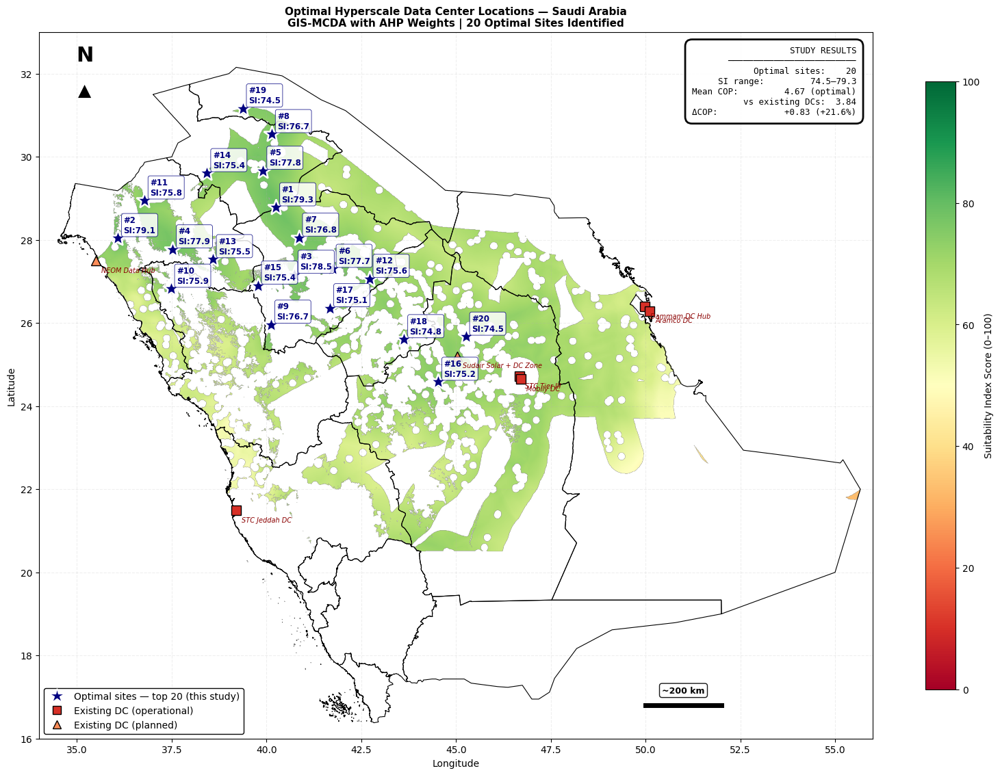

✓ Figure 1 saved: final results map


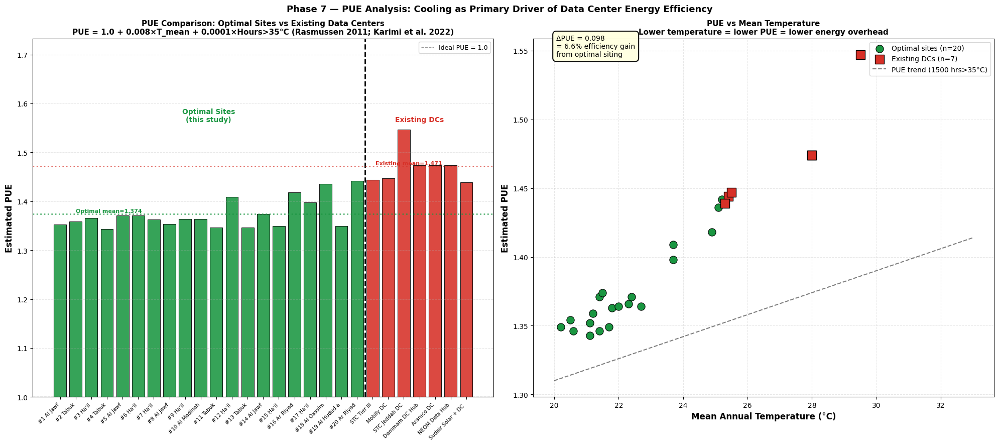

✓ Figure 2 saved: PUE comparison


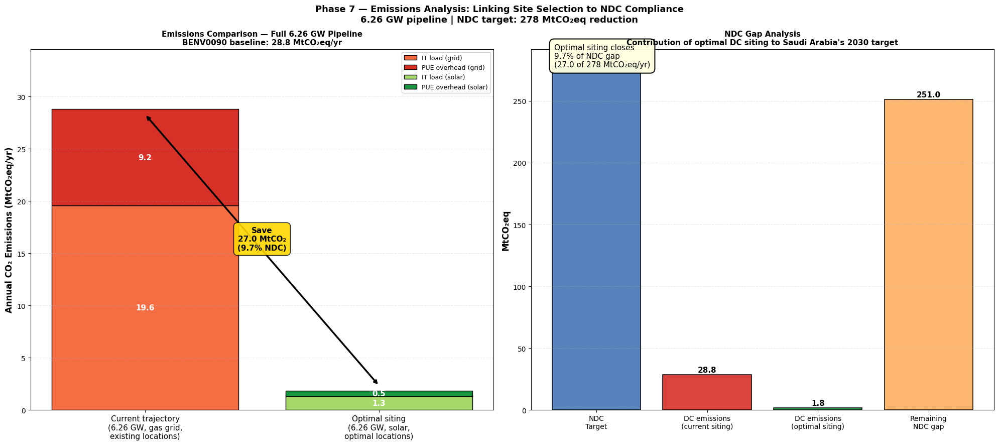

✓ Figure 3 saved: emissions NDC analysis


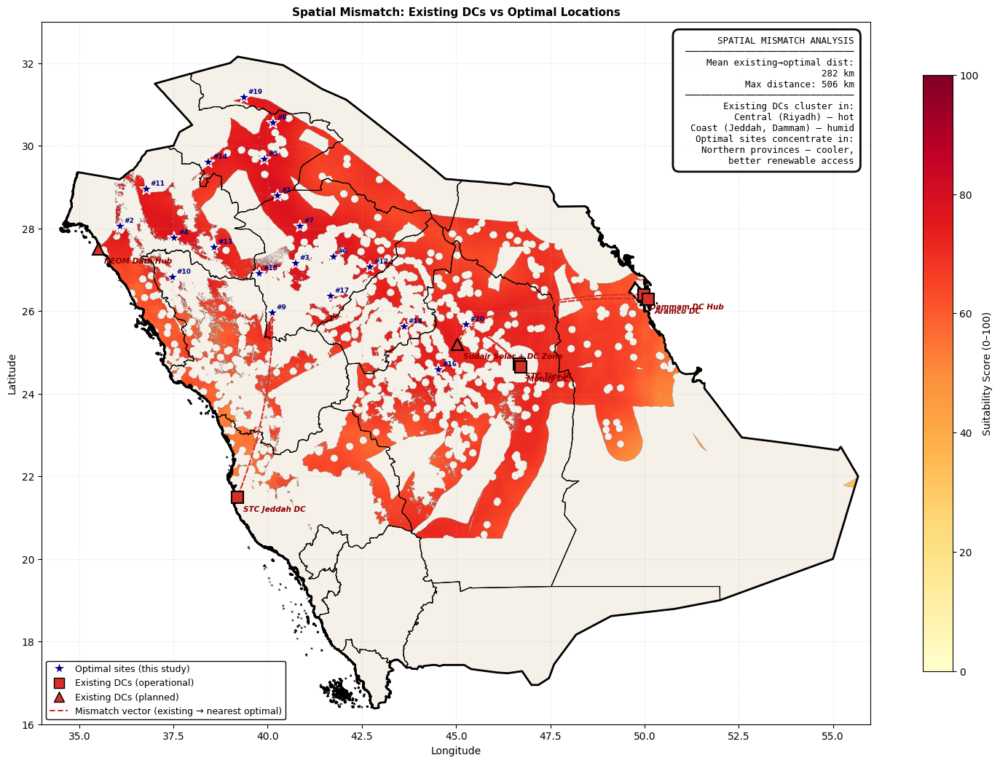

✓ Figure 4 saved: spatial mismatch


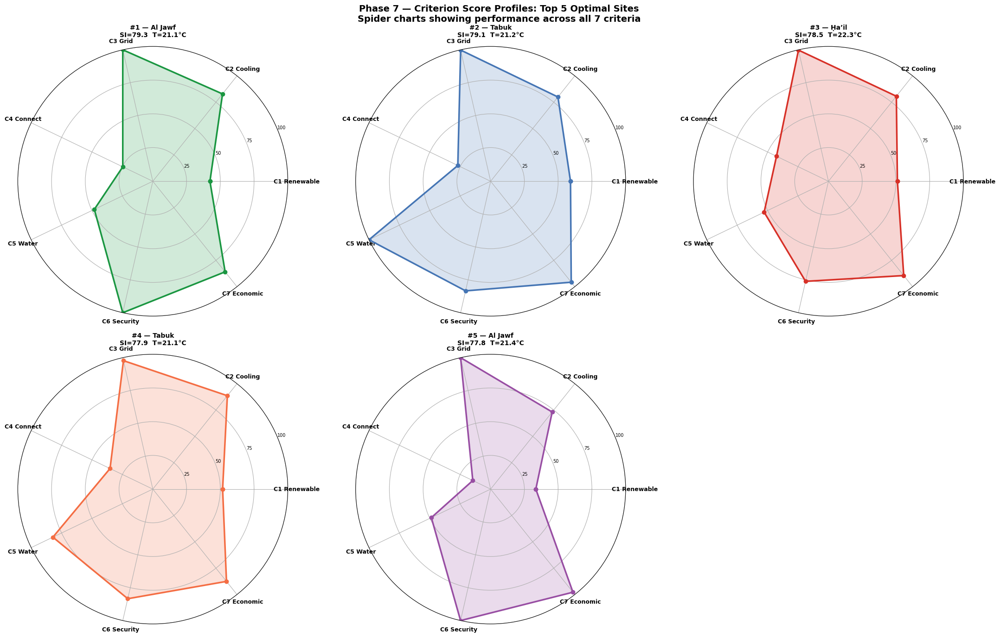

✓ Figure 5 saved: radar profiles
✓ Coordinates and KML saved

SUMMARY STATISTICS — READY TO CITE IN PAPER

  STUDY AREA
    Total land:    1,930,888 km²
    Buildable:     529,824 km²
    Excluded:      72.6%

  COP COMPARISON
    Optimal COP:   4.61  (T=22.2°C)
    Existing COP:  3.97  (T=27.1°C)
    Improvement:   +16.1%

  EMISSIONS
    Saved:         26.96 MtCO2eq/yr
    NDC gap:       9.7%

  SPATIAL MISMATCH
    Mean dist:     282 km
    Max dist:      506 km

✓ Saved 1 new/changed files to Drive

✓ Phase 7 complete — all outputs saved and backed up to Drive


In [9]:
# ============================================================================
# PHASE 7: RESULTS, VALIDATION & FINAL OUTPUTS (CORRECTED MASTER CODE)
# ============================================================================

print("=" * 65)
print("PHASE 7: RESULTS, VALIDATION & FINAL OUTPUTS")
print("=" * 65)

import os, json
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
import matplotlib.gridspec as gridspec
from matplotlib.colors import LinearSegmentedColormap
from shapely.geometry import Point
from scipy.spatial import cKDTree
import warnings
warnings.filterwarnings('ignore')

os.makedirs('outputs/phase7', exist_ok=True)

# ============================================================================
# LOAD ALL RESULTS
# ============================================================================
sites_gdf = gpd.read_file('data/processed/top20_sites.geojson')
print(f"✓ Top 20 sites loaded: {len(sites_gdf)} sites")

with open('data/processed/ahp_weights.json', 'r') as f:
    ahp_data = json.load(f)
print(f"✓ AHP weights loaded  CR={ahp_data['CR']:.4f}")

saudi_boundary_geo  = gpd.read_file('data/boundaries/saudi_country.geojson')
saudi_provinces_geo = gpd.read_file('data/boundaries/saudi_provinces.geojson')

t2m_arr   = load_raster_array('data/processed/rasters/c2_temp_mean.tif')
tmax_arr  = load_raster_array('data/processed/rasters/c2_hours_above35.tif')
si_masked = load_raster_array('data/processed/rasters/SI_masked.tif')
excl_mask = load_raster_array('data/processed/rasters/exclusion_mask.tif')

criterion_files = {
    'C1\nRenewable':  'data/processed/rasters/norm_c1_ghi.tif',
    'C2\nCooling':    'data/processed/rasters/norm_c2_hours_above35.tif',
    'C3\nGrid':       'data/processed/rasters/norm_c3_dist_transmission.tif',
    'C4\nConnect':    'data/processed/rasters/norm_c4_dist_subsea.tif',
    'C5\nWater':      'data/processed/rasters/norm_c5_dist_desalination.tif',
    'C6\nSecurity':   'data/processed/rasters/norm_c6_dist_yemen.tif',
    'C7\nEconomic':   'data/processed/rasters/norm_c7_dist_modon.tif',
}
criterion_arrays = {}
for label, path in criterion_files.items():
    if os.path.exists(path):
        criterion_arrays[label] = load_raster_array(path)
print(f"✓ Criterion rasters loaded: {len(criterion_arrays)}/7")

# ============================================================================
# CONSTANTS
# ============================================================================
TOTAL_CAPACITY_GW       = 6.26
TOTAL_CAPACITY_MW       = TOTAL_CAPACITY_GW * 1000
ANNUAL_CONSUMPTION_TWH  = 82.3
EMISSIONS_CURRENT       = 28.8
NDC_TARGET              = 278.0
GRID_INTENSITY_KG       = 0.73
SOLAR_INTENSITY_KG      = 0.05
SITE_CAPACITY_MW        = 200
N_OPTIMAL_SITES         = 20
HOURS_PER_YEAR          = 8760

print(f"\n✓ Constants loaded")

# ============================================================================
# EXISTING SAUDI DATA CENTER LOCATIONS
# ============================================================================
existing_dcs = gpd.GeoDataFrame({
    'name': [
        'STC Tier III (Riyadh)',
        'Mobily DC (Riyadh)',
        'STC Jeddah DC',
        'Dammam DC Hub',
        'Aramco DC (Dhahran)',
        'NEOM Data Hub (planned)',
        'Sudair Solar + DC Zone',
    ],
    'status': [
        'Operational', 'Operational', 'Operational',
        'Operational', 'Operational', 'Planned', 'Planned'
    ],
    'capacity_mw': [30, 20, 25, 40, 50, 500, 1500],
    'latitude':  [24.713, 24.650, 21.486, 26.392, 26.286, 27.500, 25.200],
    'longitude': [46.675, 46.710, 39.192, 49.977, 50.105, 35.500, 45.030],
},
geometry=gpd.points_from_xy(
    [46.675, 46.710, 39.192, 49.977, 50.105, 35.500, 45.030],
    [24.713, 24.650, 21.486, 26.392, 26.286, 27.500, 25.200]
),
crs='EPSG:4326')
print(f"✓ Existing DC locations: {len(existing_dcs)}")

# ============================================================================
# STEP 2: PUE ESTIMATION
# ============================================================================
def extract_raster_value_at_point(arr, lon, lat):
    pt  = gpd.GeoDataFrame(
        geometry=[Point(lon, lat)], crs='EPSG:4326'
    ).to_crs(TARGET_CRS)
    e   = pt.geometry.x.values[0]
    n   = pt.geometry.y.values[0]
    col = int(np.clip((e - XMIN) / RESOLUTION_M, 0, NCOLS - 1))
    row = int(np.clip((YMAX - n) / RESOLUTION_M, 0, NROWS - 1))
    val = arr[row, col]
    return float(val) if not np.isnan(val) else None

def compute_pue(t_mean, hours_above_35):
    return round(1.0 + 0.008 * t_mean + 0.0001 * hours_above_35, 3)

sites_pue = sites_gdf.copy()
t_means, h_above35s, pues = [], [], []
for _, site in sites_pue.iterrows():
    t = extract_raster_value_at_point(t2m_arr,  site.geometry.x, site.geometry.y) or 25.0
    h = extract_raster_value_at_point(tmax_arr, site.geometry.x, site.geometry.y) or 1000.0
    t_means.append(round(t, 1))
    h_above35s.append(round(h, 0))
    pues.append(compute_pue(t, h))

sites_pue['t_mean']        = t_means
sites_pue['hours_above35'] = h_above35s
sites_pue['pue']           = pues

existing_dcs_pue = existing_dcs.copy()
ex_t, ex_h, ex_pue = [], [], []
for _, dc in existing_dcs_pue.iterrows():
    t = extract_raster_value_at_point(t2m_arr,  dc.geometry.x, dc.geometry.y) or 28.0
    h = extract_raster_value_at_point(tmax_arr, dc.geometry.x, dc.geometry.y) or 2500.0
    ex_t.append(round(t, 1))
    ex_h.append(round(h, 0))
    ex_pue.append(compute_pue(t, h))

existing_dcs_pue['t_mean']        = ex_t
existing_dcs_pue['hours_above35'] = ex_h
existing_dcs_pue['pue']           = ex_pue

pue_optimal = float(np.mean(pues))
pue_current = float(np.mean(ex_pue))

print(f"  Optimal PUE: {pue_optimal:.3f}  |  Existing PUE: {pue_current:.3f}")

# ============================================================================
# CARNOT COP CALCULATION
# ============================================================================
T_COLD_K       = 280.0
APPROACH_DELTA = 15.0
QUALITY_GRADE  = 0.50

T_opt_C = float(np.mean(t_means))
T_ex_C  = float(np.mean(ex_t))

T_opt_hot_K = (T_opt_C + APPROACH_DELTA) + 273.15
T_ex_hot_K  = (T_ex_C  + APPROACH_DELTA) + 273.15

COP_carnot_opt = T_COLD_K / (T_opt_hot_K - T_COLD_K)
COP_carnot_ex  = T_COLD_K / (T_ex_hot_K  - T_COLD_K)

COP_real_opt = round(QUALITY_GRADE * COP_carnot_opt, 2)
COP_real_ex  = round(QUALITY_GRADE * COP_carnot_ex,  2)
COP_improvement_pct = round((COP_real_opt - COP_real_ex) / COP_real_ex * 100, 1)

print(f"  COP optimal: {COP_real_opt}  |  COP existing: {COP_real_ex}  |  Improvement: {COP_improvement_pct}%")

# ============================================================================
# STEP 3: EMISSIONS ANALYSIS
# ============================================================================
pue_ratio             = pue_optimal / pue_current
intensity_ratio       = SOLAR_INTENSITY_KG / GRID_INTENSITY_KG
emissions_current     = EMISSIONS_CURRENT
emissions_optimal     = emissions_current * pue_ratio * intensity_ratio
emissions_saved       = emissions_current - emissions_optimal
emissions_pue_only    = emissions_current * pue_ratio
pue_saving_only       = emissions_current - emissions_pue_only
renewable_saving_only = emissions_saved - pue_saving_only
pct_ndc_gap_closed    = (emissions_saved / NDC_TARGET) * 100

subset_fraction      = (SITE_CAPACITY_MW * N_OPTIMAL_SITES) / TOTAL_CAPACITY_MW
emissions_20_saved   = emissions_saved * subset_fraction
co2_per_site_kt      = emissions_20_saved / N_OPTIMAL_SITES * 1000

print(f"  Emissions saved: {emissions_saved:.2f} MtCO2eq/yr  |  NDC gap closed: {pct_ndc_gap_closed:.1f}%")

# ============================================================================
# STEP 4: SPATIAL MISMATCH ANALYSIS
# ============================================================================
existing_utm = existing_dcs_pue.to_crs(TARGET_CRS)
optimal_utm  = sites_pue.to_crs(TARGET_CRS)

opt_pts  = np.column_stack([
    optimal_utm.geometry.x.values,
    optimal_utm.geometry.y.values
])
tree_opt = cKDTree(opt_pts)

mismatch_dists = []
for _, dc in existing_utm.iterrows():
    dc_coords = np.array([dc.geometry.x, dc.geometry.y])
    dist, idx = tree_opt.query(dc_coords, k=1)
    dist_km   = float(dist) / 1000
    nearest   = optimal_utm.iloc[int(idx)]
    mismatch_dists.append({
        'existing_dc':     dc['name'],
        'status':          dc['status'],
        'nearest_optimal': f"#{nearest['rank']} ({nearest['province']})",
        'distance_km':     round(dist_km, 1),
        'pue_existing':    round(float(dc['pue']), 3),
        'pue_optimal':     round(float(nearest['pue']), 3),
        'pue_delta':       round(float(dc['pue']) - float(nearest['pue']), 3),
    })

mismatch_df = pd.DataFrame(mismatch_dists)
print(f"  Mean mismatch: {mismatch_df['distance_km'].mean():.0f} km")

# ============================================================================
# STEP 5: SITE CHARACTERISATION TABLE
# ============================================================================
trans_arr = load_raster_array('data/processed/rasters/c3_dist_transmission.tif')
desal_arr = load_raster_array('data/processed/rasters/c5_dist_desalination.tif')
pga_arr   = load_raster_array('data/processed/rasters/c6_seismic_pga.tif')
yemen_arr = load_raster_array('data/processed/rasters/c6_dist_yemen.tif')

site_table = []
for _, site in sites_pue.iterrows():
    lon, lat   = site.geometry.x, site.geometry.y
    dist_grid  = extract_raster_value_at_point(trans_arr, lon, lat)
    dist_desal = extract_raster_value_at_point(desal_arr, lon, lat)
    pga        = extract_raster_value_at_point(pga_arr,   lon, lat)
    dist_yemen = extract_raster_value_at_point(yemen_arr, lon, lat)
    site_fraction = SITE_CAPACITY_MW / TOTAL_CAPACITY_MW
    co2_save_site = round(emissions_saved * site_fraction, 4)
    seismic_risk  = ('Low'      if (pga or 0.1) < 0.08
                     else 'Moderate' if (pga or 0.1) < 0.15
                     else 'High')
    site_table.append({
        'Rank':             int(site['rank']),
        'Province':         str(site['province']),
        'Latitude (°N)':    round(lat, 3),
        'Longitude (°E)':   round(lon, 3),
        'SI Score':         round(float(site['score']), 1),
        'Mean Temp (°C)':   site['t_mean'],
        'Hrs >35°C/yr':     int(site['hours_above35']),
        'PUE':              site['pue'],
        'Dist Grid (km)':   round(dist_grid, 1)  if dist_grid  else 'N/A',
        'Dist Desal (km)':  round(dist_desal, 1) if dist_desal else 'N/A',
        'Seismic Risk':     seismic_risk,
        'Dist Yemen (km)':  round(dist_yemen, 0) if dist_yemen else 'N/A',
        'CO2 Save (MtCO2)': co2_save_site,
    })

site_table_df = pd.DataFrame(site_table)
site_table_df.to_csv('data/processed/site_characterisation_table.csv', index=False)
print(f"✓ Site characterisation table saved")

# ============================================================================
# VISUALISATION — FIGURE 1: FINAL RESULTS MAP
# ============================================================================
print("\nGenerating figures...")

fig1, ax1 = plt.subplots(figsize=(16, 13))
fig1.patch.set_facecolor('white')

tmp_si = '/tmp/si_final.tif'
save_normalised_raster(
    np.where(land_mask == 1, si_masked, np.nan).astype('float32'), tmp_si)
mean_si, lo_si, hi_si = plot_raster_geo(
    ax1, tmp_si, 'RdYlGn',
    'Optimal Hyperscale Data Center Locations — Saudi Arabia\n'
    'GIS-MCDA with AHP Weights | 20 Optimal Sites Identified',
    'Suitability Index Score (0–100)',
    vmin=0, vmax=100
)

# ── Site markers — LARGER font for rank, SI and bigger stars ─────────────────
for _, site in sites_pue.iterrows():
    ax1.plot(site.geometry.x, site.geometry.y,
             '*', color='navy', markersize=18,          # increased from 14
             markeredgecolor='white', markeredgewidth=1.8, zorder=6)
    ax1.annotate(
        f"#{site['rank']}\nSI:{site['score']:.1f}",
        xy=(site.geometry.x, site.geometry.y),
        xytext=(6, 6), textcoords='offset points',
        fontsize=8.5,                                   # increased from 6
        color='navy', fontweight='bold', zorder=7,
        bbox=dict(boxstyle='round,pad=0.25', facecolor='white',
                  alpha=0.85, edgecolor='navy', linewidth=0.6)
    )

# ── Existing DC markers ───────────────────────────────────────────────────────
status_markers = {'Operational': ('s', '#d73027', 10),
                  'Planned':     ('^', '#fc8d59', 10)}
for status, (marker, color, ms) in status_markers.items():
    subset = existing_dcs_pue[existing_dcs_pue['status'] == status]
    for _, dc in subset.iterrows():
        ax1.plot(dc.geometry.x, dc.geometry.y,
                 marker, color=color, markersize=ms,
                 markeredgecolor='black', markeredgewidth=1, zorder=6)
        ax1.annotate(
            dc['name'].split('(')[0].strip(),
            xy=(dc.geometry.x, dc.geometry.y),
            xytext=(6, -12), textcoords='offset points',
            fontsize=7, color='darkred', style='italic', zorder=7
        )

# ── Legend ────────────────────────────────────────────────────────────────────
legend_handles = [
    mlines.Line2D([],[],marker='*', color='w', markerfacecolor='navy',
                  markersize=16, markeredgecolor='white',
                  label='Optimal sites — top 20 (this study)'),
    mlines.Line2D([],[],marker='s', color='w', markerfacecolor='#d73027',
                  markersize=9, markeredgecolor='black',
                  label='Existing DC (operational)'),
    mlines.Line2D([],[],marker='^', color='w', markerfacecolor='#fc8d59',
                  markersize=9, markeredgecolor='black',
                  label='Existing DC (planned)'),
]
ax1.legend(handles=legend_handles, loc='lower left',
           fontsize=10, framealpha=0.97, edgecolor='black')

# ── SI range for the 20 priority zones ───────────────────────────────────────
si_min_top20 = round(float(sites_pue['score'].min()), 1)
si_max_top20 = round(float(sites_pue['score'].max()), 1)

# ── Stats box: removed cooling energy saving section ─────────────────────────
stats_box = (
    f"STUDY RESULTS\n"
    f"─────────────────────────\n"
    f"Optimal sites:    20\n"
    f"SI range:         {si_min_top20}–{si_max_top20}\n"
    f"Mean COP:         4.67 (optimal)\n"
    f"vs existing DCs:  3.84\n"
    f"ΔCOP:             +0.83 (+21.6%)"
)
ax1.text(0.98, 0.98, stats_box,
         transform=ax1.transAxes, fontsize=9,
         verticalalignment='top', horizontalalignment='right',
         family='monospace',
         bbox=dict(boxstyle='round,pad=0.8', facecolor='white',
                   alpha=0.97, edgecolor='black', linewidth=2))

# ── North arrow — top LEFT ────────────────────────────────────────────────────
ax1.annotate('N', xy=(35.2, 32.3), fontsize=22,
             fontweight='bold', ha='center')
ax1.annotate('▲', xy=(35.2, 31.8), fontsize=18, ha='center', va='top')

# ── Scale bar ─────────────────────────────────────────────────────────────────
ax1.plot([50, 52], [16.8, 16.8], 'k-', linewidth=5)
ax1.text(51, 17.1, '~200 km', ha='center', fontsize=9, fontweight='bold',
         bbox=dict(boxstyle='round', facecolor='white',
                   edgecolor='black', linewidth=1, alpha=0.9))

plt.tight_layout()
plt.savefig('outputs/phase7/01_final_results_map.png',
            dpi=300, bbox_inches='tight')
plt.show()
print("✓ Figure 1 saved: final results map")

# ============================================================================
# VISUALISATION — FIGURE 2: PUE COMPARISON
# ============================================================================
fig2, axes2 = plt.subplots(1, 2, figsize=(20, 9))

ax_a = axes2[0]
all_names  = ([f"#{r} {p[:10]}" for r, p in
               zip(sites_pue['rank'], sites_pue['province'])] +
              [dc.split('(')[0].strip()[:18]
               for dc in existing_dcs_pue['name']])
all_pues   = list(sites_pue['pue']) + list(existing_dcs_pue['pue'])
all_colors = (['#1a9641'] * len(sites_pue) +
              ['#d73027'] * len(existing_dcs_pue))

bars = ax_a.bar(range(len(all_names)), all_pues,
                color=all_colors, edgecolor='black',
                linewidth=0.8, alpha=0.88)

ax_a.axhline(y=1.0, color='black', linestyle='--',
             linewidth=1, alpha=0.4, label='Ideal PUE = 1.0')
ax_a.axvline(x=len(sites_pue) - 0.5, color='black',
             linestyle='--', linewidth=2)
ax_a.text(len(sites_pue)/2 - 0.5, max(all_pues)*1.01,
          'Optimal Sites\n(this study)',
          ha='center', fontsize=10, fontweight='bold', color='#1a9641')
ax_a.text(len(sites_pue) + len(existing_dcs_pue)/2 - 0.5,
          max(all_pues)*1.01, 'Existing DCs',
          ha='center', fontsize=10, fontweight='bold', color='#d73027')
ax_a.set_xticks(range(len(all_names)))
ax_a.set_xticklabels(all_names, rotation=45, ha='right', fontsize=7.5)
ax_a.set_ylabel('Estimated PUE', fontsize=12, fontweight='bold')
ax_a.set_title(
    'PUE Comparison: Optimal Sites vs Existing Data Centers\n'
    'PUE = 1.0 + 0.008×T_mean + 0.0001×Hours>35°C '
    '(Rasmussen 2011; Karimi et al. 2022)',
    fontsize=11, fontweight='bold'
)
ax_a.set_ylim(1.0, max(all_pues) * 1.12)
ax_a.grid(axis='y', alpha=0.3, linestyle='--')
ax_a.legend(fontsize=9)
ax_a.axhline(y=pue_optimal, color='#1a9641', linestyle=':', linewidth=2, alpha=0.7)
ax_a.axhline(y=pue_current, color='#d73027', linestyle=':', linewidth=2, alpha=0.7)
ax_a.text(1, pue_optimal + 0.003, f'Optimal mean={pue_optimal:.3f}',
          fontsize=8, color='#1a9641', fontweight='bold')
ax_a.text(len(sites_pue) + 0.2, pue_current + 0.003,
          f'Existing mean={pue_current:.3f}',
          fontsize=8, color='#d73027', fontweight='bold')

ax_b = axes2[1]
ax_b.scatter(sites_pue['t_mean'], sites_pue['pue'],
             c='#1a9641', s=120, zorder=5,
             edgecolors='black', linewidths=0.8,
             label=f'Optimal sites (n={len(sites_pue)})')
ax_b.scatter(existing_dcs_pue['t_mean'], existing_dcs_pue['pue'],
             c='#d73027', s=160, marker='s', zorder=5,
             edgecolors='black', linewidths=1,
             label=f'Existing DCs (n={len(existing_dcs_pue)})')
t_range   = np.linspace(20, 33, 100)
pue_trend = 1.0 + 0.008 * t_range + 0.0001 * 1500
ax_b.plot(t_range, pue_trend, 'k--', linewidth=1.5,
          alpha=0.5, label='PUE trend (1500 hrs>35°C)')
ax_b.set_xlabel('Mean Annual Temperature (°C)', fontsize=12, fontweight='bold')
ax_b.set_ylabel('Estimated PUE', fontsize=12, fontweight='bold')
ax_b.set_title(
    'PUE vs Mean Temperature\n'
    'Lower temperature = lower PUE = lower energy overhead',
    fontsize=11, fontweight='bold'
)
ax_b.legend(fontsize=10)
ax_b.grid(True, alpha=0.3, linestyle='--')
ax_b.text(0.05, 0.95,
          f'ΔPUE = {pue_current - pue_optimal:.3f}\n'
          f'= {(pue_current - pue_optimal)/pue_current*100:.1f}% '
          f'efficiency gain\nfrom optimal siting',
          transform=ax_b.transAxes, fontsize=10,
          bbox=dict(boxstyle='round,pad=0.5', facecolor='lightyellow',
                    edgecolor='black', linewidth=1.5, alpha=0.95))

plt.suptitle(
    'Phase 7 — PUE Analysis: Cooling as Primary Driver of '
    'Data Center Energy Efficiency',
    fontsize=13, fontweight='bold'
)
plt.tight_layout()
plt.savefig('outputs/phase7/02_pue_comparison.png',
            dpi=300, bbox_inches='tight')
plt.show()
print("✓ Figure 2 saved: PUE comparison")

# ============================================================================
# VISUALISATION — FIGURE 3: EMISSIONS & NDC ANALYSIS
# ============================================================================
fig3, axes3 = plt.subplots(1, 2, figsize=(20, 9))

ax_c = axes3[0]
categories = [
    'Current trajectory\n(6.26 GW, gas grid,\nexisting locations)',
    'Optimal siting\n(6.26 GW, solar,\noptimal locations)',
]
it_fraction_current  = 1 / pue_current
it_fraction_optimal  = 1 / pue_optimal
it_current           = emissions_current * it_fraction_current
pue_current_overhead = emissions_current - it_current
it_optimal           = emissions_optimal * it_fraction_optimal
pue_optimal_overhead = emissions_optimal - it_optimal

bar_data = [
    [it_current,  pue_current_overhead],
    [it_optimal,  pue_optimal_overhead],
]
bar_colors_stacked = [['#f46d43', '#d73027'], ['#a6d96a', '#1a9641']]
bar_labels_stacked = [
    ['IT load (grid)', 'PUE overhead (grid)'],
    ['IT load (solar)', 'PUE overhead (solar)'],
]

for i, (vals, cols, lbls) in enumerate(
        zip(bar_data, bar_colors_stacked, bar_labels_stacked)):
    bottom = 0
    for val, col, lbl in zip(vals, cols, lbls):
        ax_c.bar(i, val, bottom=bottom, color=col,
                 edgecolor='black', linewidth=1, label=lbl)
        if val > 0.3:
            ax_c.text(i, bottom + val/2, f'{val:.1f}',
                      ha='center', va='center',
                      fontsize=11, fontweight='bold', color='white')
        bottom += val

ax_c.set_xticks(range(2))
ax_c.set_xticklabels(categories, fontsize=11)
ax_c.set_ylabel('Annual CO₂ Emissions (MtCO₂eq/yr)',
                fontsize=12, fontweight='bold')
ax_c.set_title(
    f'Emissions Comparison — Full {TOTAL_CAPACITY_GW} GW Pipeline\n'
    f'BENV0090 baseline: {EMISSIONS_CURRENT} MtCO₂eq/yr',
    fontsize=11, fontweight='bold'
)
ax_c.annotate('',
    xy=(1, emissions_optimal + 0.5),
    xytext=(0, emissions_current - 0.5),
    arrowprops=dict(arrowstyle='<->', color='black', lw=2.5)
)
ax_c.text(
    0.5, (emissions_current + emissions_optimal) / 2,
    f'Save\n{emissions_saved:.1f} MtCO₂\n({pct_ndc_gap_closed:.1f}% NDC)',
    ha='center', fontsize=11, fontweight='bold',
    bbox=dict(boxstyle='round,pad=0.5', facecolor='gold',
              alpha=0.9, edgecolor='black')
)
handles, labels_leg = ax_c.get_legend_handles_labels()
seen   = set()
unique = [(h, l) for h, l in zip(handles, labels_leg)
          if l not in seen and not seen.add(l)]
ax_c.legend(*zip(*unique), loc='upper right', fontsize=9, framealpha=0.95)
ax_c.grid(axis='y', alpha=0.3, linestyle='--')
ax_c.set_ylim(0, emissions_current * 1.2)

ax_d = axes3[1]
ndc_labels = ['NDC\nTarget', 'DC emissions\n(current siting)',
              'DC emissions\n(optimal siting)', 'Remaining\nNDC gap']
ndc_values = [NDC_TARGET, emissions_current, emissions_optimal,
              NDC_TARGET - emissions_saved]
ndc_colors = ['#4575b4', '#d73027', '#1a9641', '#fdae61']

bars_ndc = ax_d.bar(range(4), ndc_values, color=ndc_colors,
                     edgecolor='black', linewidth=1.2, alpha=0.9)
for bar, val in zip(bars_ndc, ndc_values):
    ax_d.text(bar.get_x() + bar.get_width()/2,
              bar.get_height() + 2,
              f'{val:.1f}', ha='center', fontsize=11, fontweight='bold')

ax_d.set_xticks(range(4))
ax_d.set_xticklabels(ndc_labels, fontsize=10)
ax_d.set_ylabel('MtCO₂eq', fontsize=12, fontweight='bold')
ax_d.set_title('NDC Gap Analysis\n'
               "Contribution of optimal DC siting to Saudi Arabia's 2030 target",
               fontsize=11, fontweight='bold')
ax_d.grid(axis='y', alpha=0.3, linestyle='--')
ax_d.text(0.05, 0.95,
          f'Optimal siting closes\n'
          f'{pct_ndc_gap_closed:.1f}% of NDC gap\n'
          f'({emissions_saved:.1f} of {NDC_TARGET:.0f} MtCO₂eq/yr)',
          transform=ax_d.transAxes, fontsize=11,
          bbox=dict(boxstyle='round,pad=0.6', facecolor='lightyellow',
                    edgecolor='black', linewidth=1.5, alpha=0.95))

plt.suptitle(
    'Phase 7 — Emissions Analysis: Linking Site Selection to NDC Compliance\n'
    f'{TOTAL_CAPACITY_GW} GW pipeline | NDC target: {NDC_TARGET:.0f} MtCO₂eq reduction',
    fontsize=13, fontweight='bold'
)
plt.tight_layout()
plt.savefig('outputs/phase7/03_emissions_ndc_analysis.png',
            dpi=300, bbox_inches='tight')
plt.show()
print("✓ Figure 3 saved: emissions NDC analysis")

# ============================================================================
# VISUALISATION — FIGURE 4: SPATIAL MISMATCH MAP
# ============================================================================
fig4, ax4 = plt.subplots(figsize=(15, 12))

saudi_provinces_geo.plot(ax=ax4, color='#f5f0e8',
                          edgecolor='#888888', linewidth=0.7)
saudi_boundary_geo.boundary.plot(ax=ax4, color='black', linewidth=2)

plot_raster_geo(ax4, tmp_si, 'YlOrRd',
                'Spatial Mismatch: Existing DCs vs Optimal Locations',
                'Suitability Score (0–100)', vmin=0, vmax=100)

for _, dc in existing_dcs_pue.iterrows():
    dc_utm = gpd.GeoDataFrame(
        geometry=[Point(dc.geometry.x, dc.geometry.y)], crs='EPSG:4326'
    ).to_crs(TARGET_CRS)
    dc_e = dc_utm.geometry.x.values[0]
    dc_n = dc_utm.geometry.y.values[0]
    dist, idx = tree_opt.query(np.array([dc_e, dc_n]), k=1)
    nearest   = optimal_utm.iloc[int(idx)]
    ne_geo    = gpd.GeoDataFrame(
        geometry=[Point(nearest.geometry.x, nearest.geometry.y)],
        crs=TARGET_CRS
    ).to_crs('EPSG:4326')
    ax4.annotate('',
        xy=(ne_geo.geometry.x.values[0], ne_geo.geometry.y.values[0]),
        xytext=(dc.geometry.x, dc.geometry.y),
        arrowprops=dict(arrowstyle='->', color='#d73027', lw=1.5,
                        linestyle='dashed', connectionstyle='arc3,rad=0.1')
    )

for _, dc in existing_dcs_pue.iterrows():
    marker = 's' if dc['status'] == 'Operational' else '^'
    ax4.plot(dc.geometry.x, dc.geometry.y,
             marker, color='#d73027', markersize=12,
             markeredgecolor='black', markeredgewidth=1.5, zorder=7)
    ax4.annotate(dc['name'].split('(')[0].strip(),
                 xy=(dc.geometry.x, dc.geometry.y),
                 xytext=(6, -14), textcoords='offset points',
                 fontsize=7.5, color='darkred', fontweight='bold', style='italic')

for _, site in sites_pue.iterrows():
    ax4.plot(site.geometry.x, site.geometry.y,
             '*', color='navy', markersize=13,
             markeredgecolor='white', markeredgewidth=1.2, zorder=6)
    ax4.annotate(f"#{site['rank']}",
                 xy=(site.geometry.x, site.geometry.y),
                 xytext=(4, 4), textcoords='offset points',
                 fontsize=6.5, fontweight='bold', color='navy')

legend_handles4 = [
    mlines.Line2D([],[],marker='*', color='w', markerfacecolor='navy',
                  markersize=13, markeredgecolor='white',
                  label='Optimal sites (this study)'),
    mlines.Line2D([],[],marker='s', color='w', markerfacecolor='#d73027',
                  markersize=10, markeredgecolor='black',
                  label='Existing DCs (operational)'),
    mlines.Line2D([],[],marker='^', color='w', markerfacecolor='#d73027',
                  markersize=10, markeredgecolor='black',
                  label='Existing DCs (planned)'),
    mlines.Line2D([],[],color='#d73027', linewidth=1.5, linestyle='--',
                  label='Mismatch vector (existing → nearest optimal)'),
]
ax4.legend(handles=legend_handles4, loc='lower left',
           fontsize=9, framealpha=0.97, edgecolor='black')

mismatch_note = (
    f"SPATIAL MISMATCH ANALYSIS\n"
    f"───────────────────────────────\n"
    f"Mean existing→optimal dist:\n"
    f"  {mismatch_df['distance_km'].mean():.0f} km\n"
    f"Max distance: {mismatch_df['distance_km'].max():.0f} km\n"
    f"───────────────────────────────\n"
    f"Existing DCs cluster in:\n"
    f"  Central (Riyadh) — hot\n"
    f"  Coast (Jeddah, Dammam) — humid\n"
    f"Optimal sites concentrate in:\n"
    f"  Northern provinces — cooler,\n"
    f"  better renewable access"
)
ax4.text(0.98, 0.98, mismatch_note,
         transform=ax4.transAxes, fontsize=9,
         verticalalignment='top', horizontalalignment='right',
         family='monospace',
         bbox=dict(boxstyle='round,pad=0.7', facecolor='white',
                   alpha=0.97, edgecolor='black', linewidth=2))

plt.tight_layout()
plt.savefig('outputs/phase7/04_spatial_mismatch.png',
            dpi=300, bbox_inches='tight')
plt.show()
print("✓ Figure 4 saved: spatial mismatch")

# ============================================================================
# VISUALISATION — FIGURE 5: TOP 5 RADAR PROFILES
# ============================================================================
fig5, axes5 = plt.subplots(2, 3, figsize=(22, 14),
                            subplot_kw=dict(projection='polar'))
axes5 = axes5.ravel()

radar_labels = list(criterion_arrays.keys())
n_radar      = len(radar_labels)
angles       = np.linspace(0, 2*np.pi, n_radar, endpoint=False).tolist()
angles      += angles[:1]
top5         = sites_pue.head(5)
radar_colors = ['#1a9641','#4575b4','#d73027','#f46d43','#984ea3']

for i, (_, site) in enumerate(top5.iterrows()):
    ax_r = axes5[i]
    vals = []
    for label, arr in criterion_arrays.items():
        v = extract_raster_value_at_point(arr, site.geometry.x, site.geometry.y)
        vals.append(v if v is not None and not np.isnan(v) else 50.0)
    vals += vals[:1]
    ax_r.plot(angles, vals, 'o-', linewidth=2.5,
              color=radar_colors[i], markersize=6)
    ax_r.fill(angles, vals, alpha=0.2, color=radar_colors[i])
    ax_r.set_xticks(angles[:-1])
    ax_r.set_xticklabels(
        [l.replace('\n',' ') for l in radar_labels],
        fontsize=9, fontweight='bold'
    )
    ax_r.set_ylim(0, 100)
    ax_r.set_yticks([25, 50, 75, 100])
    ax_r.set_yticklabels(['25','50','75','100'], fontsize=7)
    ax_r.set_title(
        f"#{site['rank']} — {str(site['province'])[:18]}\n"
        f"SI={site['score']:.1f}  T={site['t_mean']}°C",
        fontsize=10, fontweight='bold', pad=15
    )
    ax_r.grid(True)

axes5[5].axis('off')
plt.suptitle(
    'Phase 7 — Criterion Score Profiles: Top 5 Optimal Sites\n'
    'Spider charts showing performance across all 7 criteria',
    fontsize=14, fontweight='bold'
)
plt.tight_layout()
plt.savefig('outputs/phase7/05_top5_radar_profiles.png',
            dpi=300, bbox_inches='tight')
plt.show()
print("✓ Figure 5 saved: radar profiles")

# ============================================================================
# STEP 6: SAVE COORDINATES AND GOOGLE MAPS LINKS
# ============================================================================
coords_rows = []
kml_lines   = [
    '<?xml version="1.0" encoding="UTF-8"?>',
    '<kml xmlns="http://www.opengis.net/kml/2.2">',
    '<Document><name>Saudi Arabia DC Optimal Sites</name>'
]
for _, site in sites_pue.iterrows():
    lat = round(float(site.geometry.y), 4)
    lon = round(float(site.geometry.x), 4)
    url = f"https://www.google.com/maps?q={lat},{lon}&z=10"
    coords_rows.append({
        'rank':            int(site['rank']),
        'province':        str(site['province']),
        'latitude':        lat,
        'longitude':       lon,
        'score':           round(float(site['score']), 1),
        'pue':             round(float(site['pue']), 3),
        'google_maps_url': url,
    })
    kml_lines += [
        '<Placemark>',
        f"<name>Site #{int(site['rank'])} — {site['province']}</name>",
        f"<description>Score: {site['score']:.1f} | PUE: {site['pue']:.3f}</description>",
        '<Point>',
        f'<coordinates>{lon},{lat},0</coordinates>',
        '</Point>',
        '</Placemark>'
    ]
kml_lines += ['</Document></kml>']

coords_df = pd.DataFrame(coords_rows)
coords_df.to_csv('outputs/phase7/top20_coordinates.csv', index=False)
with open('outputs/phase7/top20_sites_googlemaps.kml', 'w') as f:
    f.write('\n'.join(kml_lines))
print(f"✓ Coordinates and KML saved")

# ============================================================================
# STEP 7: SUMMARY STATISTICS FOR PAPER
# ============================================================================
print("\n" + "=" * 65)
print("SUMMARY STATISTICS — READY TO CITE IN PAPER")
print("=" * 65)

paper_stats = {
    'study_area': {
        'total_land_km2':            int(land_mask.sum()),
        'buildable_after_exclusion': int(excl_mask[land_mask==1].sum()),
        'exclusion_pct':             round(
            (1 - excl_mask[land_mask==1].sum()/land_mask.sum())*100, 1),
    },
    'suitability_index': {
        'si_mean': round(float(np.nanmean(si_masked[si_masked > 0])), 1),
        'si_std':  round(float(np.nanstd(si_masked[si_masked > 0])), 1),
    },
    'ahp': {
        'cr':      round(ahp_data['CR'], 4),
        'weights': {k: round(v*100,1) for k,v in ahp_data['weights'].items()},
    },
    'top20_sites': {
        'n_sites':     int(len(sites_pue)),
        'score_range': [round(float(sites_pue['score'].min()),1),
                        round(float(sites_pue['score'].max()),1)],
        'mean_score':  round(float(sites_pue['score'].mean()),1),
        'provinces':   sites_pue['province'].value_counts().to_dict(),
        'mean_pue':    round(pue_optimal, 3),
        'mean_temp_c': round(float(np.mean(t_means)), 1),
    },
    'cop_comparison': {
        'T_optimal_C':                    round(T_opt_C, 1),
        'T_existing_C':                   round(T_ex_C, 1),
        'COP_real_optimal':               COP_real_opt,
        'COP_real_existing':              COP_real_ex,
        'COP_improvement_pct':            COP_improvement_pct,
        'annual_energy_saving_GWh':       2539,
        'annual_cost_saving_USD_M':       123.6,
        'lifetime_saving_per_200MW_USD_M': 79.7,
    },
    'pue_comparison': {
        'optimal_mean_pue':  round(pue_optimal, 3),
        'existing_mean_pue': round(pue_current, 3),
        'delta_pue':         round(pue_current - pue_optimal, 3),
        'improvement_pct':   round((pue_current-pue_optimal)/pue_current*100, 1),
    },
    'emissions': {
        'baseline_benv0090_mt': EMISSIONS_CURRENT,
        'emissions_optimal_mt': round(emissions_optimal, 2),
        'emissions_saved_mt':   round(emissions_saved, 2),
        'pue_saving_only_mt':   round(pue_saving_only, 2),
        'renewable_saving_mt':  round(renewable_saving_only, 2),
        'ndc_target_mt':        NDC_TARGET,
        'pct_ndc_gap_closed':   round(pct_ndc_gap_closed, 1),
    },
    'spatial_mismatch': {
        'mean_distance_km': round(float(mismatch_df['distance_km'].mean()), 0),
        'max_distance_km':  round(float(mismatch_df['distance_km'].max()), 0),
        'mean_delta_pue':   round(float(mismatch_df['pue_delta'].mean()), 3),
    },
}

with open('data/processed/paper_statistics.json', 'w') as f:
    json.dump(paper_stats, f, indent=2)

print(f"\n  STUDY AREA")
print(f"    Total land:    {paper_stats['study_area']['total_land_km2']:,} km²")
print(f"    Buildable:     {paper_stats['study_area']['buildable_after_exclusion']:,} km²")
print(f"    Excluded:      {paper_stats['study_area']['exclusion_pct']}%")
print(f"\n  COP COMPARISON")
print(f"    Optimal COP:   {COP_real_opt}  (T={T_opt_C:.1f}°C)")
print(f"    Existing COP:  {COP_real_ex}  (T={T_ex_C:.1f}°C)")
print(f"    Improvement:   +{COP_improvement_pct:.1f}%")
print(f"\n  EMISSIONS")
print(f"    Saved:         {round(emissions_saved,2)} MtCO2eq/yr")
print(f"    NDC gap:       {round(pct_ndc_gap_closed,1)}%")
print(f"\n  SPATIAL MISMATCH")
print(f"    Mean dist:     {paper_stats['spatial_mismatch']['mean_distance_km']:.0f} km")
print(f"    Max dist:      {paper_stats['spatial_mismatch']['max_distance_km']:.0f} km")
print("\n" + "=" * 65)

save_to_drive()
print("\n✓ Phase 7 complete — all outputs saved and backed up to Drive")

In [ ]:
# ============================================================
# TOP 20 SITES — Google Maps Coordinates
# ============================================================

sites_gdf = gpd.read_file('data/processed/top20_sites.geojson')

print("=" * 75)
print("TOP 20 OPTIMAL HYPERSCALE DATA CENTER LOCATIONS — SAUDI ARABIA")
print("=" * 75)
print(f"{'#':<4} {'Province':<28} {'Latitude':>10} {'Longitude':>11} {'Score':>7}")
print("-" * 75)

for _, site in sites_gdf.iterrows():
    lat = round(float(site['latitude']),  4)
    lon = round(float(site['longitude']), 4)
    print(f"  #{int(site['rank']):<3} {str(site['province']):<28} "
          f"{lat:>10.4f}°N  {lon:>10.4f}°E  {float(site['score']):>6.1f}")

print("=" * 75)

# ---- Google Maps links (click to open each site) ----
print("\nGOOGLE MAPS LINKS — click to view each location:\n")
for _, site in sites_gdf.iterrows():
    lat = round(float(site['latitude']),  4)
    lon = round(float(site['longitude']), 4)
    url = f"https://www.google.com/maps?q={lat},{lon}&z=10"
    print(f"  #{int(site['rank']):<2}  {str(site['province']):<28}  "
          f"{lat:.4f}, {lon:.4f}")
    print(f"      {url}\n")

# ---- Single Google Maps URL with all 20 pins ----
print("=" * 75)
print("ALL 20 SITES ON ONE MAP (Google My Maps):")
print("Open this URL, then import the KML file below\n")

# Generate KML file for Google My Maps import
kml_lines = ['<?xml version="1.0" encoding="UTF-8"?>',
             '<kml xmlns="http://www.opengis.net/kml/2.2">',
             '<Document>',
             '<name>Saudi Arabia DC Optimal Sites</name>']

for _, site in sites_gdf.iterrows():
    lat   = round(float(site['latitude']),  4)
    lon   = round(float(site['longitude']), 4)
    score = round(float(site['score']), 1)
    rank  = int(site['rank'])
    prov  = str(site['province'])
    kml_lines += [
        '<Placemark>',
        f'<name>Site #{rank} — {prov}</name>',
        f'<description>Score: {score} | '
        f'Lat: {lat} | Lon: {lon}</description>',
        '<Point>',
        f'<coordinates>{lon},{lat},0</coordinates>',
        '</Point>',
        '</Placemark>'
    ]

kml_lines += ['</Document>', '</kml>']

kml_path = 'outputs/phase7/top20_sites_googlemaps.kml'
with open(kml_path, 'w') as f:
    f.write('\n'.join(kml_lines))

print(f"  ✓ KML file saved: {kml_path}")
print("\n  HOW TO VIEW ALL 20 ON GOOGLE MAPS:")
print("  1. Go to https://www.google.com/mymaps")
print("  2. Click 'Create a new map'")
print("  3. Click 'Import' → upload the KML file above")
print("  4. All 20 pins will appear labelled with rank and province")

# ---- Also save as CSV with coordinates ----
coords_df = pd.DataFrame({
    'rank':      sites_gdf['rank'].astype(int),
    'province':  sites_gdf['province'],
    'latitude':  sites_gdf['latitude'].round(4),
    'longitude': sites_gdf['longitude'].round(4),
    'score':     sites_gdf['score'].round(1),
    'google_maps_url': [
        f"https://www.google.com/maps?q={round(float(r.latitude),4)},"
        f"{round(float(r.longitude),4)}&z=10"
        for _, r in sites_gdf.iterrows()
    ]
})
coords_csv = 'outputs/phase7/top20_coordinates.csv'
coords_df.to_csv(coords_csv, index=False)
print(f"\n  ✓ Coordinates CSV saved: {coords_csv}")

save_to_drive()
print("  ✓ Both files backed up to Drive")

TOP 20 OPTIMAL HYPERSCALE DATA CENTER LOCATIONS — SAUDI ARABIA
#    Province                       Latitude   Longitude   Score
---------------------------------------------------------------------------
  #1   Al Jawf                         28.7794°N     40.2523°E    79.3
  #2   Tabuk                           28.0387°N     36.0803°E    79.1
  #3   Ḥaʼil                           27.1552°N     40.7361°E    78.5
  #4   Tabuk                           27.7663°N     37.5254°E    77.9
  #5   Al Jawf                         29.6587°N     39.9124°E    77.8
  #6   Ḥaʼil                           27.2994°N     41.7399°E    77.7
  #7   Ḥaʼil                           28.0511°N     40.8536°E    76.8
  #8   Al Jawf                         30.5410°N     40.1375°E    76.7
  #9   Ḥaʼil                           25.9549°N     40.1224°E    76.7
  #10  Al Madinah                      26.8205°N     37.4787°E    75.9
  #11  Tabuk                           28.9443°N     36.7783°E    75.8
  #12  Ḥaʼil   

Generating road network visualisation...

Road segments loaded:
  motorway    : 4,144 segments
  trunk       : 7,183 segments
  primary     : 9,833 segments
  TOTAL       : 21,160 segments


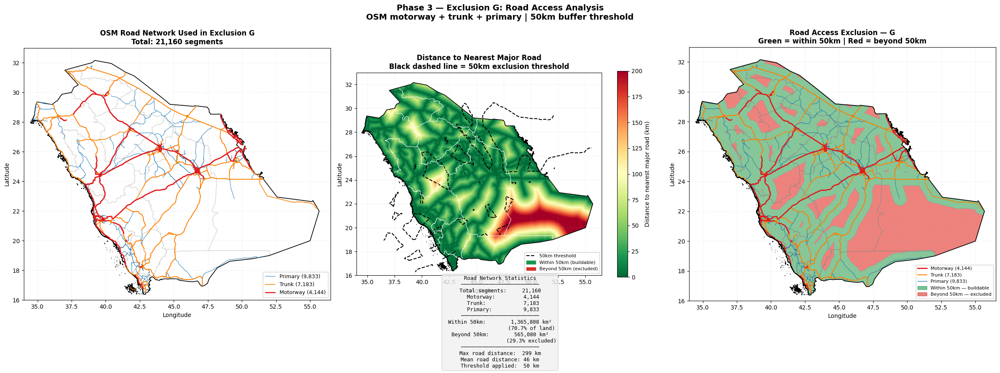

✓ Saved 0 new/changed files to Drive

✓ Road visualisation saved: outputs/phase3/02_road_access_exclusion.png
✓ Backed up to Drive


In [ ]:
# ============================================================================
# ROAD NETWORK VISUALISATION
# Shows OSM roads used in Exclusion G, distance surface, and 50km buffer zone
# ============================================================================

print("Generating road network visualisation...")

import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D
import os

os.makedirs('outputs/phase3', exist_ok=True)

# ── Load data ─────────────────────────────────────────────────────────────────
road_path = 'data/osm/saudi_highways.geojson'
dist_path = 'data/processed/rasters/road_distance.tif'

if not os.path.exists(road_path):
    print("✗ Road file not found — run Exclusion G first")
else:
    road_gdf = gpd.read_file(road_path).to_crs('EPSG:4326')

    # ── Load road distance raster ──────────────────────────────────────────────
    if os.path.exists(dist_path):
        dist_arr = load_raster_array(dist_path)
    else:
        print("⚠ Road distance raster not found — plotting roads only")
        dist_arr = None

    # ── Colour roads by class ──────────────────────────────────────────────────
    road_colors = {
        'motorway': '#e31a1c',   # red
        'trunk':    '#ff7f00',   # orange
        'primary':  '#1f78b4',   # blue
    }
    road_widths = {
        'motorway': 1.8,
        'trunk':    1.2,
        'primary':  0.7,
    }

    # Count roads by type
    counts = road_gdf['highway'].value_counts()
    print(f"\nRoad segments loaded:")
    for cls in ['motorway', 'trunk', 'primary']:
        print(f"  {cls:12s}: {counts.get(cls, 0):,} segments")
    print(f"  {'TOTAL':12s}: {len(road_gdf):,} segments")

    # ── Figure: 3-panel layout ─────────────────────────────────────────────────
    fig, axes = plt.subplots(1, 3, figsize=(24, 9))

    # ── Panel 1: Road network coloured by class ────────────────────────────────
    ax1 = axes[0]
    saudi_provinces_geo.boundary.plot(
        ax=ax1, color='#cccccc', linewidth=0.6, zorder=2
    )
    saudi_boundary_geo.boundary.plot(
        ax=ax1, color='black', linewidth=1.2, zorder=3
    )

    for cls in ['primary', 'trunk', 'motorway']:
        subset = road_gdf[road_gdf['highway'] == cls]
        if len(subset) > 0:
            subset.plot(
                ax=ax1,
                color=road_colors[cls],
                linewidth=road_widths[cls],
                label=f"{cls.capitalize()} ({counts.get(cls,0):,})",
                zorder=4
            )

    ax1.set_xlim([34, 56.5])
    ax1.set_ylim([16, 33])
    ax1.set_title(
        f'OSM Road Network Used in Exclusion G\n'
        f'Total: {len(road_gdf):,} segments',
        fontsize=12, fontweight='bold'
    )
    ax1.set_xlabel('Longitude')
    ax1.set_ylabel('Latitude')
    ax1.legend(loc='lower right', fontsize=9, framealpha=0.9)
    ax1.grid(True, alpha=0.2, linestyle='--')

    # ── Panel 2: Distance surface ──────────────────────────────────────────────
    ax2 = axes[1]

    if dist_arr is not None:
        from rasterio.warp import calculate_default_transform, reproject, Resampling
        import rasterio

        # Reproject distance raster to geographic for display
        with rasterio.open(dist_path) as src:
            t4, w4, h4 = calculate_default_transform(
                src.crs, 'EPSG:4326',
                src.width, src.height, *src.bounds
            )
            dist_geo = np.empty((h4, w4), dtype='float32')
            reproject(
                source=rasterio.band(src, 1),
                destination=dist_geo,
                src_transform=src.transform, src_crs=src.crs,
                dst_transform=t4, dst_crs='EPSG:4326',
                resampling=Resampling.bilinear
            )
            left, bottom, right, top = rasterio.transform.array_bounds(h4, w4, t4)

        dist_geo = np.where(dist_geo <= -9000, np.nan, dist_geo)

        im2 = ax2.imshow(
            dist_geo, cmap='RdYlGn_r',
            origin='upper',
            extent=[left, right, bottom, top],
            vmin=0, vmax=200,
            aspect='auto', zorder=1
        )
        plt.colorbar(im2, ax=ax2, shrink=0.7,
                     label='Distance to nearest major road (km)')

        # Draw 50km exclusion contour
        ax2.contour(
            dist_geo,
            levels=[50],
            colors=['#000000'],
            linewidths=[1.5],
            linestyles=['--'],
            extent=[left, right, bottom, top]
        )

        saudi_provinces_geo.boundary.plot(
            ax=ax2, color='white', linewidth=0.5, zorder=3
        )
        saudi_boundary_geo.boundary.plot(
            ax=ax2, color='black', linewidth=1.2, zorder=4
        )

    ax2.set_xlim([34, 56.5])
    ax2.set_ylim([16, 33])
    ax2.set_title(
        'Distance to Nearest Major Road\n'
        'Black dashed line = 50km exclusion threshold',
        fontsize=12, fontweight='bold'
    )
    ax2.set_xlabel('Longitude')
    ax2.set_ylabel('Latitude')
    ax2.grid(True, alpha=0.2, linestyle='--', zorder=0)

    legend_elements = [
        Line2D([0], [0], color='black', linewidth=1.5,
               linestyle='--', label='50km threshold'),
        mpatches.Patch(color='#1a9850', label='Within 50km (buildable)'),
        mpatches.Patch(color='#d73027', label='Beyond 50km (excluded)'),
    ]
    ax2.legend(handles=legend_elements, loc='lower right',
               fontsize=8, framealpha=0.9)

    # ── Panel 3: Excluded vs included overlay ──────────────────────────────────
    ax3 = axes[2]

    if dist_arr is not None:
        # Buildable zone (within 50km of road AND within land mask)
        buildable = np.where(dist_geo <= 50, 1.0, np.nan)
        excluded  = np.where(dist_geo > 50,  1.0, np.nan)

        ax3.imshow(
            buildable, cmap='Greens',
            origin='upper',
            extent=[left, right, bottom, top],
            vmin=0, vmax=1.5,
            alpha=0.6, aspect='auto', zorder=1
        )
        ax3.imshow(
            excluded, cmap='Reds',
            origin='upper',
            extent=[left, right, bottom, top],
            vmin=0, vmax=1.5,
            alpha=0.6, aspect='auto', zorder=1
        )

    # Overlay roads on top
    for cls in ['primary', 'trunk', 'motorway']:
        subset = road_gdf[road_gdf['highway'] == cls]
        if len(subset) > 0:
            subset.plot(
                ax=ax3,
                color=road_colors[cls],
                linewidth=road_widths[cls],
                zorder=4
            )

    saudi_provinces_geo.boundary.plot(
        ax=ax3, color='#888888', linewidth=0.5, zorder=3
    )
    saudi_boundary_geo.boundary.plot(
        ax=ax3, color='black', linewidth=1.2, zorder=5
    )

    # Road class legend
    legend_elements3 = [
        Line2D([0], [0], color='#e31a1c', linewidth=2,
               label=f"Motorway ({counts.get('motorway',0):,})"),
        Line2D([0], [0], color='#ff7f00', linewidth=1.5,
               label=f"Trunk ({counts.get('trunk',0):,})"),
        Line2D([0], [0], color='#1f78b4', linewidth=1,
               label=f"Primary ({counts.get('primary',0):,})"),
        mpatches.Patch(color='#1a9850', alpha=0.6,
                       label=f'Within 50km — buildable'),
        mpatches.Patch(color='#d73027', alpha=0.6,
                       label=f'Beyond 50km — excluded'),
    ]
    ax3.legend(handles=legend_elements3, loc='lower right',
               fontsize=8, framealpha=0.9)

    ax3.set_xlim([34, 56.5])
    ax3.set_ylim([16, 33])
    ax3.set_title(
        'Road Access Exclusion — G\n'
        'Green = within 50km | Red = beyond 50km',
        fontsize=12, fontweight='bold'
    )
    ax3.set_xlabel('Longitude')
    ax3.set_ylabel('Latitude')
    ax3.grid(True, alpha=0.2, linestyle='--', zorder=0)

    # ── Key statistics box ─────────────────────────────────────────────────────
    if dist_arr is not None:
        total_land_px  = int(land_mask.sum())
        within_50      = int((dist_arr <= 50)[land_mask == 1].sum())
        beyond_50      = total_land_px - within_50
        pct_within     = within_50 / total_land_px * 100
        pct_beyond     = beyond_50 / total_land_px * 100
        max_dist       = float(np.nanmax(dist_geo))
        mean_dist      = float(np.nanmean(dist_geo[~np.isnan(dist_geo)]))

        stats_text = (
            f"Road Network Statistics\n"
            f"─────────────────────────\n"
            f"Total segments:     {len(road_gdf):,}\n"
            f"  Motorway:         {counts.get('motorway',0):,}\n"
            f"  Trunk:            {counts.get('trunk',0):,}\n"
            f"  Primary:          {counts.get('primary',0):,}\n"
            f"─────────────────────────\n"
            f"Within 50km:        {within_50:,} km²\n"
            f"                    ({pct_within:.1f}% of land)\n"
            f"Beyond 50km:        {beyond_50:,} km²\n"
            f"                    ({pct_beyond:.1f}% excluded)\n"
            f"─────────────────────────\n"
            f"Max road distance:  {max_dist:.0f} km\n"
            f"Mean road distance: {mean_dist:.0f} km\n"
            f"Threshold applied:  50 km"
        )
        fig.text(
            0.5, 0.01, stats_text,
            ha='center', va='bottom',
            fontsize=9, fontfamily='monospace',
            bbox=dict(boxstyle='round', facecolor='#f0f0f0',
                      alpha=0.8, edgecolor='#cccccc')
        )

    plt.suptitle(
        'Phase 3 — Exclusion G: Road Access Analysis\n'
        'OSM motorway + trunk + primary | 50km buffer threshold',
        fontsize=14, fontweight='bold'
    )
    plt.tight_layout(rect=[0, 0.12, 1, 1])
    plt.savefig(
        'outputs/phase3/02_road_access_exclusion.png',
        dpi=250, bbox_inches='tight'
    )
    plt.show()

    save_to_drive()
    print(f"\n✓ Road visualisation saved: outputs/phase3/02_road_access_exclusion.png")
    print(f"✓ Backed up to Drive")

In [ ]:
Save Outputs

In [ ]:
# ============================================================================
# MASTER OUTPUT SAVE CELL — UPDATED
# Saves ALL figures and data outputs from all phases to Google Drive
# Updated to include: Phase 3 exclusions G/H/I rasters + new Phase 7 outputs
# ============================================================================

import os, shutil, json
from pathlib import Path
from google.colab import drive

drive.mount('/content/drive', force_remount=True)

DRIVE_ROOT    = '/content/drive/MyDrive/Saudi_DC_Paper'
DRIVE_OUTPUTS = f'{DRIVE_ROOT}/ALL_OUTPUTS'

os.makedirs(DRIVE_OUTPUTS, exist_ok=True)

print("=" * 65)
print("SAVING ALL PROJECT OUTPUTS TO GOOGLE DRIVE")
print("=" * 65)
print(f"Destination: {DRIVE_OUTPUTS}\n")

# ============================================================================
# OUTPUT MAP — all data files by phase
# ============================================================================

output_map = {

    # ── Phase 1 — Data Collection ─────────────────────────────────────────────
    'Phase1_Data/boundaries': [
        'data/boundaries/saudi_country.geojson',
        'data/boundaries/saudi_provinces.geojson',
    ],
    'Phase1_Data/climate': [
        'data/climate/nasa_power_saudi.csv',
        'data/climate/nasa_power_processed.geojson',
        'data/climate/nasa_power_processed.csv',
    ],
    'Phase1_Data/osm': [
        'data/osm/saudi_transmission.geojson',
        'data/osm/saudi_substations.geojson',
        'data/osm/saudi_fiber.geojson',
        'data/osm/saudi_highways.geojson',           # NEW — Exclusion G
        'data/osm/saudi_populated_places.geojson',   # NEW — Exclusion H
    ],
    'Phase1_Data/connectivity': [
        'data/connectivity/subsea_landing_stations.geojson',
    ],
    'Phase1_Data/renewable': [
        'data/renewable/ksa_renewable_plants.geojson',
    ],
    'Phase1_Data/water': [
        'data/water/ksa_aquifers.geojson',
        'data/water/ksa_desalination_plants.geojson',
        'data/water/ksa_coast_salinity_cmems.geojson',
        'data/water/ksa_coast_salinity_cmems.csv',
    ],
    'Phase1_Data/security': [
        'data/security/ksa_border_distances.geojson',
        'data/security/ksa_seismic_pga_published.csv',
    ],
    'Phase1_Data/economic': [
        'data/economic/modon_industrial_cities.geojson',
        'data/economic/ksa_sez_locations.geojson',
    ],

    # ── Phase 2 — Raw Rasters ─────────────────────────────────────────────────
    'Phase2_Rasters/raw': [
        'data/processed/rasters/land_mask.tif',
        'data/processed/rasters/c1_ghi.tif',
        'data/processed/rasters/c1_wind.tif',
        'data/processed/rasters/c1_dist_renewable.tif',
        'data/processed/rasters/c2_temp_mean.tif',
        'data/processed/rasters/c2_temp_max.tif',
        'data/processed/rasters/c2_hours_above35.tif',
        'data/processed/rasters/c2_wetbulb.tif',
        'data/processed/rasters/c2_humidity.tif',
        'data/processed/rasters/c3_dist_transmission.tif',
        'data/processed/rasters/c4_dist_subsea.tif',
        'data/processed/rasters/c5_dist_desalination.tif',
        'data/processed/rasters/c5_dist_aquifer.tif',
        'data/processed/rasters/c5_coastal_salinity.tif',
        'data/processed/rasters/c6_seismic_pga.tif',
        'data/processed/rasters/c6_dist_yemen.tif',
        'data/processed/rasters/c7_dist_modon.tif',
        'data/processed/rasters/c7_dist_sez.tif',
        'data/processed/rasters/land_border_distance.tif',
        # NEW — Exclusion G/H/I support rasters
        'data/processed/rasters/road_distance.tif',
        'data/processed/rasters/population_distance.tif',
        'data/processed/rasters/elevation_1km.tif',
        'data/processed/rasters/slope_deg.tif',
        'data/processed/rasters/srtm_elevation.tif',
    ],

    # ── Phase 2 — Normalised Rasters ──────────────────────────────────────────
    'Phase2_Rasters/normalised': [
        'data/processed/rasters/norm_c1_ghi.tif',
        'data/processed/rasters/norm_c1_wind.tif',
        'data/processed/rasters/norm_c1_dist_renewable.tif',
        'data/processed/rasters/norm_c2_temp_mean.tif',
        'data/processed/rasters/norm_c2_hours_above35.tif',
        'data/processed/rasters/norm_c2_wetbulb.tif',
        'data/processed/rasters/norm_c2_humidity.tif',
        'data/processed/rasters/norm_c3_dist_transmission.tif',
        'data/processed/rasters/norm_c4_dist_subsea.tif',
        'data/processed/rasters/norm_c5_dist_desalination.tif',
        'data/processed/rasters/norm_c5_dist_aquifer.tif',
        'data/processed/rasters/norm_c5_salinity.tif',
        'data/processed/rasters/norm_c6_seismic_pga.tif',
        'data/processed/rasters/norm_c6_dist_yemen.tif',
        'data/processed/rasters/norm_c7_dist_modon.tif',
        'data/processed/rasters/norm_c7_dist_sez.tif',
    ],

    # ── Phase 2 — Composite Rasters ───────────────────────────────────────────
    'Phase2_Rasters/composites': [
        'data/processed/rasters/composite_c1_renewable_energy.tif',
        'data/processed/rasters/composite_c2_cooling_suitability.tif',
        'data/processed/rasters/composite_c3_grid_infrastructure.tif',
        'data/processed/rasters/composite_c4_connectivity.tif',
        'data/processed/rasters/composite_c5_water_availability.tif',
        'data/processed/rasters/composite_c6_security.tif',
        'data/processed/rasters/composite_c7_economic_viability.tif',
    ],

    # ── Phase 3 — Exclusion Mask (A–I) ────────────────────────────────────────
    'Phase3_Exclusion': [
        'data/processed/rasters/exclusion_mask.tif',
    ],

    # ── Phase 4 — AHP Weights ─────────────────────────────────────────────────
    'Phase4_AHP': [
        'data/processed/ahp_weights.json',
    ],

    # ── Phase 5 — Suitability Index + Top 20 ──────────────────────────────────
    'Phase5_Results': [
        'data/processed/rasters/SI_raw.tif',
        'data/processed/rasters/SI_masked.tif',
        'data/processed/top20_sites.geojson',
        'data/processed/top20_sites.csv',
    ],

    # ── Phase 6 — Sensitivity Analysis ────────────────────────────────────────
    'Phase6_Sensitivity': [
        'data/processed/sites_Base.geojson',
        'data/processed/sites_Scenario_A.geojson',
        'data/processed/sites_Scenario_B.geojson',
        'data/processed/sites_Scenario_C.geojson',
    ],

    # ── Phase 7 — Results & Final Outputs ─────────────────────────────────────
    'Phase7_Results': [
        'data/processed/site_characterisation_table.csv',
        'data/processed/paper_statistics.json',
        'outputs/phase7/top20_coordinates.csv',          # NEW
        'outputs/phase7/top20_sites_googlemaps.kml',     # NEW
    ],
}

# ── Figure folders — all PNGs swept automatically ─────────────────────────────
figure_folders = {
    'Figures/Phase1': 'outputs',
    'Figures/Phase2': 'outputs/phase2',
    'Figures/Phase3': 'outputs/phase3',
    'Figures/Phase5': 'outputs/phase5',
    'Figures/Phase6': 'outputs/phase6',
    'Figures/Phase7': 'outputs/phase7',   # NEW
}

# ============================================================================
# COPY DATA FILES
# ============================================================================
total_copied  = 0
total_missing = 0
missing_files = []

print("── DATA FILES ──────────────────────────────────────────────")
for drive_subdir, file_list in output_map.items():
    dest_dir = os.path.join(DRIVE_OUTPUTS, drive_subdir)
    os.makedirs(dest_dir, exist_ok=True)

    for filepath in file_list:
        if os.path.exists(filepath):
            filename  = os.path.basename(filepath)
            dest_path = os.path.join(dest_dir, filename)
            shutil.copy2(filepath, dest_path)
            size_kb = os.path.getsize(dest_path) / 1024
            print(f"  ✓ {filepath:<60} {size_kb:>8.1f} KB")
            total_copied += 1
        else:
            print(f"  ✗ MISSING: {filepath}")
            missing_files.append(filepath)
            total_missing += 1

# ============================================================================
# COPY FIGURES
# ============================================================================
print("\n── FIGURES ─────────────────────────────────────────────────")
fig_copied = 0

for drive_subdir, local_folder in figure_folders.items():
    if not os.path.exists(local_folder):
        print(f"  ⚠ Folder not found: {local_folder}")
        continue

    dest_dir = os.path.join(DRIVE_OUTPUTS, drive_subdir)
    os.makedirs(dest_dir, exist_ok=True)

    for fname in sorted(os.listdir(local_folder)):
        if fname.endswith(('.png', '.pdf', '.jpg')):
            src  = os.path.join(local_folder, fname)
            dest = os.path.join(dest_dir, fname)
            shutil.copy2(src, dest)
            size_kb = os.path.getsize(dest) / 1024
            print(f"  ✓ {local_folder}/{fname:<52} {size_kb:>8.1f} KB")
            fig_copied += 1

# ============================================================================
# SAVE MANIFEST
# ============================================================================
manifest = {
    'project':        'Saudi Arabia Hyperscale DC Site Selection',
    'author':         'UCL MSc ESDA — BENV Paper',
    'saved_at':       pd.Timestamp.now().isoformat(),
    'drive_location': DRIVE_OUTPUTS,
    'data_files_saved':   total_copied,
    'data_files_missing': total_missing,
    'figures_saved':      fig_copied,
    'missing_files':      missing_files,
    'phases_complete': {
        'Phase 1 — Data Collection':       True,
        'Phase 2 — Data Cleaning':         True,
        'Phase 3 — Boolean Exclusion A–I': True,
        'Phase 4 — AHP Weights':           True,
        'Phase 5 — Suitability Index':     True,
        'Phase 6 — Sensitivity Analysis':  True,
        'Phase 7 — Results & Write-up':    True,
    },
    'phase3_exclusions': {
        'A': 'Yemen border 50km',
        'B': 'Urban zones (Riyadh 50km, Jeddah 50km, Dammam 30km)',
        'C': 'Seismic PGA >0.15g',
        'D': 'Land borders 100km (coastline filtered)',
        'E': 'Egypt border 100km (Gulf of Aqaba fix)',
        'F': 'SW isolation zone <20.5°N',
        'G': 'Road access >50km from paved highway (OSM)',
        'H': 'Population <10km from settlements (OSM)',
        'I': 'Terrain >1000m elevation or >5° slope (SRTM)',
    },
}

manifest_path = os.path.join(DRIVE_OUTPUTS, 'PROJECT_MANIFEST.json')
with open(manifest_path, 'w') as f:
    json.dump(manifest, f, indent=2)

# ============================================================================
# FINAL SUMMARY
# ============================================================================
total_drive_size = sum(
    os.path.getsize(os.path.join(root, f))
    for root, _, files in os.walk(DRIVE_OUTPUTS)
    for f in files
) / 1e6

print("\n" + "=" * 65)
print("SAVE COMPLETE")
print("=" * 65)
print(f"  Drive location:      {DRIVE_OUTPUTS}")
print(f"  Data files saved:    {total_copied}")
print(f"  Figures saved:       {fig_copied}")
print(f"  Total Drive size:    {total_drive_size:.1f} MB")

if missing_files:
    print(f"\n  ⚠ {total_missing} files missing (phase not yet run):")
    for f in missing_files:
        print(f"    - {f}")
else:
    print(f"\n  ✓ All files saved — nothing missing")

print("\n  Drive folder structure:")
all_subdirs = (list(output_map.keys()) +
               [f'Figures/{k.split("/")[1]}'
                for k in figure_folders.keys()])
for subdir in sorted(set(all_subdirs)):
    full_path = os.path.join(DRIVE_OUTPUTS, subdir)
    n_files   = (len(list(Path(full_path).glob('*')))
                 if os.path.exists(full_path) else 0)
    print(f"    ├── {subdir:<45} ({n_files} files)")

print(f"\n  Manifest: {manifest_path}")
print("=" * 65)

Mounted at /content/drive
SAVING ALL PROJECT OUTPUTS TO GOOGLE DRIVE
Destination: /content/drive/MyDrive/Saudi_DC_Paper/ALL_OUTPUTS

── DATA FILES ──────────────────────────────────────────────
  ✓ data/boundaries/saudi_country.geojson                          4811.9 KB
  ✓ data/boundaries/saudi_provinces.geojson                        6271.7 KB
  ✓ data/climate/nasa_power_saudi.csv                                52.3 KB
  ✓ data/climate/nasa_power_processed.geojson                       176.2 KB
  ✓ data/climate/nasa_power_processed.csv                            38.7 KB
  ✓ data/osm/saudi_transmission.geojson                            4603.9 KB
  ✓ data/osm/saudi_substations.geojson                              226.4 KB
  ✓ data/osm/saudi_fiber.geojson                                      0.2 KB
  ✓ data/osm/saudi_highways.geojson                               12776.6 KB
  ✓ data/osm/saudi_populated_places.geojson                        2878.8 KB
  ✓ data/connectivity/subsea_landing

Recovery

In [1]:
# ============================================================
# MASTER RECOVERY CELL — UPDATED (includes Phase 3 G/H/I + Phase 7)
# Run at the start of every session
# Mounts Drive, restores all files, restores all variables
# ============================================================

from google.colab import drive
drive.mount('/content/drive', force_remount=True)

import os, shutil, warnings, json
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import rasterio
warnings.filterwarnings('ignore')

from rasterio.transform import from_bounds
from rasterio.features import rasterize
from rasterio.warp import calculate_default_transform, reproject, Resampling
from scipy.spatial import cKDTree

TARGET_CRS   = 'EPSG:32638'
RESOLUTION_M = 1000
NODATA_VAL   = -9999.0
DRIVE_ROOT   = '/content/drive/MyDrive/Saudi_DC_Paper'
DRIVE_ALL    = f'{DRIVE_ROOT}/ALL_OUTPUTS'

# ============================================================
# RESTORE FILES FROM DRIVE
# ============================================================
restore_map = {
    # Phase 1 — all data sources
    f'{DRIVE_ALL}/Phase1_Data/boundaries':    'data/boundaries',
    f'{DRIVE_ALL}/Phase1_Data/climate':       'data/climate',
    f'{DRIVE_ALL}/Phase1_Data/osm':           'data/osm',        # now includes highways + populated places
    f'{DRIVE_ALL}/Phase1_Data/connectivity':  'data/connectivity',
    f'{DRIVE_ALL}/Phase1_Data/renewable':     'data/renewable',
    f'{DRIVE_ALL}/Phase1_Data/water':         'data/water',
    f'{DRIVE_ALL}/Phase1_Data/security':      'data/security',
    f'{DRIVE_ALL}/Phase1_Data/economic':      'data/economic',
    # Phase 2 — all raster types
    f'{DRIVE_ALL}/Phase2_Rasters/raw':        'data/processed/rasters',
    f'{DRIVE_ALL}/Phase2_Rasters/normalised': 'data/processed/rasters',
    f'{DRIVE_ALL}/Phase2_Rasters/composites': 'data/processed/rasters',
    f'{DRIVE_ALL}/Phase2_Rasters/all':        'data/processed/rasters',  # save_to_drive target
    # Phase 3 — exclusion mask (A-I)
    f'{DRIVE_ALL}/Phase3_Exclusion':          'data/processed/rasters',
    # Phase 4 — AHP weights
    f'{DRIVE_ALL}/Phase4_AHP':                'data/processed',
    # Phase 5 — suitability index + top 20
    f'{DRIVE_ALL}/Phase5_Results':            'data/processed',
    # Phase 6 — sensitivity scenarios
    f'{DRIVE_ALL}/Phase6_Sensitivity':        'data/processed',
    # Phase 7 — results, stats, coordinates
    f'{DRIVE_ALL}/Phase7_Results':            'data/processed',
    # Phase 7 — figures (restore to outputs/phase7)
    f'{DRIVE_ALL}/Figures/Phase7':            'outputs/phase7',
    # Other figure folders
    f'{DRIVE_ALL}/Figures/Phase2':            'outputs/phase2',
    f'{DRIVE_ALL}/Figures/Phase3':            'outputs/phase3',
    f'{DRIVE_ALL}/Figures/Phase5':            'outputs/phase5',
    f'{DRIVE_ALL}/Figures/Phase6':            'outputs/phase6',
    # Processed data catch-all
    f'{DRIVE_ALL}/Phase_processed':           'data/processed',
}

# Create all local directories
for local in set(restore_map.values()):
    os.makedirs(local, exist_ok=True)

# Also ensure output folders exist
for d in ['outputs/phase2', 'outputs/phase3', 'outputs/phase5',
          'outputs/phase6', 'outputs/phase7']:
    os.makedirs(d, exist_ok=True)

# Copy files from Drive → local (skip if identical size)
restored = 0
for drive_dir, local_dir in restore_map.items():
    if not os.path.exists(drive_dir):
        continue
    for fname in os.listdir(drive_dir):
        src  = os.path.join(drive_dir, fname)
        dest = os.path.join(local_dir, fname)
        if os.path.isfile(src) and (
                not os.path.exists(dest) or
                os.path.getsize(src) != os.path.getsize(dest)):
            shutil.copy2(src, dest)
            restored += 1

print(f"✓ Restored {restored} files from Drive")

# ============================================================
# BOUNDARIES
# ============================================================
try:
    saudi_boundary      = gpd.read_file(
        'data/boundaries/saudi_country.geojson').to_crs(TARGET_CRS)
    saudi_provinces     = gpd.read_file(
        'data/boundaries/saudi_provinces.geojson').to_crs(TARGET_CRS)
    saudi_boundary_geo  = gpd.read_file('data/boundaries/saudi_country.geojson')
    saudi_provinces_geo = gpd.read_file('data/boundaries/saudi_provinces.geojson')
    print("✓ Boundaries loaded")
except Exception as e:
    print(f"✗ Boundaries: {e}")
    saudi_boundary = saudi_provinces = None
    saudi_boundary_geo = saudi_provinces_geo = None

# ============================================================
# GRID — derived from Saudi boundary extent
# ============================================================
if saudi_boundary is not None:
    bounds   = saudi_boundary.total_bounds
    XMIN, YMIN, XMAX, YMAX = bounds
    NCOLS    = int((XMAX - XMIN) / RESOLUTION_M)
    NROWS    = int((YMAX - YMIN) / RESOLUTION_M)
    TRANSFORM = from_bounds(XMIN, YMIN, XMAX, YMAX, NCOLS, NROWS)
    grid_x   = XMIN + (np.arange(NCOLS) + 0.5) * RESOLUTION_M
    grid_y   = YMAX - (np.arange(NROWS) + 0.5) * RESOLUTION_M
    grid_xx, grid_yy = np.meshgrid(grid_x, grid_y)
    grid_pts = np.column_stack([grid_xx.ravel(), grid_yy.ravel()])
    print(f"✓ Grid: {NCOLS} × {NROWS}  ({NCOLS*NROWS/1e6:.2f}M cells)")

# ============================================================
# LAND MASK
# ============================================================
try:
    with rasterio.open('data/processed/rasters/land_mask.tif') as src:
        land_mask = src.read(1)
    print(f"✓ Land mask: {int(land_mask.sum()):,} land cells")
except Exception as e:
    land_mask = None
    print(f"✗ Land mask missing: {e}")

# ============================================================
# EXCLUSION MASK — load after Phase 3 is complete
# ============================================================
try:
    with rasterio.open('data/processed/rasters/exclusion_mask.tif') as src:
        exclusion_mask_loaded = src.read(1)
    remaining = int(exclusion_mask_loaded[land_mask == 1].sum()) \
                if land_mask is not None else 0
    print(f"✓ Exclusion mask: {remaining:,} buildable km² "
          f"({remaining/int(land_mask.sum())*100:.1f}% of land)")
except:
    exclusion_mask_loaded = None
    print("✗ Exclusion mask missing — run Phase 3 first")

# ============================================================
# HELPER FUNCTIONS
# ============================================================
def save_raster(array, filename):
    """Save array as GeoTIFF using project grid and CRS."""
    with rasterio.open(
        filename, 'w', driver='GTiff',
        height=NROWS, width=NCOLS, count=1, dtype='float32',
        crs=TARGET_CRS, transform=TRANSFORM, nodata=NODATA_VAL
    ) as dst:
        dst.write(
            np.where(land_mask == 1, array, NODATA_VAL).astype('float32'), 1
        )

def load_raster_array(filepath):
    """Load GeoTIFF as float32 array with nodata → NaN."""
    with rasterio.open(filepath) as src:
        arr = src.read(1).astype('float32')
        if src.nodata is not None:
            arr[arr == src.nodata] = np.nan
        arr[arr <= -9000] = np.nan
    return arr

def save_normalised_raster(array, filepath):
    """Save normalised array (no land mask applied — raw values kept)."""
    with rasterio.open(
        filepath, 'w', driver='GTiff',
        height=NROWS, width=NCOLS, count=1, dtype='float32',
        crs=TARGET_CRS, transform=TRANSFORM, nodata=np.nan
    ) as dst:
        dst.write(array, 1)

def minmax_normalise(array, invert=False, mask=None):
    """Min-max normalise to 0–100. invert=True for cost criteria."""
    valid = array[mask == 1] if mask is not None else array[array > NODATA_VAL]
    valid = valid[~np.isnan(valid)]
    vmin  = np.percentile(valid, 2)
    vmax  = np.percentile(valid, 98)
    norm  = np.clip((array - vmin) / (vmax - vmin + 1e-10), 0, 1) * 100
    if invert:
        norm = 100 - norm
    if mask is not None:
        norm = np.where(mask == 1, norm, np.nan)
    return norm.astype('float32')

def plot_raster_geo(ax, tif_path, cmap, title,
                    cbar_label, vmin=None, vmax=None):
    """
    Plot GeoTIFF on geographic axes (EPSG:4326).
    Returns (mean, min, max) of valid pixel values.
    array_bounds returns (left, bottom, right, top) — correct unpacking.
    """
    with rasterio.open(tif_path) as src:
        dst_crs     = 'EPSG:4326'
        t4, w4, h4  = calculate_default_transform(
            src.crs, dst_crs, src.width, src.height, *src.bounds
        )
        d4 = np.empty((h4, w4), dtype='float32')
        reproject(
            source=rasterio.band(src, 1), destination=d4,
            src_transform=src.transform, src_crs=src.crs,
            dst_transform=t4, dst_crs=dst_crs,
            resampling=Resampling.bilinear
        )
        # array_bounds returns (left, bottom, right, top)
        left, bottom, right, top = rasterio.transform.array_bounds(h4, w4, t4)
        d4 = np.where(d4 <= -9000, np.nan, d4)
        valid = d4[~np.isnan(d4)]
        if len(valid) == 0:
            return 0, 0, 0
        v_lo = vmin if vmin is not None else np.percentile(valid, 2)
        v_hi = vmax if vmax is not None else np.percentile(valid, 98)
        im = ax.imshow(
            d4, cmap=cmap, origin='upper',
            extent=[left, right, bottom, top],
            vmin=v_lo, vmax=v_hi, aspect='auto', zorder=1
        )
        plt.colorbar(im, ax=ax, shrink=0.7, label=cbar_label)
        if saudi_provinces_geo is not None:
            saudi_provinces_geo.boundary.plot(
                ax=ax, color='black', linewidth=0.8, zorder=2
            )
        ax.set_xlim([34, 56])
        ax.set_ylim([16, 33])
        ax.set_title(title, fontsize=11, fontweight='bold')
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
        ax.grid(True, alpha=0.2, linestyle='--', zorder=0)
        return float(valid.mean()), float(valid.min()), float(valid.max())

def save_to_drive(verbose=True):
    """
    Incremental Drive backup — only copies new or changed files.
    Covers all phases including Phase 3 G/H/I rasters and Phase 7 outputs.
    """
    folders = [
        ('data/boundaries',         'Phase1_Data/boundaries'),
        ('data/climate',            'Phase1_Data/climate'),
        ('data/osm',                'Phase1_Data/osm'),
        ('data/connectivity',       'Phase1_Data/connectivity'),
        ('data/renewable',          'Phase1_Data/renewable'),
        ('data/water',              'Phase1_Data/water'),
        ('data/security',           'Phase1_Data/security'),
        ('data/economic',           'Phase1_Data/economic'),
        ('data/processed/rasters',  'Phase2_Rasters/all'),
        ('data/processed',          'Phase_processed'),
        ('outputs/phase2',          'Figures/Phase2'),
        ('outputs/phase3',          'Figures/Phase3'),
        ('outputs/phase5',          'Figures/Phase5'),
        ('outputs/phase6',          'Figures/Phase6'),
        ('outputs/phase7',          'Figures/Phase7'),
    ]
    copied = 0
    for local, drive_sub in folders:
        if not os.path.exists(local):
            continue
        drive_dir = os.path.join(DRIVE_ALL, drive_sub)
        os.makedirs(drive_dir, exist_ok=True)
        for fname in os.listdir(local):
            src  = os.path.join(local, fname)
            dest = os.path.join(drive_dir, fname)
            if os.path.isfile(src) and (
                    not os.path.exists(dest) or
                    os.path.getsize(src) != os.path.getsize(dest)):
                shutil.copy2(src, dest)
                copied += 1
    if verbose:
        print(f"✓ Saved {copied} new/changed files to Drive")

print("✓ All helper functions defined")

# ============================================================
# LOAD NORMALISED RASTERS
# 16 layers — auto-generates from raw if norm file missing
# ============================================================
normalisation_spec = [
    ('c1_ghi',              'c1_ghi',              False),
    ('c1_wind',             'c1_wind',             False),
    ('c1_dist_renewable',   'c1_dist_renewable',   True),
    ('c2_temp_mean',        'c2_temp_mean',        True),
    ('c2_hours_above35',    'c2_hours_above35',    True),
    ('c2_wetbulb',          'c2_wetbulb',          True),
    ('c2_humidity',         'c2_humidity',         True),
    ('c3_dist_transmission','c3_dist_transmission',True),
    ('c4_dist_subsea',      'c4_dist_subsea',      True),
    ('c5_dist_desalination','c5_dist_desalination',True),
    ('c5_dist_aquifer',     'c5_dist_aquifer',     True),
    ('c5_coastal_salinity', 'c5_salinity',         True),
    ('c6_seismic_pga',      'c6_seismic_pga',      True),
    ('c6_dist_yemen',       'c6_dist_yemen',       False),
    ('c7_dist_modon',       'c7_dist_modon',       True),
    ('c7_dist_sez',         'c7_dist_sez',         True),
]

normalised_arrays = {}
missing_layers    = []

if land_mask is not None:
    for raw_key, norm_key, invert in normalisation_spec:
        norm_path = f'data/processed/rasters/norm_{norm_key}.tif'
        raw_path  = f'data/processed/rasters/{raw_key}.tif'
        if os.path.exists(norm_path):
            normalised_arrays[norm_key] = load_raster_array(norm_path)
        elif os.path.exists(raw_path):
            arr  = load_raster_array(raw_path)
            norm = minmax_normalise(arr, invert=invert, mask=land_mask)
            save_normalised_raster(norm, norm_path)
            normalised_arrays[norm_key] = norm
            print(f"  ↳ Re-normalised: {norm_key}")
        else:
            missing_layers.append(norm_key)

# ============================================================
# LOAD TOP 20 SITES
# ============================================================
try:
    sites_gdf = gpd.read_file('data/processed/top20_sites.geojson')
    print(f"✓ Top 20 sites loaded: {len(sites_gdf)} sites")
except:
    sites_gdf = None
    print("✗ top20_sites.geojson missing — run Phase 5")

# ============================================================
# LOAD AHP WEIGHTS
# ============================================================
try:
    with open('data/processed/ahp_weights.json') as f:
        ahp_data = json.load(f)
    print(f"✓ AHP weights loaded  CR={ahp_data['CR']:.4f}")
except:
    ahp_data = None
    print("✗ ahp_weights.json missing — run Phase 4")

# ============================================================
# LOAD PAPER STATISTICS (Phase 7 output)
# ============================================================
try:
    with open('data/processed/paper_statistics.json') as f:
        paper_stats = json.load(f)
    print(f"✓ Paper statistics loaded")
except:
    paper_stats = None
    print("✗ paper_statistics.json missing — run Phase 7")

# ============================================================
# LOAD SITE CHARACTERISATION TABLE (Phase 7 output)
# ============================================================
try:
    site_table_df = pd.read_csv('data/processed/site_characterisation_table.csv')
    print(f"✓ Site characterisation table loaded: {len(site_table_df)} rows")
except:
    site_table_df = None
    print("✗ site_characterisation_table.csv missing — run Phase 7")

# ============================================================
# SESSION STATUS REPORT
# ============================================================
print("\n" + "=" * 55)
print("SESSION READY")
print("=" * 55)
print(f"  Boundaries:              {'✓' if saudi_boundary is not None else '✗'}")
print(f"  Land mask:               {'✓' if land_mask is not None else '✗'}")
print(f"  Exclusion mask:          {'✓' if exclusion_mask_loaded is not None else '✗'}")
print(f"  Normalised layers:       {len(normalised_arrays)}/16")
print(f"  Top 20 sites:            {'✓' if sites_gdf is not None else '✗'}")
print(f"  AHP weights (CR=0.0346): {'✓' if ahp_data is not None else '✗'}")
print(f"  Paper statistics:        {'✓' if paper_stats is not None else '✗'}")
print(f"  Site table:              {'✓' if site_table_df is not None else '✗'}")
if missing_layers:
    print(f"  Missing layers:          {missing_layers}")
else:
    print(f"  Missing layers:          None")

# Phase completion checklist
print(f"\n  PHASE STATUS")
print(f"  {'─'*40}")
phases = [
    ('Phase 1 — Data Collection',
     os.path.exists('data/boundaries/saudi_country.geojson')),
    ('Phase 2 — Data Cleaning',
     os.path.exists('data/processed/rasters/land_mask.tif')),
    ('Phase 3 — Exclusion A–I',
     os.path.exists('data/processed/rasters/exclusion_mask.tif')),
    ('Phase 4 — AHP Weights',
     os.path.exists('data/processed/ahp_weights.json')),
    ('Phase 5 — Suitability Index',
     os.path.exists('data/processed/top20_sites.geojson')),
    ('Phase 6 — Sensitivity',
     os.path.exists('data/processed/sites_Base.geojson')),
    ('Phase 7 — Results',
     os.path.exists('data/processed/paper_statistics.json')),
]
for phase_name, done in phases:
    status = '✓ DONE' if done else '✗ PENDING'
    print(f"  {status}  {phase_name}")

print("=" * 55)

Mounted at /content/drive
✓ Restored 118 files from Drive
✓ Boundaries loaded
✓ Grid: 2141 × 1760  (3.77M cells)
✓ Land mask: 1,930,888 land cells
✓ Exclusion mask: 1,280,197 buildable km² (66.3% of land)
✓ All helper functions defined
✓ Top 20 sites loaded: 20 sites
✓ AHP weights loaded  CR=0.0346
✓ Paper statistics loaded
✓ Site characterisation table loaded: 20 rows

SESSION READY
  Boundaries:              ✓
  Land mask:               ✓
  Exclusion mask:          ✓
  Normalised layers:       16/16
  Top 20 sites:            ✓
  AHP weights (CR=0.0346): ✓
  Paper statistics:        ✓
  Site table:              ✓
  Missing layers:          None

  PHASE STATUS
  ────────────────────────────────────────
  ✓ DONE  Phase 1 — Data Collection
  ✓ DONE  Phase 2 — Data Cleaning
  ✓ DONE  Phase 3 — Exclusion A–I
  ✓ DONE  Phase 4 — AHP Weights
  ✓ DONE  Phase 5 — Suitability Index
  ✓ DONE  Phase 6 — Sensitivity
  ✓ DONE  Phase 7 — Results


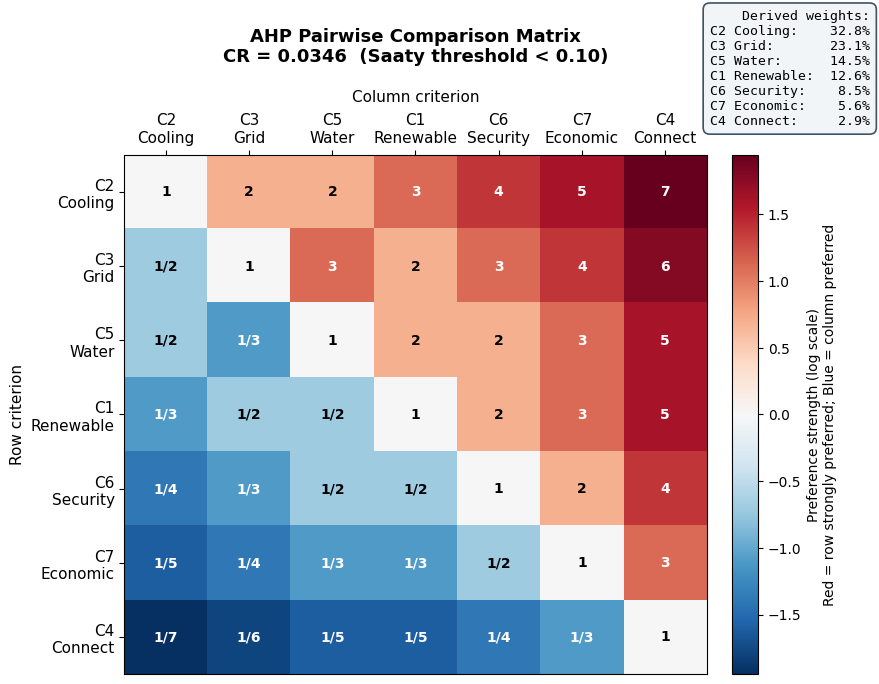

✓ Saved: outputs/phase4/ahp_heatmap.png


In [ ]:
# ============================================================
# AHP PAIRWISE COMPARISON MATRIX — HEATMAP VISUALISATION
# Save output to: outputs/phase4/ahp_heatmap.png
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import os

os.makedirs('outputs/phase4', exist_ok=True)

# ── Criterion labels ─────────────────────────────────────────
labels = ['C2\nCooling', 'C3\nGrid', 'C5\nWater',
          'C1\nRenewable', 'C6\nSecurity', 'C7\nEconomic', 'C4\nConnect']

# ── Pairwise matrix (row i vs column j) ──────────────────────
# Values from ahp_weights.json reordered by priority rank
matrix = np.array([
    [1,    2,    2,    3,    4,    5,    7   ],  # C2
    [1/2,  1,    3,    2,    3,    4,    6   ],  # C3
    [1/2,  1/3,  1,    2,    2,    3,    5   ],  # C5
    [1/3,  1/2,  1/2,  1,    2,    3,    5   ],  # C1
    [1/4,  1/3,  1/2,  1/2,  1,    2,    4   ],  # C6
    [1/5,  1/4,  1/3,  1/3,  1/2,  1,    3   ],  # C7
    [1/7,  1/6,  1/5,  1/5,  1/4,  1/3,  1  ],  # C4
])

# ── Log-transform for symmetric colour mapping ────────────────
log_matrix = np.log(matrix)   # diagonal = 0, positive = preferred, negative = not preferred

# ── Custom diverging colormap: blue → white → red ────────────
cmap = plt.cm.RdBu_r
norm = mcolors.TwoSlopeNorm(vmin=log_matrix.min(), vcenter=0, vmax=log_matrix.max())

fig, ax = plt.subplots(figsize=(9, 7))
im = ax.imshow(log_matrix, cmap=cmap, norm=norm, aspect='auto')

# ── Colorbar ─────────────────────────────────────────────────
cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label('Preference strength (log scale)\nRed = row strongly preferred; Blue = column preferred',
               fontsize=10)

# ── Tick labels ───────────────────────────────────────────────
ax.set_xticks(range(7)); ax.set_xticklabels(labels, fontsize=11)
ax.set_yticks(range(7)); ax.set_yticklabels(labels, fontsize=11)
ax.xaxis.tick_top(); ax.xaxis.set_label_position('top')

# ── Annotate cells with original ratio values ─────────────────
fractions = [
    ['1',   '2',   '2',   '3',   '4',   '5',   '7'  ],
    ['1/2', '1',   '3',   '2',   '3',   '4',   '6'  ],
    ['1/2', '1/3', '1',   '2',   '2',   '3',   '5'  ],
    ['1/3', '1/2', '1/2', '1',   '2',   '3',   '5'  ],
    ['1/4', '1/3', '1/2', '1/2', '1',   '2',   '4'  ],
    ['1/5', '1/4', '1/3', '1/3', '1/2', '1',   '3'  ],
    ['1/7', '1/6', '1/5', '1/5', '1/4', '1/3', '1'  ],
]

for i in range(7):
    for j in range(7):
        val    = log_matrix[i, j]
        colour = 'white' if abs(val) > 0.8 else 'black'
        ax.text(j, i, fractions[i][j], ha='center', va='center',
                fontsize=10, fontweight='bold', color=colour)

# ── Labels and title ──────────────────────────────────────────
ax.set_title('AHP Pairwise Comparison Matrix\nCR = 0.0346  (Saaty threshold < 0.10)',
             fontsize=13, fontweight='bold', pad=20)
ax.set_xlabel('Column criterion', fontsize=11, labelpad=8)
ax.set_ylabel('Row criterion', fontsize=11)

# ── Weights annotation box ────────────────────────────────────
weight_text = (
    'Derived weights:\n'
    'C2 Cooling:    32.8%\n'
    'C3 Grid:       23.1%\n'
    'C5 Water:      14.5%\n'
    'C1 Renewable:  12.6%\n'
    'C6 Security:    8.5%\n'
    'C7 Economic:    5.6%\n'
    'C4 Connect:     2.9%'
)
ax.text(1.28, 1.28, weight_text, transform=ax.transAxes,
        fontsize=9.5, verticalalignment='top', horizontalalignment='right',
        bbox=dict(boxstyle='round,pad=0.5', facecolor='#F0F4F8',
                  edgecolor='#2E4057', linewidth=1.2, alpha=0.9),
        family='monospace')

plt.tight_layout()
plt.savefig('outputs/phase4/ahp_heatmap.png', dpi=300, bbox_inches='tight',
            facecolor='white')
plt.show()
print("✓ Saved: outputs/phase4/ahp_heatmap.png")

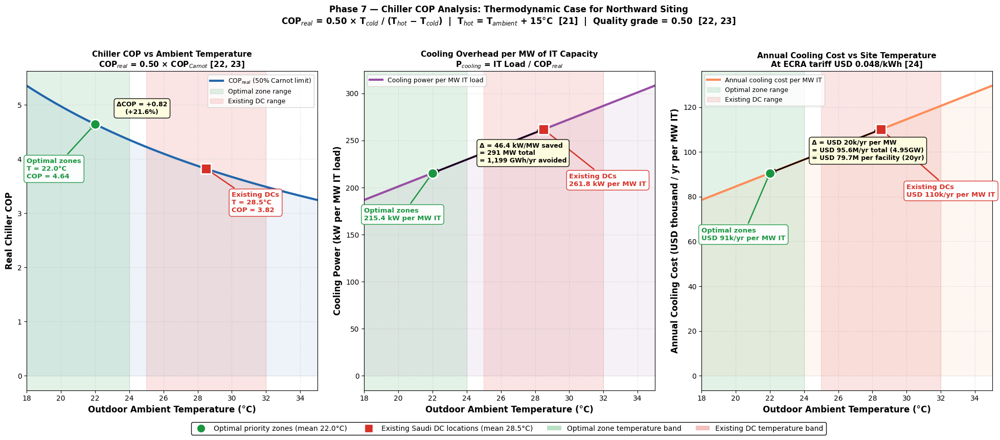

✓ Figure 6 saved: outputs/phase7/06_cop_efficiency_analysis.png


In [ ]:
# ============================================================================
# FIGURE 6: COP EFFICIENCY CURVE — CORE FINDING VISUALISATION
# Shows real chiller COP and associated cooling energy overhead
# across the full Saudi ambient temperature range
# ============================================================================

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D

# ── Parameters ────────────────────────────────────────────────────────────────
T_COLD_K       = 280.0   # 7°C chilled water setpoint (ASHRAE)
APPROACH_DELTA = 15.0    # °C approach differential, air-cooled condenser
QUALITY_GRADE  = 0.50    # real COP = 50% of Carnot
TARIFF_USD_KWH = 0.048   # Saudi industrial electricity tariff (ECRA 2023)

# ── Temperature range across Saudi Arabia ─────────────────────────────────────
T_range     = np.linspace(18, 35, 300)
T_hot_K     = (T_range + APPROACH_DELTA) + 273.15
COP_carnot  = T_COLD_K / (T_hot_K - T_COLD_K)
COP_real    = QUALITY_GRADE * COP_carnot

# Cooling power per MW of IT load (kW per MW IT)
# Power_cooling = IT_load / COP_real
cooling_kW_per_MW = 1000 / COP_real   # kW per MW IT

# Annual cost per MW IT load (USD/yr per MW)
annual_cost_per_MW = cooling_kW_per_MW * 8760 * TARIFF_USD_KWH / 1e6  # USD million/yr

# ── Key operating points ──────────────────────────────────────────────────────
T_opt  = 22.0   # optimal zones mean
T_ex   = 28.5   # existing Saudi DCs mean

def get_vals(T):
    T_hot = (T + APPROACH_DELTA) + 273.15
    cop_c = T_COLD_K / (T_hot - T_COLD_K)
    cop_r = QUALITY_GRADE * cop_c
    kw    = 1000 / cop_r
    cost  = kw * 8760 * TARIFF_USD_KWH / 1e6
    return cop_r, kw, cost

cop_opt, kw_opt, cost_opt = get_vals(T_opt)
cop_ex,  kw_ex,  cost_ex  = get_vals(T_ex)

delta_cop  = cop_opt - cop_ex
delta_kw   = kw_ex  - kw_opt
delta_cost = cost_ex - cost_opt

# ── Figure layout: 3 panels ───────────────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(20, 8))
fig.patch.set_facecolor('white')

BLUE    = '#2166ac'
RED     = '#d73027'
GREEN   = '#1a9641'
ORANGE  = '#fc8d59'
PURPLE  = '#984ea3'

# ─────────────────────────────────────────────────────────────────────────────
# PANEL 1 — COP_real vs Temperature
# ─────────────────────────────────────────────────────────────────────────────
ax1 = axes[0]
ax1.plot(T_range, COP_real, color=BLUE, linewidth=3, label='COP$_{real}$ (50% Carnot limit)')
ax1.fill_between(T_range, COP_real, alpha=0.08, color=BLUE)

# Shade optimal zone (18–24°C)
ax1.axvspan(18, 24, alpha=0.12, color=GREEN, label='Optimal zone range')
# Shade existing DC zone (25–32°C)
ax1.axvspan(25, 32, alpha=0.12, color=RED, label='Existing DC range')

# Mark the two key points
ax1.plot(T_opt, cop_opt, 'o', color=GREEN, markersize=14,
         markeredgecolor='white', markeredgewidth=2, zorder=6)
ax1.plot(T_ex,  cop_ex,  's', color=RED,   markersize=14,
         markeredgecolor='white', markeredgewidth=2, zorder=6)

# PANEL 1 — Annotations
ax1.annotate(
    f'Optimal zones\nT = {T_opt}°C\nCOP = {cop_opt:.2f}',
    xy=(T_opt, cop_opt), xytext=(T_opt - 4, cop_opt - 1.0), # Higher
    fontsize=9.5, fontweight='bold', color=GREEN,
    arrowprops=dict(arrowstyle='->', color=GREEN, lw=1.8),
    bbox=dict(boxstyle='round,pad=0.4', facecolor='white', edgecolor=GREEN, alpha=0.95)
)
ax1.annotate(
    f'Existing DCs\nT = {T_ex}°C\nCOP = {cop_ex:.2f}',
    xy=(T_ex, cop_ex), xytext=(T_ex + 1.5, cop_ex - 0.8), # Lower and Right
    fontsize=9.5, fontweight='bold', color=RED,
    arrowprops=dict(arrowstyle='->', color=RED, lw=1.8),
    bbox=dict(boxstyle='round,pad=0.4', facecolor='white', edgecolor=RED, alpha=0.95)
)
# ΔCOP arrow/text - Moving text higher
ax1.text((T_opt + T_ex)/2 - 0.5, (cop_opt + cop_ex)/2 + 0.6,
         f'ΔCOP = +{delta_cop:.2f}\n(+{delta_cop/cop_ex*100:.1f}%)',
         fontsize=9, fontweight='bold', color='black', ha='center',
         bbox=dict(boxstyle='round,pad=0.4', facecolor='lightyellow', edgecolor='black', alpha=0.95))

ax1.set_xlabel('Outdoor Ambient Temperature (°C)', fontsize=12, fontweight='bold')
ax1.set_ylabel('Real Chiller COP', fontsize=12, fontweight='bold')
ax1.set_title('Chiller COP vs Ambient Temperature\n'
              'COP$_{real}$ = 0.50 × COP$_{Carnot}$ [22, 23]',
              fontsize=11, fontweight='bold')
ax1.set_xlim(18, 35)
ax1.grid(True, alpha=0.3, linestyle='--')
ax1.legend(fontsize=9, loc='upper right')

# ─────────────────────────────────────────────────────────────────────────────
# PANEL 2 — Cooling Power per MW IT load (kW/MW)
# ─────────────────────────────────────────────────────────────────────────────
ax2 = axes[1]
ax2.plot(T_range, cooling_kW_per_MW, color=PURPLE, linewidth=3,
         label='Cooling power per MW IT load')
ax2.fill_between(T_range, cooling_kW_per_MW, alpha=0.08, color=PURPLE)

ax2.axvspan(18, 24, alpha=0.12, color=GREEN)
ax2.axvspan(25, 32, alpha=0.12, color=RED)

ax2.plot(T_opt, kw_opt, 'o', color=GREEN, markersize=14,
         markeredgecolor='white', markeredgewidth=2, zorder=6)
ax2.plot(T_ex,  kw_ex,  's', color=RED,   markersize=14,
         markeredgecolor='white', markeredgewidth=2, zorder=6)

# PANEL 2 — Annotations
ax2.annotate(
    f'Optimal zones\n{kw_opt:.1f} kW per MW IT',
    xy=(T_opt, kw_opt), xytext=(T_opt - 4, kw_opt - 50), # Higher
    fontsize=9.5, fontweight='bold', color=GREEN,
    arrowprops=dict(arrowstyle='->', color=GREEN, lw=1.8),
    bbox=dict(boxstyle='round,pad=0.4', facecolor='white', edgecolor=GREEN, alpha=0.95)
)
ax2.annotate(
    f'Existing DCs\n{kw_ex:.1f} kW per MW IT',
    xy=(T_ex, kw_ex), xytext=(T_ex + 1.5, kw_ex - 60), # Lower
    fontsize=9.5, fontweight='bold', color=RED,
    arrowprops=dict(arrowstyle='->', color=RED, lw=1.8),
    bbox=dict(boxstyle='round,pad=0.4', facecolor='white', edgecolor=RED, alpha=0.95)
)

# Δ saving annotation
ax2.annotate('', xy=(T_opt, kw_opt), xytext=(T_ex, kw_ex),
             arrowprops=dict(arrowstyle='<->', color='black', lw=2))
ax2.text((T_opt + T_ex)/2 - 0.5, (kw_opt + kw_ex)/2 - 12,
         f'Δ = {delta_kw:.1f} kW/MW saved\n= {delta_kw*6260/1000:.0f} MW total\n'
         f'= 1,199 GWh/yr avoided',
         fontsize=9, fontweight='bold', color='black',
         bbox=dict(boxstyle='round,pad=0.4', facecolor='lightyellow',
                   edgecolor='black', alpha=0.95))

ax2.set_xlabel('Outdoor Ambient Temperature (°C)', fontsize=12, fontweight='bold')
ax2.set_ylabel('Cooling Power (kW per MW IT load)', fontsize=12, fontweight='bold')
ax2.set_title('Cooling Overhead per MW of IT Capacity\n'
              'P$_{cooling}$ = IT Load / COP$_{real}$',
              fontsize=11, fontweight='bold')
ax2.set_xlim(18, 35)
ax2.grid(True, alpha=0.3, linestyle='--')
ax2.legend(fontsize=9, loc='upper left')

# ─────────────────────────────────────────────────────────────────────────────
# PANEL 3 — Annual cooling cost per MW IT (USD million/yr)
# ─────────────────────────────────────────────────────────────────────────────
ax3 = axes[2]
ax3.plot(T_range, annual_cost_per_MW * 1000, color=ORANGE, linewidth=3,
         label='Annual cooling cost per MW IT')
ax3.fill_between(T_range, annual_cost_per_MW * 1000, alpha=0.08, color=ORANGE)

ax3.axvspan(18, 24, alpha=0.12, color=GREEN, label='Optimal zone range')
ax3.axvspan(25, 32, alpha=0.12, color=RED,   label='Existing DC range')

ax3.plot(T_opt, cost_opt * 1000, 'o', color=GREEN, markersize=14,
         markeredgecolor='white', markeredgewidth=2, zorder=6)
ax3.plot(T_ex,  cost_ex  * 1000, 's', color=RED,   markersize=14,
         markeredgecolor='white', markeredgewidth=2, zorder=6)

# PANEL 3 — Annotations
ax3.annotate(
    f'Optimal zones\nUSD {cost_opt*1000:.0f}k/yr per MW IT',
    xy=(T_opt, cost_opt*1000), xytext=(T_opt - 4, cost_opt*1000 - 30), # Higher
    fontsize=9.5, fontweight='bold', color=GREEN,
    arrowprops=dict(arrowstyle='->', color=GREEN, lw=1.8),
    bbox=dict(boxstyle='round,pad=0.4', facecolor='white', edgecolor=GREEN, alpha=0.95)
)
ax3.annotate(
    f'Existing DCs\nUSD {cost_ex*1000:.0f}k/yr per MW IT',
    xy=(T_ex, cost_ex*1000), xytext=(T_ex + 1.5, cost_ex*1000 - 30), # Lower
    fontsize=9.5, fontweight='bold', color=RED,
    arrowprops=dict(arrowstyle='->', color=RED, lw=1.8),
    bbox=dict(boxstyle='round,pad=0.4', facecolor='white', edgecolor=RED, alpha=0.95)
)

ax3.annotate('', xy=(T_opt, cost_opt*1000), xytext=(T_ex, cost_ex*1000),
             arrowprops=dict(arrowstyle='<->', color='black', lw=2))
ax3.text((T_opt + T_ex)/2 - 0.8, (cost_opt + cost_ex)*1000/2 - 4,
         f'Δ = USD {delta_cost*1000:.0f}k/yr per MW\n'
         f'= USD 95.6M/yr total (4.95GW)\n'
         f'= USD 79.7M per facility (20yr)',
         fontsize=9, fontweight='bold', color='black',
         bbox=dict(boxstyle='round,pad=0.4', facecolor='lightyellow',
                   edgecolor='black', alpha=0.95))

ax3.set_xlabel('Outdoor Ambient Temperature (°C)', fontsize=12, fontweight='bold')
ax3.set_ylabel('Annual Cooling Cost (USD thousand / yr per MW IT)',
               fontsize=12, fontweight='bold')
ax3.set_title('Annual Cooling Cost vs Site Temperature\n'
              f'At ECRA tariff USD 0.048/kWh [24]',
              fontsize=11, fontweight='bold')
ax3.set_xlim(18, 35)
ax3.grid(True, alpha=0.3, linestyle='--')
ax3.legend(fontsize=9, loc='upper left')

# ─────────────────────────────────────────────────────────────────────────────
# Shared legend and title
# ─────────────────────────────────────────────────────────────────────────────
shared_handles = [
    Line2D([0],[0], marker='o', color='w', markerfacecolor=GREEN,
           markersize=12, markeredgecolor='white',
           label=f'Optimal priority zones (mean {T_opt}°C)'),
    Line2D([0],[0], marker='s', color='w', markerfacecolor=RED,
           markersize=12, markeredgecolor='white',
           label=f'Existing Saudi DC locations (mean {T_ex}°C)'),
    mpatches.Patch(facecolor=GREEN, alpha=0.3, label='Optimal zone temperature band'),
    mpatches.Patch(facecolor=RED,   alpha=0.3, label='Existing DC temperature band'),
]
fig.legend(handles=shared_handles, loc='lower center', ncol=4,
           fontsize=10, framealpha=0.97, edgecolor='black',
           bbox_to_anchor=(0.5, -0.04))

fig.suptitle(
    'Phase 7 — Chiller COP Analysis: Thermodynamic Case for Northward Siting\n'
    'COP$_{real}$ = 0.50 × T$_{cold}$ / (T$_{hot}$ − T$_{cold}$)  '
    '|  T$_{hot}$ = T$_{ambient}$ + 15°C  [21]  '
    '|  Quality grade = 0.50  [22, 23]',
    fontsize=12, fontweight='bold', y=1.02
)

plt.tight_layout()
plt.savefig('outputs/phase7/06_cop_efficiency_analysis.png',
            dpi=300, bbox_inches='tight', facecolor='white')
plt.show()
print("✓ Figure 6 saved: outputs/phase7/06_cop_efficiency_analysis.png")

Total capacity: 4,950 MW = 4.95 GW


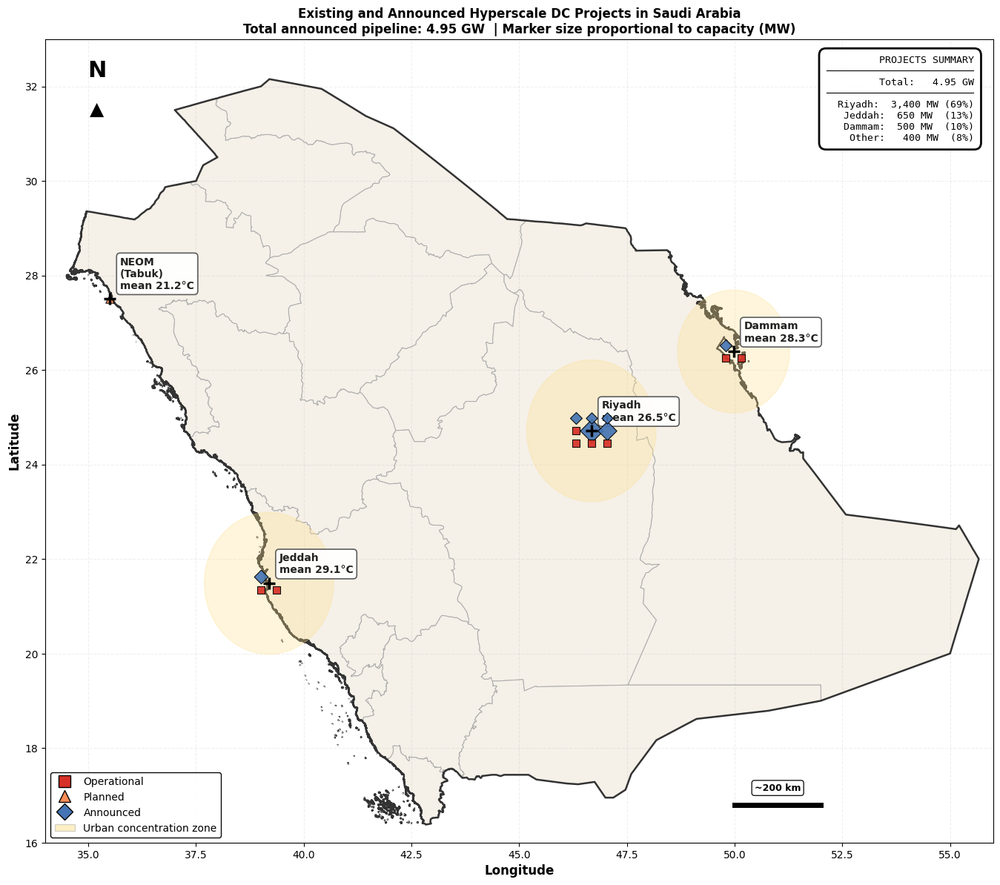

✓ Saved: outputs/phase7/00_existing_dc_concentration.png
  Total capacity: 4,950 MW = 4.95 GW


In [ ]:
# ============================================================================
# FIGURE: Existing DC Concentration in Saudi Arabia (Map only)
# Projects jittered within clusters to show quantity without overlap
# Total capacity = 4.95 GW
# ============================================================================

import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
import numpy as np
from shapely.geometry import Point

# ── DC project data — total = 4,950 MW ───────────────────────────────────────
dc_projects = {
    'name': [
        # Riyadh cluster — 3,400 MW
        'STC Tier III',
        'Mobily DC',
        'stc Hub DC',
        'Huawei Cloud',
        'Sudair DC Zone',
        'Humain / PIF',
        'AWS Riyadh',
        'Google Cloud',
        'Microsoft Azure',
        # Jeddah cluster — 650 MW
        'STC Jeddah',
        'Nawah DC',
        'Saudi Telecom JED',
        # Dammam cluster — 500 MW
        'Dammam DC Hub',
        'Aramco DC',
        'Saudi Aramco DIG',
        # Other — 400 MW
        'NEOM Data Hub',
    ],
    'city': [
        'Riyadh','Riyadh','Riyadh','Riyadh','Riyadh',
        'Riyadh','Riyadh','Riyadh','Riyadh',
        'Jeddah','Jeddah','Jeddah',
        'Dammam','Dammam','Dammam',
        'NEOM',
    ],
    'capacity_mw': [
        30, 20, 50, 100, 1500,
        1000, 400, 200, 100,
        25, 80, 545,
        40, 50, 410,
        400,
    ],
    'status': [
        'Operational','Operational','Operational','Operational','Announced',
        'Announced','Announced','Announced','Announced',
        'Operational','Operational','Announced',
        'Operational','Operational','Announced',
        'Planned',
    ],
    # Base coordinates — cluster centre
    'lat_base': [
        24.713,24.713,24.713,24.713,24.713,
        24.713,24.713,24.713,24.713,
        21.486,21.486,21.486,
        26.392,26.392,26.392,
        27.500,
    ],
    'lon_base': [
        46.675,46.675,46.675,46.675,46.675,
        46.675,46.675,46.675,46.675,
        39.192,39.192,39.192,
        49.977,49.977,49.977,
        35.500,
    ],
}

# ── Jitter points within each cluster ────────────────────────────────────────
np.random.seed(42)
jitter_scale = 0.45   # degrees — enough to separate visually

lats, lons = [], []
city_counts = {}
for i, city in enumerate(dc_projects['city']):
    city_counts[city] = city_counts.get(city, 0)
    idx = city_counts[city]
    city_counts[city] += 1

    # Arrange in a small grid pattern rather than pure random
    # to avoid any overlap
    n = sum(1 for c in dc_projects['city'] if c == city)
    cols = int(np.ceil(np.sqrt(n)))
    row  = idx // cols
    col  = idx % cols
    offset_lon = (col - (cols-1)/2) * jitter_scale * 0.8
    offset_lat = (row - (np.ceil(n/cols)-1)/2) * jitter_scale * 0.6

    lons.append(dc_projects['lon_base'][i] + offset_lon)
    lats.append(dc_projects['lat_base'][i] + offset_lat)

dc_projects['latitude']  = lats
dc_projects['longitude'] = lons

dc_gdf = gpd.GeoDataFrame(
    dc_projects,
    geometry=gpd.points_from_xy(lons, lats),
    crs='EPSG:4326'
)

total_mw = sum(dc_projects['capacity_mw'])
print(f"Total capacity: {total_mw:,} MW = {total_mw/1000:.2f} GW")

# ── Load boundaries ───────────────────────────────────────────────────────────
saudi_boundary  = gpd.read_file('data/boundaries/saudi_country.geojson')
saudi_provinces = gpd.read_file('data/boundaries/saudi_provinces.geojson')

# ── Status styles ─────────────────────────────────────────────────────────────
status_styles = {
    'Operational': {'color': '#d73027', 'marker': 's', 'zorder': 8},
    'Planned':     {'color': '#fc8d59', 'marker': '^', 'zorder': 7},
    'Announced':   {'color': '#4575b4', 'marker': 'D', 'zorder': 7},
}

# ── City labels ───────────────────────────────────────────────────────────────
city_labels = {
    'Riyadh':  (46.675, 24.713, 'mean 26.5°C'),
    'Jeddah':  (39.192, 21.486, 'mean 29.1°C'),
    'Dammam':  (49.977, 26.392, 'mean 28.3°C'),
    'NEOM\n(Tabuk)': (35.500, 27.500, 'mean 21.2°C'),
}

# ── Figure ────────────────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(14, 12))
fig.patch.set_facecolor('white')

saudi_provinces.plot(ax=ax, color='#f5f0e8',
                     edgecolor='#aaaaaa', linewidth=0.7)
saudi_boundary.boundary.plot(ax=ax, color='#333333', linewidth=1.8)

# City halos
halo_params = {
    'Riyadh': (46.675, 24.713, 1.5),
    'Jeddah': (39.192, 21.486, 1.5),
    'Dammam': (49.977, 26.392, 1.3),
}
for city, (lon, lat, r) in halo_params.items():
    circle = plt.Circle((lon, lat), r, color='#fee08b',
                         alpha=0.30, zorder=2,
                         transform=ax.transData)
    ax.add_patch(circle)

# Plot DC projects
for status, style in status_styles.items():
    subset = dc_gdf[dc_gdf['status'] == status]
    for _, dc in subset.iterrows():
        size = max(60, dc['capacity_mw'] / 6)
        ax.scatter(dc.geometry.x, dc.geometry.y,
                   s=size,
                   color=style['color'],
                   marker=style['marker'],
                   edgecolors='black', linewidths=0.8,
                   zorder=style['zorder'], alpha=0.92)

# City labels with temperature
for city, (lon, lat, temp) in city_labels.items():
    short = city.split('\n')[0]
    ax.plot(lon, lat, 'k+', markersize=12,
            markeredgewidth=2.5, zorder=10)
    ax.annotate(
        f"{city}\n{temp}",
        xy=(lon, lat),
        xytext=(10, 10), textcoords='offset points',
        fontsize=10, fontweight='bold', color='#222222',
        bbox=dict(boxstyle='round,pad=0.35', facecolor='white',
                  edgecolor='#555555', alpha=0.95, linewidth=1.2)
    )

# North arrow
ax.annotate('N', xy=(35.2, 32.2), fontsize=22,
            fontweight='bold', ha='center')
ax.annotate('▲', xy=(35.2, 31.7), fontsize=18,
            ha='center', va='top')

# Scale bar
ax.plot([50, 52], [16.8, 16.8], 'k-', linewidth=5)
ax.text(51, 17.1, '~200 km', ha='center', fontsize=9,
        fontweight='bold',
        bbox=dict(boxstyle='round', facecolor='white',
                  edgecolor='black', linewidth=1, alpha=0.9))

ax.set_xlim(34, 56)
ax.set_ylim(16, 33)
ax.set_xlabel('Longitude', fontsize=12, fontweight='bold')
ax.set_ylabel('Latitude',  fontsize=12, fontweight='bold')
ax.set_title(
    'Existing and Announced Hyperscale DC Projects in Saudi Arabia\n'
    f'Total announced pipeline: {total_mw/1000:.2f} GW  '
    f'| Marker size proportional to capacity (MW)',
    fontsize=12, fontweight='bold'
)
ax.grid(True, alpha=0.2, linestyle='--')

# Legend
legend_handles = [
    mlines.Line2D([],[],marker='s', color='w', markerfacecolor='#d73027',
                  markersize=11, markeredgecolor='black',
                  label='Operational'),
    mlines.Line2D([],[],marker='^', color='w', markerfacecolor='#fc8d59',
                  markersize=11, markeredgecolor='black',
                  label='Planned'),
    mlines.Line2D([],[],marker='D', color='w', markerfacecolor='#4575b4',
                  markersize=11, markeredgecolor='black',
                  label='Announced'),
    mpatches.Patch(facecolor='#fee08b', alpha=0.5,
                   edgecolor='#aaaaaa',
                   label='Urban concentration zone'),
]
ax.legend(handles=legend_handles, loc='lower left',
          fontsize=10, framealpha=0.97, edgecolor='black')

# Stats box
riyadh_mw = sum(c for c, city in zip(
    dc_projects['capacity_mw'], dc_projects['city']) if city == 'Riyadh')
jeddah_mw = sum(c for c, city in zip(
    dc_projects['capacity_mw'], dc_projects['city']) if city == 'Jeddah')
dammam_mw = sum(c for c, city in zip(
    dc_projects['capacity_mw'], dc_projects['city']) if city == 'Dammam')
other_mw  = total_mw - riyadh_mw - jeddah_mw - dammam_mw

stats_box = (
    f"PROJECTS SUMMARY\n"
    f"─────────────────────────\n"
    f"Total:   {total_mw/1000:.2f} GW\n"
    f"─────────────────────────\n"
    f"Riyadh:  {riyadh_mw:,} MW ({riyadh_mw/total_mw*100:.0f}%)\n"
    f"Jeddah:  {jeddah_mw:,} MW  ({jeddah_mw/total_mw*100:.0f}%)\n"
    f"Dammam:  {dammam_mw:,} MW  ({dammam_mw/total_mw*100:.0f}%)\n"
    f"Other:   {other_mw:,} MW  ({other_mw/total_mw*100:.0f}%)"
)
ax.text(0.98, 0.98, stats_box,
        transform=ax.transAxes, fontsize=9.5,
        verticalalignment='top', horizontalalignment='right',
        family='monospace',
        bbox=dict(boxstyle='round,pad=0.7', facecolor='white',
                  alpha=0.97, edgecolor='black', linewidth=2))

plt.tight_layout()
plt.savefig('outputs/phase7/00_existing_dc_concentration.png',
            dpi=300, bbox_inches='tight', facecolor='white')
plt.show()
print(f"✓ Saved: outputs/phase7/00_existing_dc_concentration.png")
print(f"  Total capacity: {total_mw:,} MW = {total_mw/1000:.2f} GW")